In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import gridspec
from matplotlib import patches
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D

import os
import math
import random

import keras
from keras.models import Sequential
from keras.layers import Input, Dense, Conv1D, Conv2D, Flatten, MaxPooling1D, MaxPooling2D
from keras.layers import Dropout
from keras.callbacks import EarlyStopping
from keras.regularizers import l2

from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from sklearn import preprocessing
from sklearn.metrics import roc_curve, roc_auc_score, auc

import scipy.stats as st
from scipy.stats import poisson
from scipy.interpolate import interp1d
from scipy.stats import norm

In [2]:
from sklearn.neighbors import KernelDensity # paquete necesario
from sklearn.model_selection import GridSearchCV

import scipy.integrate as integrate

In [3]:
import xgboost
from xgboost import XGBRegressor, XGBClassifier

In [4]:
#####################################
# IMPORT AUXILIARY/CUSTOM FUNCTIONS #
#####################################

from AUX_MLL_BL import max_num_bins, Z_BL_asimov, BL_test_fast, BL_test_fsolve, MLL_test_fast, MLL_test_fsolve, KDE_fitter, MLL_test_fast, MLL_test_fsolve


# AUX FUNCTION TO FIND SOLUTIONS

def dx(fn, x, delta=0.001):
    return (fn(x+delta) - fn(x))/delta

def solvecross(fn, value, x=-45, maxtries=1000, maxerr=0.1):
    for tries in range(maxtries):
        err = fn(x) - value
        if abs(err) < maxerr:
            return x
        slope = dx(fn, x)
        x -= err/slope
        if x < -47 or x > -44:
            x = random.uniform(-47, -44) 
    raise ValueError('no solution found')

### DATA

In [5]:
mDM_mDM = [10, 20, 35, 50, 100, 200, 500]

S_cross1045_mDM = [4.714, 85.417, 178.749, 191.536, 139.035, 78.757, 33.257]

print(S_cross1045_mDM)

filefolder = '../../data2024/processed/cs1cs2/'

[4.714, 85.417, 178.749, 191.536, 139.035, 78.757, 33.257]


In [6]:
##############
# PARAMETERS #
##############

tot_B = 634.55+2.26+0.01+0.6+5.34

f_ER = 634.55 / tot_B
f_AC = 2.26 / tot_B
f_CNNS = 0.01 / tot_B
f_RN = 0.6 / tot_B
f_WALL = 5.34 / tot_B

f_ER + f_AC + f_CNNS + f_RN + f_WALL



cross_factor = np.logspace(-47,-43,15) / 1e-45

S_expected_mDM = []
for i in range(len(S_cross1045_mDM)):
    S_expected_mDM.append( [max(1, round(S_cross1045_mDM[i] * fac)) for fac in cross_factor] )


# DISCOVERY: 'discovery', EXCLUSION: 'exclusion'
D_or_E = 'exclusion'

# requested number of pseudo experiments
num_pseudo = 2000

# number of expected background events per ensemble
B_expected = round(tot_B)

print('B_expected: ', B_expected)
print('S_cross1045_mDM: ', S_cross1045_mDM)
print('S_expected_mDM (from cross=1e-47 to 1e-44): ', S_expected_mDM)

B_expected:  643
S_cross1045_mDM:  [4.714, 85.417, 178.749, 191.536, 139.035, 78.757, 33.257]
S_expected_mDM (from cross=1e-47 to 1e-44):  [[1, 1, 1, 1, 1, 1, 2, 5, 9, 18, 34, 66, 126, 244, 471], [1, 2, 3, 6, 12, 23, 44, 85, 165, 318, 615, 1187, 2291, 4424, 8542], [2, 3, 7, 13, 25, 48, 93, 179, 345, 666, 1286, 2484, 4795, 9258, 17875], [2, 4, 7, 14, 27, 51, 99, 192, 370, 714, 1378, 2661, 5138, 9921, 19154], [1, 3, 5, 10, 19, 37, 72, 139, 268, 518, 1001, 1932, 3730, 7201, 13904], [1, 2, 3, 6, 11, 21, 41, 79, 152, 294, 567, 1094, 2113, 4079, 7876], [1, 1, 1, 2, 5, 9, 17, 33, 64, 124, 239, 462, 892, 1723, 3326]]


In [7]:
###############
# BACKGROUNDS # 
###############

B_cs1_ER = np.loadtxt(filefolder + 'ER_cs1.txt')
B_cs2_ER = np.loadtxt(filefolder + 'ER_cs2.txt')

print('B_cs1_ER.shape: ', B_cs1_ER.shape)
print('B_cs2_ER.shape: ', B_cs2_ER.shape)


B_cs1_AC = np.loadtxt(filefolder + 'AC_cs1.txt')
B_cs2_AC = np.loadtxt(filefolder + 'AC_cs2.txt')

print('\nB_cs1_AC.shape: ', B_cs1_AC.shape)
print('B_cs2_AC.shape: ', B_cs2_AC.shape)


B_cs1_CNNS = np.loadtxt(filefolder + 'CNNS_cs1.txt')
B_cs2_CNNS = np.loadtxt(filefolder + 'CNNS_cs2.txt')

print('\nB_cs1_CNNS.shape: ', B_cs1_CNNS.shape)
print('B_cs2_CNNS.shape: ', B_cs2_CNNS.shape)


B_cs1_RN = np.loadtxt(filefolder + 'RN_cs1.txt')
B_cs2_RN = np.loadtxt(filefolder + 'RN_cs2.txt')

print('\nB_cs1_RN.shape: ', B_cs1_RN.shape)
print('B_cs2_RN.shape: ', B_cs2_RN.shape)


B_cs1_WALL = np.loadtxt(filefolder + 'WALL_cs1.txt')
B_cs2_WALL = np.loadtxt(filefolder + 'WALL_cs2.txt')

print('\nB_cs1_WALL.shape: ', B_cs1_WALL.shape)
print('B_cs2_WALL.shape: ', B_cs2_WALL.shape)

B_cs1_ER.shape:  (67300,)
B_cs2_ER.shape:  (67300,)

B_cs1_AC.shape:  (5000,)
B_cs2_AC.shape:  (5000,)

B_cs1_CNNS.shape:  (43,)
B_cs2_CNNS.shape:  (43,)

B_cs1_RN.shape:  (4516,)
B_cs2_RN.shape:  (4516,)

B_cs1_WALL.shape:  (5000,)
B_cs2_WALL.shape:  (5000,)


In [8]:
# cs1 = [3, 70] PE
# cS2 = [50, 8000] PE

B_cs1_ER_aux = [B_cs1_ER[x] for x in range(len(B_cs1_ER)) if (3 < B_cs1_ER[x] < 70 and 50 < B_cs2_ER[x] < 8000)]
B_cs2_ER = [B_cs2_ER[x] for x in range(len(B_cs1_ER)) if (3 < B_cs1_ER[x] < 70 and 50 < B_cs2_ER[x] < 8000)]
B_cs1_ER = B_cs1_ER_aux

B_cs1_AC_aux = [B_cs1_AC[x] for x in range(len(B_cs1_AC)) if (3 < B_cs1_AC[x] < 70 and 50 < B_cs2_AC[x] < 8000)]
B_cs2_AC = [B_cs2_AC[x] for x in range(len(B_cs1_AC)) if (3 < B_cs1_AC[x] < 70 and 50 < B_cs2_AC[x] < 8000)]
B_cs1_AC = B_cs1_AC_aux

B_cs1_CNNS_aux = [B_cs1_CNNS[x] for x in range(len(B_cs1_CNNS)) if (3 < B_cs1_CNNS[x] < 70 and 50 < B_cs2_CNNS[x] < 8000)]
B_cs2_CNNS = [B_cs2_CNNS[x] for x in range(len(B_cs1_CNNS)) if (3 < B_cs1_CNNS[x] < 70 and 50 < B_cs2_CNNS[x] < 8000)]
B_cs1_CNNS = B_cs1_CNNS_aux

B_cs1_RN_aux = [B_cs1_RN[x] for x in range(len(B_cs1_RN)) if (3 < B_cs1_RN[x] < 70 and 50 < B_cs2_RN[x] < 8000)]
B_cs2_RN = [B_cs2_RN[x] for x in range(len(B_cs1_RN)) if (3 < B_cs1_RN[x] < 70 and 50 < B_cs2_RN[x] < 8000)]
B_cs1_RN = B_cs1_RN_aux

B_cs1_WALL_aux = [B_cs1_WALL[x] for x in range(len(B_cs1_WALL)) if (3 < B_cs1_WALL[x] < 70 and 50 < B_cs2_WALL[x] < 8000)]
B_cs2_WALL = [B_cs2_WALL[x] for x in range(len(B_cs1_WALL)) if (3 < B_cs1_WALL[x] < 70 and 50 < B_cs2_WALL[x] < 8000)]
B_cs1_WALL = B_cs1_WALL_aux

## Loop over the masses

## 1. cS1 and cS2

#### Train with m_it = 0 (this is the only one with some issues, re run it)


#########################

mDM =  10 GeV


S_cs1.shape:  (34190,)
S_cs2.shape:  (34190,)
 NUM_DAT:  31606 

NUM_DAT_ER:  31203
NUM_DAT_AC:  111
NUM_DAT_CNNS:  1
NUM_DAT_RN:  29
NUM_DAT_WALL:  262

B_cs1cs2.shape:  (31606, 2)

S_cs1cs2.shape:  (31606, 2)


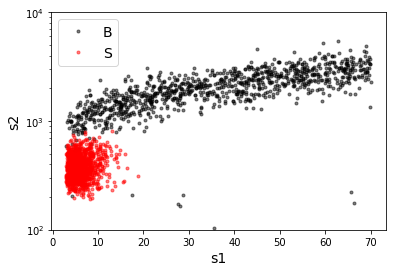

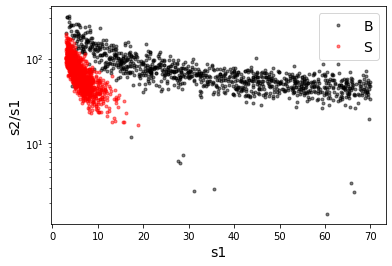

X_mon_B.shape:  (31606, 2)
X_mon_S.shape:  (31606, 2)
X_mon.shape:  (63212, 2)

X_mon_train :  (40297, 2)
y_mon_train :  (40297,)
X_mon_val :  (7112, 2)
y_mon_val :  (7112,)
X_mon_test :  (15803, 2)
y_mon_test :  (15803,)

[0]	validation_0-logloss:0.68349	validation_1-logloss:0.68351
[1]	validation_0-logloss:0.67403	validation_1-logloss:0.67405
[2]	validation_0-logloss:0.66477	validation_1-logloss:0.66480
[3]	validation_0-logloss:0.65567	validation_1-logloss:0.65571
[4]	validation_0-logloss:0.64673	validation_1-logloss:0.64681
[5]	validation_0-logloss:0.63800	validation_1-logloss:0.63807


/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[6]	validation_0-logloss:0.62941	validation_1-logloss:0.62949
[7]	validation_0-logloss:0.62098	validation_1-logloss:0.62108
[8]	validation_0-logloss:0.61270	validation_1-logloss:0.61283
[9]	validation_0-logloss:0.60458	validation_1-logloss:0.60472
[10]	validation_0-logloss:0.59661	validation_1-logloss:0.59677
[11]	validation_0-logloss:0.58880	validation_1-logloss:0.58895
[12]	validation_0-logloss:0.58111	validation_1-logloss:0.58128
[13]	validation_0-logloss:0.57358	validation_1-logloss:0.57373
[14]	validation_0-logloss:0.56617	validation_1-logloss:0.56633
[15]	validation_0-logloss:0.55888	validation_1-logloss:0.55905
[16]	validation_0-logloss:0.55173	validation_1-logloss:0.55191
[17]	validation_0-logloss:0.54471	validation_1-logloss:0.54488
[18]	validation_0-logloss:0.53778	validation_1-logloss:0.53798
[19]	validation_0-logloss:0.53100	validation_1-logloss:0.53119
[20]	validation_0-logloss:0.52432	validation_1-logloss:0.52453
[21]	validation_0-logloss:0.51776	validation_1-logloss:0.51

[136]	validation_0-logloss:0.15350	validation_1-logloss:0.15408
[137]	validation_0-logloss:0.15212	validation_1-logloss:0.15270
[138]	validation_0-logloss:0.15075	validation_1-logloss:0.15134
[139]	validation_0-logloss:0.14939	validation_1-logloss:0.14999
[140]	validation_0-logloss:0.14805	validation_1-logloss:0.14866
[141]	validation_0-logloss:0.14672	validation_1-logloss:0.14734
[142]	validation_0-logloss:0.14542	validation_1-logloss:0.14604
[143]	validation_0-logloss:0.14413	validation_1-logloss:0.14476
[144]	validation_0-logloss:0.14285	validation_1-logloss:0.14349
[145]	validation_0-logloss:0.14158	validation_1-logloss:0.14223
[146]	validation_0-logloss:0.14033	validation_1-logloss:0.14100
[147]	validation_0-logloss:0.13910	validation_1-logloss:0.13977
[148]	validation_0-logloss:0.13788	validation_1-logloss:0.13856
[149]	validation_0-logloss:0.13667	validation_1-logloss:0.13736
[150]	validation_0-logloss:0.13548	validation_1-logloss:0.13617
[151]	validation_0-logloss:0.13430	valid

[265]	validation_0-logloss:0.05820	validation_1-logloss:0.05976
[266]	validation_0-logloss:0.05786	validation_1-logloss:0.05942
[267]	validation_0-logloss:0.05753	validation_1-logloss:0.05910
[268]	validation_0-logloss:0.05720	validation_1-logloss:0.05877
[269]	validation_0-logloss:0.05687	validation_1-logloss:0.05846
[270]	validation_0-logloss:0.05654	validation_1-logloss:0.05814
[271]	validation_0-logloss:0.05622	validation_1-logloss:0.05783
[272]	validation_0-logloss:0.05591	validation_1-logloss:0.05752
[273]	validation_0-logloss:0.05559	validation_1-logloss:0.05722
[274]	validation_0-logloss:0.05528	validation_1-logloss:0.05692
[275]	validation_0-logloss:0.05498	validation_1-logloss:0.05662
[276]	validation_0-logloss:0.05467	validation_1-logloss:0.05632
[277]	validation_0-logloss:0.05437	validation_1-logloss:0.05603
[278]	validation_0-logloss:0.05407	validation_1-logloss:0.05574
[279]	validation_0-logloss:0.05378	validation_1-logloss:0.05545
[280]	validation_0-logloss:0.05349	valid

[394]	validation_0-logloss:0.03418	validation_1-logloss:0.03654
[395]	validation_0-logloss:0.03409	validation_1-logloss:0.03646
[396]	validation_0-logloss:0.03401	validation_1-logloss:0.03638
[397]	validation_0-logloss:0.03392	validation_1-logloss:0.03630
[398]	validation_0-logloss:0.03383	validation_1-logloss:0.03623
[399]	validation_0-logloss:0.03375	validation_1-logloss:0.03614
[400]	validation_0-logloss:0.03367	validation_1-logloss:0.03607
[401]	validation_0-logloss:0.03358	validation_1-logloss:0.03599
[402]	validation_0-logloss:0.03350	validation_1-logloss:0.03592
[403]	validation_0-logloss:0.03341	validation_1-logloss:0.03584
[404]	validation_0-logloss:0.03333	validation_1-logloss:0.03577
[405]	validation_0-logloss:0.03325	validation_1-logloss:0.03570
[406]	validation_0-logloss:0.03317	validation_1-logloss:0.03562
[407]	validation_0-logloss:0.03309	validation_1-logloss:0.03555
[408]	validation_0-logloss:0.03301	validation_1-logloss:0.03548
[409]	validation_0-logloss:0.03294	valid

[523]	validation_0-logloss:0.02776	validation_1-logloss:0.03080
[524]	validation_0-logloss:0.02773	validation_1-logloss:0.03078
[525]	validation_0-logloss:0.02771	validation_1-logloss:0.03077
[526]	validation_0-logloss:0.02769	validation_1-logloss:0.03075
[527]	validation_0-logloss:0.02766	validation_1-logloss:0.03073
[528]	validation_0-logloss:0.02764	validation_1-logloss:0.03071
[529]	validation_0-logloss:0.02761	validation_1-logloss:0.03069
[530]	validation_0-logloss:0.02759	validation_1-logloss:0.03067
[531]	validation_0-logloss:0.02757	validation_1-logloss:0.03065
[532]	validation_0-logloss:0.02754	validation_1-logloss:0.03064
[533]	validation_0-logloss:0.02752	validation_1-logloss:0.03062
[534]	validation_0-logloss:0.02750	validation_1-logloss:0.03060
[535]	validation_0-logloss:0.02748	validation_1-logloss:0.03058
[536]	validation_0-logloss:0.02746	validation_1-logloss:0.03057
[537]	validation_0-logloss:0.02743	validation_1-logloss:0.03055
[538]	validation_0-logloss:0.02741	valid

[652]	validation_0-logloss:0.02579	validation_1-logloss:0.02955
[653]	validation_0-logloss:0.02578	validation_1-logloss:0.02954
[654]	validation_0-logloss:0.02577	validation_1-logloss:0.02953
[655]	validation_0-logloss:0.02576	validation_1-logloss:0.02953
[656]	validation_0-logloss:0.02575	validation_1-logloss:0.02953
[657]	validation_0-logloss:0.02575	validation_1-logloss:0.02953
[658]	validation_0-logloss:0.02574	validation_1-logloss:0.02953
[659]	validation_0-logloss:0.02573	validation_1-logloss:0.02953
[660]	validation_0-logloss:0.02572	validation_1-logloss:0.02952
[661]	validation_0-logloss:0.02571	validation_1-logloss:0.02952
[662]	validation_0-logloss:0.02570	validation_1-logloss:0.02952
[663]	validation_0-logloss:0.02570	validation_1-logloss:0.02952
[664]	validation_0-logloss:0.02569	validation_1-logloss:0.02951
[665]	validation_0-logloss:0.02568	validation_1-logloss:0.02951
[666]	validation_0-logloss:0.02567	validation_1-logloss:0.02951
[667]	validation_0-logloss:0.02567	valid

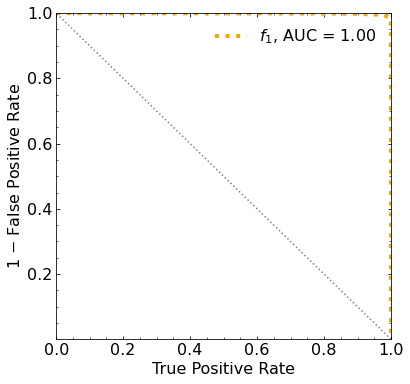

In [39]:
m_it = 0


# set the parameters
mDM = mDM_mDM[m_it]
S_cross1045 = S_cross1045_mDM[m_it]
S_expected = S_expected_mDM[m_it]

print('\n#########################\n')
print('mDM = ', mDM, 'GeV\n')


##########
# SIGNAL #
##########

S_cs1 = np.loadtxt(filefolder + 'WIMP_' + str(mDM) + 'GeV_cs1.txt')
S_cs2 = np.loadtxt(filefolder + 'WIMP_' + str(mDM) + 'GeV_cs2.txt')

print('\nS_cs1.shape: ', S_cs1.shape)
print('S_cs2.shape: ', S_cs2.shape)

S_cs1_aux = [S_cs1[x] for x in range(len(S_cs1)) if (3 < S_cs1[x] < 70 and 50 < S_cs2[x] < 8000)]
S_cs2 = [S_cs2[x] for x in range(len(S_cs1)) if (3 < S_cs1[x] < 70 and 50 < S_cs2[x] < 8000)]
S_cs1 = S_cs1_aux


# set events per classs
NUM_DAT = min(len(B_cs1_ER), len(S_cs1))
print(' NUM_DAT: ', NUM_DAT, '\n')

NUM_DAT_AC = int(NUM_DAT*f_AC)
NUM_DAT_CNNS = max(1, int(NUM_DAT*f_CNNS))
NUM_DAT_RN = int(NUM_DAT*f_RN)
NUM_DAT_WALL = int(NUM_DAT*f_WALL)

NUM_DAT_ER = NUM_DAT - ( NUM_DAT_AC + NUM_DAT_CNNS + NUM_DAT_RN + NUM_DAT_WALL )

print('NUM_DAT_ER: ', NUM_DAT_ER)
print('NUM_DAT_AC: ', NUM_DAT_AC)
print('NUM_DAT_CNNS: ', NUM_DAT_CNNS)
print('NUM_DAT_RN: ', NUM_DAT_RN)
print('NUM_DAT_WALL: ', NUM_DAT_WALL)



# CONCATENATE THE BACKGROUNDS
B_cs1cs2 = np.concatenate([np.stack([B_cs1_ER,B_cs2_ER],axis=1)[:NUM_DAT_ER], np.stack([B_cs1_AC,B_cs2_AC],axis=1)[:NUM_DAT_AC], np.stack([B_cs1_CNNS,B_cs2_CNNS],axis=1)[:NUM_DAT_CNNS], np.stack([B_cs1_RN,B_cs2_RN],axis=1)[:NUM_DAT_RN], np.stack([B_cs1_WALL,B_cs2_WALL],axis=1)[:NUM_DAT_WALL]])

print('\nB_cs1cs2.shape: ', B_cs1cs2.shape)


S_cs1cs2 = np.stack([S_cs1,S_cs2],axis=1)[:NUM_DAT]


print('\nS_cs1cs2.shape: ', S_cs1cs2.shape)


rnd = 100

B_cs1cs2_plot = shuffle(B_cs1cs2, random_state=rnd)
S_cs1cs2_plot = shuffle(S_cs1cs2, random_state=rnd)

plt.plot(B_cs1cs2_plot[:,0][:1000], B_cs1cs2_plot[:,1][:1000], '.', color='black', alpha=0.5, label='B')
plt.plot(S_cs1cs2_plot[:,0][:1000], S_cs1cs2_plot[:,1][:1000], '.', color='red', alpha=0.5, label='S')
plt.yscale('log')
# plt.xlim([0,100])
plt.ylim([100,10000])
plt.xlabel('s1',fontsize=14)
plt.ylabel('s2',fontsize=14)
plt.legend(fontsize=14)
plt.show()



plt.plot(B_cs1cs2_plot[:,0][:1000], (B_cs1cs2_plot[:,1] / B_cs1cs2_plot[:,0])[:1000], '.', color='black', alpha=0.5, label='B')
plt.plot(S_cs1cs2_plot[:,0][:1000], (S_cs1cs2_plot[:,1] / S_cs1cs2_plot[:,0])[:1000], '.', color='red', alpha=0.5, label='S')
plt.yscale('log')
# plt.xlim([0,100])
# plt.ylim([100,10000])
plt.xlabel('s1',fontsize=14)
plt.ylabel('s2/s1',fontsize=14)
plt.legend(fontsize=14)
plt.show()


############
# DATASETS #
############

# concatenate the data
X_mon_B = B_cs1cs2
X_mon_S = S_cs1cs2

# X_mon_B = np.reshape(B_pdiffT,(len(B_pdiffT),1))
# X_mon_S = np.reshape(S_pdiffT,(len(S_pdiffT),1))
print('X_mon_B.shape: ', X_mon_B.shape)
print('X_mon_S.shape: ', X_mon_S.shape)

# del B_ppeakS1
# del B_ppeakS2
# del B_pbot
# del B_ptop

# del S_ppeakS1
# del S_ppeakS2
# del S_pbot
# del S_ptop

X_mon = np.concatenate([X_mon_B, X_mon_S])

# X_mon = np.concatenate([np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(S_pbot,(len(S_pbot),1))])

print('X_mon.shape: ', X_mon.shape)
# del X_mon_B
# del X_mon_S


# labels
y_mon = np.concatenate([np.zeros(NUM_DAT),np.ones(NUM_DAT)])


# divide into train-val and test data samples
test_ratio = 0.25
val_ratio = 0.15


X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                y_mon,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_mon,
                                                                shuffle=True)

del X_mon
del y_mon

X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                  y_mon_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_mon_aux,
                                                                  shuffle=True)

del X_mon_aux
del y_mon_aux

print('')
print('X_mon_train : ', X_mon_train.shape)
print('y_mon_train : ', y_mon_train.shape)
print('X_mon_val : ', X_mon_val.shape)
print('y_mon_val : ', y_mon_val.shape)
print('X_mon_test : ', X_mon_test.shape)
print('y_mon_test : ', y_mon_test.shape)
print('')



###########
# XGBOOST #
###########

# XGBoost with only the kinematic variables of the leptons

# CLASSIFIER
classifier = XGBClassifier(
    n_estimators=2500,
    learning_rate=0.01,
    reg_lambda=0.01,reg_alpha=0.0,
    gamma=0.0,objective='binary:logistic',
    max_depth=5,
    #eval_metric=["error", "logloss", "map"]
    eval_metric='logloss')

# FIT
classifier.fit(X_mon_train,y_mon_train,eval_set=[(X_mon_train, y_mon_train), (X_mon_val, y_mon_val)],
        early_stopping_rounds=50,#early stopping
        verbose=True)


# PREDICTIONS
y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


# ROC
fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)


# PLOT THE ROC WITH AUC
fig = plt.figure(figsize=(6, 6))
gs = gridspec.GridSpec(1, 1) 
ax0 = plt.subplot(gs[0])
ax0.yaxis.set_ticks_position('both')
ax0.xaxis.set_ticks_position('both')
ax0.tick_params(direction="in",which="both")
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
ax0.minorticks_on()


plt.plot(tpr_mon_xg,1-fpr_mon_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()



#########################

mDM =  500 GeV


S_cs1.shape:  (35477,)
S_cs2.shape:  (35477,)
 NUM_DAT:  32117 

NUM_DAT_ER:  31709
NUM_DAT_AC:  112
NUM_DAT_CNNS:  1
NUM_DAT_RN:  29
NUM_DAT_WALL:  266

B_cs1cs2.shape:  (32117, 2)

S_cs1cs2.shape:  (32117, 2)


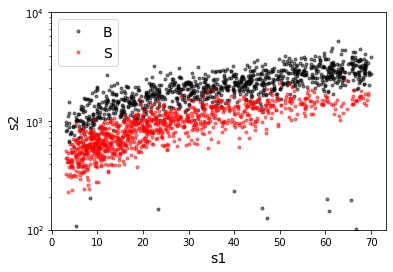

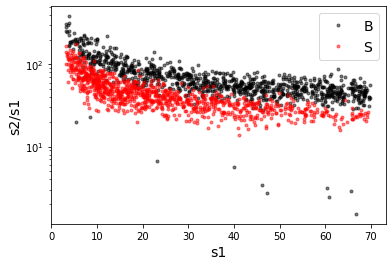

X_mon_B.shape:  (32117, 2)
X_mon_S.shape:  (32117, 2)
X_mon.shape:  (64234, 2)

X_mon_train :  (40948, 2)
y_mon_train :  (40948,)
X_mon_val :  (7227, 2)
y_mon_val :  (7227,)
X_mon_test :  (16059, 2)
y_mon_test :  (16059,)

Classification score:


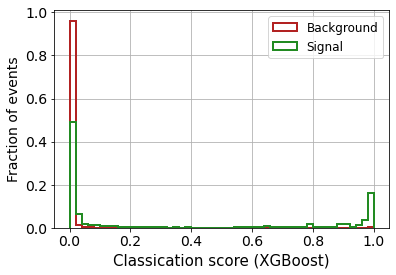


 ROC-AUC =  0.7817819140438167
At least 5 B events per bin, range = [[0, 1]]:
# bins:  2 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  2
range of our data:  [[0, 1]]
number of bins we are going to use:  2
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.155


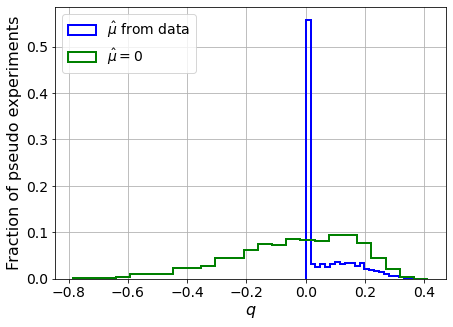

muhat mean:  1.8959730141433135
Z_bins:  0.0
std Z_bins:  inf
Z_bins mu=0:  0.1316644911901389
std Z_bins mu=0:  0.7899559971877536

--------

B_expected:  643
S_expected:  1



/media/andres/disco1tera/ubuntu/Trabajo/Direct-Detection/xenon1t-classifier/clasificadores-h5-2024/02-limits/AUX_MLL_BL.py:807: RuntimeWarning: divide by zero encountered in double_scalars
  Z_bins_std = np.std(q_muhat_bins) / (2.*Z_bins)


Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.122


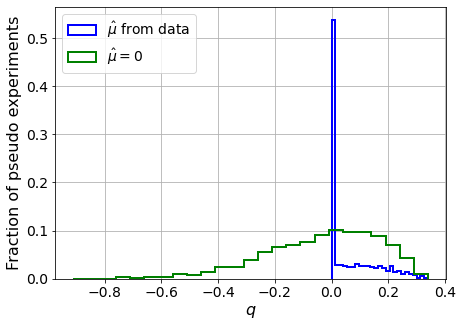

muhat mean:  1.6270445289980908
Z_bins:  0.03880197549489854
std Z_bins:  1.1131133899499812
Z_bins mu=0:  0.08308661267899195
std Z_bins mu=0:  1.225767323819377

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1285


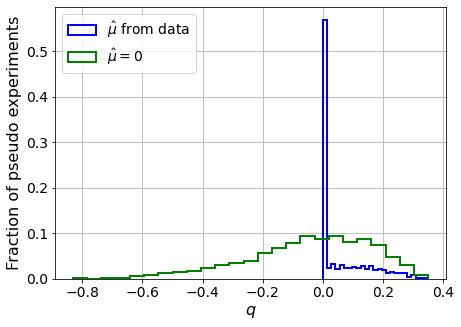

muhat mean:  2.0086699968115744
Z_bins:  0.0
std Z_bins:  inf
Z_bins mu=0:  0.14665742208895352
std Z_bins mu=0:  0.7082246959667817

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.153


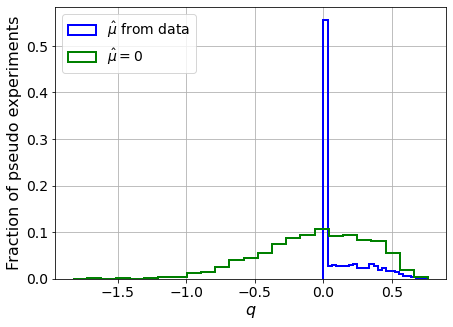

muhat mean:  0.9983817677774947
Z_bins:  0.07479146506621212
std Z_bins:  1.192082933257242
Z_bins mu=0:  0.15735513294212522
std Z_bins mu=0:  1.2462349708532143

--------

B_expected:  643
S_expected:  5

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1405


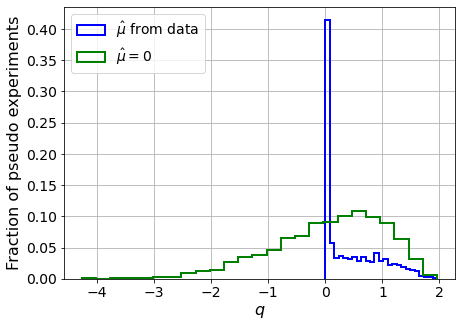

muhat mean:  0.39689366892919653
Z_bins:  0.46702173034683536
std Z_bins:  0.5335932131190058
Z_bins mu=0:  0.44302946491750317
std Z_bins mu=0:  1.094826035045992

--------

B_expected:  643
S_expected:  9

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.133


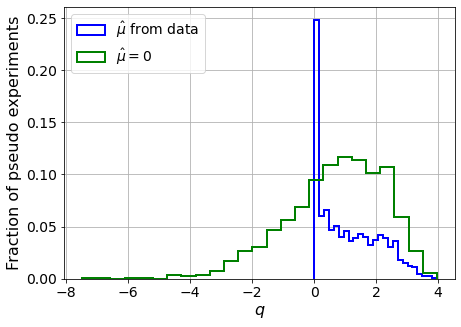

muhat mean:  0.16950526825553655
Z_bins:  0.95143264225935
std Z_bins:  0.5153430385744463
Z_bins mu=0:  0.9500338837861534
std Z_bins mu=0:  0.8329965363546866

--------

B_expected:  643
S_expected:  17

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.132


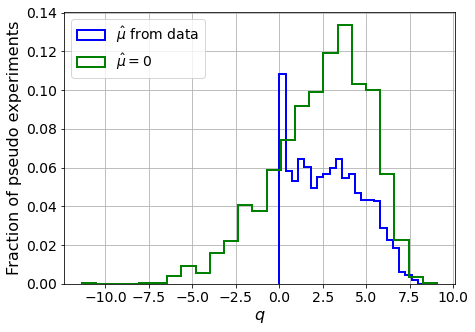

muhat mean:  0.11697981545475215
Z_bins:  1.6847113922258417
std Z_bins:  0.578901932951789
Z_bins mu=0:  1.6782159496597528
std Z_bins mu=0:  0.8205599752591065

--------

B_expected:  643
S_expected:  33

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.13


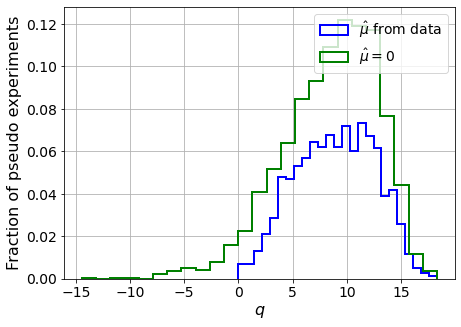

muhat mean:  0.04816378333484326
Z_bins:  3.016869649346831
std Z_bins:  0.6001585369908946
Z_bins mu=0:  3.0132487934651215
std Z_bins mu=0:  0.7375263052415407

--------

B_expected:  643
S_expected:  64

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1405


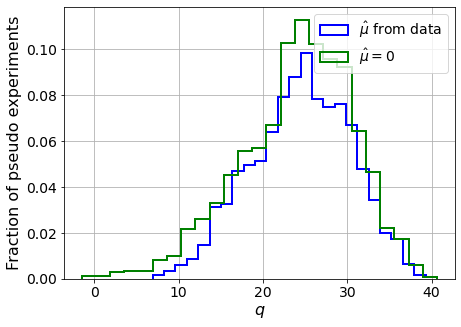

muhat mean:  0.02893142041624329
Z_bins:  4.988859530577488
std Z_bins:  0.5904895878747971
Z_bins mu=0:  4.980804793470373
std Z_bins mu=0:  0.6691475749074839

--------

B_expected:  643
S_expected:  124

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1415


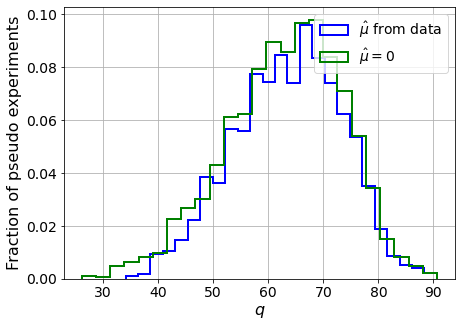

muhat mean:  0.015860723269765217
Z_bins:  7.995833993942179
std Z_bins:  0.6130656149330598
Z_bins mu=0:  7.991191844288817
std Z_bins mu=0:  0.6642446852796937

--------

B_expected:  643
S_expected:  239

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1565


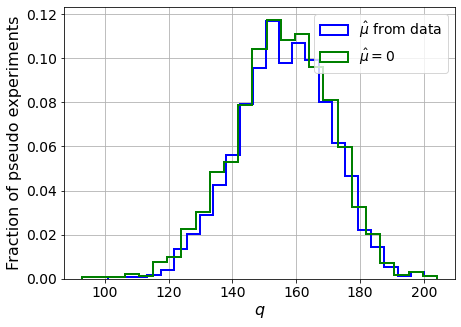

muhat mean:  0.007235413968809027
Z_bins:  12.500147688714359
std Z_bins:  0.5856801449964081
Z_bins mu=0:  12.496729811814973
std Z_bins mu=0:  0.6112468326973176

--------

B_expected:  643
S_expected:  462

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1245


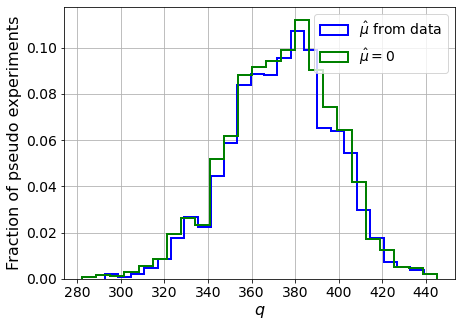

muhat mean:  0.004693465717321734
Z_bins:  19.36668958288118
std Z_bins:  0.6159251445589107
Z_bins mu=0:  19.35602592954482
std Z_bins mu=0:  0.6342099249595623

--------

B_expected:  643
S_expected:  892

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1385


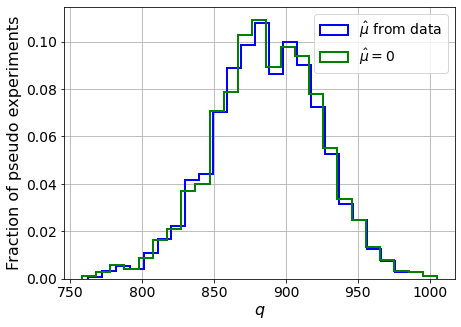

muhat mean:  0.0022564627442897534
Z_bins:  29.783775044700963
std Z_bins:  0.624473757067564
Z_bins mu=0:  29.775790725230614
std Z_bins mu=0:  0.6339294758979077

--------

B_expected:  643
S_expected:  1723

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.145


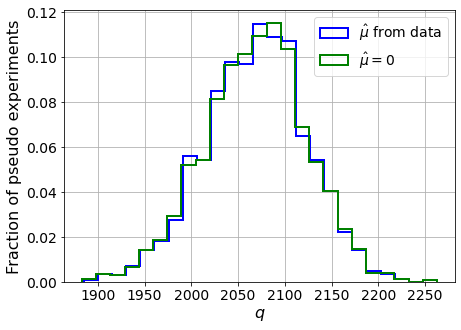

muhat mean:  0.0010042658732128367
Z_bins:  45.50275824639421
std Z_bins:  0.5924037325412375
Z_bins mu=0:  45.4988392741748
std Z_bins mu=0:  0.5974636814730282

--------

B_expected:  643
S_expected:  3326

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.148


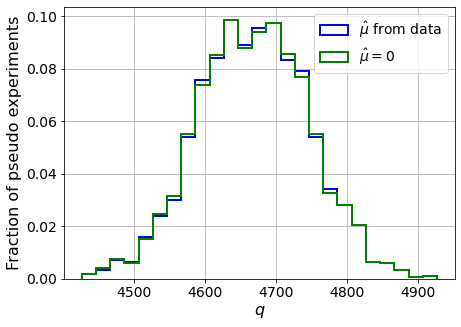

muhat mean:  0.0004826506428002785
Z_bins:  68.32540468249076
std Z_bins:  0.5707382582476659
Z_bins mu=0:  68.32540468249076
std Z_bins mu=0:  0.5736088395220872

--------


 FINAL RESULT:

[[0.0, inf, 1.8959730141433135, 0.1316644911901389, 0.7899559971877536], [0.03880197549489854, 1.1131133899499812, 1.6270445289980908, 0.08308661267899195, 1.225767323819377], [0.0, inf, 2.0086699968115744, 0.14665742208895352, 0.7082246959667817], [0.07479146506621212, 1.192082933257242, 0.9983817677774947, 0.15735513294212522, 1.2462349708532143], [0.46702173034683536, 0.5335932131190058, 0.39689366892919653, 0.44302946491750317, 1.094826035045992], [0.95143264225935, 0.5153430385744463, 0.16950526825553655, 0.9500338837861534, 0.8329965363546866], [1.6847113922258417, 0.578901932951789, 0.11697981545475215, 1.6782159496597528, 0.8205599752591065], [3.016869649346831, 0.6001585369908946, 0.04816378333484326, 3.0132487934651215, 0.7375263052415407], [4.988859530577488, 0.5904895878747971, 0.028931

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 193.18220826 100.97766008   6.10722255 -83.19434958]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
          -inf          -inf  262.86375251  213.7655053   15

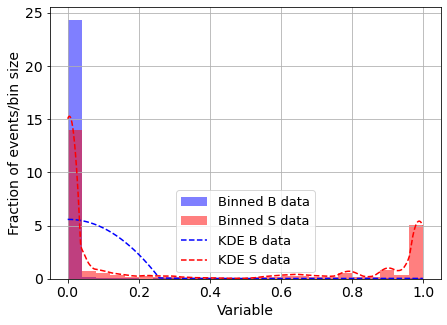

KDE Kernel:  epanechnikov
Background bandwidth:  0.257351270001691
Signal bandwidth:  0.03613222756796251
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



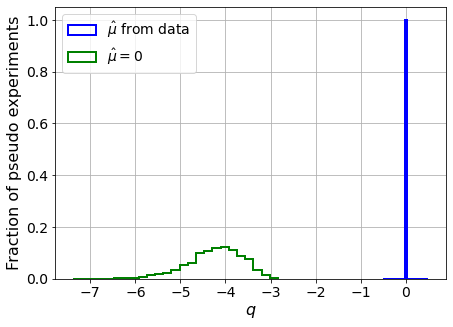

/media/andres/disco1tera/ubuntu/Trabajo/Direct-Detection/xenon1t-classifier/clasificadores-h5-2024/02-limits/AUX_MLL_BL.py:1268: RuntimeWarning: invalid value encountered in double_scalars
  Z_MLL_std = np.std(q_muhat_MLL) / (2.*Z_MLL)


muhat mean:  398.91664495909265
Z_bins:  0.0
std Z_bins:  nan
Z_bins mu=0:  2.041442537871455
std Z_bins mu=0:  0.14816314239562017

--------

B_expected:  643
S_expected:  1



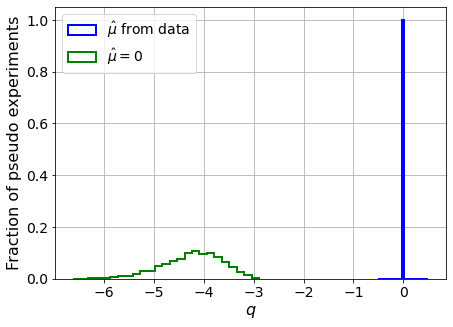

muhat mean:  400.43769317163304
Z_bins:  0.0
std Z_bins:  nan
Z_bins mu=0:  2.048401588940985
std Z_bins mu=0:  0.1463487690303585

--------

B_expected:  643
S_expected:  1



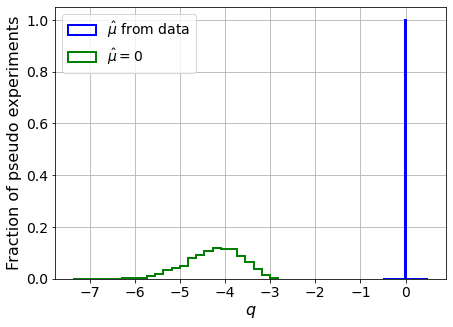

muhat mean:  398.4063223993556
Z_bins:  0.0
std Z_bins:  nan
Z_bins mu=0:  2.0477343036303575
std Z_bins mu=0:  0.1467682823797085

--------

B_expected:  643
S_expected:  2



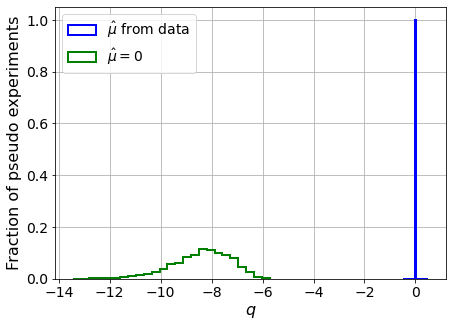

muhat mean:  199.70583921765765
Z_bins:  0.0
std Z_bins:  nan
Z_bins mu=0:  2.87712505297434
std Z_bins mu=0:  0.19871960344333878

--------

B_expected:  643
S_expected:  5



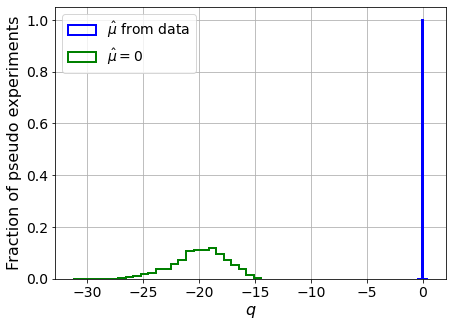

muhat mean:  79.87451696409828
Z_bins:  0.0
std Z_bins:  nan
Z_bins mu=0:  4.445554326338711
std Z_bins mu=0:  0.2699157430775738

--------

B_expected:  643
S_expected:  9



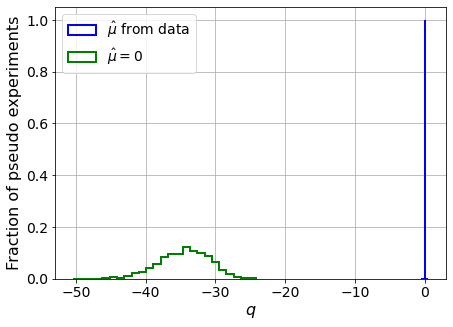

muhat mean:  44.40357156283598
Z_bins:  0.0
std Z_bins:  nan
Z_bins mu=0:  5.858197372535009
std Z_bins mu=0:  0.3117205854775784

--------

B_expected:  643
S_expected:  17



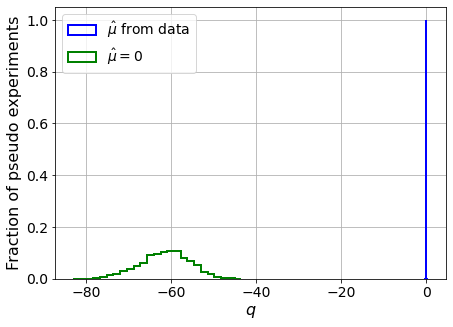

muhat mean:  23.496015212676525
Z_bins:  0.0
std Z_bins:  nan
Z_bins mu=0:  7.822853043201541
std Z_bins mu=0:  0.3699737269293774

--------

B_expected:  643
S_expected:  33



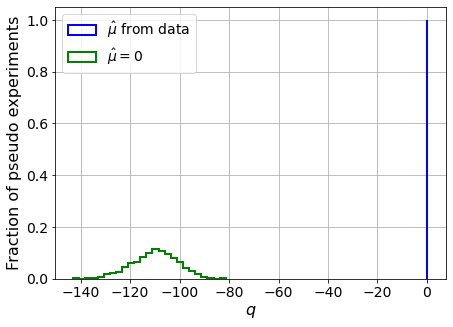

muhat mean:  12.088774605669627
Z_bins:  0.0
std Z_bins:  nan
Z_bins mu=0:  10.47232212669079
std Z_bins mu=0:  0.4348257663421204

--------

B_expected:  643
S_expected:  64



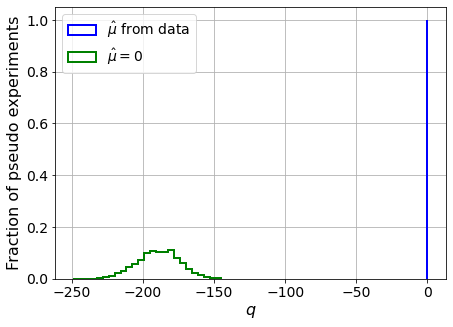

muhat mean:  6.239792286264356
Z_bins:  0.0
std Z_bins:  nan
Z_bins mu=0:  13.74501170737383
std Z_bins mu=0:  0.533385673076651

--------

B_expected:  643
S_expected:  124



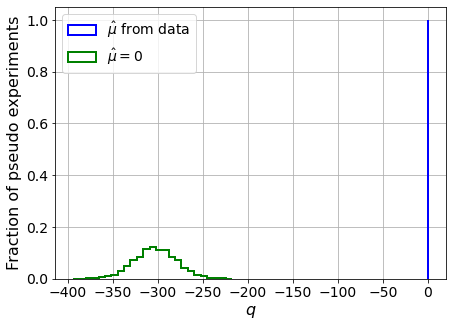

muhat mean:  3.2203786093582996
Z_bins:  0.0
std Z_bins:  nan
Z_bins mu=0:  17.396789519830723
std Z_bins mu=0:  0.6839513395419254

--------

B_expected:  643
S_expected:  239



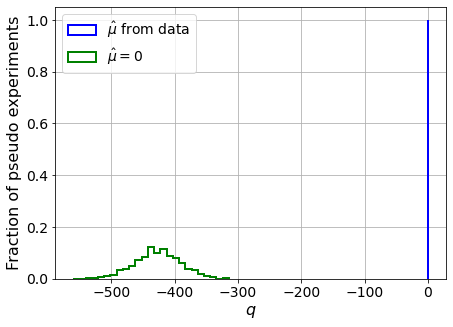

muhat mean:  1.6749012136687598
Z_bins:  0.0
std Z_bins:  nan
Z_bins mu=0:  20.66147292889791
std Z_bins mu=0:  0.8837864720368698

--------

B_expected:  643
S_expected:  462



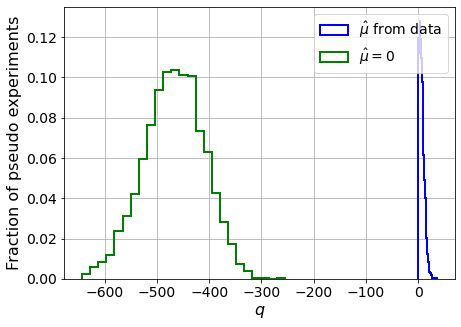

muhat mean:  0.8631089208208962
Z_bins:  2.463278402088865
std Z_bins:  1.0125713750377308
Z_bins mu=0:  21.58845632504291
std Z_bins mu=0:  1.3369806665463424

--------

B_expected:  643
S_expected:  892



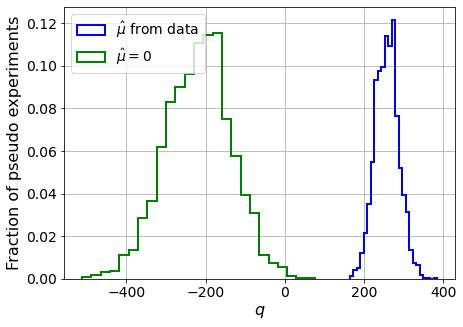

muhat mean:  0.447247567827409
Z_bins:  16.02770933378586
std Z_bins:  0.931488372681704
Z_bins mu=0:  14.675775720125142
std Z_bins mu=0:  2.828903180181682

--------

B_expected:  643
S_expected:  1723



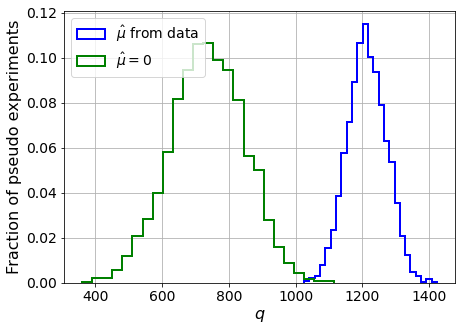

muhat mean:  0.23216169329091382
Z_bins:  34.82784005560807
std Z_bins:  0.8317904007468736
Z_bins mu=0:  27.144049860123378
std Z_bins mu=0:  2.034873374646429

--------

B_expected:  643
S_expected:  3326



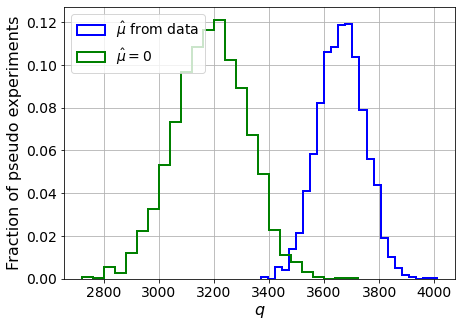

muhat mean:  0.11968579513885541
Z_bins:  60.536152984138276
std Z_bins:  0.689081038716509
Z_bins mu=0:  56.505720057674736
std Z_bins mu=0:  1.170792211441807

--------


 FINAL RESULT:

[[0.0, nan, 398.91664495909265, 2.041442537871455, 0.14816314239562017], [0.0, nan, 400.43769317163304, 2.048401588940985, 0.1463487690303585], [0.0, nan, 398.4063223993556, 2.0477343036303575, 0.1467682823797085], [0.0, nan, 199.70583921765765, 2.87712505297434, 0.19871960344333878], [0.0, nan, 79.87451696409828, 4.445554326338711, 0.2699157430775738], [0.0, nan, 44.40357156283598, 5.858197372535009, 0.3117205854775784], [0.0, nan, 23.496015212676525, 7.822853043201541, 0.3699737269293774], [0.0, nan, 12.088774605669627, 10.47232212669079, 0.4348257663421204], [0.0, nan, 6.239792286264356, 13.74501170737383, 0.533385673076651], [0.0, nan, 3.2203786093582996, 17.396789519830723, 0.6839513395419254], [0.0, nan, 1.6749012136687598, 20.66147292889791, 0.8837864720368698], [2.463278402088865, 1.012571375

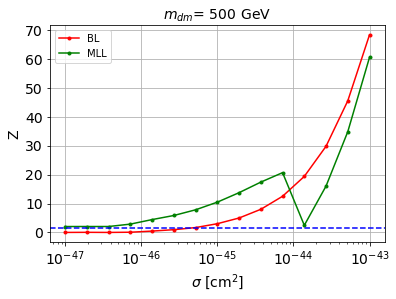

ValueError: no solution found

In [97]:
store_cross_BL_164 = []
store_cross_BL_164_up = []
store_cross_BL_164_down = []

store_cross_MLL_164 = []
store_cross_MLL_164_up = []
store_cross_MLL_164_down = []


for m_it2 in range(len(mDM_mDM)):
# for m_it2 in range(6,len(mDM_mDM)):

    # set the parameters
    mDM = mDM_mDM[m_it2]
    S_cross1045 = S_cross1045_mDM[m_it2]
    S_expected = S_expected_mDM[m_it2]

    print('\n#########################\n')
    print('mDM = ', mDM, 'GeV\n')


    ##########
    # SIGNAL #
    ##########

    S_cs1 = np.loadtxt(filefolder + 'WIMP_' + str(mDM) + 'GeV_cs1.txt')
    S_cs2 = np.loadtxt(filefolder + 'WIMP_' + str(mDM) + 'GeV_cs2.txt')

    print('\nS_cs1.shape: ', S_cs1.shape)
    print('S_cs2.shape: ', S_cs2.shape)

    S_cs1_aux = [S_cs1[x] for x in range(len(S_cs1)) if (3 < S_cs1[x] < 70 and 50 < S_cs2[x] < 8000)]
    S_cs2 = [S_cs2[x] for x in range(len(S_cs1)) if (3 < S_cs1[x] < 70 and 50 < S_cs2[x] < 8000)]
    S_cs1 = S_cs1_aux


    # set events per classs
    NUM_DAT = min(len(B_cs1_ER), len(S_cs1))
    print(' NUM_DAT: ', NUM_DAT, '\n')

    NUM_DAT_AC = int(NUM_DAT*f_AC)
    NUM_DAT_CNNS = max(1, int(NUM_DAT*f_CNNS))
    NUM_DAT_RN = int(NUM_DAT*f_RN)
    NUM_DAT_WALL = int(NUM_DAT*f_WALL)

    NUM_DAT_ER = NUM_DAT - ( NUM_DAT_AC + NUM_DAT_CNNS + NUM_DAT_RN + NUM_DAT_WALL )

    print('NUM_DAT_ER: ', NUM_DAT_ER)
    print('NUM_DAT_AC: ', NUM_DAT_AC)
    print('NUM_DAT_CNNS: ', NUM_DAT_CNNS)
    print('NUM_DAT_RN: ', NUM_DAT_RN)
    print('NUM_DAT_WALL: ', NUM_DAT_WALL)



    # CONCATENATE THE BACKGROUNDS
    B_cs1cs2 = np.concatenate([np.stack([B_cs1_ER,B_cs2_ER],axis=1)[:NUM_DAT_ER], np.stack([B_cs1_AC,B_cs2_AC],axis=1)[:NUM_DAT_AC], np.stack([B_cs1_CNNS,B_cs2_CNNS],axis=1)[:NUM_DAT_CNNS], np.stack([B_cs1_RN,B_cs2_RN],axis=1)[:NUM_DAT_RN], np.stack([B_cs1_WALL,B_cs2_WALL],axis=1)[:NUM_DAT_WALL]])

    print('\nB_cs1cs2.shape: ', B_cs1cs2.shape)


    S_cs1cs2 = np.stack([S_cs1,S_cs2],axis=1)[:NUM_DAT]


    print('\nS_cs1cs2.shape: ', S_cs1cs2.shape)


    rnd = 100

    B_cs1cs2_plot = shuffle(B_cs1cs2, random_state=rnd)
    S_cs1cs2_plot = shuffle(S_cs1cs2, random_state=rnd)

    plt.plot(B_cs1cs2_plot[:,0][:1000], B_cs1cs2_plot[:,1][:1000], '.', color='black', alpha=0.5, label='B')
    plt.plot(S_cs1cs2_plot[:,0][:1000], S_cs1cs2_plot[:,1][:1000], '.', color='red', alpha=0.5, label='S')
    plt.yscale('log')
    # plt.xlim([0,100])
    plt.ylim([100,10000])
    plt.xlabel('s1',fontsize=14)
    plt.ylabel('s2',fontsize=14)
    plt.legend(fontsize=14)
    plt.show()



    plt.plot(B_cs1cs2_plot[:,0][:1000], (B_cs1cs2_plot[:,1] / B_cs1cs2_plot[:,0])[:1000], '.', color='black', alpha=0.5, label='B')
    plt.plot(S_cs1cs2_plot[:,0][:1000], (S_cs1cs2_plot[:,1] / S_cs1cs2_plot[:,0])[:1000], '.', color='red', alpha=0.5, label='S')
    plt.yscale('log')
    # plt.xlim([0,100])
    # plt.ylim([100,10000])
    plt.xlabel('s1',fontsize=14)
    plt.ylabel('s2/s1',fontsize=14)
    plt.legend(fontsize=14)
    plt.show()


    ############
    # DATASETS #
    ############

    # concatenate the data
    X_mon_B = B_cs1cs2
    X_mon_S = S_cs1cs2

    # X_mon_B = np.reshape(B_pdiffT,(len(B_pdiffT),1))
    # X_mon_S = np.reshape(S_pdiffT,(len(S_pdiffT),1))
    print('X_mon_B.shape: ', X_mon_B.shape)
    print('X_mon_S.shape: ', X_mon_S.shape)

    # del B_ppeakS1
    # del B_ppeakS2
    # del B_pbot
    # del B_ptop

    # del S_ppeakS1
    # del S_ppeakS2
    # del S_pbot
    # del S_ptop

    X_mon = np.concatenate([X_mon_B, X_mon_S])

    # X_mon = np.concatenate([np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(S_pbot,(len(S_pbot),1))])

    print('X_mon.shape: ', X_mon.shape)
    # del X_mon_B
    # del X_mon_S


    # labels
    y_mon = np.concatenate([np.zeros(NUM_DAT),np.ones(NUM_DAT)])


    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                    y_mon,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon,
                                                                    shuffle=True)

    del X_mon
    del y_mon

    X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                      y_mon_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon_aux,
                                                                      shuffle=True)

    del X_mon_aux
    del y_mon_aux

    print('')
    print('X_mon_train : ', X_mon_train.shape)
    print('y_mon_train : ', y_mon_train.shape)
    print('X_mon_val : ', X_mon_val.shape)
    print('y_mon_val : ', y_mon_val.shape)
    print('X_mon_test : ', X_mon_test.shape)
    print('y_mon_test : ', y_mon_test.shape)
    print('')



    # PREDICTIONS
    y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


    # ROC
    fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
    roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)



    # XGBoost with the kinematic variables of the leptons

    ########################
    # CLASSIFICATION SCORE #
    ########################

    # Outputs for validation data set

    pred_XG_SM = []
    pred_XG_NP = []

    for i in range(len(y_mon_test)):
        if y_mon_test[i] == 0:
            pred_XG_SM.append(y_pred_xg[i])
        else:
            pred_XG_NP.append(y_pred_xg[i])


    print('Classification score:')

    weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
    nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

    weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
    nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.xlabel("Classication score (XGBoost)",fontsize=15)
    plt.ylabel("Fraction of events",fontsize=14)
    plt.grid()
    plt.legend(fontsize=12)

    plt.show()




    print('\n ROC-AUC = ', roc_auc_xg)



    #######################
    # BIN LIKELIHOOD TEST #
    #######################

    MIN_EVS = 5 # min number of background events that we allow per bin
    range_dat = [[0,1]] # range of our data (between 0 and 1 if its the ML output)

    bins_to_test=range(1,500) # number of bins we are testing to see if condition holds

    # FIND THE NUMBER OF BINS:
    num_binsX = max_num_bins(pred_XG_SM, B_expected, range_dat, MIN_EVS, bins_to_test)

    print('\n FOR BIN LIKELIHOOD WE ARE SETTING:')
    print('min number of Background events allowed per bin: ', MIN_EVS)
    print('max number of bins allowed: ', num_binsX)
    print('range of our data: ', range_dat)




    num_bins = min(10, num_binsX)
    print('number of bins we are going to use: ', num_bins)


    # OPTION 2 (mu_hat with more precision) (slower, not so bad for bin likelihood)
    store_Z_BL = []


    for s_it in range(len(S_expected)):

        print('B_expected: ', B_expected)
        print('S_expected: ', S_expected[s_it])
        print('')

        Z_BL = BL_test_fsolve(D_or_E, pred_XG_SM, pred_XG_NP, B_expected, S_expected[s_it], num_pseudo, num_bins, range_dat, MIN_EVS, linear_bins=True) 

        store_Z_BL.append( list(Z_BL) )

        print('muhat mean: ', Z_BL[2])
        print('Z_bins: ', Z_BL[0])
        print('std Z_bins: ', Z_BL[1])
        print('Z_bins mu=0: ', Z_BL[3])
        print('std Z_bins mu=0: ', Z_BL[4])
        print('')
        print('--------\n')



    print('\n FINAL RESULT:\n')
    print(store_Z_BL)




    #######
    # MLL #
    #######

    # USE KDE TO ESTIMATE THE CLASSIFIER OUTPUT PDFs

    # outputs:
    # 1st -> background PDF
    # 2nd -> signal PDF
    # 3rd -> (normalization factor of the background PDF)**-1
    # 4th -> (normalization factor of the signal PDF)**-1
    # 5th -> background bandwidth
    # 6th -> signal bandwidth
    kde_bkg, kde_sig, norm_factor_SM, norm_factor_NP, B_bandwidth, S_bandwidth = KDE_fitter(pred_XG_SM, pred_XG_NP, 
                                                                                            1000, 
                                                                                            np.logspace(-4.0, 0.05, 20), 
                                                                                            set_kernel='epanechnikov')




    # FOR EXCLUSION:
    # we need to evaluate the KDE densities with the classifier output of BACKGROUND EVENTS

    print('This may take a while...')

    pB_B_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_SM, np.zeros(len(pred_XG_SM)) ]) )
    print('1 done')
    pS_B_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_SM, np.ones(len(pred_XG_SM)) ]) )
    print('2 done')

    # Normalize
    pB_B_data = pB_B_data / norm_factor_SM
    pS_B_data = pS_B_data / norm_factor_NP


    if D_or_E == "discovery":

        # FOR DISCOVERY:
        # we need to evaluate the KDE densities with the classifier output of BACKGROUND and SIGNAL EVENTS

        pB_S_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_NP, np.zeros(len(pred_XG_NP)) ]) )
        print('3 done')
        pS_S_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_NP, np.ones(len(pred_XG_NP)) ]) )
        print('4 done')

        # Normalize
        pB_S_data = pB_S_data / norm_factor_SM
        pS_S_data = pS_S_data / norm_factor_NP

    else:
        # dummies
        pB_S_data = 1
        pS_S_data = 1





    # OPTION 2 (mu_hat with more precision) (slower)
    store_Z_MLL = []


    for s_it in range(len(S_expected)):

        print('B_expected: ', B_expected)
        print('S_expected: ', S_expected[s_it])
        print('')

        Z_MLL = MLL_test_fsolve(D_or_E, pB_B_data, pS_B_data, pB_S_data, pS_S_data, B_expected, S_expected[s_it], num_pseudo)

        store_Z_MLL.append( list(Z_MLL) )

        print('muhat mean: ', Z_MLL[2])
        print('Z_bins: ', Z_MLL[0])
        print('std Z_bins: ', Z_MLL[1])
        print('Z_bins mu=0: ', Z_MLL[3])
        print('std Z_bins mu=0: ', Z_MLL[4])
        print('')
        print('--------\n')


    print('\n FINAL RESULT:\n')
    print(store_Z_MLL)


    store_Z_MLL = np.array(store_Z_MLL)

    for hd in range(len(store_Z_MLL[:,0])):
        if store_Z_MLL[:,0][hd] == 0:
            store_Z_MLL[:,0][hd] = store_Z_MLL[:,3][hd]
            store_Z_MLL[:,1][hd] = store_Z_MLL[:,4][hd]




    # plot
    plt.plot(cross_factor*1e-45, np.array(store_Z_BL)[:,0], '.-', c='red', label='BL')
    plt.plot(cross_factor*1e-45, np.array(store_Z_MLL)[:,0], '.-', c='green', label = "MLL")

    plt.axhline(y=1.64, c='blue', linestyle='--')
    plt.title('$m_{dm}$= %0.2d GeV' % mDM, fontsize=14)
    plt.xscale('log')
    plt.xlabel(r'$\sigma$ [cm$^2$]', fontsize=14)
    plt.ylabel(r'Z', fontsize=14)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()


    # interpolate
    f_Z = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0], kind='linear')
    f_Z_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0] + np.array(store_Z_BL)[:,1], kind='linear')
    f_Z_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0] - np.array(store_Z_BL)[:,1], kind='linear')

    # compute the cross section with Z=1.64
    cross_BL_164 = 10**solvecross(f_Z, 1.64)
    cross_BL_164_up = 10**solvecross(f_Z_up, 1.64)
    cross_BL_164_down = 10**solvecross(f_Z_down, 1.64)

    store_cross_BL_164.append(cross_BL_164)
    store_cross_BL_164_up.append(cross_BL_164_up)
    store_cross_BL_164_down.append(cross_BL_164_down)


    # interpolate
    f_Z_MLL = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0], kind='linear')
    f_Z_MLL_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] + np.array(store_Z_MLL)[:,1], kind='linear')
    f_Z_MLL_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] - np.array(store_Z_MLL)[:,1], kind='linear')

    # compute the cross section with Z=1.64
    cross_MLL_164 = 10**solvecross(f_Z_MLL, 1.64)
    cross_MLL_164_up = 10**solvecross(f_Z_MLL_up, 1.64)
    cross_MLL_164_down = 10**solvecross(f_Z_MLL_down, 1.64)

    store_cross_MLL_164.append(cross_MLL_164)
    store_cross_MLL_164_up.append(cross_MLL_164_up)
    store_cross_MLL_164_down.append(cross_MLL_164_down)


    print('\ncross_BL_164: ', cross_BL_164)
    print('cross_BL_164_up: ', cross_BL_164_up)
    print('cross_BL_164_down: ', cross_BL_164_down)

    print('\ncross_MLL_164: ', cross_MLL_164)
    print('cross_MLL_164_up: ', cross_MLL_164_up)
    print('cross_MLL_164_down: ', cross_MLL_164_down)
    print('\n#########################\n')


In [173]:
cross_cs1cs2 = store_cross_BL_164
cross_cs1cs2_up = store_cross_BL_164_up
cross_cs1cs2_down = store_cross_BL_164_down

print(cross_cs1cs2)
print(cross_cs1cs2_up)
print(cross_cs1cs2_down)


cross_cs1cs2_MLL = store_cross_MLL_164
cross_cs1cs2_MLL_up = store_cross_MLL_164_up
cross_cs1cs2_MLL_down = store_cross_MLL_164_down

print(cross_cs1cs2_MLL)
print(cross_cs1cs2_MLL_up)
print(cross_cs1cs2_MLL_down)

[1.1096231893163192e-45, 8.11796075194455e-47, 6.423821831459367e-47, 6.794470715474796e-47, 1.0629828085284936e-46, 1.97350261967697e-46, 5.164946250490725e-46]
[7.706986313282051e-46, 5.503786954654855e-47, 3.713334153211057e-47, 4.1850273966616404e-47, 7.228631726052321e-47, 1.3091163727992484e-46, 3.142348270845765e-46]
[1.6708580701072287e-45, 1.0879392667911523e-46, 8.668709674679988e-47, 9.232789080579764e-47, 1.5056603659036019e-46, 2.9373250242544993e-46, 6.905234417732703e-46]
[6.4868479791187484e-46, 5.032648369572119e-47, 3.568789906366315e-47, 3.7747059530415533e-47, 5.90546004738052e-47, 1.0963903442649834e-46, 2.869414583605958e-46]
[4.8448128824417425e-46, 2.66013506754205e-47, 2.0072076503843551e-47, 2.262176971168454e-47, 3.907368500568822e-47, 7.076304717833775e-47, 1.6985666328896028e-46]
[8.887778498836069e-46, 7.858876315769487e-47, 4.953548385531422e-47, 5.275879474617007e-47, 8.603773519449154e-47, 1.6784714424311425e-46, 3.9458482387044016e-46]


In [174]:
np.savetxt('results/general/cs1cs2_mDM' + str(m_it) + '.txt', [cross_cs1cs2, cross_cs1cs2_up, cross_cs1cs2_down])
np.savetxt('results/general/cs1cs2_mDM' + str(m_it) + '_MLL.txt', [cross_cs1cs2_MLL, cross_cs1cs2_MLL_up, cross_cs1cs2_MLL_down])

In [175]:
cross_cs1cs2_general_m0 = np.loadtxt('results/general/cs1cs2_mDM' + str(m_it) + '.txt')[0]
cross_cs1cs2_general_m0_up = np.loadtxt('results/general/cs1cs2_mDM' + str(m_it) + '.txt')[1]
cross_cs1cs2_general_m0_down =np.loadtxt('results/general/cs1cs2_mDM' + str(m_it) + '.txt')[2]

cross_cs1cs2_general_m0_MLL = np.loadtxt('results/general/cs1cs2_mDM' + str(m_it) + '_MLL.txt')[0]
cross_cs1cs2_general_m0_MLL_up = np.loadtxt('results/general/cs1cs2_mDM' + str(m_it) + '_MLL.txt')[1]
cross_cs1cs2_general_m0_MLL_down = np.loadtxt('results/general/cs1cs2_mDM' + str(m_it) + '_MLL.txt')[2]

#### Train with m_it = 1


#########################

mDM =  20 GeV


S_cs1.shape:  (33873,)
S_cs2.shape:  (33873,)
 NUM_DAT:  33001 

NUM_DAT_ER:  32580
NUM_DAT_AC:  116
NUM_DAT_CNNS:  1
NUM_DAT_RN:  30
NUM_DAT_WALL:  274

B_cs1cs2.shape:  (33001, 2)

S_cs1cs2.shape:  (33001, 2)


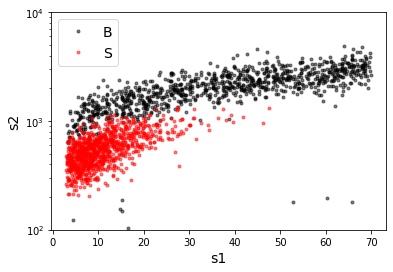

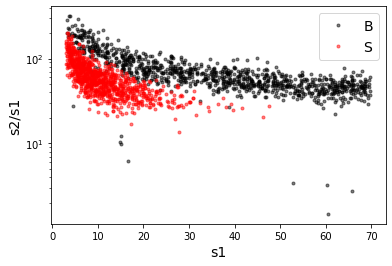

X_mon_B.shape:  (33001, 2)
X_mon_S.shape:  (33001, 2)
X_mon.shape:  (66002, 2)

X_mon_train :  (42075, 2)
y_mon_train :  (42075,)
X_mon_val :  (7426, 2)
y_mon_val :  (7426,)
X_mon_test :  (16501, 2)
y_mon_test :  (16501,)

[0]	validation_0-logloss:0.68430	validation_1-logloss:0.68434
[1]	validation_0-logloss:0.67560	validation_1-logloss:0.67571
[2]	validation_0-logloss:0.66708	validation_1-logloss:0.66724
[3]	validation_0-logloss:0.65873	validation_1-logloss:0.65895


/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[4]	validation_0-logloss:0.65051	validation_1-logloss:0.65081
[5]	validation_0-logloss:0.64249	validation_1-logloss:0.64283
[6]	validation_0-logloss:0.63460	validation_1-logloss:0.63500
[7]	validation_0-logloss:0.62687	validation_1-logloss:0.62732
[8]	validation_0-logloss:0.61927	validation_1-logloss:0.61978
[9]	validation_0-logloss:0.61182	validation_1-logloss:0.61239
[10]	validation_0-logloss:0.60450	validation_1-logloss:0.60512
[11]	validation_0-logloss:0.59732	validation_1-logloss:0.59799
[12]	validation_0-logloss:0.59027	validation_1-logloss:0.59099
[13]	validation_0-logloss:0.58335	validation_1-logloss:0.58411
[14]	validation_0-logloss:0.57653	validation_1-logloss:0.57736
[15]	validation_0-logloss:0.56986	validation_1-logloss:0.57072
[16]	validation_0-logloss:0.56329	validation_1-logloss:0.56420
[17]	validation_0-logloss:0.55684	validation_1-logloss:0.55780
[18]	validation_0-logloss:0.55049	validation_1-logloss:0.55150
[19]	validation_0-logloss:0.54425	validation_1-logloss:0.5453

[134]	validation_0-logloss:0.20269	validation_1-logloss:0.20655
[135]	validation_0-logloss:0.20142	validation_1-logloss:0.20530
[136]	validation_0-logloss:0.20017	validation_1-logloss:0.20407
[137]	validation_0-logloss:0.19894	validation_1-logloss:0.20286
[138]	validation_0-logloss:0.19771	validation_1-logloss:0.20166
[139]	validation_0-logloss:0.19649	validation_1-logloss:0.20046
[140]	validation_0-logloss:0.19530	validation_1-logloss:0.19929
[141]	validation_0-logloss:0.19412	validation_1-logloss:0.19813
[142]	validation_0-logloss:0.19296	validation_1-logloss:0.19698
[143]	validation_0-logloss:0.19180	validation_1-logloss:0.19585
[144]	validation_0-logloss:0.19066	validation_1-logloss:0.19472
[145]	validation_0-logloss:0.18952	validation_1-logloss:0.19361
[146]	validation_0-logloss:0.18840	validation_1-logloss:0.19251
[147]	validation_0-logloss:0.18729	validation_1-logloss:0.19142
[148]	validation_0-logloss:0.18621	validation_1-logloss:0.19036
[149]	validation_0-logloss:0.18513	valid

[263]	validation_0-logloss:0.11671	validation_1-logloss:0.12269
[264]	validation_0-logloss:0.11642	validation_1-logloss:0.12241
[265]	validation_0-logloss:0.11613	validation_1-logloss:0.12213
[266]	validation_0-logloss:0.11583	validation_1-logloss:0.12185
[267]	validation_0-logloss:0.11555	validation_1-logloss:0.12157
[268]	validation_0-logloss:0.11527	validation_1-logloss:0.12130
[269]	validation_0-logloss:0.11499	validation_1-logloss:0.12103
[270]	validation_0-logloss:0.11471	validation_1-logloss:0.12077
[271]	validation_0-logloss:0.11444	validation_1-logloss:0.12050
[272]	validation_0-logloss:0.11417	validation_1-logloss:0.12024
[273]	validation_0-logloss:0.11391	validation_1-logloss:0.11999
[274]	validation_0-logloss:0.11365	validation_1-logloss:0.11974
[275]	validation_0-logloss:0.11339	validation_1-logloss:0.11949
[276]	validation_0-logloss:0.11313	validation_1-logloss:0.11925
[277]	validation_0-logloss:0.11288	validation_1-logloss:0.11901
[278]	validation_0-logloss:0.11263	valid

[392]	validation_0-logloss:0.09608	validation_1-logloss:0.10334
[393]	validation_0-logloss:0.09601	validation_1-logloss:0.10328
[394]	validation_0-logloss:0.09594	validation_1-logloss:0.10321
[395]	validation_0-logloss:0.09587	validation_1-logloss:0.10315
[396]	validation_0-logloss:0.09579	validation_1-logloss:0.10308
[397]	validation_0-logloss:0.09572	validation_1-logloss:0.10302
[398]	validation_0-logloss:0.09565	validation_1-logloss:0.10296
[399]	validation_0-logloss:0.09559	validation_1-logloss:0.10290
[400]	validation_0-logloss:0.09552	validation_1-logloss:0.10284
[401]	validation_0-logloss:0.09545	validation_1-logloss:0.10277
[402]	validation_0-logloss:0.09538	validation_1-logloss:0.10271
[403]	validation_0-logloss:0.09532	validation_1-logloss:0.10265
[404]	validation_0-logloss:0.09525	validation_1-logloss:0.10260
[405]	validation_0-logloss:0.09519	validation_1-logloss:0.10253
[406]	validation_0-logloss:0.09512	validation_1-logloss:0.10247
[407]	validation_0-logloss:0.09506	valid

[521]	validation_0-logloss:0.09069	validation_1-logloss:0.09903
[522]	validation_0-logloss:0.09066	validation_1-logloss:0.09901
[523]	validation_0-logloss:0.09064	validation_1-logloss:0.09900
[524]	validation_0-logloss:0.09062	validation_1-logloss:0.09898
[525]	validation_0-logloss:0.09059	validation_1-logloss:0.09897
[526]	validation_0-logloss:0.09057	validation_1-logloss:0.09896
[527]	validation_0-logloss:0.09055	validation_1-logloss:0.09895
[528]	validation_0-logloss:0.09052	validation_1-logloss:0.09893
[529]	validation_0-logloss:0.09050	validation_1-logloss:0.09892
[530]	validation_0-logloss:0.09048	validation_1-logloss:0.09891
[531]	validation_0-logloss:0.09046	validation_1-logloss:0.09889
[532]	validation_0-logloss:0.09043	validation_1-logloss:0.09888
[533]	validation_0-logloss:0.09041	validation_1-logloss:0.09887
[534]	validation_0-logloss:0.09039	validation_1-logloss:0.09886
[535]	validation_0-logloss:0.09037	validation_1-logloss:0.09885
[536]	validation_0-logloss:0.09034	valid

[650]	validation_0-logloss:0.08867	validation_1-logloss:0.09817
[651]	validation_0-logloss:0.08866	validation_1-logloss:0.09817
[652]	validation_0-logloss:0.08865	validation_1-logloss:0.09817
[653]	validation_0-logloss:0.08864	validation_1-logloss:0.09817
[654]	validation_0-logloss:0.08864	validation_1-logloss:0.09817
[655]	validation_0-logloss:0.08863	validation_1-logloss:0.09816
[656]	validation_0-logloss:0.08862	validation_1-logloss:0.09816
[657]	validation_0-logloss:0.08861	validation_1-logloss:0.09816
[658]	validation_0-logloss:0.08860	validation_1-logloss:0.09816
[659]	validation_0-logloss:0.08859	validation_1-logloss:0.09816
[660]	validation_0-logloss:0.08858	validation_1-logloss:0.09816
[661]	validation_0-logloss:0.08858	validation_1-logloss:0.09816
[662]	validation_0-logloss:0.08857	validation_1-logloss:0.09815
[663]	validation_0-logloss:0.08856	validation_1-logloss:0.09815
[664]	validation_0-logloss:0.08855	validation_1-logloss:0.09814
[665]	validation_0-logloss:0.08854	valid

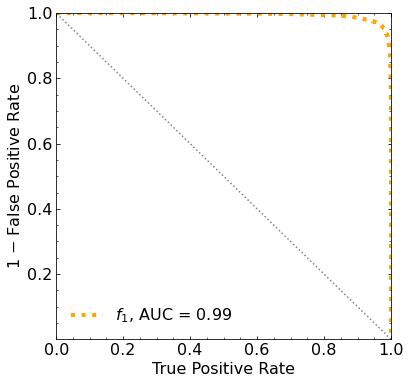

In [9]:
m_it = 1


# set the parameters
mDM = mDM_mDM[m_it]
S_cross1045 = S_cross1045_mDM[m_it]
S_expected = S_expected_mDM[m_it]

print('\n#########################\n')
print('mDM = ', mDM, 'GeV\n')


##########
# SIGNAL #
##########

S_cs1 = np.loadtxt(filefolder + 'WIMP_' + str(mDM) + 'GeV_cs1.txt')
S_cs2 = np.loadtxt(filefolder + 'WIMP_' + str(mDM) + 'GeV_cs2.txt')

print('\nS_cs1.shape: ', S_cs1.shape)
print('S_cs2.shape: ', S_cs2.shape)

S_cs1_aux = [S_cs1[x] for x in range(len(S_cs1)) if (3 < S_cs1[x] < 70 and 50 < S_cs2[x] < 8000)]
S_cs2 = [S_cs2[x] for x in range(len(S_cs1)) if (3 < S_cs1[x] < 70 and 50 < S_cs2[x] < 8000)]
S_cs1 = S_cs1_aux


# set events per classs
NUM_DAT = min(len(B_cs1_ER), len(S_cs1))
print(' NUM_DAT: ', NUM_DAT, '\n')

NUM_DAT_AC = int(NUM_DAT*f_AC)
NUM_DAT_CNNS = max(1, int(NUM_DAT*f_CNNS))
NUM_DAT_RN = int(NUM_DAT*f_RN)
NUM_DAT_WALL = int(NUM_DAT*f_WALL)

NUM_DAT_ER = NUM_DAT - ( NUM_DAT_AC + NUM_DAT_CNNS + NUM_DAT_RN + NUM_DAT_WALL )

print('NUM_DAT_ER: ', NUM_DAT_ER)
print('NUM_DAT_AC: ', NUM_DAT_AC)
print('NUM_DAT_CNNS: ', NUM_DAT_CNNS)
print('NUM_DAT_RN: ', NUM_DAT_RN)
print('NUM_DAT_WALL: ', NUM_DAT_WALL)



# CONCATENATE THE BACKGROUNDS
B_cs1cs2 = np.concatenate([np.stack([B_cs1_ER,B_cs2_ER],axis=1)[:NUM_DAT_ER], np.stack([B_cs1_AC,B_cs2_AC],axis=1)[:NUM_DAT_AC], np.stack([B_cs1_CNNS,B_cs2_CNNS],axis=1)[:NUM_DAT_CNNS], np.stack([B_cs1_RN,B_cs2_RN],axis=1)[:NUM_DAT_RN], np.stack([B_cs1_WALL,B_cs2_WALL],axis=1)[:NUM_DAT_WALL]])

print('\nB_cs1cs2.shape: ', B_cs1cs2.shape)


S_cs1cs2 = np.stack([S_cs1,S_cs2],axis=1)[:NUM_DAT]


print('\nS_cs1cs2.shape: ', S_cs1cs2.shape)


rnd = 100

B_cs1cs2_plot = shuffle(B_cs1cs2, random_state=rnd)
S_cs1cs2_plot = shuffle(S_cs1cs2, random_state=rnd)

plt.plot(B_cs1cs2_plot[:,0][:1000], B_cs1cs2_plot[:,1][:1000], '.', color='black', alpha=0.5, label='B')
plt.plot(S_cs1cs2_plot[:,0][:1000], S_cs1cs2_plot[:,1][:1000], '.', color='red', alpha=0.5, label='S')
plt.yscale('log')
# plt.xlim([0,100])
plt.ylim([100,10000])
plt.xlabel('s1',fontsize=14)
plt.ylabel('s2',fontsize=14)
plt.legend(fontsize=14)
plt.show()



plt.plot(B_cs1cs2_plot[:,0][:1000], (B_cs1cs2_plot[:,1] / B_cs1cs2_plot[:,0])[:1000], '.', color='black', alpha=0.5, label='B')
plt.plot(S_cs1cs2_plot[:,0][:1000], (S_cs1cs2_plot[:,1] / S_cs1cs2_plot[:,0])[:1000], '.', color='red', alpha=0.5, label='S')
plt.yscale('log')
# plt.xlim([0,100])
# plt.ylim([100,10000])
plt.xlabel('s1',fontsize=14)
plt.ylabel('s2/s1',fontsize=14)
plt.legend(fontsize=14)
plt.show()


############
# DATASETS #
############

# concatenate the data
X_mon_B = B_cs1cs2
X_mon_S = S_cs1cs2

# X_mon_B = np.reshape(B_pdiffT,(len(B_pdiffT),1))
# X_mon_S = np.reshape(S_pdiffT,(len(S_pdiffT),1))
print('X_mon_B.shape: ', X_mon_B.shape)
print('X_mon_S.shape: ', X_mon_S.shape)

# del B_ppeakS1
# del B_ppeakS2
# del B_pbot
# del B_ptop

# del S_ppeakS1
# del S_ppeakS2
# del S_pbot
# del S_ptop

X_mon = np.concatenate([X_mon_B, X_mon_S])

# X_mon = np.concatenate([np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(S_pbot,(len(S_pbot),1))])

print('X_mon.shape: ', X_mon.shape)
# del X_mon_B
# del X_mon_S


# labels
y_mon = np.concatenate([np.zeros(NUM_DAT),np.ones(NUM_DAT)])


# divide into train-val and test data samples
test_ratio = 0.25
val_ratio = 0.15


X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                y_mon,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_mon,
                                                                shuffle=True)

del X_mon
del y_mon

X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                  y_mon_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_mon_aux,
                                                                  shuffle=True)

del X_mon_aux
del y_mon_aux

print('')
print('X_mon_train : ', X_mon_train.shape)
print('y_mon_train : ', y_mon_train.shape)
print('X_mon_val : ', X_mon_val.shape)
print('y_mon_val : ', y_mon_val.shape)
print('X_mon_test : ', X_mon_test.shape)
print('y_mon_test : ', y_mon_test.shape)
print('')



###########
# XGBOOST #
###########

# XGBoost with only the kinematic variables of the leptons

# CLASSIFIER
classifier = XGBClassifier(
    n_estimators=2500,
    learning_rate=0.01,
    reg_lambda=0.01,reg_alpha=0.0,
    gamma=0.0,objective='binary:logistic',
    max_depth=5,
    #eval_metric=["error", "logloss", "map"]
    eval_metric='logloss')

# FIT
classifier.fit(X_mon_train,y_mon_train,eval_set=[(X_mon_train, y_mon_train), (X_mon_val, y_mon_val)],
        early_stopping_rounds=50,#early stopping
        verbose=True)


# PREDICTIONS
y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


# ROC
fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)


# PLOT THE ROC WITH AUC
fig = plt.figure(figsize=(6, 6))
gs = gridspec.GridSpec(1, 1) 
ax0 = plt.subplot(gs[0])
ax0.yaxis.set_ticks_position('both')
ax0.xaxis.set_ticks_position('both')
ax0.tick_params(direction="in",which="both")
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
ax0.minorticks_on()


plt.plot(tpr_mon_xg,1-fpr_mon_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()



#########################

mDM =  10 GeV


S_cs1.shape:  (34190,)
S_cs2.shape:  (34190,)
 NUM_DAT:  31606 

NUM_DAT_ER:  31203
NUM_DAT_AC:  111
NUM_DAT_CNNS:  1
NUM_DAT_RN:  29
NUM_DAT_WALL:  262

B_cs1cs2.shape:  (31606, 2)

S_cs1cs2.shape:  (31606, 2)


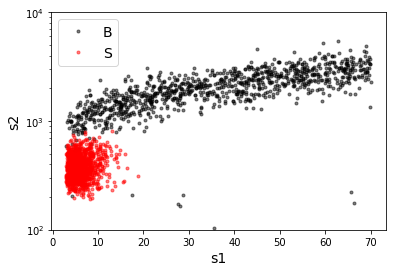

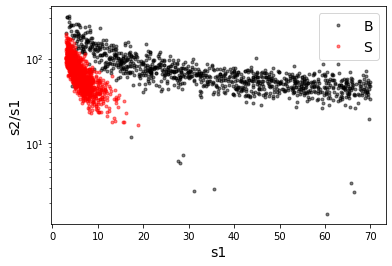

X_mon_B.shape:  (31606, 2)
X_mon_S.shape:  (31606, 2)
X_mon.shape:  (63212, 2)

X_mon_train :  (40297, 2)
y_mon_train :  (40297,)
X_mon_val :  (7112, 2)
y_mon_val :  (7112,)
X_mon_test :  (15803, 2)
y_mon_test :  (15803,)

Classification score:


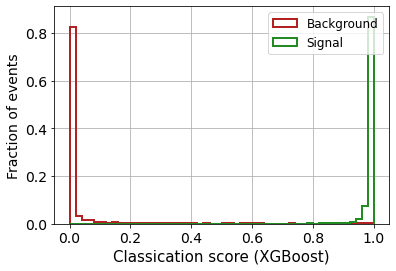


 ROC-AUC =  0.9982097081993028
At least 5 B events per bin, range = [[0, 1]]:
# bins:  7 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  7
range of our data:  [[0, 1]]
number of bins we are going to use:  7
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.645


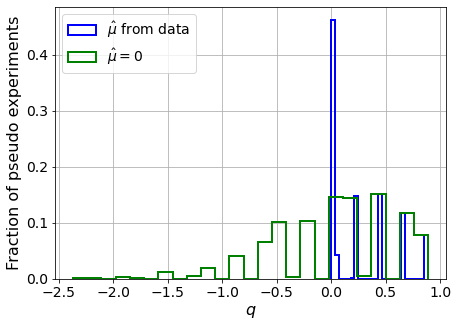

muhat mean:  0.26989890868447564
Z_bins:  0.1976752164342334
std Z_bins:  0.7415747132558018
Z_bins mu=0:  0.14974056150198986
std Z_bins mu=0:  1.8793553456296073

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6545


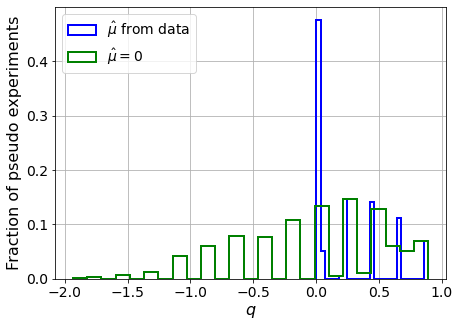

muhat mean:  0.5065652105167217
Z_bins:  0.1922601786026895
std Z_bins:  0.7483501457037965
Z_bins mu=0:  0.1376040051151055
std Z_bins mu=0:  2.101700213893104

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6515


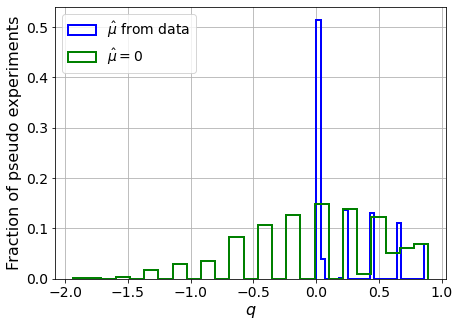

muhat mean:  0.4588617124208088
Z_bins:  0.1862912543371338
std Z_bins:  0.7751201733432338
Z_bins mu=0:  0.12286217364539322
std Z_bins mu=0:  2.2329457726338076

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6525


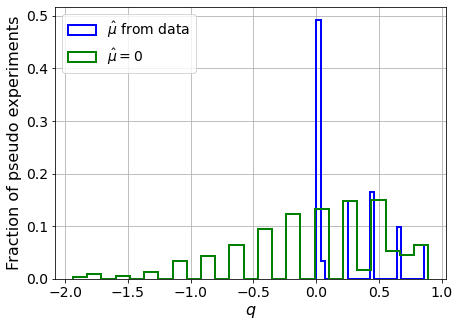

muhat mean:  0.4942294160788893
Z_bins:  0.19045699684874343
std Z_bins:  0.7378400274078519
Z_bins mu=0:  0.13332019290736966
std Z_bins mu=0:  2.165011022647206

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.666


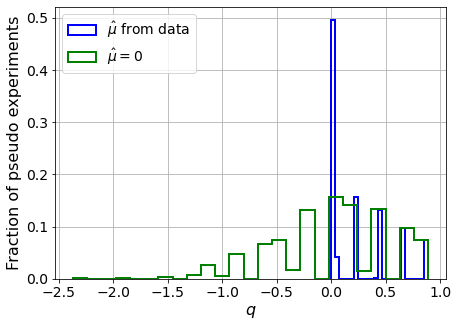

muhat mean:  0.37073077236542273
Z_bins:  0.19005690583747728
std Z_bins:  0.7557339456306568
Z_bins mu=0:  0.13235202417272518
std Z_bins mu=0:  2.028088514841481

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.648


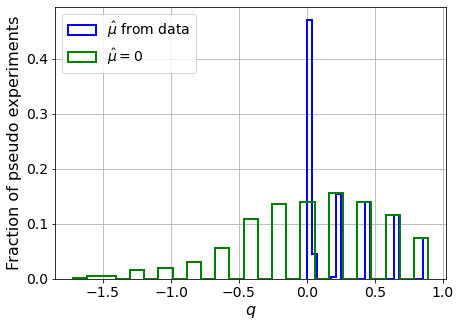

muhat mean:  0.2591821993706349
Z_bins:  0.1948282930519611
std Z_bins:  0.7463223651928882
Z_bins mu=0:  0.14348703181209205
std Z_bins mu=0:  1.856940622647203

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6535


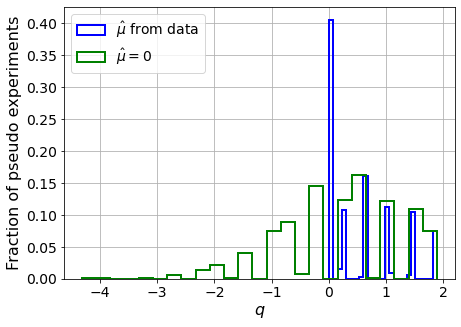

muhat mean:  0.20048428323266018
Z_bins:  0.496191564160744
std Z_bins:  0.6220939629055408
Z_bins mu=0:  0.47740756371999693
std Z_bins mu=0:  1.0994531848161906

--------

B_expected:  643
S_expected:  5

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.64


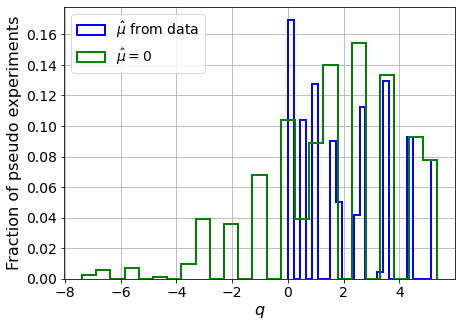

muhat mean:  0.09992792237084648
Z_bins:  1.3095148946412603
std Z_bins:  0.6308490195247042
Z_bins mu=0:  1.3023044370123291
std Z_bins mu=0:  0.9249904094224873

--------

B_expected:  643
S_expected:  9

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6675


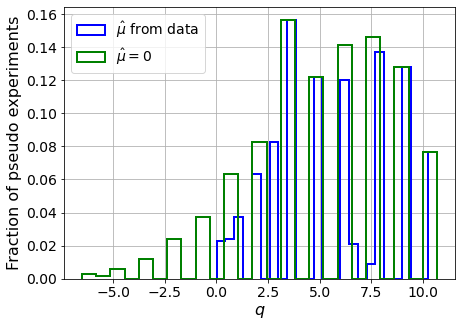

muhat mean:  0.026099781016968672
Z_bins:  2.2426816653559256
std Z_bins:  0.6466255351713309
Z_bins mu=0:  2.2388758225018517
std Z_bins mu=0:  0.7958323592666896

--------

B_expected:  643
S_expected:  18

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6805


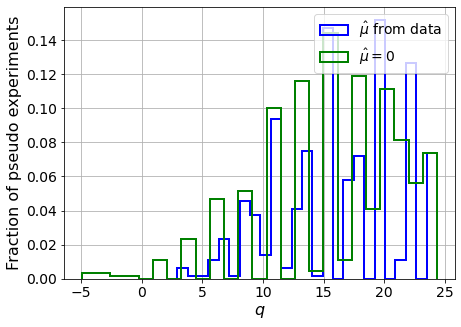

muhat mean:  0.011434696817695376
Z_bins:  3.9261840017835237
std Z_bins:  0.6329101368658044
Z_bins mu=0:  3.924024082683272
std Z_bins mu=0:  0.725038076085031

--------

B_expected:  643
S_expected:  34

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6535


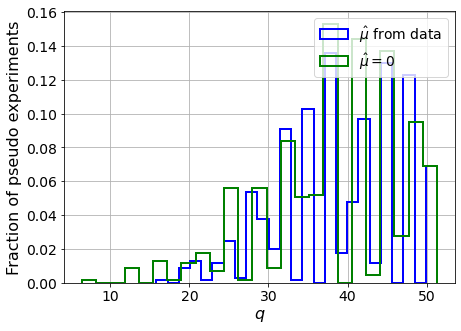

muhat mean:  0.012297313757834948
Z_bins:  6.205564964873603
std Z_bins:  0.6159785247373951
Z_bins mu=0:  6.20413854708533
std Z_bins mu=0:  0.6886289018866348

--------

B_expected:  643
S_expected:  66

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6645


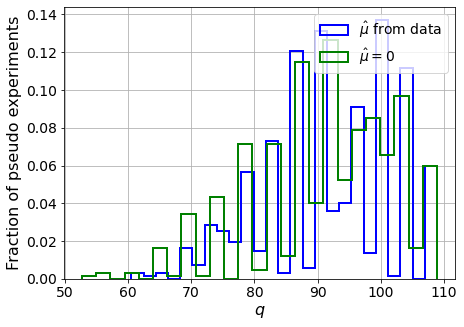

muhat mean:  0.006473346952805085
Z_bins:  9.560158090345155
std Z_bins:  0.5312572408297229
Z_bins mu=0:  9.559161571677592
std Z_bins mu=0:  0.5718660453213759

--------

B_expected:  643
S_expected:  126

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.653


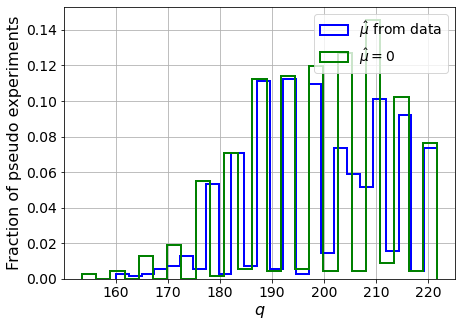

muhat mean:  0.0029566096464244576
Z_bins:  14.11495892603827
std Z_bins:  0.4674569094316963
Z_bins mu=0:  14.114301448858564
std Z_bins mu=0:  0.49195664208142187

--------

B_expected:  643
S_expected:  244

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.652


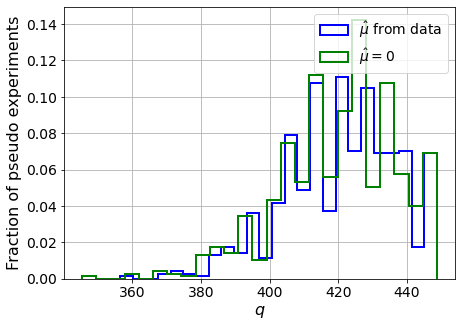

muhat mean:  0.0016002618526951514
Z_bins:  20.519306928824243
std Z_bins:  0.3954311094969454
Z_bins mu=0:  20.518862495101
std Z_bins mu=0:  0.41536099096060775

--------

B_expected:  643
S_expected:  471

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.657


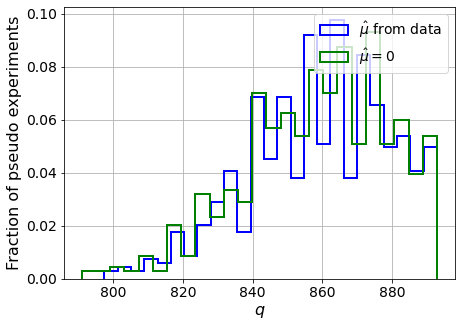

muhat mean:  0.00033287231834128287
Z_bins:  29.339319657570734
std Z_bins:  0.33640437211612445
Z_bins mu=0:  29.339183637609647
std Z_bins mu=0:  0.34828097543581554

--------


 FINAL RESULT:

[[0.1976752164342334, 0.7415747132558018, 0.26989890868447564, 0.14974056150198986, 1.8793553456296073], [0.1922601786026895, 0.7483501457037965, 0.5065652105167217, 0.1376040051151055, 2.101700213893104], [0.1862912543371338, 0.7751201733432338, 0.4588617124208088, 0.12286217364539322, 2.2329457726338076], [0.19045699684874343, 0.7378400274078519, 0.4942294160788893, 0.13332019290736966, 2.165011022647206], [0.19005690583747728, 0.7557339456306568, 0.37073077236542273, 0.13235202417272518, 2.028088514841481], [0.1948282930519611, 0.7463223651928882, 0.2591821993706349, 0.14348703181209205, 1.856940622647203], [0.496191564160744, 0.6220939629055408, 0.20048428323266018, 0.47740756371999693, 1.0994531848161906], [1.3095148946412603, 0.6308490195247042, 0.09992792237084648, 1.3023044370123291, 0

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 425.94043171 357.8515595  291.05819934
 218.21396551 140.83557521  65.50075102 -14.63168277 -91.70343595]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf 467.08336851 385.87840716
 296

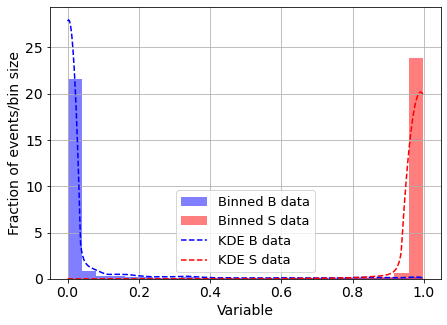

KDE Kernel:  epanechnikov
Background bandwidth:  0.03613222756796251
Signal bandwidth:  0.059027261020128646
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


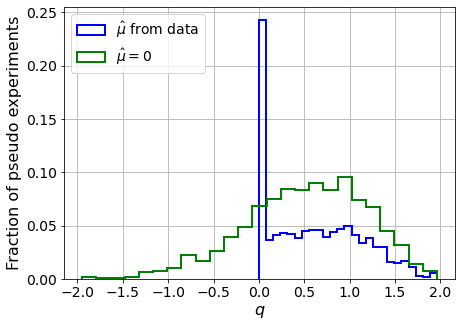

muhat mean:  -3.938453466929619
Z_bins:  0.7524393532808024
std Z_bins:  0.33765628244422846
Z_bins mu=0:  0.7524393532808024
std Z_bins mu=0:  0.43894530419387917

--------

B_expected:  643
S_expected:  1



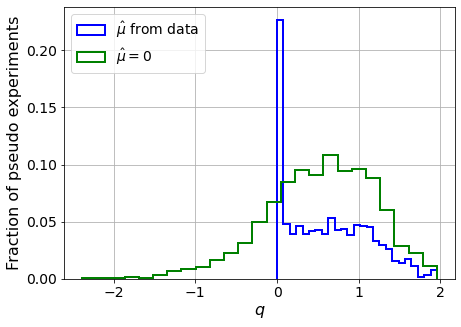

muhat mean:  -4.395221438049423
Z_bins:  0.7673113622181714
std Z_bins:  0.3306883446509024
Z_bins mu=0:  0.7673113622181714
std Z_bins mu=0:  0.4308186966383908

--------

B_expected:  643
S_expected:  1



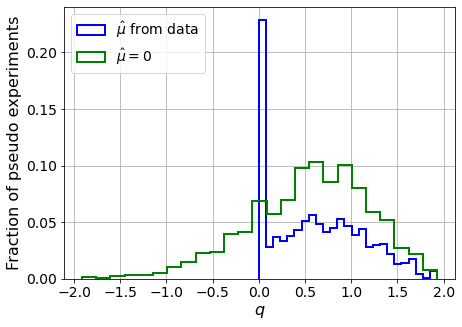

muhat mean:  -3.675391784109638
Z_bins:  0.7707888057809612
std Z_bins:  0.32439286975638054
Z_bins mu=0:  0.7707888057809612
std Z_bins mu=0:  0.41980624485475376

--------

B_expected:  643
S_expected:  1



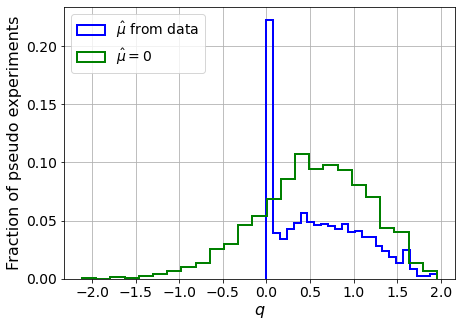

muhat mean:  -2.959406499802958
Z_bins:  0.7501827071389569
std Z_bins:  0.3323285744505485
Z_bins mu=0:  0.7501827071389569
std Z_bins mu=0:  0.42367823835518265

--------

B_expected:  643
S_expected:  1



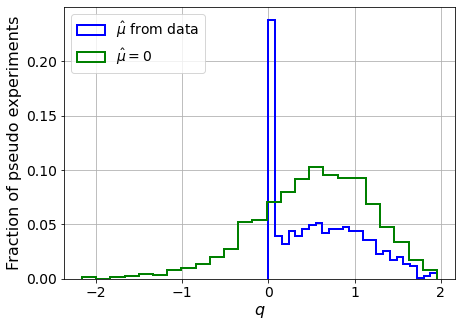

muhat mean:  -2.5471094030889807
Z_bins:  0.7533247010308325
std Z_bins:  0.33229345612558886
Z_bins mu=0:  0.7533247010308325
std Z_bins mu=0:  0.43529027819420596

--------

B_expected:  643
S_expected:  1



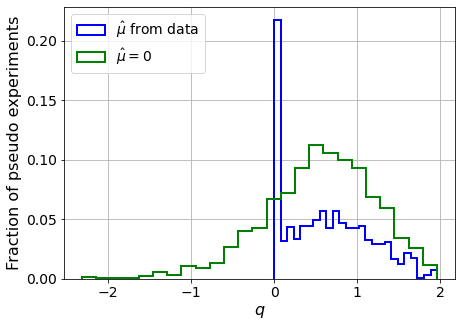

muhat mean:  -4.400858351780315
Z_bins:  0.7703747460477329
std Z_bins:  0.32977056266126964
Z_bins mu=0:  0.7703747460477329
std Z_bins mu=0:  0.4269188758951175

--------

B_expected:  643
S_expected:  2



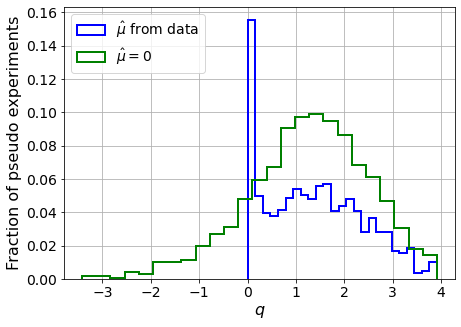

muhat mean:  -3.2758235070427713
Z_bins:  1.1519001135441447
std Z_bins:  0.436101080104254
Z_bins mu=0:  1.1519001135441447
std Z_bins mu=0:  0.5354886428726388

--------

B_expected:  643
S_expected:  5



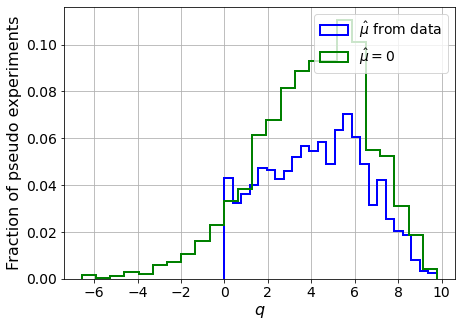

muhat mean:  -1.0015753079943208
Z_bins:  2.08147842819321
std Z_bins:  0.5436594958214314
Z_bins mu=0:  2.08147842819321
std Z_bins mu=0:  0.6248896117718082

--------

B_expected:  643
S_expected:  9



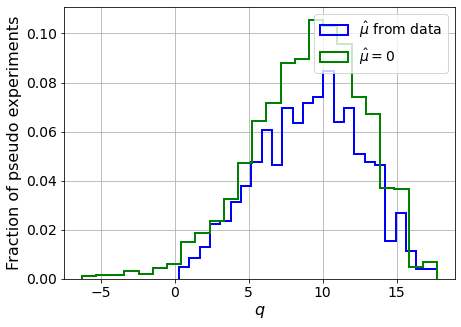

muhat mean:  -0.48346666915000636
Z_bins:  3.057563285776527
std Z_bins:  0.5692660890902874
Z_bins mu=0:  3.057563285776527
std Z_bins mu=0:  0.6190913068077681

--------

B_expected:  643
S_expected:  18



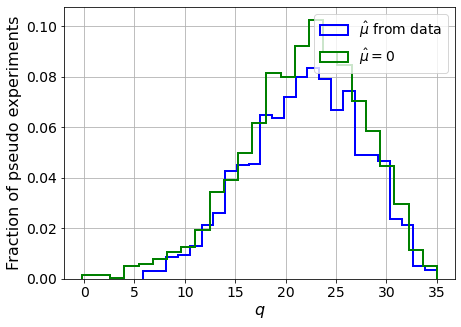

muhat mean:  -0.16310510558551714
Z_bins:  4.716039804655475
std Z_bins:  0.5873195993727017
Z_bins mu=0:  4.716039804655475
std Z_bins mu=0:  0.622994710523139

--------

B_expected:  643
S_expected:  34



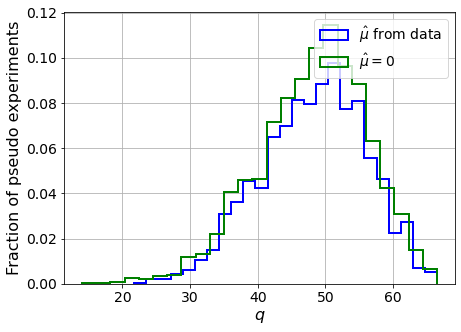

muhat mean:  -0.1946732169242174
Z_bins:  6.984821272883608
std Z_bins:  0.553519728676488
Z_bins mu=0:  6.984821272883608
std Z_bins mu=0:  0.5763894593848438

--------

B_expected:  643
S_expected:  66



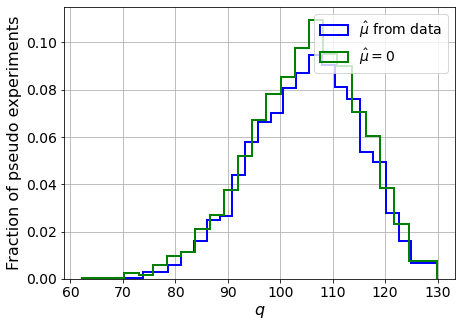

muhat mean:  -0.07511792806992937
Z_bins:  10.273978558861572
std Z_bins:  0.4990155380867672
Z_bins mu=0:  10.273978558861572
std Z_bins mu=0:  0.5122416975994678

--------

B_expected:  643
S_expected:  126



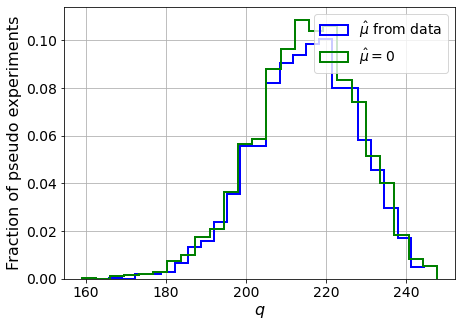

muhat mean:  -0.045314104128210325
Z_bins:  14.68211688073651
std Z_bins:  0.43841579907113576
Z_bins mu=0:  14.68211688073651
std Z_bins mu=0:  0.44789655115411625

--------

B_expected:  643
S_expected:  244



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.
  warnings.warn(msg, RuntimeWarning)


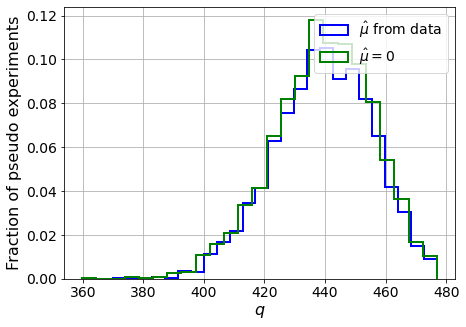

muhat mean:  -0.029654406760387605
Z_bins:  20.972999414382137
std Z_bins:  0.38577262461651185
Z_bins mu=0:  20.972999414382137
std Z_bins mu=0:  0.3932130554510203

--------

B_expected:  643
S_expected:  471



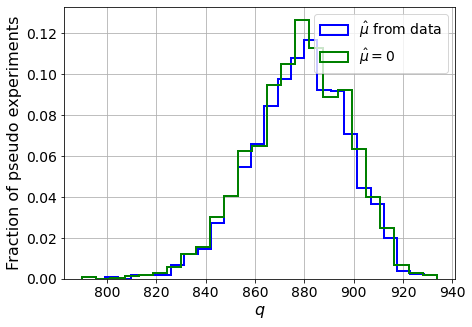

muhat mean:  -0.007997230049175217
Z_bins:  29.649936818057153
std Z_bins:  0.33077444922525073
Z_bins mu=0:  29.649936818057153
std Z_bins mu=0:  0.33631686799954513

--------


 FINAL RESULT:

[[0.7524393532808024, 0.33765628244422846, -3.938453466929619, 0.7524393532808024, 0.43894530419387917], [0.7673113622181714, 0.3306883446509024, -4.395221438049423, 0.7673113622181714, 0.4308186966383908], [0.7707888057809612, 0.32439286975638054, -3.675391784109638, 0.7707888057809612, 0.41980624485475376], [0.7501827071389569, 0.3323285744505485, -2.959406499802958, 0.7501827071389569, 0.42367823835518265], [0.7533247010308325, 0.33229345612558886, -2.5471094030889807, 0.7533247010308325, 0.43529027819420596], [0.7703747460477329, 0.32977056266126964, -4.400858351780315, 0.7703747460477329, 0.4269188758951175], [1.1519001135441447, 0.436101080104254, -3.2758235070427713, 1.1519001135441447, 0.5354886428726388], [2.08147842819321, 0.5436594958214314, -1.0015753079943208, 2.08147842819321, 0.6

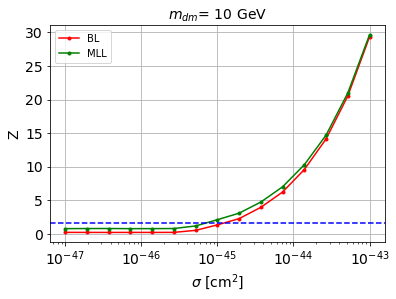


cross_BL_164:  1.262370879480838e-45
cross_BL_164_up:  8.120156396759621e-46
cross_BL_164_down:  1.9925089140463956e-45

cross_MLL_164:  7.426305649521964e-46
cross_MLL_164_up:  5.236092462790996e-46
cross_MLL_164_down:  1.0732865445255962e-45

#########################


#########################

mDM =  20 GeV


S_cs1.shape:  (33873,)
S_cs2.shape:  (33873,)
 NUM_DAT:  33001 

NUM_DAT_ER:  32580
NUM_DAT_AC:  116
NUM_DAT_CNNS:  1
NUM_DAT_RN:  30
NUM_DAT_WALL:  274

B_cs1cs2.shape:  (33001, 2)

S_cs1cs2.shape:  (33001, 2)


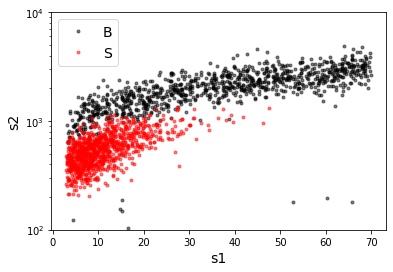

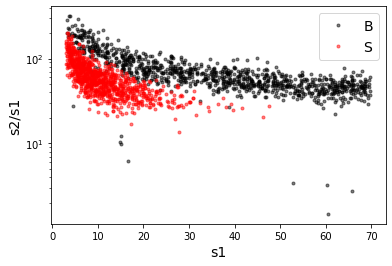

X_mon_B.shape:  (33001, 2)
X_mon_S.shape:  (33001, 2)
X_mon.shape:  (66002, 2)

X_mon_train :  (42075, 2)
y_mon_train :  (42075,)
X_mon_val :  (7426, 2)
y_mon_val :  (7426,)
X_mon_test :  (16501, 2)
y_mon_test :  (16501,)

Classification score:


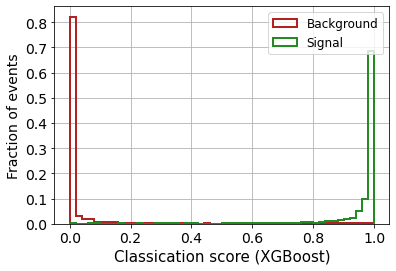


 ROC-AUC =  0.9940985733100339
At least 5 B events per bin, range = [[0, 1]]:
# bins:  8 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  8
range of our data:  [[0, 1]]
number of bins we are going to use:  8
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.852


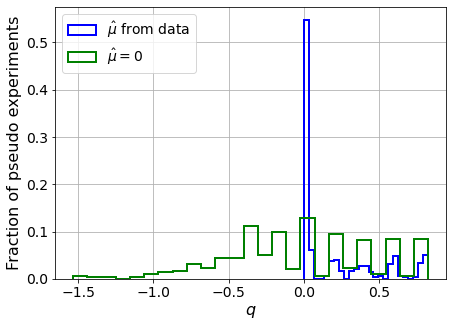

muhat mean:  0.6212758159042798
Z_bins:  0.12861374973591932
std Z_bins:  1.0471011650853268
Z_bins mu=0:  0.10110473158428837
std Z_bins mu=0:  2.4409895631490865

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.8495


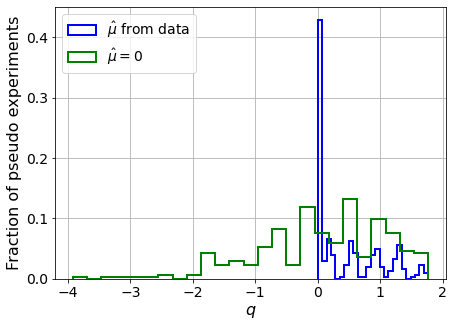

muhat mean:  0.39215316939876044
Z_bins:  0.4187828158721415
std Z_bins:  0.6241931737867298
Z_bins mu=0:  0.3913546934800338
std Z_bins mu=0:  1.3084640902355205

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.8575


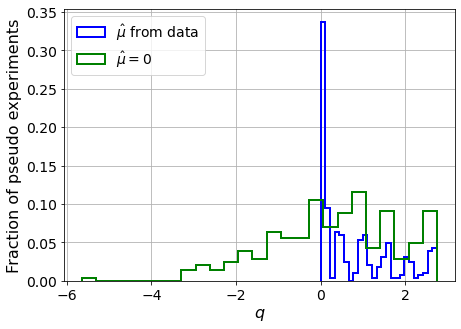

muhat mean:  0.25772724492239446
Z_bins:  0.6655558130123638
std Z_bins:  0.6578487626612066
Z_bins mu=0:  0.6455866901595827
std Z_bins mu=0:  1.1460329453716547

--------

B_expected:  643
S_expected:  6

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.852


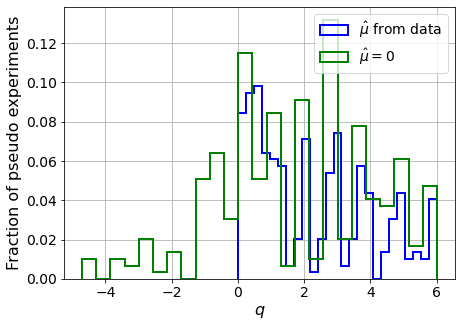

muhat mean:  0.10595032948828587
Z_bins:  1.4029769728660315
std Z_bins:  0.6252172987346013
Z_bins mu=0:  1.3962815992575612
std Z_bins mu=0:  0.8366303996643607

--------

B_expected:  643
S_expected:  12

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.849


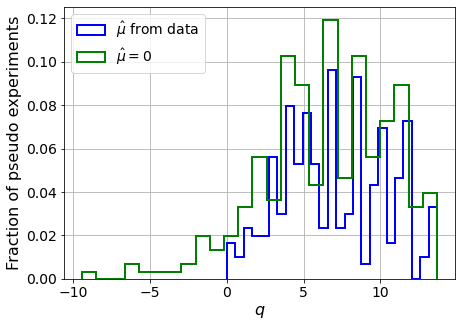

muhat mean:  0.052802560008670216
Z_bins:  2.601681540296419
std Z_bins:  0.6372199141000282
Z_bins mu=0:  2.598095944494677
std Z_bins mu=0:  0.7902109980212484

--------

B_expected:  643
S_expected:  23

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.8505


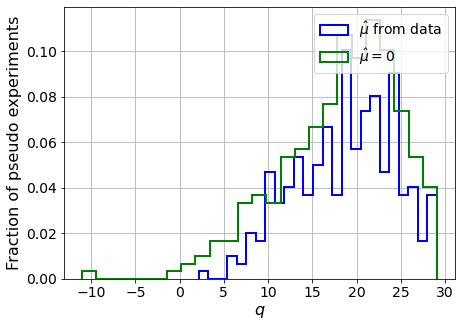

muhat mean:  0.0350984500840075
Z_bins:  4.381432105310291
std Z_bins:  0.6357096662997781
Z_bins mu=0:  4.379911202927967
std Z_bins mu=0:  0.7553271672407198

--------

B_expected:  643
S_expected:  44

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.8385


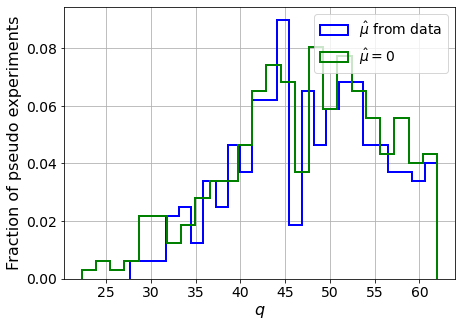

muhat mean:  0.011757421882135903
Z_bins:  6.918654028930418
std Z_bins:  0.5690191790157639
Z_bins mu=0:  6.917578140323117
std Z_bins mu=0:  0.6192827735928336

--------

B_expected:  643
S_expected:  85

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.8265


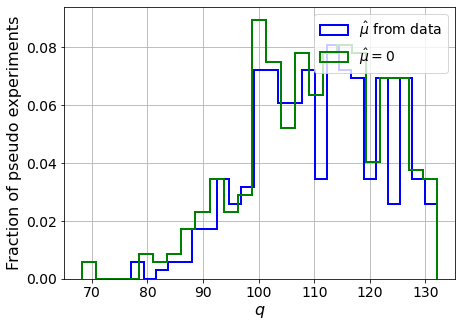

muhat mean:  0.007840101132436352
Z_bins:  10.523962334414282
std Z_bins:  0.5398698924135551
Z_bins mu=0:  10.522826240436965
std Z_bins mu=0:  0.5794018888067176

--------

B_expected:  643
S_expected:  165

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.845


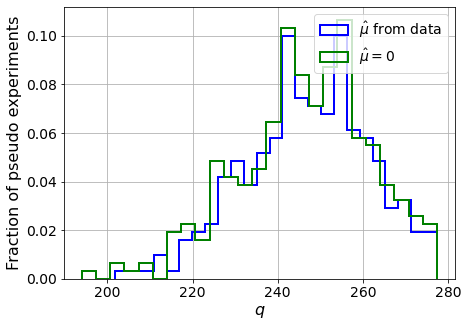

muhat mean:  0.0034598242477578926
Z_bins:  15.727201867816918
std Z_bins:  0.46074564175369265
Z_bins mu=0:  15.726358235580392
std Z_bins mu=0:  0.4859077249964661

--------

B_expected:  643
S_expected:  318

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.848


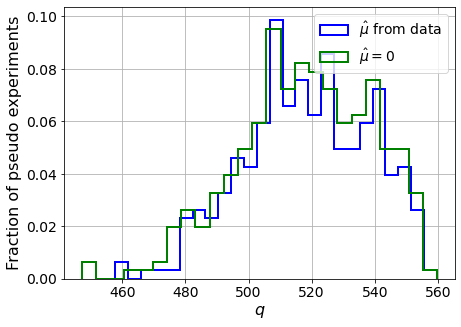

muhat mean:  0.0028937041813278715
Z_bins:  22.779136746330828
std Z_bins:  0.43575671083682493
Z_bins mu=0:  22.77830820817677
std Z_bins mu=0:  0.45878426416981594

--------

B_expected:  643
S_expected:  615

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.836


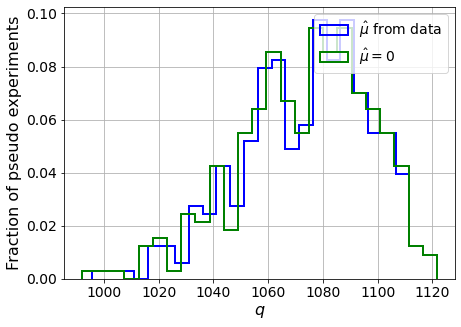

muhat mean:  0.0005046152351486438
Z_bins:  32.82409799486374
std Z_bins:  0.3528149012567293
Z_bins mu=0:  32.82385640975779
std Z_bins mu=0:  0.3651998367125555

--------

B_expected:  643
S_expected:  1187

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.8495


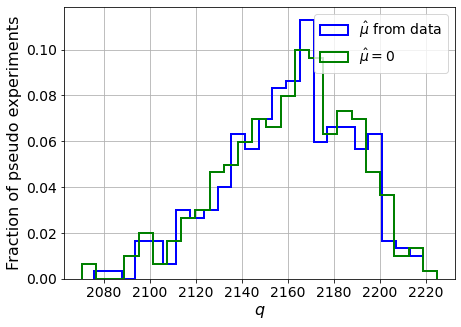

muhat mean:  0.0004425729742865904
Z_bins:  46.519144346268725
std Z_bins:  0.2947098946508133
Z_bins mu=0:  46.519144346268725
std Z_bins mu=0:  0.30348860678402706

--------

B_expected:  643
S_expected:  2291

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.853


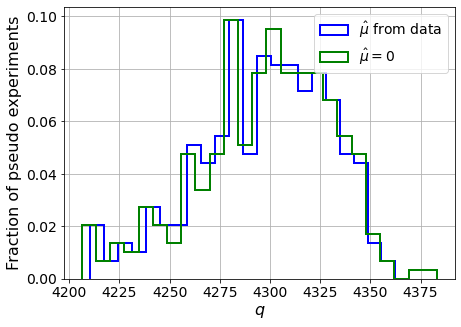

muhat mean:  0.0001935713958578356
Z_bins:  65.5753676103857
std Z_bins:  0.24983600204543546
Z_bins mu=0:  65.57469454338218
std Z_bins mu=0:  0.2556807792738627

--------

B_expected:  643
S_expected:  4424

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.83


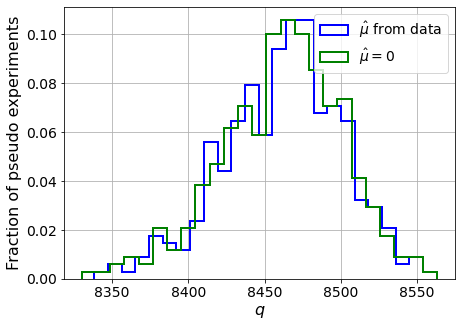

muhat mean:  0.000240313195720734
Z_bins:  92.00864799364028
std Z_bins:  0.21134631479529434
Z_bins mu=0:  92.00797472208617
std Z_bins mu=0:  0.2159061466784707

--------

B_expected:  643
S_expected:  8542

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.8395


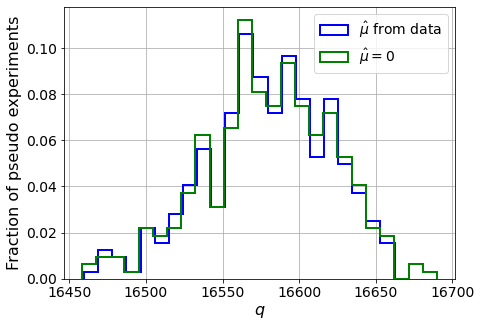

muhat mean:  5.227349683167091e-05
Z_bins:  128.76945473417095
std Z_bins:  0.160183414304597
Z_bins mu=0:  128.76895546562426
std Z_bins mu=0:  0.16197289290060937

--------


 FINAL RESULT:

[[0.12861374973591932, 1.0471011650853268, 0.6212758159042798, 0.10110473158428837, 2.4409895631490865], [0.4187828158721415, 0.6241931737867298, 0.39215316939876044, 0.3913546934800338, 1.3084640902355205], [0.6655558130123638, 0.6578487626612066, 0.25772724492239446, 0.6455866901595827, 1.1460329453716547], [1.4029769728660315, 0.6252172987346013, 0.10595032948828587, 1.3962815992575612, 0.8366303996643607], [2.601681540296419, 0.6372199141000282, 0.052802560008670216, 2.598095944494677, 0.7902109980212484], [4.381432105310291, 0.6357096662997781, 0.0350984500840075, 4.379911202927967, 0.7553271672407198], [6.918654028930418, 0.5690191790157639, 0.011757421882135903, 6.917578140323117, 0.6192827735928336], [10.523962334414282, 0.5398698924135551, 0.007840101132436352, 10.522826240436965, 0.5794

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 435.09704041 365.43167383 295.89215085
 221.01027887 143.96635851  66.47318043 -13.23363789 -91.0224262 ]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf 345.65512357 287.1055502
 223.

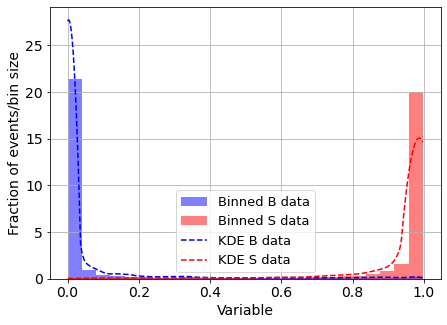

KDE Kernel:  epanechnikov
Background bandwidth:  0.03613222756796251
Signal bandwidth:  0.059027261020128646
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



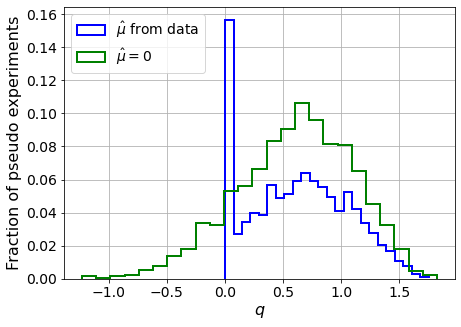

muhat mean:  -5.285461118943544
Z_bins:  0.801553951844455
std Z_bins:  0.2697922017442202
Z_bins mu=0:  0.801553951844455
std Z_bins mu=0:  0.30933357000425865

--------

B_expected:  643
S_expected:  2



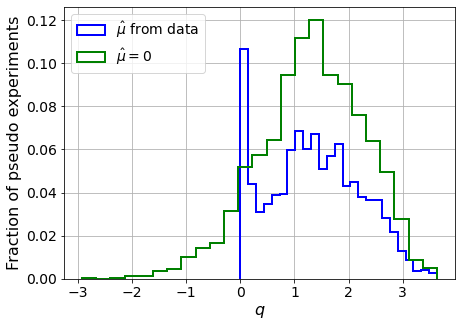

muhat mean:  -2.0732994050523503
Z_bins:  1.1601490315073169
std Z_bins:  0.3677664642316233
Z_bins mu=0:  1.1601490315073169
std Z_bins mu=0:  0.41362400899794904

--------

B_expected:  643
S_expected:  3



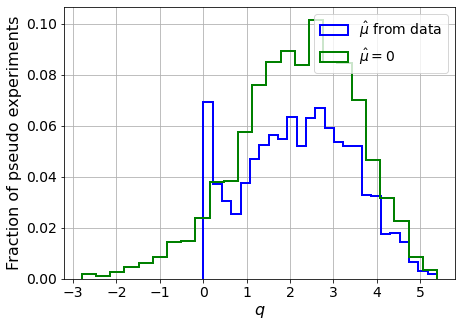

muhat mean:  -1.6879187884897315
Z_bins:  1.504163290401846
std Z_bins:  0.41070243102173515
Z_bins mu=0:  1.504163290401846
std Z_bins mu=0:  0.45272642063298424

--------

B_expected:  643
S_expected:  6



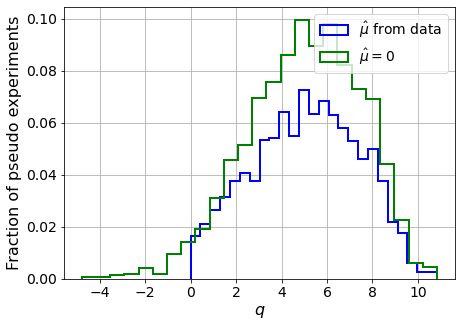

muhat mean:  -0.7429322829068142
Z_bins:  2.2698284052164337
std Z_bins:  0.5117493401167116
Z_bins mu=0:  2.2698284052164337
std Z_bins mu=0:  0.5425535324406341

--------

B_expected:  643
S_expected:  12



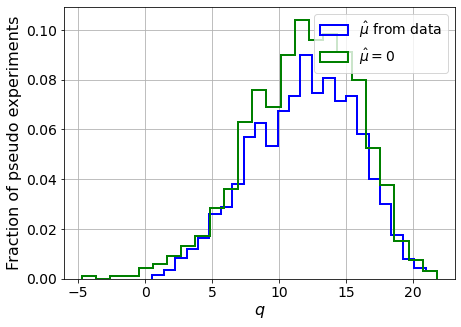

muhat mean:  -0.3300535954489699
Z_bins:  3.4753506910351453
std Z_bins:  0.5604154920713655
Z_bins mu=0:  3.4753506910351453
std Z_bins mu=0:  0.5841547112120188

--------

B_expected:  643
S_expected:  23



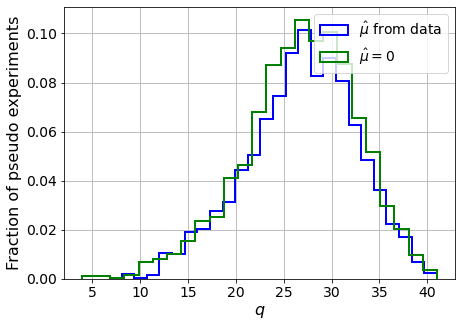

muhat mean:  -0.18075212238067773
Z_bins:  5.220337986582326
std Z_bins:  0.5454506028669972
Z_bins mu=0:  5.220337986582326
std Z_bins mu=0:  0.559281153506568

--------

B_expected:  643
S_expected:  44



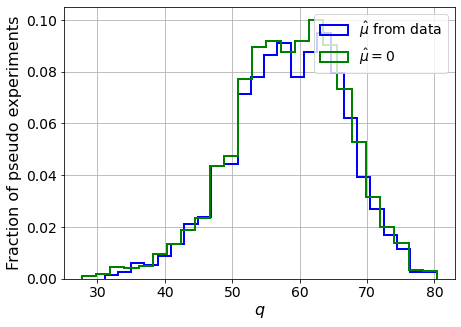

muhat mean:  -0.09464539835675698
Z_bins:  7.6641125070970935
std Z_bins:  0.5372301120558216
Z_bins mu=0:  7.6641125070970935
std Z_bins mu=0:  0.5468933709797559

--------

B_expected:  643
S_expected:  85



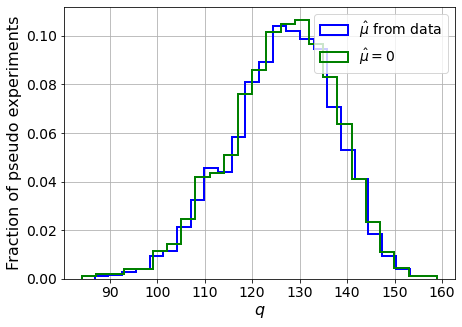

muhat mean:  -0.05232539271195527
Z_bins:  11.274256684613787
std Z_bins:  0.4926537202563916
Z_bins mu=0:  11.274256684613787
std Z_bins mu=0:  0.4986372250976575

--------

B_expected:  643
S_expected:  165



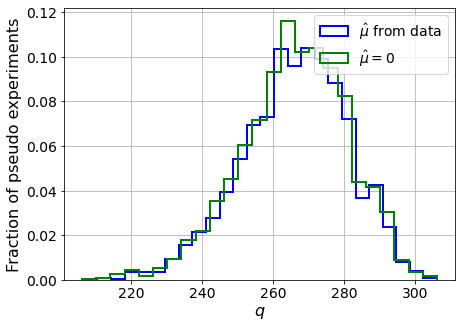

muhat mean:  -0.021695192492329676
Z_bins:  16.341917503640627
std Z_bins:  0.4554412859590507
Z_bins mu=0:  16.341917503640627
std Z_bins mu=0:  0.4608633447187696

--------

B_expected:  643
S_expected:  318



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


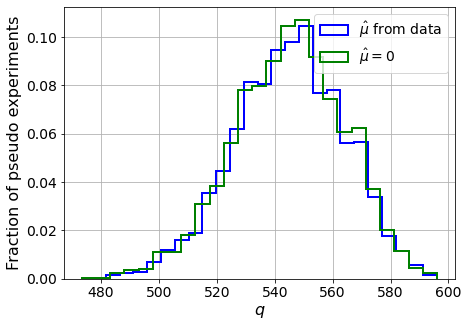

muhat mean:  -0.012698195416924917
Z_bins:  23.35507500330544
std Z_bins:  0.4068649072050029
Z_bins mu=0:  23.35507500330544
std Z_bins mu=0:  0.4101299526393378

--------

B_expected:  643
S_expected:  615



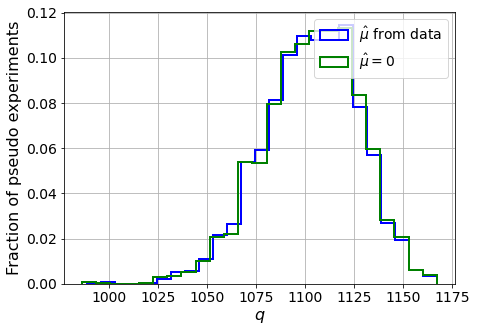

muhat mean:  -0.007733021428400196
Z_bins:  33.23034111397315
std Z_bins:  0.36586697527374745
Z_bins mu=0:  33.23034111397315
std Z_bins mu=0:  0.36857013248427545

--------

B_expected:  643
S_expected:  1187



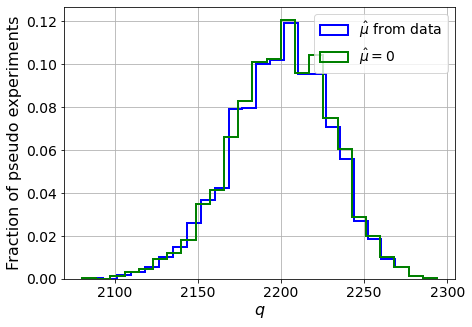

muhat mean:  -0.003699388298869228
Z_bins:  46.92409715040011
std Z_bins:  0.3199520397588979
Z_bins mu=0:  46.92409715040011
std Z_bins mu=0:  0.3215697114455518

--------

B_expected:  643
S_expected:  2291



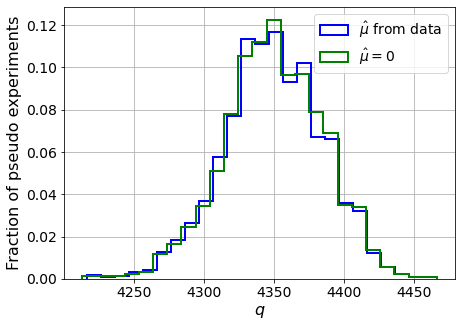

muhat mean:  -0.001656777749152122
Z_bins:  65.94850237235904
std Z_bins:  0.2681169039110176
Z_bins mu=0:  65.94824133670589
std Z_bins mu=0:  0.26895727509926576

--------

B_expected:  643
S_expected:  4424



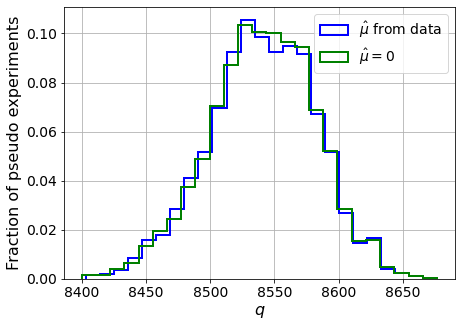

muhat mean:  -0.000924537388696756
Z_bins:  92.41769739013147
std Z_bins:  0.2238204610553986
Z_bins mu=0:  92.41769739013147
std Z_bins mu=0:  0.22438863865154135

--------

B_expected:  643
S_expected:  8542



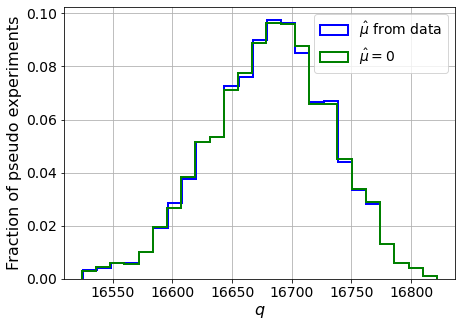

muhat mean:  -0.000513489731011385
Z_bins:  129.16654641502996
std Z_bins:  0.19459582060671218
Z_bins mu=0:  129.16654641502996
std Z_bins mu=0:  0.1949954347311123

--------


 FINAL RESULT:

[[0.801553951844455, 0.2697922017442202, -5.285461118943544, 0.801553951844455, 0.30933357000425865], [1.1601490315073169, 0.3677664642316233, -2.0732994050523503, 1.1601490315073169, 0.41362400899794904], [1.504163290401846, 0.41070243102173515, -1.6879187884897315, 1.504163290401846, 0.45272642063298424], [2.2698284052164337, 0.5117493401167116, -0.7429322829068142, 2.2698284052164337, 0.5425535324406341], [3.4753506910351453, 0.5604154920713655, -0.3300535954489699, 3.4753506910351453, 0.5841547112120188], [5.220337986582326, 0.5454506028669972, -0.18075212238067773, 5.220337986582326, 0.559281153506568], [7.6641125070970935, 0.5372301120558216, -0.09464539835675698, 7.6641125070970935, 0.5468933709797559], [11.274256684613787, 0.4926537202563916, -0.05232539271195527, 11.274256684613787, 0.4

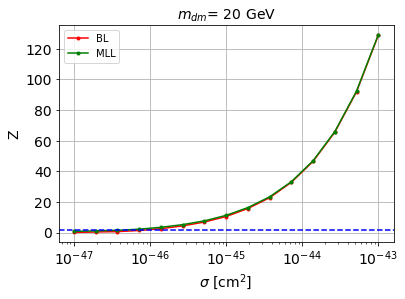


cross_BL_164:  8.196678465156648e-47
cross_BL_164_up:  5.009253458674365e-47
cross_BL_164_down:  1.1607499908844029e-46

cross_MLL_164:  4.189065642914612e-47
cross_MLL_164_up:  2.3360097779749336e-47
cross_MLL_164_down:  6.729461399988927e-47

#########################


#########################

mDM =  35 GeV


S_cs1.shape:  (33697,)
S_cs2.shape:  (33697,)
 NUM_DAT:  33084 

NUM_DAT_ER:  32663
NUM_DAT_AC:  116
NUM_DAT_CNNS:  1
NUM_DAT_RN:  30
NUM_DAT_WALL:  274

B_cs1cs2.shape:  (33084, 2)

S_cs1cs2.shape:  (33084, 2)


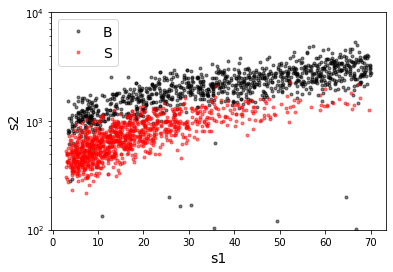

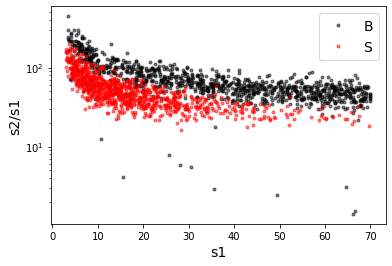

X_mon_B.shape:  (33084, 2)
X_mon_S.shape:  (33084, 2)
X_mon.shape:  (66168, 2)

X_mon_train :  (42182, 2)
y_mon_train :  (42182,)
X_mon_val :  (7444, 2)
y_mon_val :  (7444,)
X_mon_test :  (16542, 2)
y_mon_test :  (16542,)

Classification score:


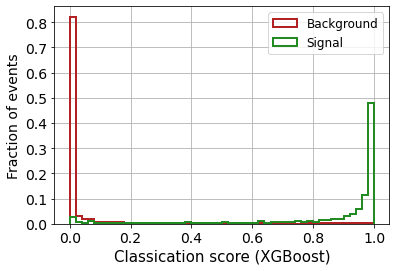


 ROC-AUC =  0.9771438639704061
At least 5 B events per bin, range = [[0, 1]]:
# bins:  7 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  7
range of our data:  [[0, 1]]
number of bins we are going to use:  7
B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6465


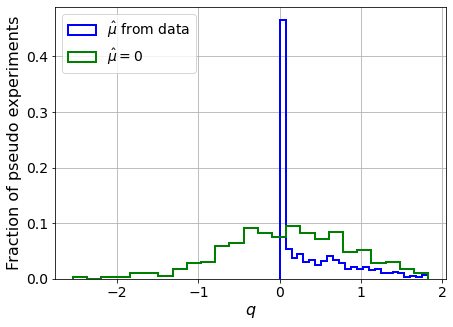

muhat mean:  0.2542308668256175
Z_bins:  0.3363758997155887
std Z_bins:  0.6783965201776845
Z_bins mu=0:  0.31782151148597776
std Z_bins mu=0:  1.1948310824133428

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.652


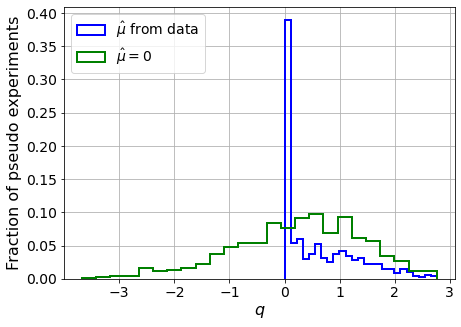

muhat mean:  0.20613828923517594
Z_bins:  0.5749149296279884
std Z_bins:  0.5988601544599713
Z_bins mu=0:  0.5685991559750444
std Z_bins mu=0:  1.0273922941828793

--------

B_expected:  643
S_expected:  7

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6565


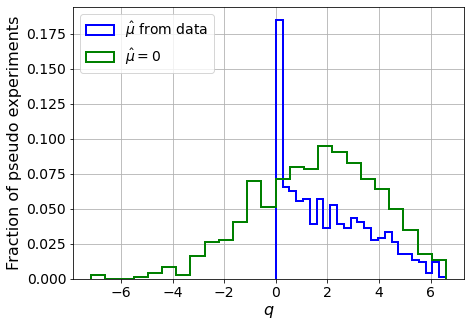

muhat mean:  0.10241563292944558
Z_bins:  1.319651760445294
std Z_bins:  0.6390135078366042
Z_bins mu=0:  1.314302518092107
std Z_bins mu=0:  0.8901729336471537

--------

B_expected:  643
S_expected:  13

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.653


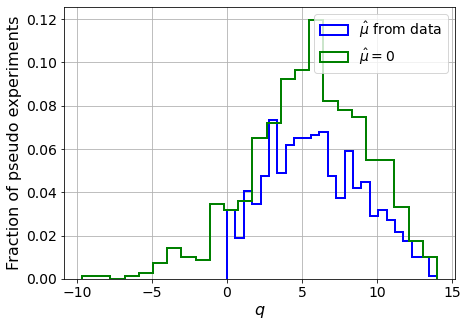

muhat mean:  0.024284125957188093
Z_bins:  2.38884423491407
std Z_bins:  0.6608376555335805
Z_bins mu=0:  2.38884423491407
std Z_bins mu=0:  0.807429698632062

--------

B_expected:  643
S_expected:  25

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.649


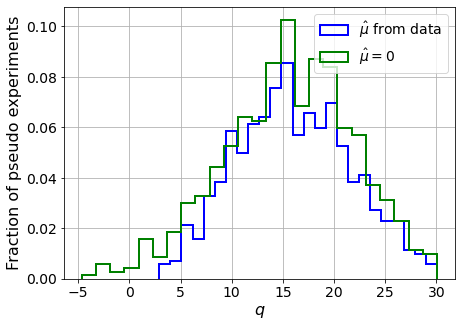

muhat mean:  0.02329967100373983
Z_bins:  3.964406894102725
std Z_bins:  0.6992404945299511
Z_bins mu=0:  3.964371931953496
std Z_bins mu=0:  0.7967351842878102

--------

B_expected:  643
S_expected:  48

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.647


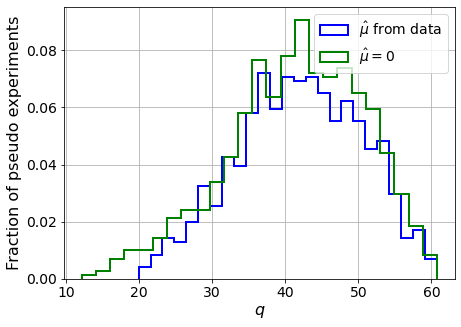

muhat mean:  0.010894802063285596
Z_bins:  6.489130201483224
std Z_bins:  0.6540231424075357
Z_bins mu=0:  6.48870087195117
std Z_bins mu=0:  0.717176028208851

--------

B_expected:  643
S_expected:  93

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6435


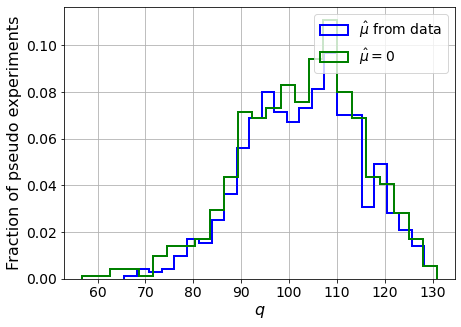

muhat mean:  0.0025747646180356272
Z_bins:  10.180578990726188
std Z_bins:  0.5804853958144303
Z_bins mu=0:  10.178339622230789
std Z_bins mu=0:  0.6170971019617582

--------

B_expected:  643
S_expected:  179

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6465


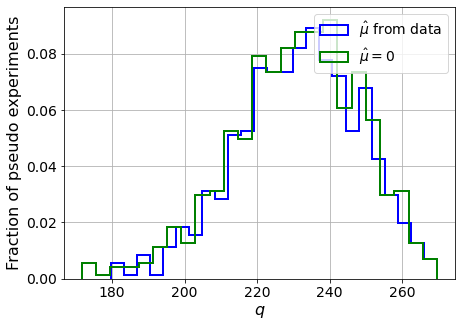

muhat mean:  0.0035545026373858687
Z_bins:  15.237288720964424
std Z_bins:  0.5483852915911285
Z_bins mu=0:  15.234342725872487
std Z_bins mu=0:  0.578765998794596

--------

B_expected:  643
S_expected:  345

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6495


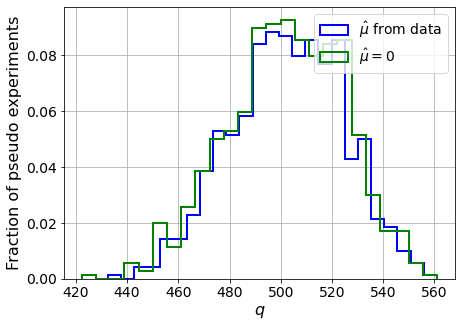

muhat mean:  0.002176336316163761
Z_bins:  22.430780962398728
std Z_bins:  0.4853793841115216
Z_bins mu=0:  22.430780962398728
std Z_bins mu=0:  0.504283664473201

--------

B_expected:  643
S_expected:  666

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.657


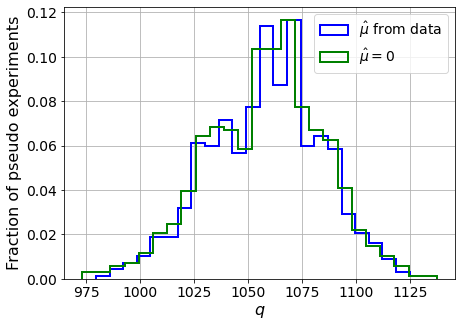

muhat mean:  0.0008942922187164234
Z_bins:  32.555138602144865
std Z_bins:  0.40098474252622435
Z_bins mu=0:  32.54878308120731
std Z_bins mu=0:  0.4121001651331943

--------

B_expected:  643
S_expected:  1286

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.638


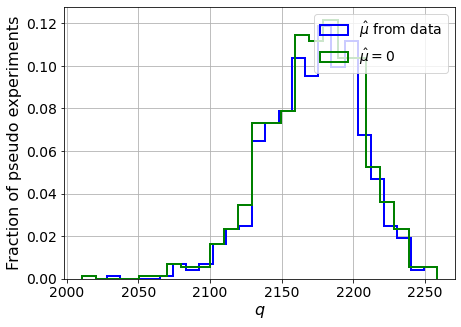

muhat mean:  0.00045307383182446913
Z_bins:  46.64122547346324
std Z_bins:  0.3509396991880253
Z_bins mu=0:  46.64046963707334
std Z_bins mu=0:  0.360014335608159

--------

B_expected:  643
S_expected:  2484

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.657


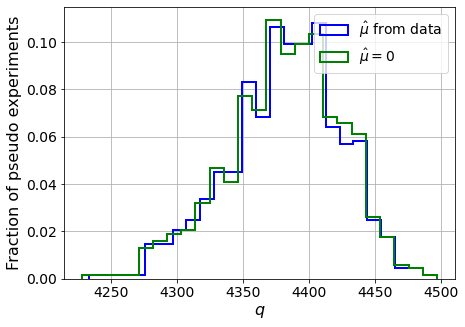

muhat mean:  0.000284341706040378
Z_bins:  66.21948450767614
std Z_bins:  0.32002474880560805
Z_bins mu=0:  66.21788289202165
std Z_bins mu=0:  0.3258714509279984

--------

B_expected:  643
S_expected:  4795

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6615


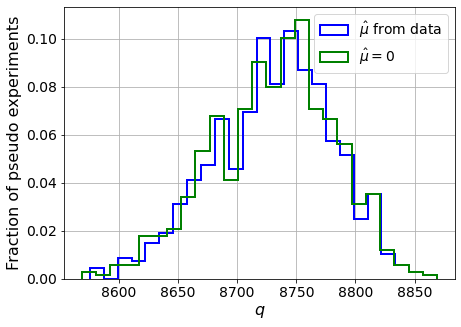

muhat mean:  0.00011393661233228015
Z_bins:  93.46168430755907
std Z_bins:  0.2700441052497825
Z_bins mu=0:  93.45984041188792
std Z_bins mu=0:  0.2736140221294987

--------

B_expected:  643
S_expected:  9258

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6635


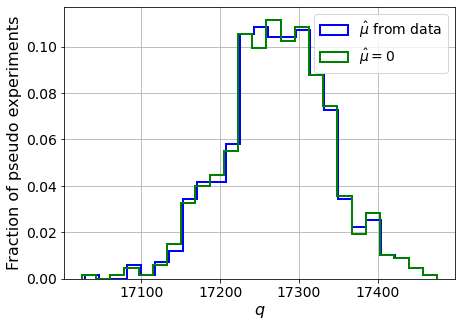

muhat mean:  6.988903817979919e-05
Z_bins:  131.4312507528225
std Z_bins:  0.24838954122386636
Z_bins mu=0:  131.43095284095975
std Z_bins mu=0:  0.25047660532997323

--------

B_expected:  643
S_expected:  17875

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.662


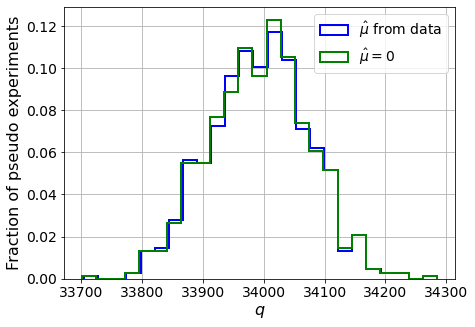

muhat mean:  3.808905814667183e-05
Z_bins:  184.37481287862943
std Z_bins:  0.22125199245935206
Z_bins mu=0:  184.37310199107452
std Z_bins mu=0:  0.22265815309969184

--------


 FINAL RESULT:

[[0.3363758997155887, 0.6783965201776845, 0.2542308668256175, 0.31782151148597776, 1.1948310824133428], [0.5749149296279884, 0.5988601544599713, 0.20613828923517594, 0.5685991559750444, 1.0273922941828793], [1.319651760445294, 0.6390135078366042, 0.10241563292944558, 1.314302518092107, 0.8901729336471537], [2.38884423491407, 0.6608376555335805, 0.024284125957188093, 2.38884423491407, 0.807429698632062], [3.964406894102725, 0.6992404945299511, 0.02329967100373983, 3.964371931953496, 0.7967351842878102], [6.489130201483224, 0.6540231424075357, 0.010894802063285596, 6.48870087195117, 0.717176028208851], [10.180578990726188, 0.5804853958144303, 0.0025747646180356272, 10.178339622230789, 0.6170971019617582], [15.237288720964424, 0.5483852915911285, 0.0035545026373858687, 15.234342725872487, 0.578765

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 436.47285301 369.24627592 300.72726875
 225.66973246 147.42847548  67.43282223 -14.97458302 -91.69004838]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
          -inf  278.9737718   250.8204945   216.68819727  17

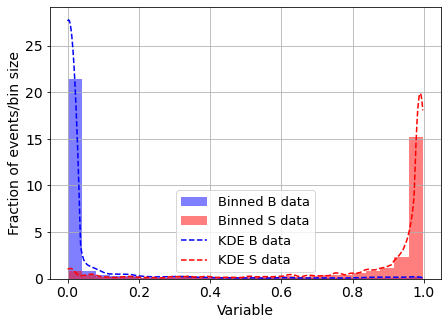

KDE Kernel:  epanechnikov
Background bandwidth:  0.03613222756796251
Signal bandwidth:  0.022117541055781564
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  2



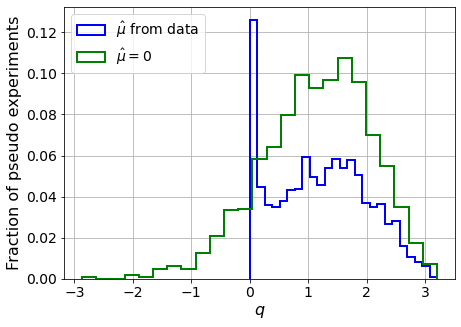

muhat mean:  -3.4678584530564187
Z_bins:  1.1066016767509892
std Z_bins:  0.36030590266961854
Z_bins mu=0:  1.1066016767509892
std Z_bins mu=0:  0.41849804167270177

--------

B_expected:  643
S_expected:  3



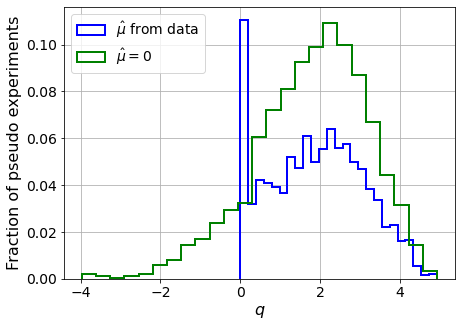

muhat mean:  -2.04827237598342
Z_bins:  1.3899093964571465
std Z_bins:  0.42604346685785044
Z_bins mu=0:  1.3899093964571465
std Z_bins mu=0:  0.5038521117367709

--------

B_expected:  643
S_expected:  7



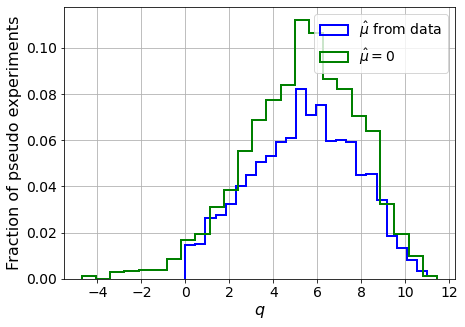

muhat mean:  -0.9244334393302848
Z_bins:  2.336283207323273
std Z_bins:  0.5053870668594824
Z_bins mu=0:  2.336283207323273
std Z_bins mu=0:  0.5442520003336865

--------

B_expected:  643
S_expected:  13



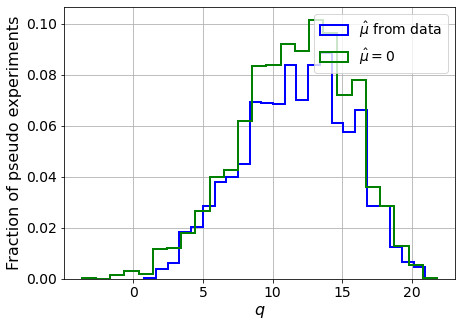

muhat mean:  -0.5400500617239571
Z_bins:  3.4400014834322716
std Z_bins:  0.5566030842856604
Z_bins mu=0:  3.4400014834322716
std Z_bins mu=0:  0.5818297088648524

--------

B_expected:  643
S_expected:  25



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


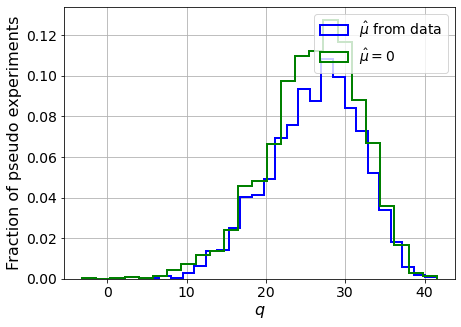

muhat mean:  -0.2679697008346187
Z_bins:  5.1643298133291475
std Z_bins:  0.55119330266395
Z_bins mu=0:  5.1643298133291475
std Z_bins mu=0:  0.5751840405251128

--------

B_expected:  643
S_expected:  48



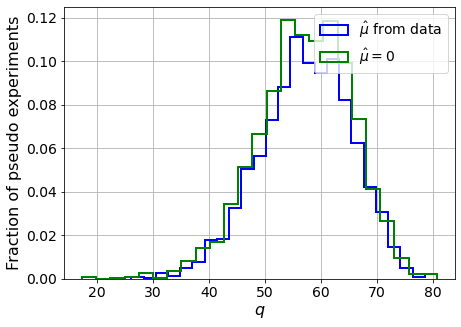

muhat mean:  -0.12309460962029485
Z_bins:  7.583258516422984
std Z_bins:  0.5373516145185123
Z_bins mu=0:  7.583258516422984
std Z_bins mu=0:  0.552878911968294

--------

B_expected:  643
S_expected:  93



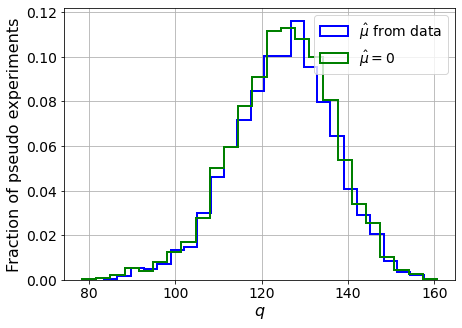

muhat mean:  -0.07584190531205284
Z_bins:  11.200698220162458
std Z_bins:  0.519103390214805
Z_bins mu=0:  11.200698220162458
std Z_bins mu=0:  0.5282486889316783

--------

B_expected:  643
S_expected:  179



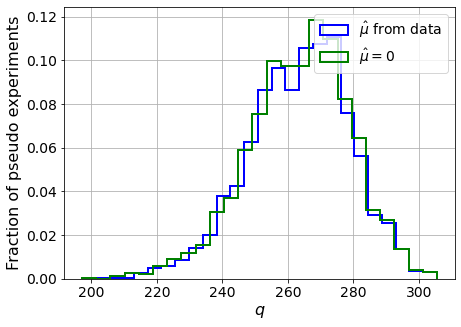

muhat mean:  -0.033470671757401683
Z_bins:  16.268271105669392
std Z_bins:  0.47824648729212205
Z_bins mu=0:  16.268271105669392
std Z_bins mu=0:  0.4838097692489301

--------

B_expected:  643
S_expected:  345



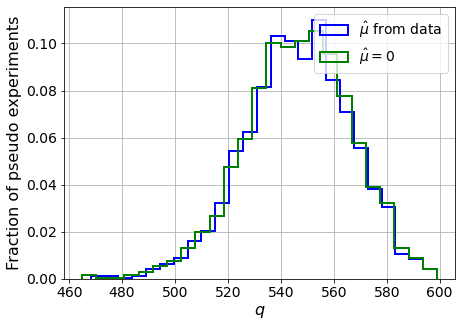

muhat mean:  -0.020875227636343745
Z_bins:  23.3868885696351
std Z_bins:  0.4248159223654528
Z_bins mu=0:  23.3868885696351
std Z_bins mu=0:  0.4287191255044812

--------

B_expected:  643
S_expected:  666



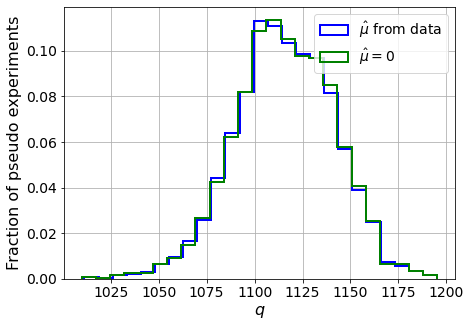

muhat mean:  -0.009282524422018329
Z_bins:  33.40225356518796
std Z_bins:  0.3873624656519509
Z_bins mu=0:  33.4019542288195
std Z_bins mu=0:  0.3897253946958602

--------

B_expected:  643
S_expected:  1286



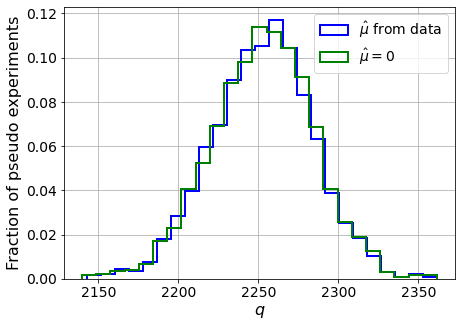

muhat mean:  -0.00504436070494619
Z_bins:  47.476057261004264
std Z_bins:  0.3335751908843967
Z_bins mu=0:  47.475833630702056
std Z_bins mu=0:  0.3349094330827242

--------

B_expected:  643
S_expected:  2484



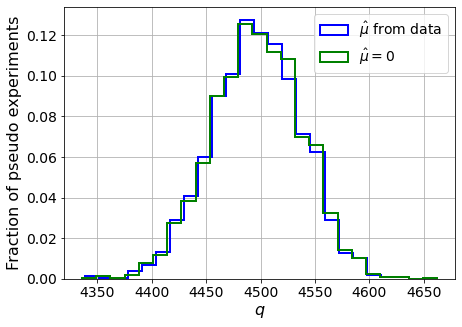

muhat mean:  -0.002531941866509492
Z_bins:  67.05849512845043
std Z_bins:  0.30724431058288615
Z_bins mu=0:  67.05829554553655
std Z_bins mu=0:  0.3081047989245778

--------

B_expected:  643
S_expected:  4795



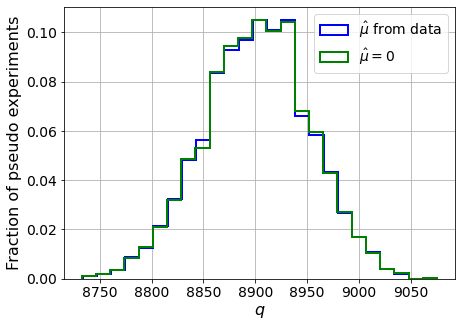

muhat mean:  -0.001267684637526317
Z_bins:  94.35202848745827
std Z_bins:  0.2712800226505507
Z_bins mu=0:  94.35163557159714
std Z_bins mu=0:  0.2718497005786997

--------

B_expected:  643
S_expected:  9258



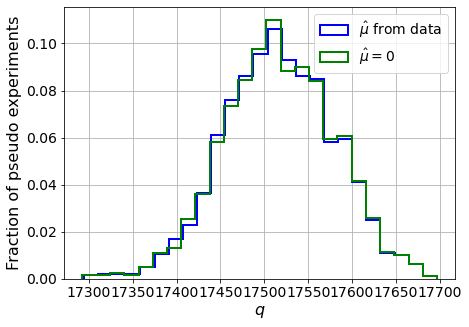

muhat mean:  -0.000713787135854759
Z_bins:  132.35034615038975
std Z_bins:  0.23739805894274152
Z_bins mu=0:  132.3502616249879
std Z_bins mu=0:  0.2377552998702277

--------

B_expected:  643
S_expected:  17875



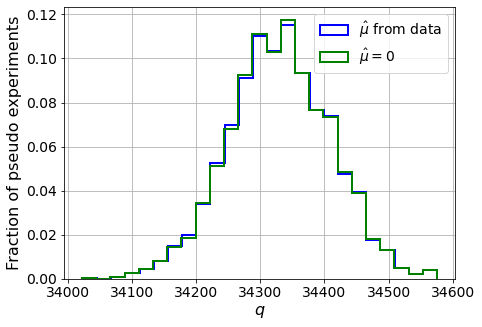

muhat mean:  -0.00034570823523773
Z_bins:  185.28385941568519
std Z_bins:  0.21557020195955562
Z_bins mu=0:  185.28385941568519
std Z_bins mu=0:  0.21584167687504008

--------


 FINAL RESULT:

[[1.1066016767509892, 0.36030590266961854, -3.4678584530564187, 1.1066016767509892, 0.41849804167270177], [1.3899093964571465, 0.42604346685785044, -2.04827237598342, 1.3899093964571465, 0.5038521117367709], [2.336283207323273, 0.5053870668594824, -0.9244334393302848, 2.336283207323273, 0.5442520003336865], [3.4400014834322716, 0.5566030842856604, -0.5400500617239571, 3.4400014834322716, 0.5818297088648524], [5.1643298133291475, 0.55119330266395, -0.2679697008346187, 5.1643298133291475, 0.5751840405251128], [7.583258516422984, 0.5373516145185123, -0.12309460962029485, 7.583258516422984, 0.552878911968294], [11.200698220162458, 0.519103390214805, -0.07584190531205284, 11.200698220162458, 0.5282486889316783], [16.268271105669392, 0.47824648729212205, -0.033470671757401683, 16.268271105669392, 0.48

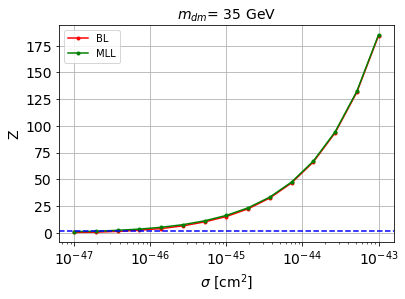


cross_BL_164:  4.539765582703348e-47
cross_BL_164_up:  3.0759328204464317e-47
cross_BL_164_down:  6.930825066131275e-47

cross_MLL_164:  2.4614162227128363e-47
cross_MLL_164_up:  1.385754896297991e-47
cross_MLL_164_down:  3.3083202124571173e-47

#########################


#########################

mDM =  50 GeV


S_cs1.shape:  (35287,)
S_cs2.shape:  (35287,)
 NUM_DAT:  34105 

NUM_DAT_ER:  33671
NUM_DAT_AC:  119
NUM_DAT_CNNS:  1
NUM_DAT_RN:  31
NUM_DAT_WALL:  283

B_cs1cs2.shape:  (34105, 2)

S_cs1cs2.shape:  (34105, 2)


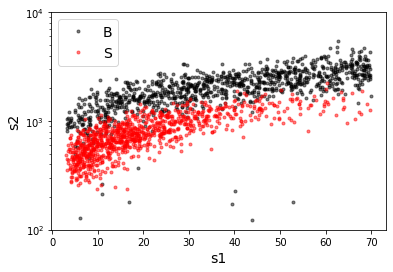

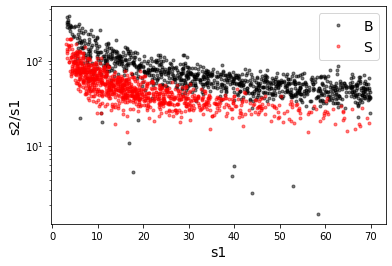

X_mon_B.shape:  (34105, 2)
X_mon_S.shape:  (34105, 2)
X_mon.shape:  (68210, 2)

X_mon_train :  (43483, 2)
y_mon_train :  (43483,)
X_mon_val :  (7674, 2)
y_mon_val :  (7674,)
X_mon_test :  (17053, 2)
y_mon_test :  (17053,)

Classification score:


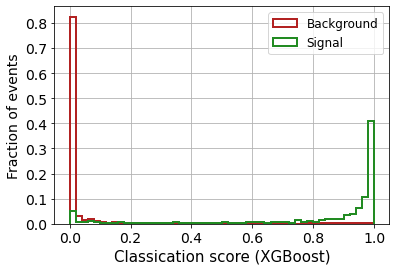


 ROC-AUC =  0.9644440033688637
At least 5 B events per bin, range = [[0, 1]]:
# bins:  7 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  7
range of our data:  [[0, 1]]
number of bins we are going to use:  7
B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6435


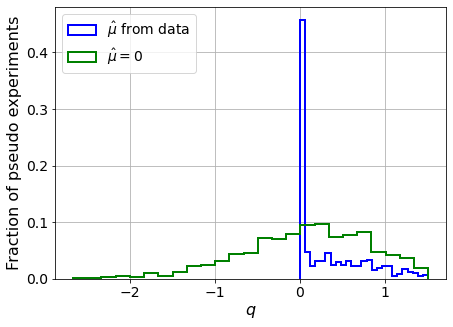

muhat mean:  0.2746827438881227
Z_bins:  0.3363431852369736
std Z_bins:  0.609811344412573
Z_bins mu=0:  0.3311192387506354
std Z_bins mu=0:  1.1178267658491627

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6615


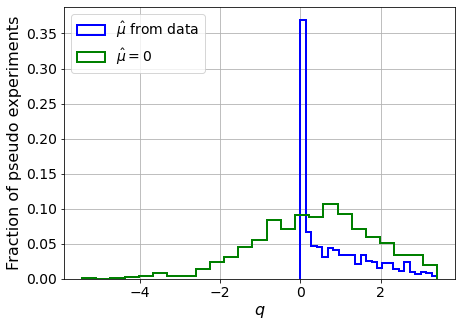

muhat mean:  0.2105009747721802
Z_bins:  0.6784232365639496
std Z_bins:  0.6639690427764315
Z_bins mu=0:  0.662794106380489
std Z_bins mu=0:  1.1083147031914486

--------

B_expected:  643
S_expected:  7

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.621


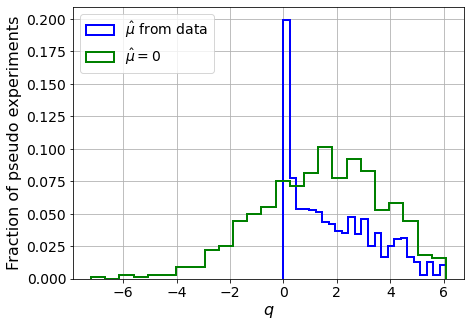

muhat mean:  0.09836774988624677
Z_bins:  1.2370783827264848
std Z_bins:  0.646257679882527
Z_bins mu=0:  1.2318531759099491
std Z_bins mu=0:  0.9138122120665662

--------

B_expected:  643
S_expected:  14

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.647


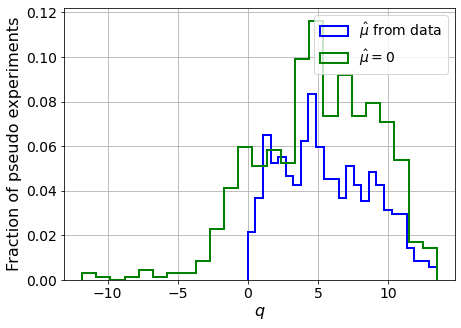

muhat mean:  0.06060218528568386
Z_bins:  2.2721324860383616
std Z_bins:  0.7119808452947771
Z_bins mu=0:  2.2681755663255316
std Z_bins mu=0:  0.906929521162507

--------

B_expected:  643
S_expected:  27

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6425


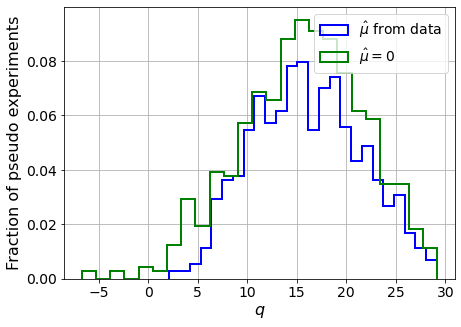

muhat mean:  0.024687066043707826
Z_bins:  3.9623107295912448
std Z_bins:  0.6870581421846199
Z_bins mu=0:  3.958265372455061
std Z_bins mu=0:  0.783016071357325

--------

B_expected:  643
S_expected:  51

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.643


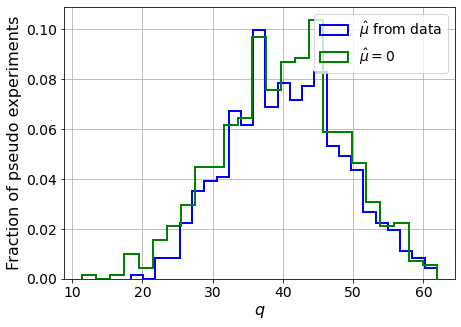

muhat mean:  0.018088352756438535
Z_bins:  6.340346245737166
std Z_bins:  0.6314429391595723
Z_bins mu=0:  6.338661661749473
std Z_bins mu=0:  0.6882758862288705

--------

B_expected:  643
S_expected:  99

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.641


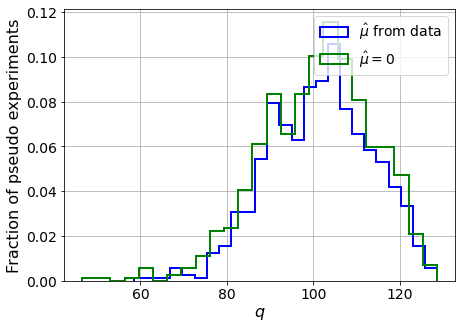

muhat mean:  0.007224398347690957
Z_bins:  10.103751947024785
std Z_bins:  0.5883618144835279
Z_bins mu=0:  10.10371157205978
std Z_bins mu=0:  0.6305082192325792

--------

B_expected:  643
S_expected:  192

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.649


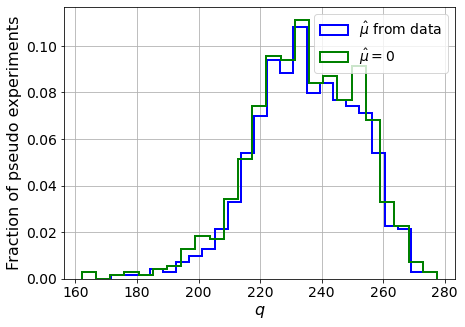

muhat mean:  0.003329039050300541
Z_bins:  15.318035151471896
std Z_bins:  0.5467679602983726
Z_bins mu=0:  15.317303332998772
std Z_bins mu=0:  0.5759024481535887

--------

B_expected:  643
S_expected:  370

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.638


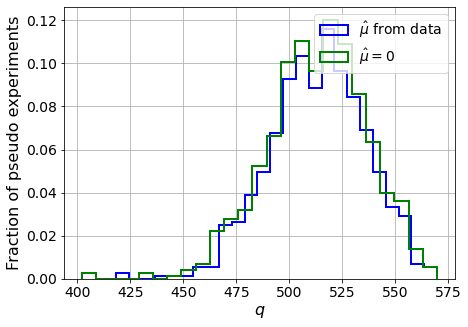

muhat mean:  0.0020392363927248685
Z_bins:  22.69105530012777
std Z_bins:  0.49901880178952307
Z_bins mu=0:  22.690132861509973
std Z_bins mu=0:  0.520753977693921

--------

B_expected:  643
S_expected:  714

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6385


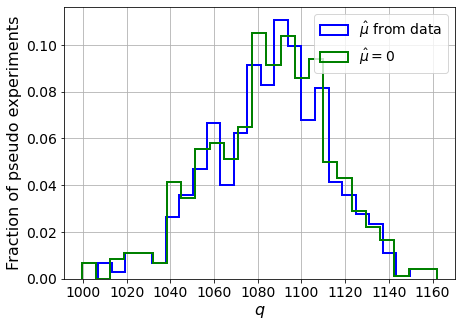

muhat mean:  0.0012115257607397806
Z_bins:  32.988939275032735
std Z_bins:  0.4083513074076934
Z_bins mu=0:  32.98767667326463
std Z_bins mu=0:  0.4201118961151844

--------

B_expected:  643
S_expected:  1378

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6465


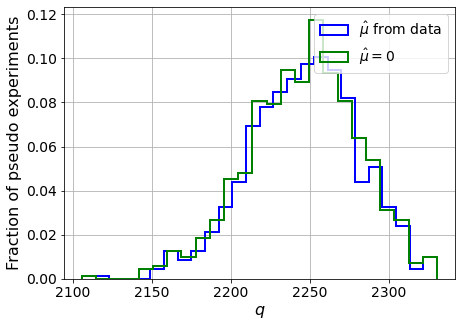

muhat mean:  0.00039264114630431886
Z_bins:  47.4211830616413
std Z_bins:  0.36076358475359976
Z_bins mu=0:  47.41871419322885
std Z_bins mu=0:  0.36826437812167206

--------

B_expected:  643
S_expected:  2661

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.651


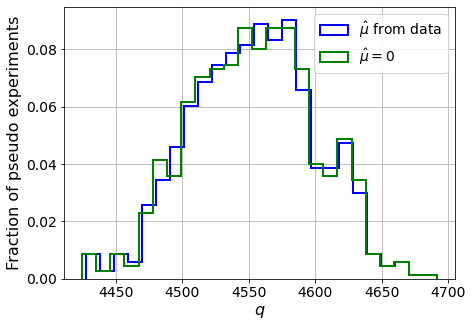

muhat mean:  0.00030307384282272974
Z_bins:  67.48595336645755
std Z_bins:  0.3406822251851491
Z_bins mu=0:  67.48517878386077
std Z_bins mu=0:  0.34534483394231597

--------

B_expected:  643
S_expected:  5138

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.641


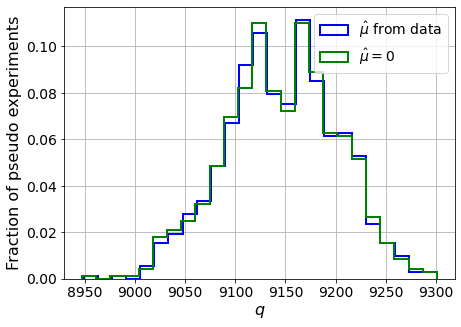

muhat mean:  0.00010891068063477448
Z_bins:  95.63773774225179
std Z_bins:  0.28986544104814504
Z_bins mu=0:  95.63475032703506
std Z_bins mu=0:  0.29297482994613333

--------

B_expected:  643
S_expected:  9921

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.642


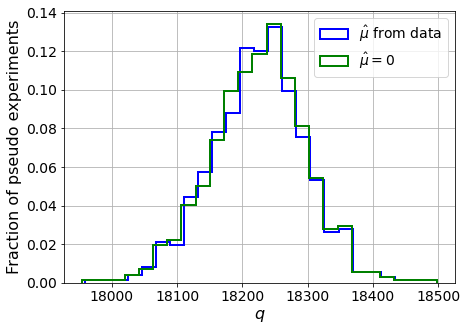

muhat mean:  3.881197972386165e-05
Z_bins:  135.00760204436187
std Z_bins:  0.26928579083186893
Z_bins mu=0:  135.00760204436187
std Z_bins mu=0:  0.2709758409860234

--------

B_expected:  643
S_expected:  19154

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.651


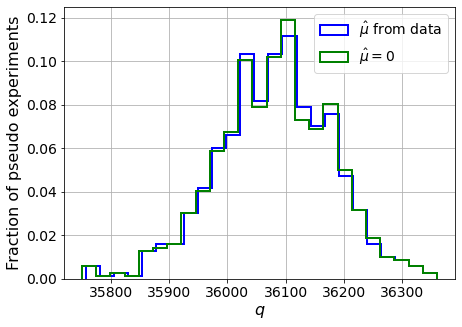

muhat mean:  3.753437268140213e-05
Z_bins:  189.95939863058499
std Z_bins:  0.2578366654254952
Z_bins mu=0:  189.95810525483782
std Z_bins mu=0:  0.2593214966140023

--------


 FINAL RESULT:

[[0.3363431852369736, 0.609811344412573, 0.2746827438881227, 0.3311192387506354, 1.1178267658491627], [0.6784232365639496, 0.6639690427764315, 0.2105009747721802, 0.662794106380489, 1.1083147031914486], [1.2370783827264848, 0.646257679882527, 0.09836774988624677, 1.2318531759099491, 0.9138122120665662], [2.2721324860383616, 0.7119808452947771, 0.06060218528568386, 2.2681755663255316, 0.906929521162507], [3.9623107295912448, 0.6870581421846199, 0.024687066043707826, 3.958265372455061, 0.783016071357325], [6.340346245737166, 0.6314429391595723, 0.018088352756438535, 6.338661661749473, 0.6882758862288705], [10.103751947024785, 0.5883618144835279, 0.007224398347690957, 10.10371157205978, 0.6305082192325792], [15.318035151471896, 0.5467679602983726, 0.003329039050300541, 15.317303332998772, 0.57590244

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 429.11756405 362.06893133 294.89101245
 222.67234604 147.20641906  68.49909301 -13.99926229 -92.00885982]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
  266.21062257  243.53175913  216.86982199  187.62499623  14

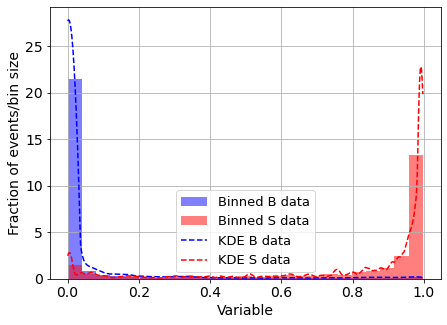

KDE Kernel:  epanechnikov
Background bandwidth:  0.03613222756796251
Signal bandwidth:  0.013538761800225447
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  2



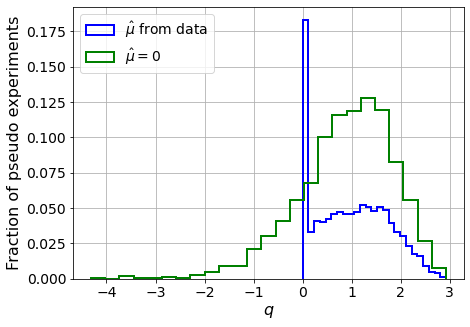

muhat mean:  -2.394672217933351
Z_bins:  0.9895252117108067
std Z_bins:  0.3711084497162374
Z_bins mu=0:  0.9895252117108067
std Z_bins mu=0:  0.4875453944348343

--------

B_expected:  643
S_expected:  4



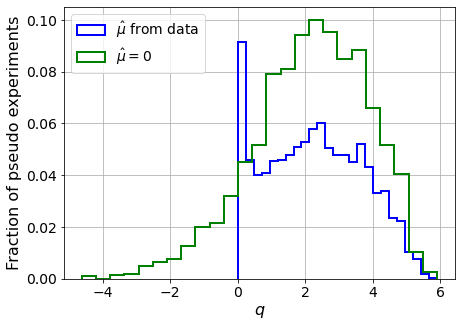

muhat mean:  -1.4134950864707734
Z_bins:  1.5080747556313863
std Z_bins:  0.4735261495647704
Z_bins mu=0:  1.5080747556313863
std Z_bins mu=0:  0.5610743285445605

--------

B_expected:  643
S_expected:  7



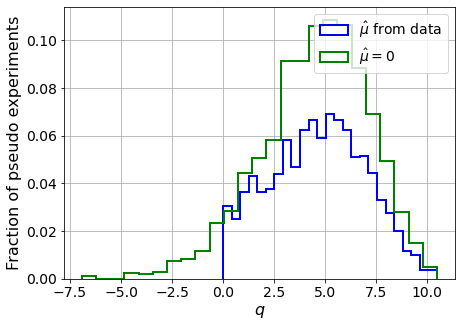

muhat mean:  -0.8918459209396689
Z_bins:  2.1700592534261167
std Z_bins:  0.5359441168594198
Z_bins mu=0:  2.1700592534261167
std Z_bins mu=0:  0.6054704355424424

--------

B_expected:  643
S_expected:  14



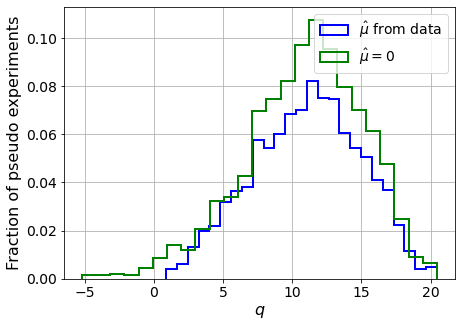

muhat mean:  -0.44021015449974277
Z_bins:  3.3510787463123624
std Z_bins:  0.5804666177904154
Z_bins mu=0:  3.3510787463123624
std Z_bins mu=0:  0.6311279174225878

--------

B_expected:  643
S_expected:  27



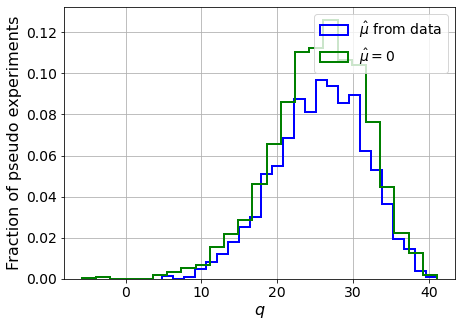

muhat mean:  -0.22253352356628425
Z_bins:  5.102340045373525
std Z_bins:  0.5777460136009712
Z_bins mu=0:  5.102340045373525
std Z_bins mu=0:  0.6106564242072927

--------

B_expected:  643
S_expected:  51



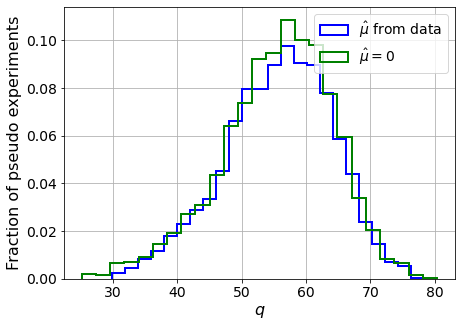

muhat mean:  -0.10532761369234665
Z_bins:  7.507038122432542
std Z_bins:  0.5581874820257687
Z_bins mu=0:  7.507038122432542
std Z_bins mu=0:  0.5794065933307339

--------

B_expected:  643
S_expected:  99



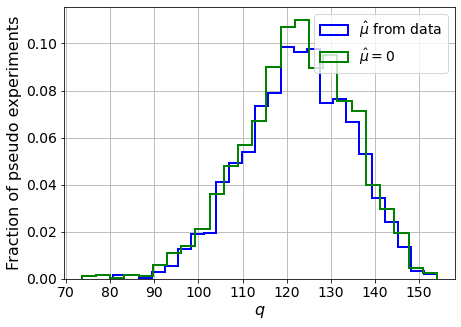

muhat mean:  -0.06194139817450284
Z_bins:  11.085645728410306
std Z_bins:  0.538456490383773
Z_bins mu=0:  11.085645728410306
std Z_bins mu=0:  0.5530750188426022

--------

B_expected:  643
S_expected:  192



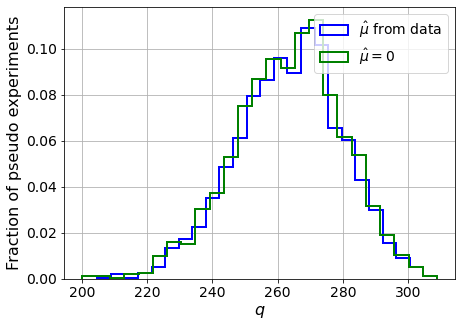

muhat mean:  -0.03577150319189856
Z_bins:  16.264858057249935
std Z_bins:  0.49752784857154
Z_bins mu=0:  16.26421079803186
std Z_bins mu=0:  0.5060791455756436

--------

B_expected:  643
S_expected:  370



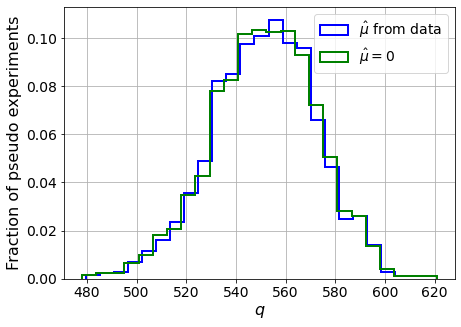

muhat mean:  -0.016074530389213627
Z_bins:  23.49915687544055
std Z_bins:  0.4449050513195181
Z_bins mu=0:  23.498449382135494
std Z_bins mu=0:  0.4494762995006782

--------

B_expected:  643
S_expected:  714



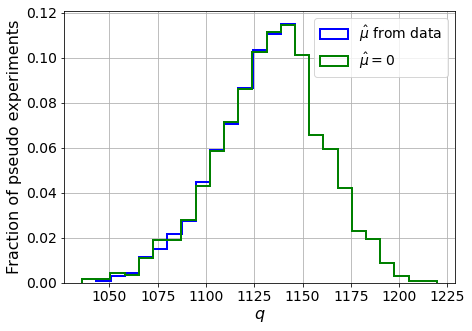

muhat mean:  -0.00918379447104438
Z_bins:  33.685292787192985
std Z_bins:  0.4097563216176451
Z_bins mu=0:  33.685292787192985
std Z_bins mu=0:  0.41360280889107914

--------

B_expected:  643
S_expected:  1378



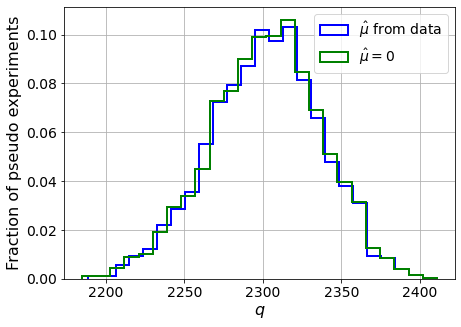

muhat mean:  -0.003962737269303158
Z_bins:  47.99367389599216
std Z_bins:  0.3644986474927004
Z_bins mu=0:  47.993624504452924
std Z_bins mu=0:  0.3665925666785418

--------

B_expected:  643
S_expected:  2661



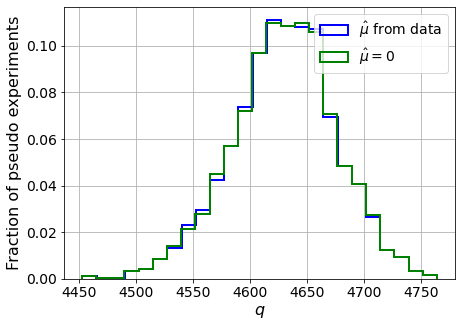

muhat mean:  -0.002389360817494797
Z_bins:  68.0510229924711
std Z_bins:  0.3354163240983135
Z_bins mu=0:  68.0510229924711
std Z_bins mu=0:  0.33709805908620216

--------

B_expected:  643
S_expected:  5138



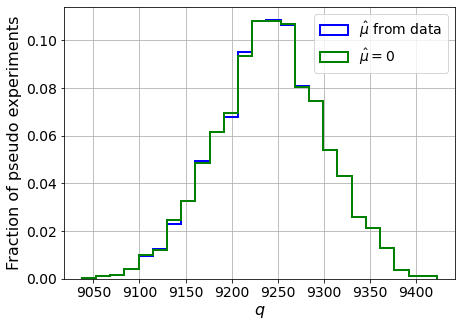

muhat mean:  -0.0012387114187588622
Z_bins:  96.13722482417137
std Z_bins:  0.3022638974221952
Z_bins mu=0:  96.13662462900504
std Z_bins mu=0:  0.30296106796824623

--------

B_expected:  643
S_expected:  9921



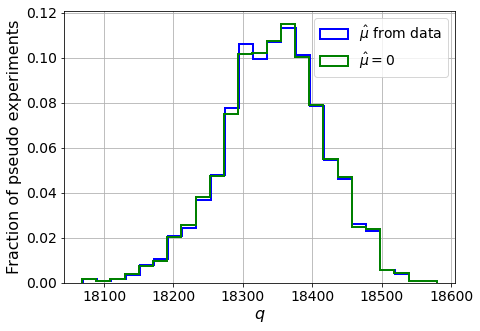

muhat mean:  -0.0005973877926575148
Z_bins:  135.44908255435445
std Z_bins:  0.2738882339126413
Z_bins mu=0:  135.44908255435445
std Z_bins mu=0:  0.27456775538920164

--------

B_expected:  643
S_expected:  19154



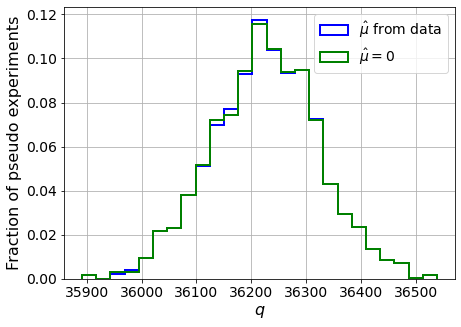

muhat mean:  -0.00026927355781422796
Z_bins:  190.33258670173845
std Z_bins:  0.2555745200753103
Z_bins mu=0:  190.33258670173845
std Z_bins mu=0:  0.2559271632934881

--------


 FINAL RESULT:

[[0.9895252117108067, 0.3711084497162374, -2.394672217933351, 0.9895252117108067, 0.4875453944348343], [1.5080747556313863, 0.4735261495647704, -1.4134950864707734, 1.5080747556313863, 0.5610743285445605], [2.1700592534261167, 0.5359441168594198, -0.8918459209396689, 2.1700592534261167, 0.6054704355424424], [3.3510787463123624, 0.5804666177904154, -0.44021015449974277, 3.3510787463123624, 0.6311279174225878], [5.102340045373525, 0.5777460136009712, -0.22253352356628425, 5.102340045373525, 0.6106564242072927], [7.507038122432542, 0.5581874820257687, -0.10532761369234665, 7.507038122432542, 0.5794065933307339], [11.085645728410306, 0.538456490383773, -0.06194139817450284, 11.085645728410306, 0.5530750188426022], [16.264858057249935, 0.49752784857154, -0.03577150319189856, 16.26421079803186, 0.506

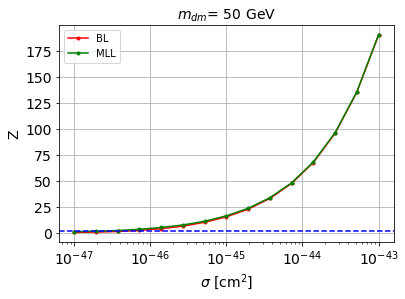


cross_BL_164:  4.81559835079824e-47
cross_BL_164_up:  2.772706882437853e-47
cross_BL_164_down:  7.420695161449042e-47

cross_MLL_164:  2.2011699497278087e-47
cross_MLL_164_up:  1.415735737157797e-47
cross_MLL_164_down:  3.7403136364689566e-47

#########################


#########################

mDM =  100 GeV


S_cs1.shape:  (37757,)
S_cs2.shape:  (37757,)
 NUM_DAT:  35163 

NUM_DAT_ER:  34715
NUM_DAT_AC:  123
NUM_DAT_CNNS:  1
NUM_DAT_RN:  32
NUM_DAT_WALL:  292

B_cs1cs2.shape:  (35163, 2)

S_cs1cs2.shape:  (35163, 2)


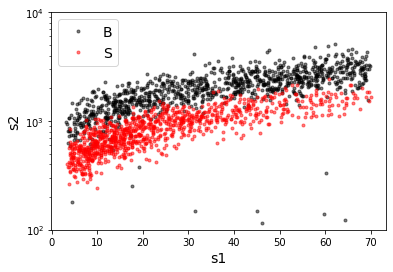

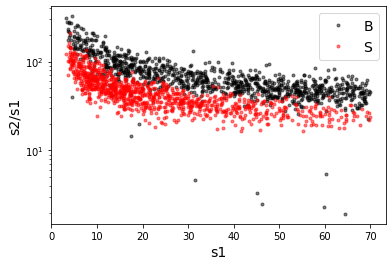

X_mon_B.shape:  (35163, 2)
X_mon_S.shape:  (35163, 2)
X_mon.shape:  (70326, 2)

X_mon_train :  (44832, 2)
y_mon_train :  (44832,)
X_mon_val :  (7912, 2)
y_mon_val :  (7912,)
X_mon_test :  (17582, 2)
y_mon_test :  (17582,)

Classification score:


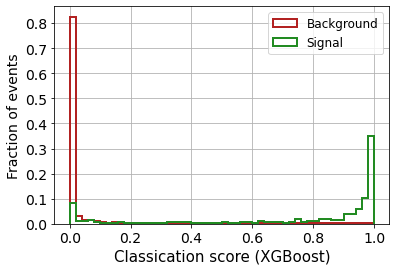


 ROC-AUC =  0.9506321520459354
At least 5 B events per bin, range = [[0, 1]]:
# bins:  8 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  8
range of our data:  [[0, 1]]
number of bins we are going to use:  8
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.8105


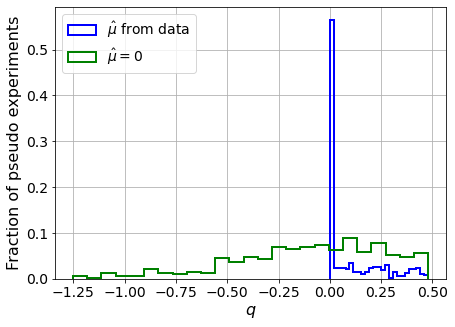

muhat mean:  1.5627816779039256
Z_bins:  0.0
std Z_bins:  inf
Z_bins mu=0:  0.2347258613941174
std Z_bins mu=0:  0.7890820678367869

--------

B_expected:  643
S_expected:  3



/media/andres/disco1tera/ubuntu/Trabajo/Direct-Detection/xenon1t-classifier/clasificadores-h5-2024/02-limits/AUX_MLL_BL.py:807: RuntimeWarning: divide by zero encountered in double_scalars
  Z_bins_std = np.std(q_muhat_bins) / (2.*Z_bins)


Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.812


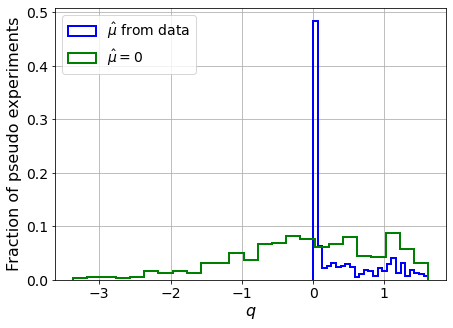

muhat mean:  0.600995345388116
Z_bins:  0.2781616578094184
std Z_bins:  0.8699212129282292
Z_bins mu=0:  0.2177312231477577
std Z_bins mu=0:  2.3285543325595097

--------

B_expected:  643
S_expected:  5

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.8125


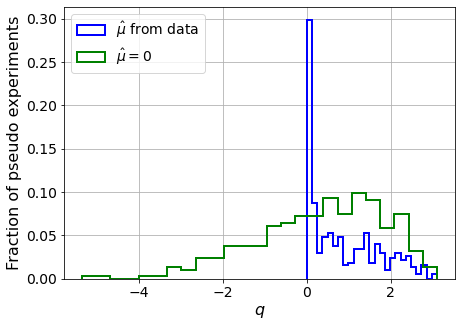

muhat mean:  0.3150197327245872
Z_bins:  0.7812974620139811
std Z_bins:  0.5395454196185644
Z_bins mu=0:  0.7407395682865711
std Z_bins mu=0:  1.0217599742796808

--------

B_expected:  643
S_expected:  10

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.804


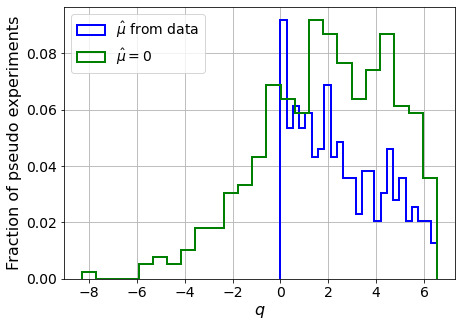

muhat mean:  0.1911763759643403
Z_bins:  1.51239713233704
std Z_bins:  0.600397283110961
Z_bins mu=0:  1.4622113875571996
std Z_bins mu=0:  0.9148633871218065

--------

B_expected:  643
S_expected:  19

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.814


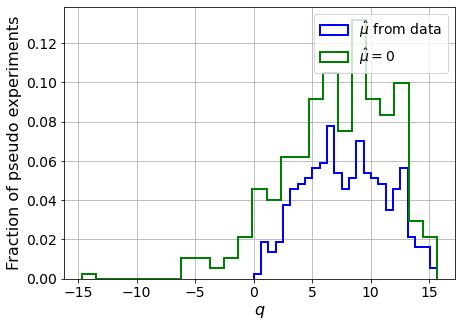

muhat mean:  0.10625613941743228
Z_bins:  2.784226527801457
std Z_bins:  0.6251909158281884
Z_bins mu=0:  2.7600097876273355
std Z_bins mu=0:  0.8304690645312579

--------

B_expected:  643
S_expected:  37

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.818


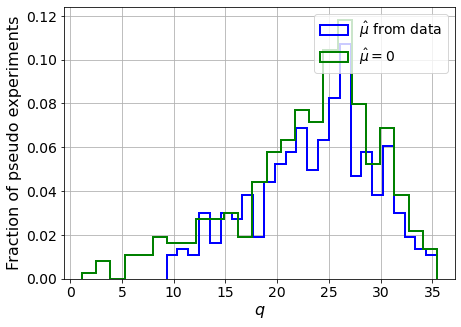

muhat mean:  0.04283160839962126
Z_bins:  4.933778070366701
std Z_bins:  0.5823650624296173
Z_bins mu=0:  4.930402720928964
std Z_bins mu=0:  0.6884723612771066

--------

B_expected:  643
S_expected:  72

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.81


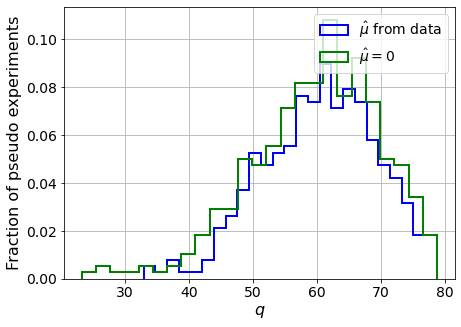

muhat mean:  0.02689688798590959
Z_bins:  7.825461165702262
std Z_bins:  0.5666040743884917
Z_bins mu=0:  7.81289146532004
std Z_bins mu=0:  0.6355899647177181

--------

B_expected:  643
S_expected:  139

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.7965


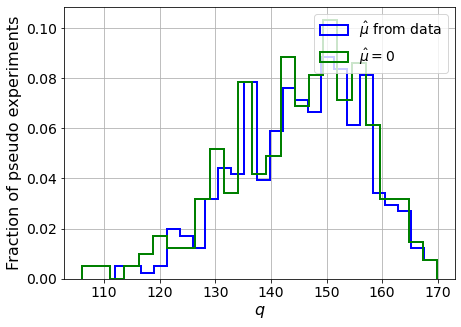

muhat mean:  0.012248762141703548
Z_bins:  12.102604330002954
std Z_bins:  0.46000809853463653
Z_bins mu=0:  12.090276248671351
std Z_bins mu=0:  0.4960868665830719

--------

B_expected:  643
S_expected:  268

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.8415


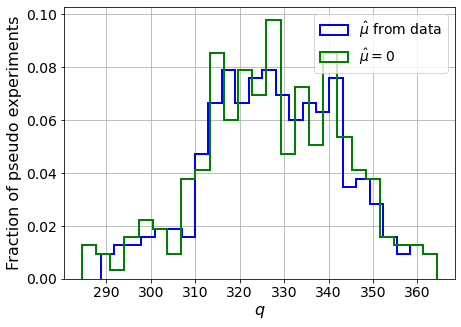

muhat mean:  0.00724283308209456
Z_bins:  18.09089996608523
std Z_bins:  0.4196684091483824
Z_bins mu=0:  18.085725147708423
std Z_bins mu=0:  0.4411379090651761

--------

B_expected:  643
S_expected:  518

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.805


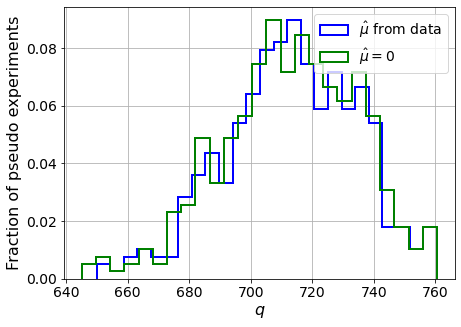

muhat mean:  0.003263696136611502
Z_bins:  26.723235099518035
std Z_bins:  0.3984400582646627
Z_bins mu=0:  26.71972202640975
std Z_bins mu=0:  0.41217863828639256

--------

B_expected:  643
S_expected:  1001

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.797


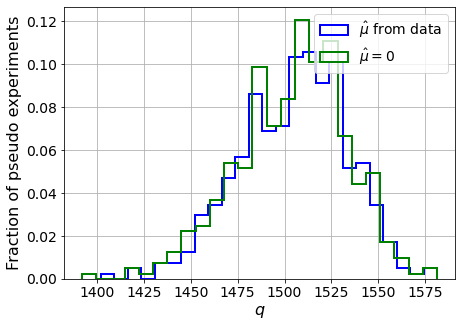

muhat mean:  0.0017003177506658524
Z_bins:  38.823448972414724
std Z_bins:  0.36830241549638476
Z_bins mu=0:  38.82056075176968
std Z_bins mu=0:  0.37812443567620807

--------

B_expected:  643
S_expected:  1932

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.816


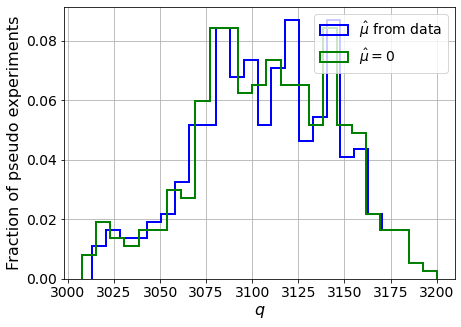

muhat mean:  0.0011025376574773265
Z_bins:  55.757288336408585
std Z_bins:  0.338709758862922
Z_bins mu=0:  55.751365957842225
std Z_bins mu=0:  0.3454061926550607

--------

B_expected:  643
S_expected:  3730

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.8235


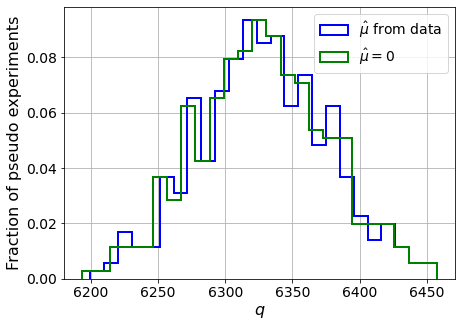

muhat mean:  0.00048521388425228784
Z_bins:  79.5516092788119
std Z_bins:  0.3010878915880729
Z_bins mu=0:  79.55001742266016
std Z_bins mu=0:  0.30430562293124214

--------

B_expected:  643
S_expected:  7201

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.8105


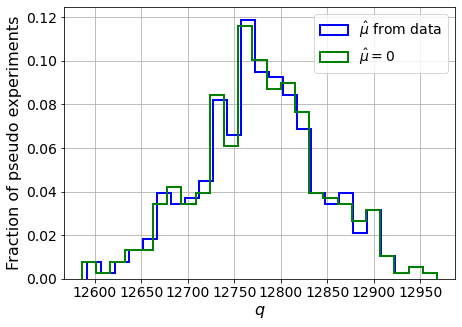

muhat mean:  0.00023486060007894317
Z_bins:  113.03114523854705
std Z_bins:  0.2951409961276119
Z_bins mu=0:  113.03088163055789
std Z_bins mu=0:  0.29721897014072585

--------

B_expected:  643
S_expected:  13904

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.831


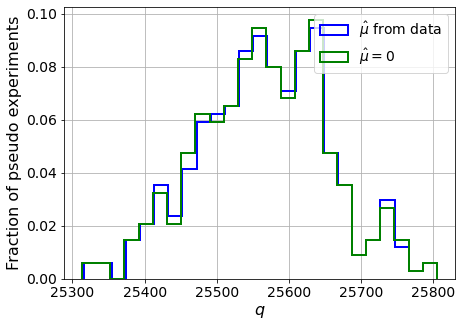

muhat mean:  0.00012850530451000115
Z_bins:  159.8958012709922
std Z_bins:  0.2797778759847136
Z_bins mu=0:  159.89378088661184
std Z_bins mu=0:  0.28075636230376694

--------


 FINAL RESULT:

[[0.0, inf, 1.5627816779039256, 0.2347258613941174, 0.7890820678367869], [0.2781616578094184, 0.8699212129282292, 0.600995345388116, 0.2177312231477577, 2.3285543325595097], [0.7812974620139811, 0.5395454196185644, 0.3150197327245872, 0.7407395682865711, 1.0217599742796808], [1.51239713233704, 0.600397283110961, 0.1911763759643403, 1.4622113875571996, 0.9148633871218065], [2.784226527801457, 0.6251909158281884, 0.10625613941743228, 2.7600097876273355, 0.8304690645312579], [4.933778070366701, 0.5823650624296173, 0.04283160839962126, 4.930402720928964, 0.6884723612771066], [7.825461165702262, 0.5666040743884917, 0.02689688798590959, 7.81289146532004, 0.6355899647177181], [12.102604330002954, 0.46000809853463653, 0.012248762141703548, 12.090276248671351, 0.4960868665830719], [18.09089996608523, 0.4

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf 377.00943591 308.25819649
 236.81052826 160.25389663  78.00554996  -7.17055096 -88.37360188]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
          -inf  200.2020091   177.09508951  149.84051374  11

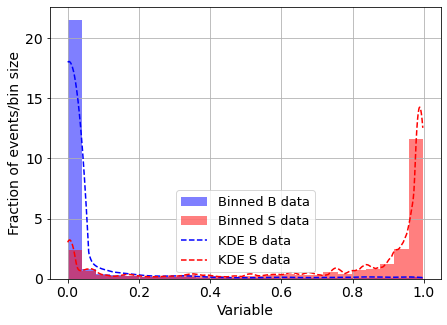

KDE Kernel:  epanechnikov
Background bandwidth:  0.059027261020128646
Signal bandwidth:  0.022117541055781564
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



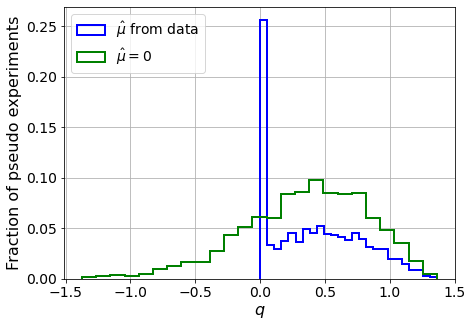

muhat mean:  -5.805181587339162
Z_bins:  0.6322847740950487
std Z_bins:  0.28150354816351947
Z_bins mu=0:  0.6322847740950487
std Z_bins mu=0:  0.3778560486905148

--------

B_expected:  643
S_expected:  3



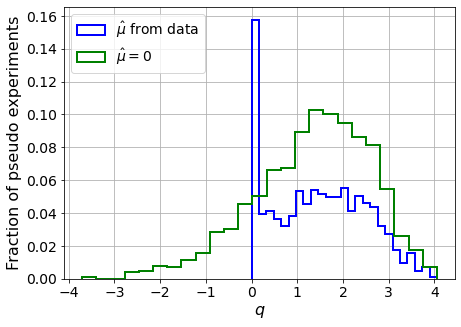

muhat mean:  -1.9997994932585719
Z_bins:  1.2103292275857644
std Z_bins:  0.4220923479949288
Z_bins mu=0:  1.2103292275857644
std Z_bins mu=0:  0.5217752200999698

--------

B_expected:  643
S_expected:  5



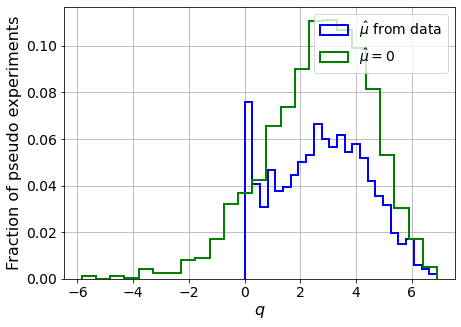

muhat mean:  -1.2424692806835316
Z_bins:  1.6853299684423118
std Z_bins:  0.4810389159819539
Z_bins mu=0:  1.6853299684423118
std Z_bins mu=0:  0.5601821416301597

--------

B_expected:  643
S_expected:  10



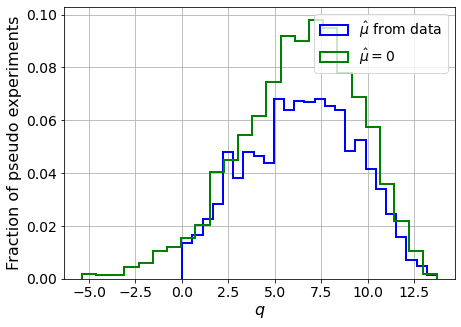

muhat mean:  -0.5751623945325102
Z_bins:  2.560812255252192
std Z_bins:  0.5650695026894866
Z_bins mu=0:  2.560812255252192
std Z_bins mu=0:  0.6269529789598683

--------

B_expected:  643
S_expected:  19



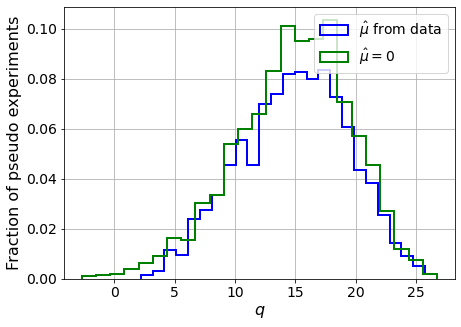

muhat mean:  -0.33242806718226764
Z_bins:  3.8940706477679514
std Z_bins:  0.5766242726094437
Z_bins mu=0:  3.8940706477679514
std Z_bins mu=0:  0.6121059490464945

--------

B_expected:  643
S_expected:  37



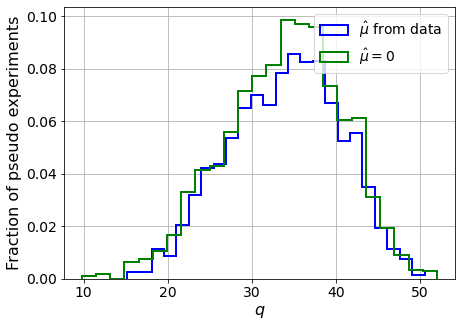

muhat mean:  -0.1439102824571907
Z_bins:  5.864732594532207
std Z_bins:  0.5697544936371374
Z_bins mu=0:  5.864732594532207
std Z_bins mu=0:  0.5916587737455371

--------

B_expected:  643
S_expected:  72



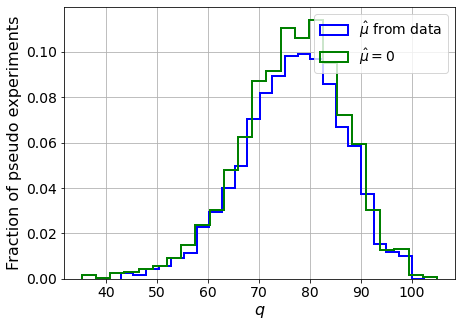

muhat mean:  -0.08665768334655896
Z_bins:  8.78459015541405
std Z_bins:  0.5612100926039543
Z_bins mu=0:  8.78459015541405
std Z_bins mu=0:  0.5826462190206665

--------

B_expected:  643
S_expected:  139



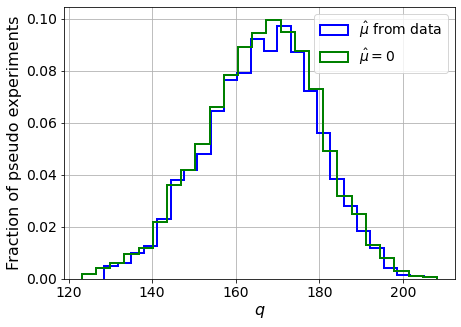

muhat mean:  -0.05283783869549046
Z_bins:  12.917534694721704
std Z_bins:  0.5153416205492175
Z_bins mu=0:  12.917534694721704
std Z_bins mu=0:  0.5254232534776648

--------

B_expected:  643
S_expected:  268



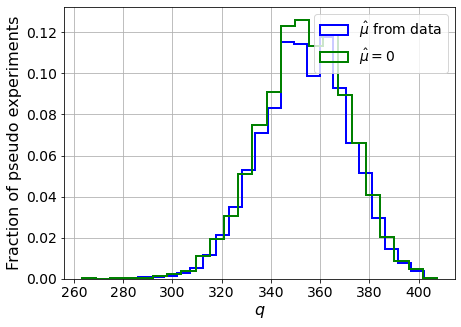

muhat mean:  -0.02450612198466031
Z_bins:  18.81275722629255
std Z_bins:  0.4740619584892904
Z_bins mu=0:  18.81208800976643
std Z_bins mu=0:  0.48177072709913105

--------

B_expected:  643
S_expected:  518



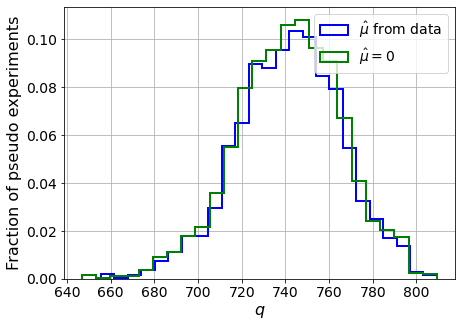

muhat mean:  -0.012883651515380602
Z_bins:  27.250209807433084
std Z_bins:  0.4379773514290546
Z_bins mu=0:  27.250209807433084
std Z_bins mu=0:  0.44286775498155845

--------

B_expected:  643
S_expected:  1001



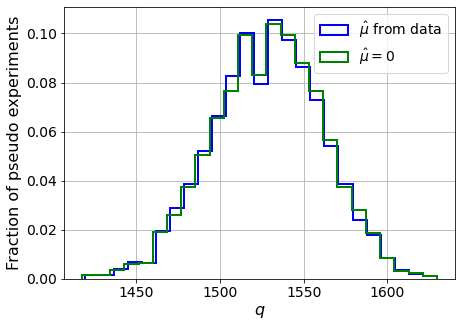

muhat mean:  -0.005636723772505984
Z_bins:  39.10929763974412
std Z_bins:  0.42054497600109997
Z_bins mu=0:  39.10757969984229
std Z_bins mu=0:  0.4229312531382701

--------

B_expected:  643
S_expected:  1932



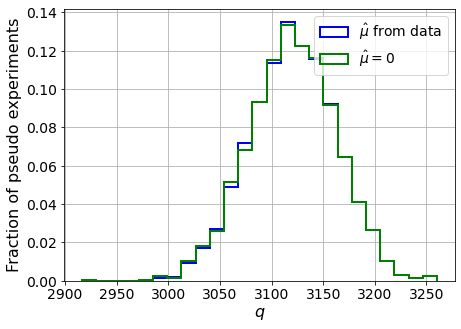

muhat mean:  -0.003719169590136359
Z_bins:  55.86393099390183
std Z_bins:  0.37801329223803737
Z_bins mu=0:  55.86325586747889
std Z_bins mu=0:  0.3797858326147079

--------

B_expected:  643
S_expected:  3730



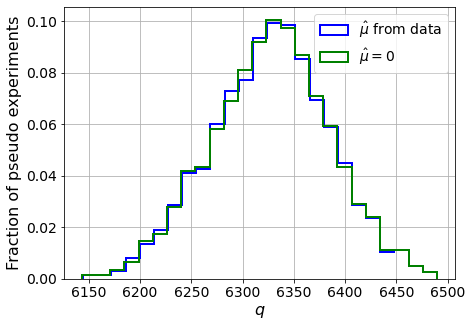

muhat mean:  -0.0017240486062976297
Z_bins:  79.55200689795053
std Z_bins:  0.36267010887873885
Z_bins mu=0:  79.55166031809942
std Z_bins mu=0:  0.3637284402300061

--------

B_expected:  643
S_expected:  7201



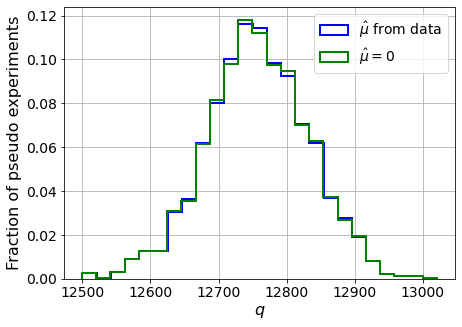

muhat mean:  -0.0007540404070713989
Z_bins:  112.9437778229529
std Z_bins:  0.3333894463941157
Z_bins mu=0:  112.94376943821752
std Z_bins mu=0:  0.33414412472727567

--------

B_expected:  643
S_expected:  13904



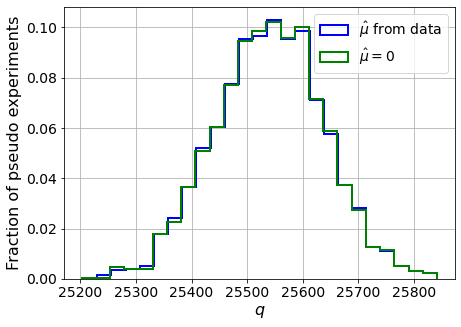

muhat mean:  -0.0004665159041643877
Z_bins:  159.81773839352172
std Z_bins:  0.30538381700104705
Z_bins mu=0:  159.81773839352172
std Z_bins mu=0:  0.3057009473359016

--------


 FINAL RESULT:

[[0.6322847740950487, 0.28150354816351947, -5.805181587339162, 0.6322847740950487, 0.3778560486905148], [1.2103292275857644, 0.4220923479949288, -1.9997994932585719, 1.2103292275857644, 0.5217752200999698], [1.6853299684423118, 0.4810389159819539, -1.2424692806835316, 1.6853299684423118, 0.5601821416301597], [2.560812255252192, 0.5650695026894866, -0.5751623945325102, 2.560812255252192, 0.6269529789598683], [3.8940706477679514, 0.5766242726094437, -0.33242806718226764, 3.8940706477679514, 0.6121059490464945], [5.864732594532207, 0.5697544936371374, -0.1439102824571907, 5.864732594532207, 0.5916587737455371], [8.78459015541405, 0.5612100926039543, -0.08665768334655896, 8.78459015541405, 0.5826462190206665], [12.917534694721704, 0.5153416205492175, -0.05283783869549046, 12.917534694721704, 0.5254

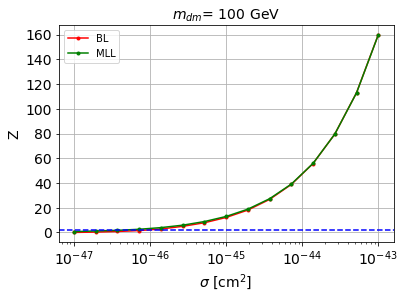


cross_BL_164:  7.6879158647776695e-47
cross_BL_164_up:  4.859277075077984e-47
cross_BL_164_down:  1.056667692022132e-46

cross_MLL_164:  3.6027580979352e-47
cross_MLL_164_up:  1.948809946619225e-47
cross_MLL_164_down:  5.354508640182289e-47

#########################


#########################

mDM =  200 GeV


S_cs1.shape:  (34573,)
S_cs2.shape:  (34573,)
 NUM_DAT:  31737 

NUM_DAT_ER:  31333
NUM_DAT_AC:  111
NUM_DAT_CNNS:  1
NUM_DAT_RN:  29
NUM_DAT_WALL:  263

B_cs1cs2.shape:  (31737, 2)

S_cs1cs2.shape:  (31737, 2)


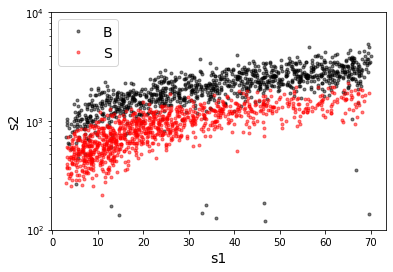

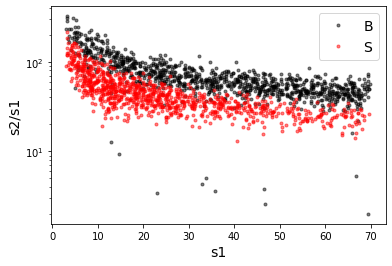

X_mon_B.shape:  (31737, 2)
X_mon_S.shape:  (31737, 2)
X_mon.shape:  (63474, 2)

X_mon_train :  (40464, 2)
y_mon_train :  (40464,)
X_mon_val :  (7141, 2)
y_mon_val :  (7141,)
X_mon_test :  (15869, 2)
y_mon_test :  (15869,)

Classification score:


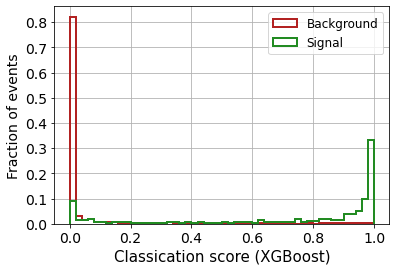


 ROC-AUC =  0.9460231515516995
At least 5 B events per bin, range = [[0, 1]]:
# bins:  7 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  7
range of our data:  [[0, 1]]
number of bins we are going to use:  7
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6865


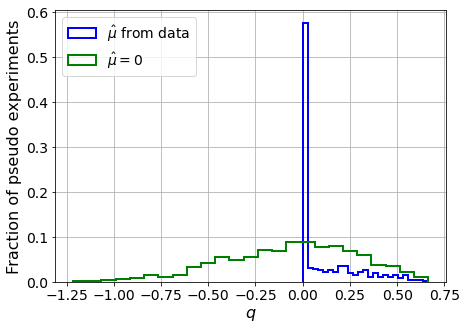

muhat mean:  1.3658355420895174
Z_bins:  0.013808375090696868
std Z_bins:  5.846801891888215
Z_bins mu=0:  0.17753322470343957
std Z_bins mu=0:  0.9810659922017897

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6805


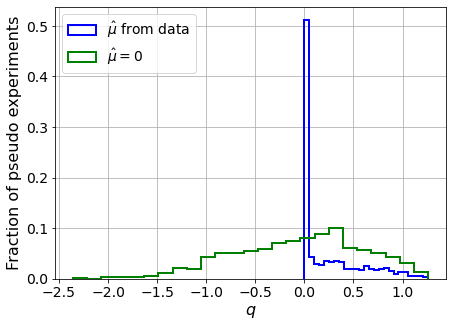

muhat mean:  0.6795381639617847
Z_bins:  0.20376719781917063
std Z_bins:  0.7919769884690255
Z_bins mu=0:  0.11232822481178147
std Z_bins mu=0:  2.906046799826842

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.701


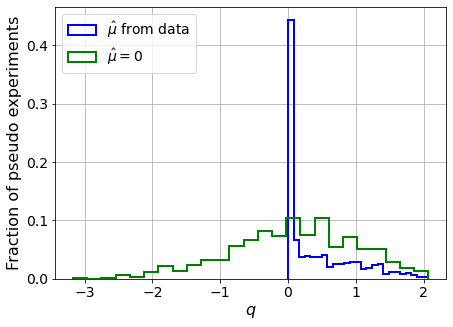

muhat mean:  0.34966763738347506
Z_bins:  0.3816605858885348
std Z_bins:  0.6885763842749445
Z_bins mu=0:  0.34466366978773055
std Z_bins mu=0:  1.3504133065395878

--------

B_expected:  643
S_expected:  6

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6865


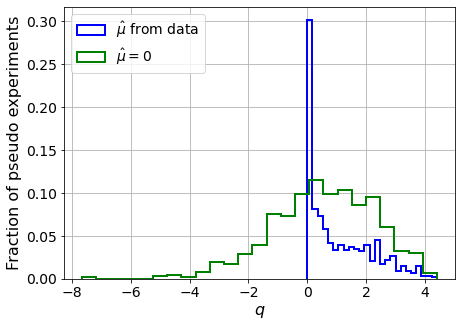

muhat mean:  0.23188653786143243
Z_bins:  0.8228019591953992
std Z_bins:  0.664096186811021
Z_bins mu=0:  0.7818319197818677
std Z_bins mu=0:  1.1182387305495982

--------

B_expected:  643
S_expected:  11

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.7055


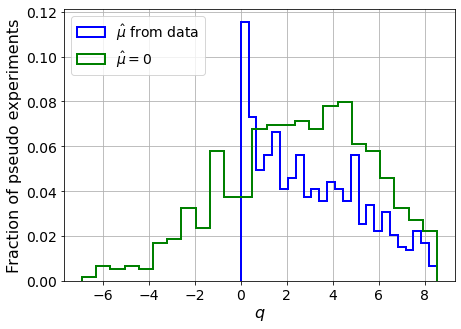

muhat mean:  0.10611229754460211
Z_bins:  1.6439221254759666
std Z_bins:  0.6972633317586902
Z_bins mu=0:  1.6319272020528497
std Z_bins mu=0:  0.9553110337531913

--------

B_expected:  643
S_expected:  21

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.698


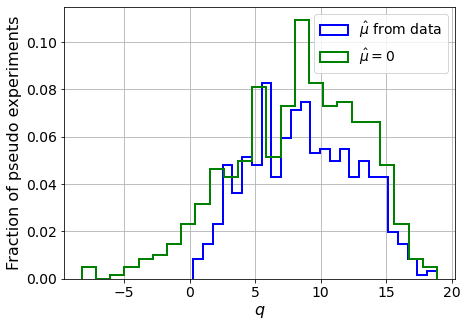

muhat mean:  0.06024697390939955
Z_bins:  2.929360320119439
std Z_bins:  0.6777622647294097
Z_bins mu=0:  2.9262771469345275
std Z_bins mu=0:  0.8283207729550925

--------

B_expected:  643
S_expected:  41

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.685


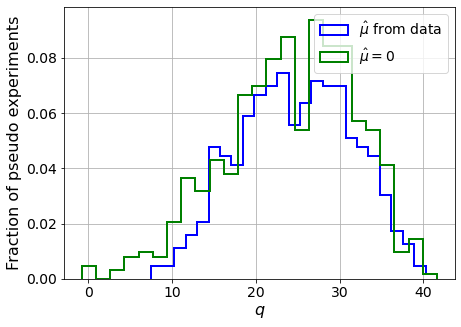

muhat mean:  0.0357356458923254
Z_bins:  4.9616505981830565
std Z_bins:  0.68219068411598
Z_bins mu=0:  4.957160870355112
std Z_bins mu=0:  0.7787213335225922

--------

B_expected:  643
S_expected:  79

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.699


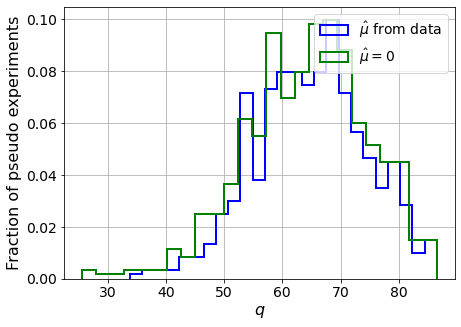

muhat mean:  0.015258927919809043
Z_bins:  8.073010519041715
std Z_bins:  0.5930670127381511
Z_bins mu=0:  8.071427453863771
std Z_bins mu=0:  0.6446517880202733

--------

B_expected:  643
S_expected:  152

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6945


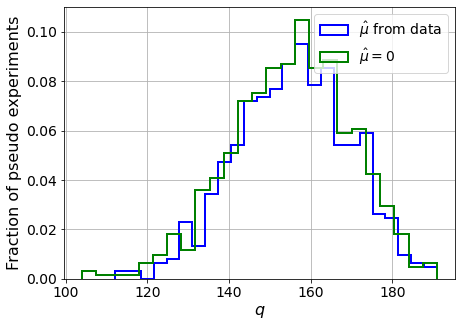

muhat mean:  0.007010502741987081
Z_bins:  12.498001451526685
std Z_bins:  0.549938178834597
Z_bins mu=0:  12.492136698605021
std Z_bins mu=0:  0.5820678566078825

--------

B_expected:  643
S_expected:  294

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.693


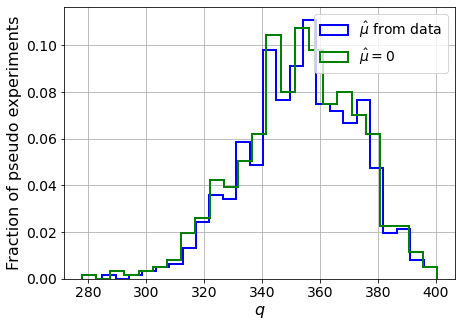

muhat mean:  0.004334689013279095
Z_bins:  18.821087994433125
std Z_bins:  0.5052495508309343
Z_bins mu=0:  18.81822082299475
std Z_bins mu=0:  0.527659148376789

--------

B_expected:  643
S_expected:  567

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.7


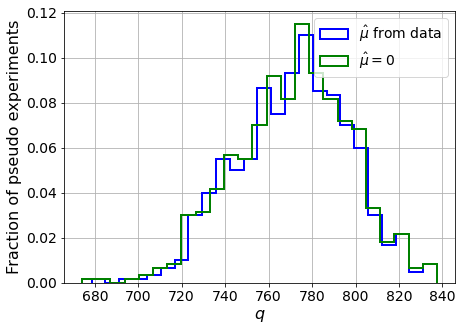

muhat mean:  0.0014436949525203425
Z_bins:  27.80566005932458
std Z_bins:  0.4648536177273377
Z_bins mu=0:  27.803038910799895
std Z_bins mu=0:  0.4769767510350974

--------

B_expected:  643
S_expected:  1094

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.677


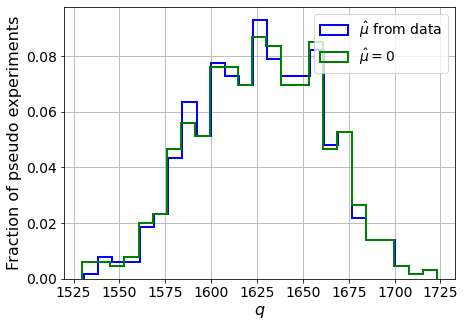

muhat mean:  0.0010324489129821405
Z_bins:  40.3478608834717
std Z_bins:  0.418897095780574
Z_bins mu=0:  40.340980721485685
std Z_bins mu=0:  0.4276770202974815

--------

B_expected:  643
S_expected:  2113

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6695


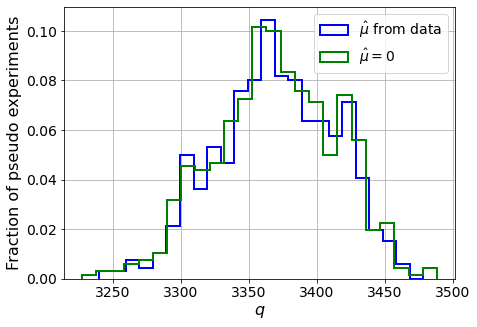

muhat mean:  0.0006012256221433476
Z_bins:  58.04576224288253
std Z_bins:  0.3768479257001188
Z_bins mu=0:  58.04357298339718
std Z_bins mu=0:  0.382869713243345

--------

B_expected:  643
S_expected:  4079

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.686


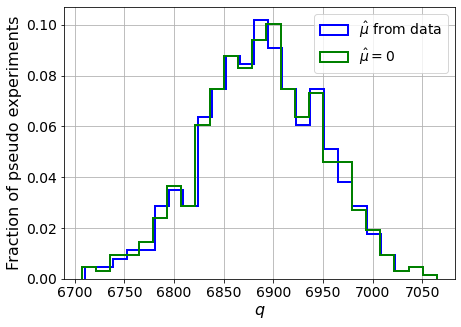

muhat mean:  0.0003488014210774916
Z_bins:  83.0106213906572
std Z_bins:  0.36665339734664976
Z_bins mu=0:  83.00469697192892
std Z_bins mu=0:  0.3706781941959962

--------

B_expected:  643
S_expected:  7876

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6875


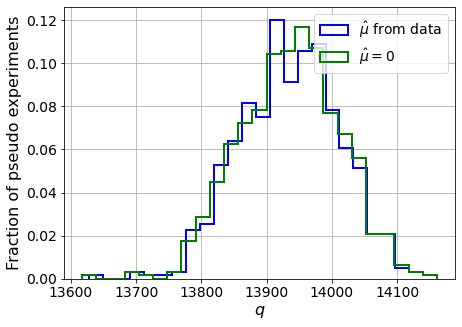

muhat mean:  0.00018325339533342694
Z_bins:  118.06027843399352
std Z_bins:  0.3224795475790354
Z_bins mu=0:  118.05830169875514
std Z_bins mu=0:  0.32493119718031577

--------


 FINAL RESULT:

[[0.013808375090696868, 5.846801891888215, 1.3658355420895174, 0.17753322470343957, 0.9810659922017897], [0.20376719781917063, 0.7919769884690255, 0.6795381639617847, 0.11232822481178147, 2.906046799826842], [0.3816605858885348, 0.6885763842749445, 0.34966763738347506, 0.34466366978773055, 1.3504133065395878], [0.8228019591953992, 0.664096186811021, 0.23188653786143243, 0.7818319197818677, 1.1182387305495982], [1.6439221254759666, 0.6972633317586902, 0.10611229754460211, 1.6319272020528497, 0.9553110337531913], [2.929360320119439, 0.6777622647294097, 0.06024697390939955, 2.9262771469345275, 0.8283207729550925], [4.9616505981830565, 0.68219068411598, 0.0357356458923254, 4.957160870355112, 0.7787213335225922], [8.073010519041715, 0.5930670127381511, 0.015258927919809043, 8.071427453863771, 0.6446

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 422.96167397 355.61507738 291.64323384
 217.88290771 140.17892701  62.79471156 -16.46847399 -92.14791208]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
          -inf  172.36166134  151.68095896  126.610574     9

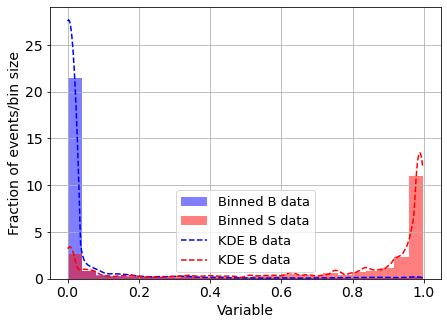

KDE Kernel:  epanechnikov
Background bandwidth:  0.03613222756796251
Signal bandwidth:  0.022117541055781564
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



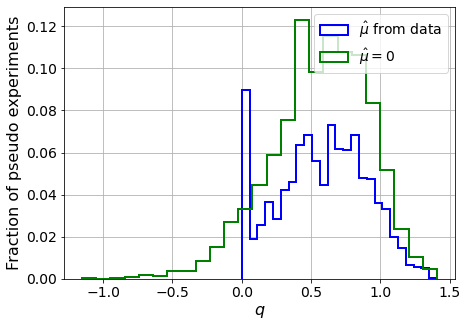

muhat mean:  -9.715567840235293
Z_bins:  0.7703640106095966
std Z_bins:  0.20854794947169022
Z_bins mu=0:  0.7703640106095966
std Z_bins mu=0:  0.22947455123565458

--------

B_expected:  643
S_expected:  2



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


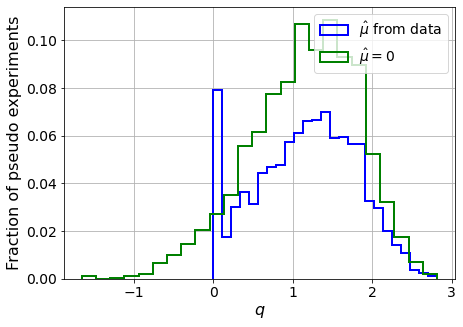

muhat mean:  -4.593252118269496
Z_bins:  1.0959184811435854
std Z_bins:  0.2872428135484432
Z_bins mu=0:  1.0959184811435854
std Z_bins mu=0:  0.31003117256739965

--------

B_expected:  643
S_expected:  3



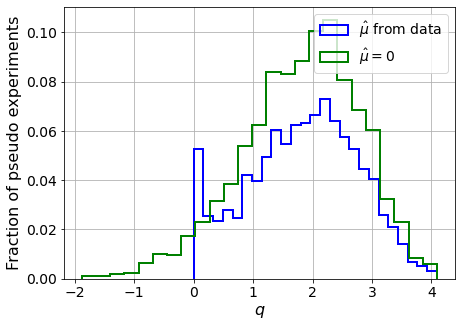

muhat mean:  -3.058784847528652
Z_bins:  1.3784527906814252
std Z_bins:  0.33446243342892795
Z_bins mu=0:  1.3784527906814252
std Z_bins mu=0:  0.3567888922476599

--------

B_expected:  643
S_expected:  6



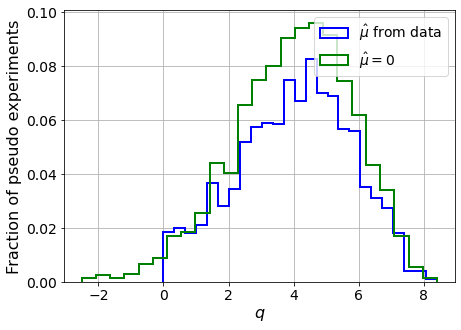

muhat mean:  -1.56026867156366
Z_bins:  2.030236057321656
std Z_bins:  0.42665639269771494
Z_bins mu=0:  2.030236057321656
std Z_bins mu=0:  0.44418015948343637

--------

B_expected:  643
S_expected:  11



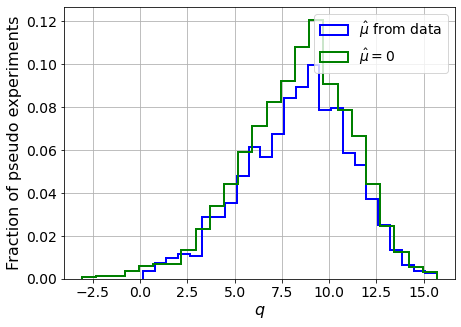

muhat mean:  -0.9235344587304546
Z_bins:  2.923804821273176
std Z_bins:  0.47979914250867234
Z_bins mu=0:  2.923804821273176
std Z_bins mu=0:  0.4951670410388976

--------

B_expected:  643
S_expected:  21



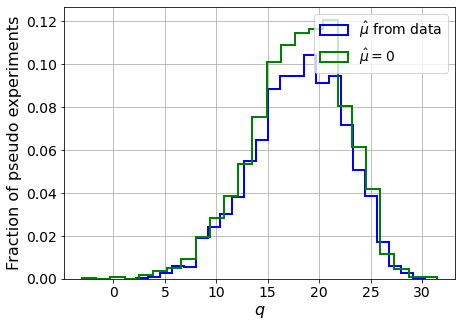

muhat mean:  -0.43087482627012647
Z_bins:  4.27554616794488
std Z_bins:  0.5210703610368805
Z_bins mu=0:  4.27554616794488
std Z_bins mu=0:  0.5312983123758755

--------

B_expected:  643
S_expected:  41



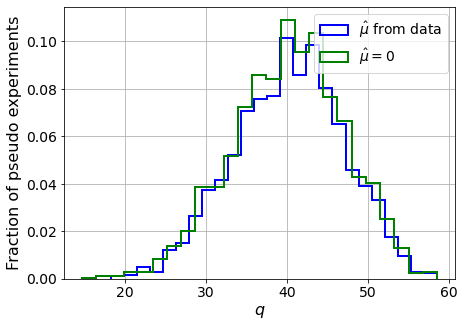

muhat mean:  -0.22541267433290121
Z_bins:  6.367994881700953
std Z_bins:  0.5308482209356145
Z_bins mu=0:  6.367994881700953
std Z_bins mu=0:  0.5357953688013235

--------

B_expected:  643
S_expected:  79



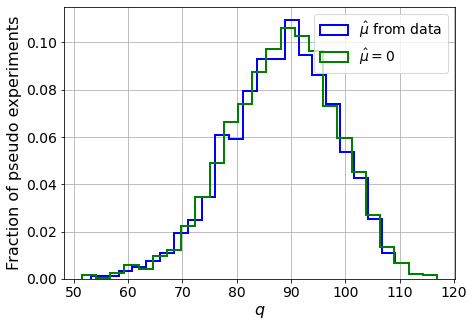

muhat mean:  -0.11608272168863479
Z_bins:  9.435360495474049
std Z_bins:  0.5241549268908602
Z_bins mu=0:  9.435360495474049
std Z_bins mu=0:  0.5279711846263977

--------

B_expected:  643
S_expected:  152



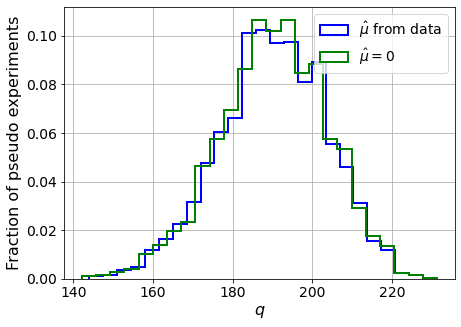

muhat mean:  -0.0561437210067501
Z_bins:  13.804734294693258
std Z_bins:  0.48735516282882
Z_bins mu=0:  13.804734294693258
std Z_bins mu=0:  0.4895214436781348

--------

B_expected:  643
S_expected:  294



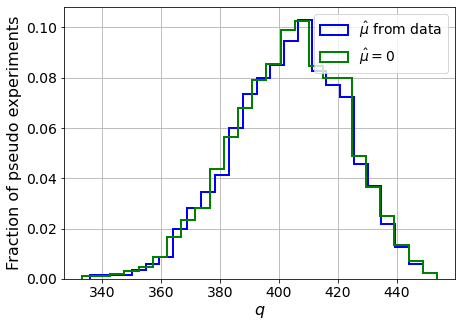

muhat mean:  -0.032612157001942095
Z_bins:  20.1138198621085
std Z_bins:  0.47887518943330093
Z_bins mu=0:  20.1138198621085
std Z_bins mu=0:  0.48046200881677853

--------

B_expected:  643
S_expected:  567



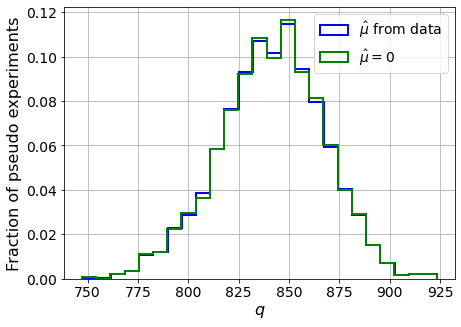

muhat mean:  -0.016340048454738933
Z_bins:  29.023345820059212
std Z_bins:  0.44551373585530146
Z_bins mu=0:  29.0231483340236
std Z_bins mu=0:  0.4465200308328347

--------

B_expected:  643
S_expected:  1094



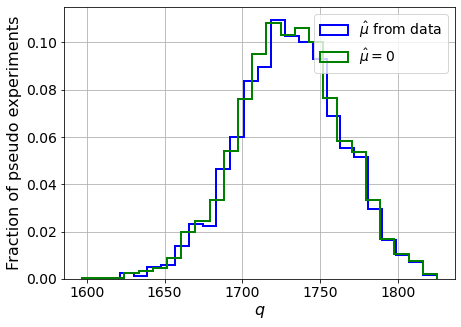

muhat mean:  -0.0089866764598319
Z_bins:  41.601145911803705
std Z_bins:  0.40165789605604874
Z_bins mu=0:  41.601145911803705
std Z_bins mu=0:  0.40247378475012874

--------

B_expected:  643
S_expected:  2113



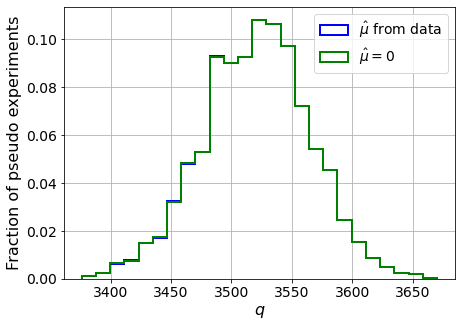

muhat mean:  -0.00460905108682593
Z_bins:  59.344451832217665
std Z_bins:  0.3728572395180754
Z_bins mu=0:  59.344451832217665
std Z_bins mu=0:  0.373327651965402

--------

B_expected:  643
S_expected:  4079



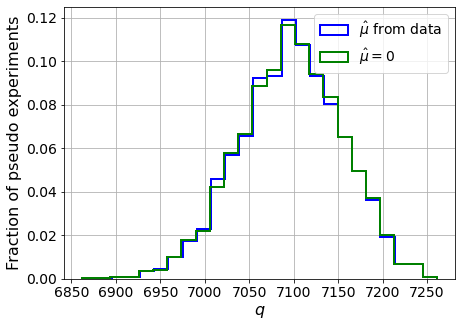

muhat mean:  -0.002222555254718747
Z_bins:  84.24496088679035
std Z_bins:  0.34599406533473587
Z_bins mu=0:  84.24496088679035
std Z_bins mu=0:  0.34625507259668253

--------

B_expected:  643
S_expected:  7876



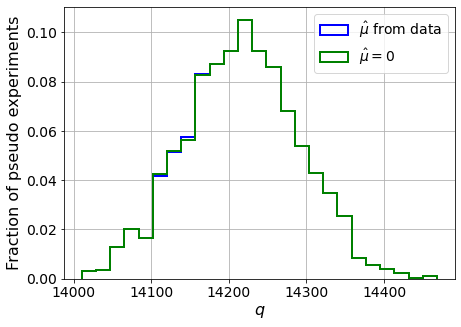

muhat mean:  -0.0012130333747699255
Z_bins:  119.23501094867385
std Z_bins:  0.3068665219921043
Z_bins mu=0:  119.23501094867385
std Z_bins mu=0:  0.30698226853439564

--------


 FINAL RESULT:

[[0.7703640106095966, 0.20854794947169022, -9.715567840235293, 0.7703640106095966, 0.22947455123565458], [1.0959184811435854, 0.2872428135484432, -4.593252118269496, 1.0959184811435854, 0.31003117256739965], [1.3784527906814252, 0.33446243342892795, -3.058784847528652, 1.3784527906814252, 0.3567888922476599], [2.030236057321656, 0.42665639269771494, -1.56026867156366, 2.030236057321656, 0.44418015948343637], [2.923804821273176, 0.47979914250867234, -0.9235344587304546, 2.923804821273176, 0.4951670410388976], [4.27554616794488, 0.5210703610368805, -0.43087482627012647, 4.27554616794488, 0.5312983123758755], [6.367994881700953, 0.5308482209356145, -0.22541267433290121, 6.367994881700953, 0.5357953688013235], [9.435360495474049, 0.5241549268908602, -0.11608272168863479, 9.435360495474049, 0.527971

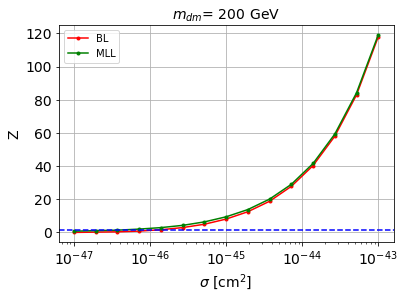


cross_BL_164:  1.386709121340441e-46
cross_BL_164_up:  8.097433589578981e-47
cross_BL_164_down:  1.970893010462454e-46

cross_MLL_164:  4.853777157117681e-47
cross_MLL_164_up:  3.494833388255613e-47
cross_MLL_164_down:  7.4049894971064775e-47

#########################


#########################

mDM =  500 GeV


S_cs1.shape:  (35477,)
S_cs2.shape:  (35477,)
 NUM_DAT:  32117 

NUM_DAT_ER:  31709
NUM_DAT_AC:  112
NUM_DAT_CNNS:  1
NUM_DAT_RN:  29
NUM_DAT_WALL:  266

B_cs1cs2.shape:  (32117, 2)

S_cs1cs2.shape:  (32117, 2)


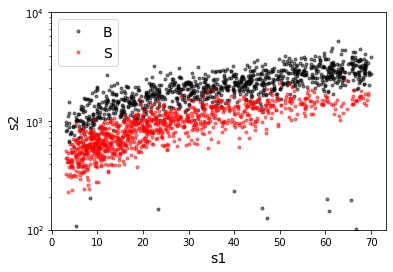

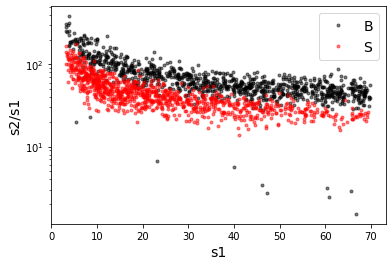

X_mon_B.shape:  (32117, 2)
X_mon_S.shape:  (32117, 2)
X_mon.shape:  (64234, 2)

X_mon_train :  (40948, 2)
y_mon_train :  (40948,)
X_mon_val :  (7227, 2)
y_mon_val :  (7227,)
X_mon_test :  (16059, 2)
y_mon_test :  (16059,)

Classification score:


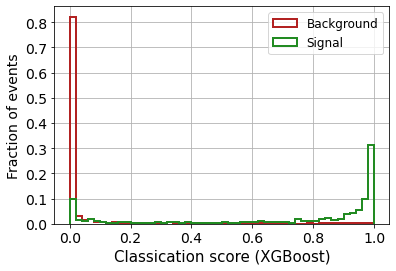


 ROC-AUC =  0.9418099844661239
At least 5 B events per bin, range = [[0, 1]]:
# bins:  7 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  7
range of our data:  [[0, 1]]
number of bins we are going to use:  7
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6245


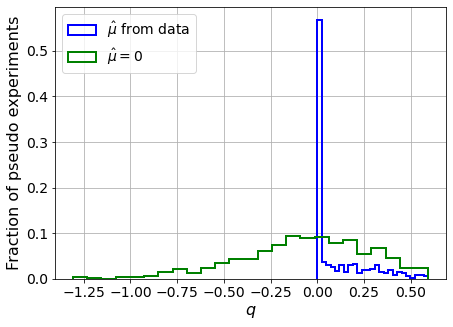

muhat mean:  1.3437841963546502
Z_bins:  0.0009731683947798463
std Z_bins:  78.24587957933363
Z_bins mu=0:  0.19210827128592045
std Z_bins mu=0:  0.8919266378246705

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6475


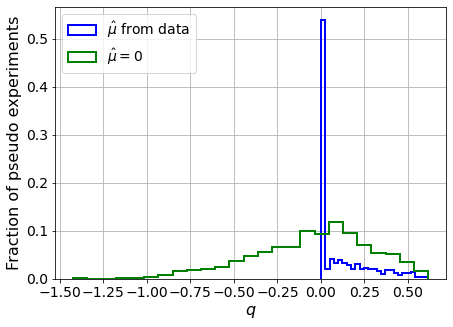

muhat mean:  1.1240975076577917
Z_bins:  0.094155434201218
std Z_bins:  0.8266670706853475
Z_bins mu=0:  0.04095586429802722
std Z_bins mu=0:  4.123706923233656

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.615


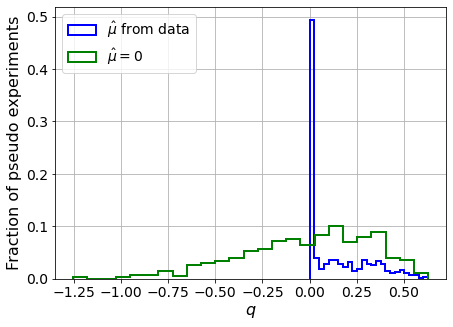

muhat mean:  0.7139527133265822
Z_bins:  0.1788521590628458
std Z_bins:  0.4603128764904338
Z_bins mu=0:  0.17782406850140403
std Z_bins mu=0:  0.9554513496028418

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6465


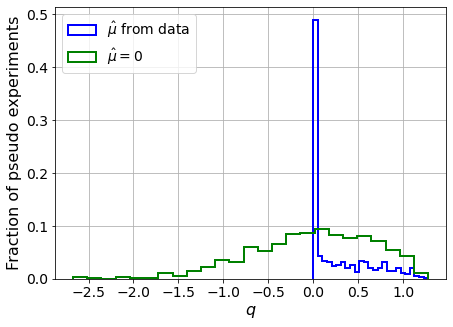

muhat mean:  0.5377157766216367
Z_bins:  0.24334212207099623
std Z_bins:  0.7081583064924737
Z_bins mu=0:  0.19791572519536438
std Z_bins mu=0:  1.7238726415688248

--------

B_expected:  643
S_expected:  5

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6485


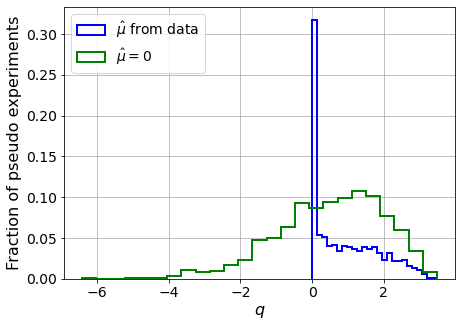

muhat mean:  0.17920825521762143
Z_bins:  0.8299719475861211
std Z_bins:  0.5475389572238352
Z_bins mu=0:  0.8260970121197785
std Z_bins mu=0:  0.9146096377790867

--------

B_expected:  643
S_expected:  9

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6375


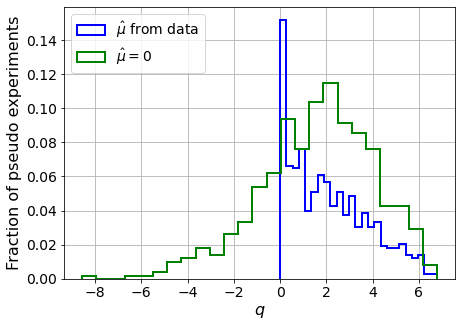

muhat mean:  0.14423314053549383
Z_bins:  1.3633251091680882
std Z_bins:  0.6192337701317707
Z_bins mu=0:  1.3524849809428612
std Z_bins mu=0:  0.902566095490746

--------

B_expected:  643
S_expected:  17

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6505


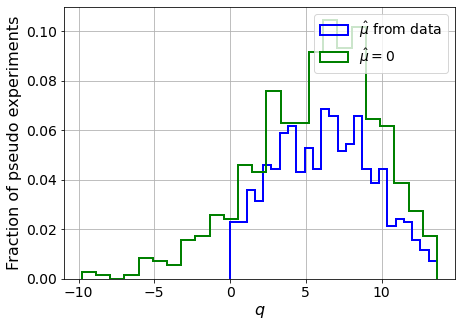

muhat mean:  0.07473646671354092
Z_bins:  2.499372717955332
std Z_bins:  0.6349813564216319
Z_bins mu=0:  2.49734525174592
std Z_bins mu=0:  0.8169835932866771

--------

B_expected:  643
S_expected:  33

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.647


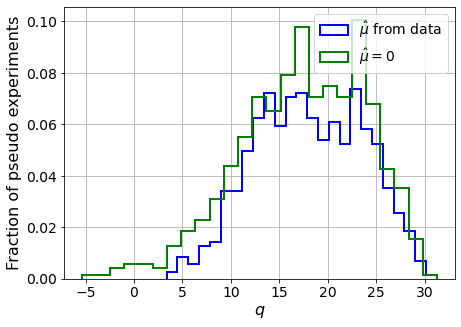

muhat mean:  0.038578086380701405
Z_bins:  4.2315650262364315
std Z_bins:  0.6576117719553187
Z_bins mu=0:  4.225133715127953
std Z_bins mu=0:  0.763338927627945

--------

B_expected:  643
S_expected:  64

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6495


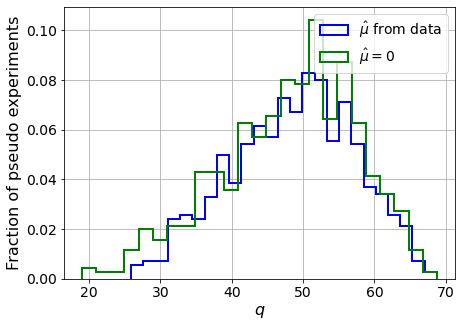

muhat mean:  0.016543609147783123
Z_bins:  7.0114608955405835
std Z_bins:  0.6205173880843293
Z_bins mu=0:  7.010244209395556
std Z_bins mu=0:  0.6826690215829818

--------

B_expected:  643
S_expected:  124

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6515


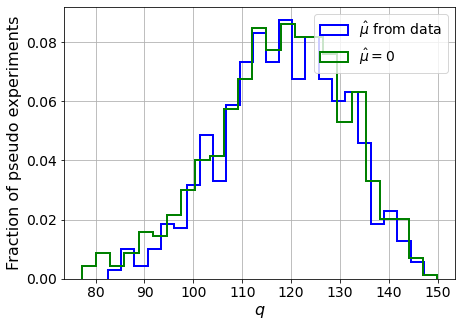

muhat mean:  0.009966415332957685
Z_bins:  10.901397904985352
std Z_bins:  0.5742777169273284
Z_bins mu=0:  10.901397904985352
std Z_bins mu=0:  0.6143391836175321

--------

B_expected:  643
S_expected:  239

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6275


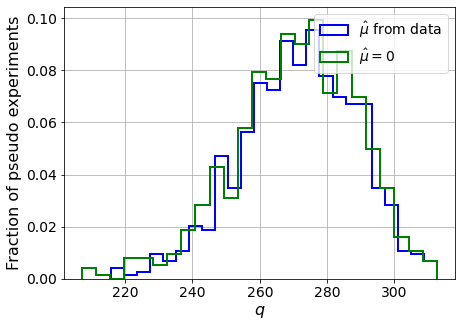

muhat mean:  0.005977887358647055
Z_bins:  16.496617256574044
std Z_bins:  0.5139076077549003
Z_bins mu=0:  16.496617256574044
std Z_bins mu=0:  0.5422902634241668

--------

B_expected:  643
S_expected:  462

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.631


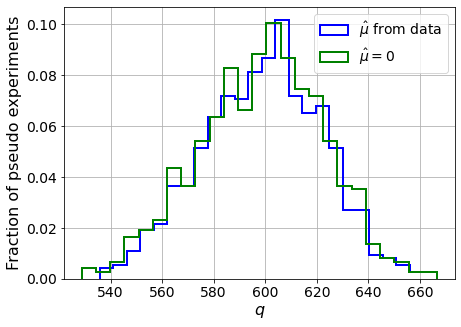

muhat mean:  0.0032342756480893036
Z_bins:  24.493637176352085
std Z_bins:  0.4731812268115395
Z_bins mu=0:  24.491038903959513
std Z_bins mu=0:  0.4897813528636622

--------

B_expected:  643
S_expected:  892

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6425


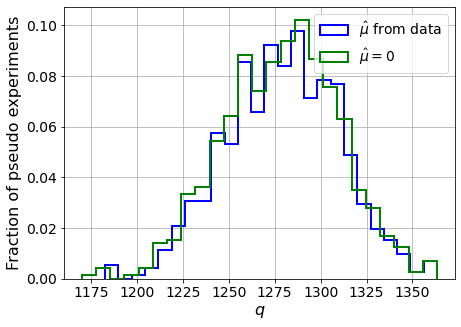

muhat mean:  0.0014183313832213569
Z_bins:  35.7779427691587
std Z_bins:  0.4293791981259867
Z_bins mu=0:  35.77038252617728
std Z_bins mu=0:  0.43945449939934256

--------

B_expected:  643
S_expected:  1723

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.652


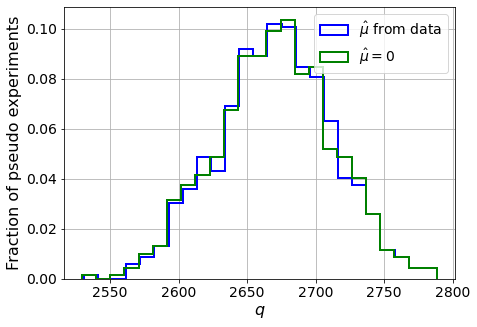

muhat mean:  0.0006958593839723437
Z_bins:  51.69002938833323
std Z_bins:  0.40029701211487506
Z_bins mu=0:  51.68690268434643
std Z_bins mu=0:  0.4065952619582318

--------

B_expected:  643
S_expected:  3326

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.621


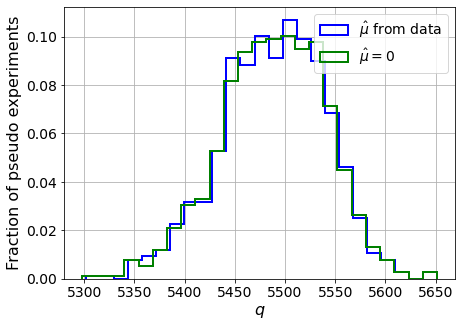

muhat mean:  0.0005118031531554234
Z_bins:  74.10381224477845
std Z_bins:  0.35182478007060636
Z_bins mu=0:  74.1007055841202
std Z_bins mu=0:  0.3559941669035116

--------


 FINAL RESULT:

[[0.0009731683947798463, 78.24587957933363, 1.3437841963546502, 0.19210827128592045, 0.8919266378246705], [0.094155434201218, 0.8266670706853475, 1.1240975076577917, 0.04095586429802722, 4.123706923233656], [0.1788521590628458, 0.4603128764904338, 0.7139527133265822, 0.17782406850140403, 0.9554513496028418], [0.24334212207099623, 0.7081583064924737, 0.5377157766216367, 0.19791572519536438, 1.7238726415688248], [0.8299719475861211, 0.5475389572238352, 0.17920825521762143, 0.8260970121197785, 0.9146096377790867], [1.3633251091680882, 0.6192337701317707, 0.14423314053549383, 1.3524849809428612, 0.902566095490746], [2.499372717955332, 0.6349813564216319, 0.07473646671354092, 2.49734525174592, 0.8169835932866771], [4.2315650262364315, 0.6576117719553187, 0.038578086380701405, 4.225133715127953, 0.763338

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 420.26977806 355.01637265 288.64691562
 214.7264456  137.95591116  62.20327177 -15.07854802 -91.21102713]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
  177.85377425  157.22677764  136.82131899  112.73122078   8

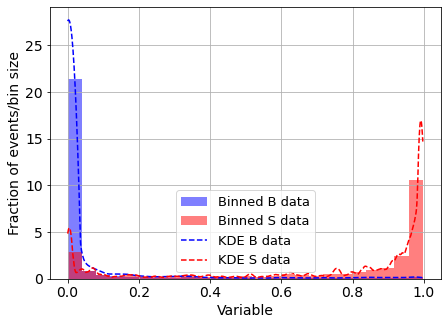

KDE Kernel:  epanechnikov
Background bandwidth:  0.03613222756796251
Signal bandwidth:  0.013538761800225447
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



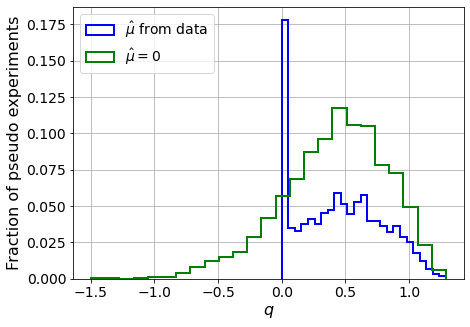

muhat mean:  -7.815204963979816
Z_bins:  0.6707396848843811
std Z_bins:  0.24694570175269026
Z_bins mu=0:  0.6707396848843811
std Z_bins mu=0:  0.3069154528765188

--------

B_expected:  643
S_expected:  1



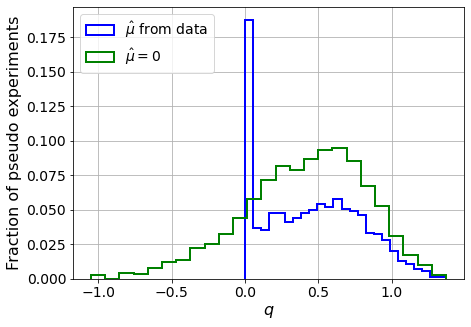

muhat mean:  -8.934475185027296
Z_bins:  0.6724158759100379
std Z_bins:  0.24862307527310157
Z_bins mu=0:  0.6724158759100379
std Z_bins mu=0:  0.3063358915971931

--------

B_expected:  643
S_expected:  1



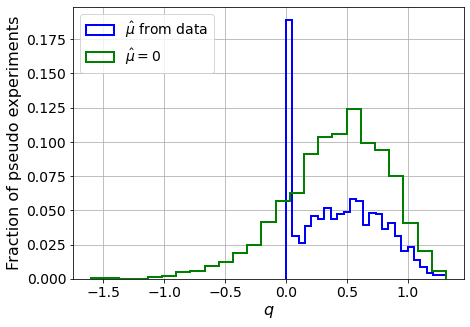

muhat mean:  -7.790336293679873
Z_bins:  0.6768011412133044
std Z_bins:  0.2452834618719682
Z_bins mu=0:  0.6768011412133044
std Z_bins mu=0:  0.3088972341089888

--------

B_expected:  643
S_expected:  2



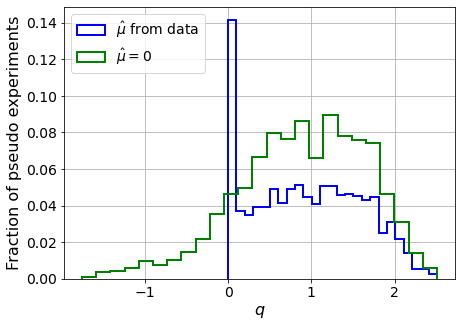

muhat mean:  -3.6678458932361444
Z_bins:  0.9699053896595516
std Z_bins:  0.3336434703099593
Z_bins mu=0:  0.9699053896595516
std Z_bins mu=0:  0.39444871050535657

--------

B_expected:  643
S_expected:  5



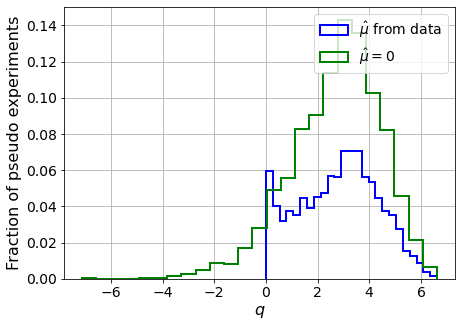

muhat mean:  -1.7497015870465817
Z_bins:  1.7138250143579756
std Z_bins:  0.446055005000418
Z_bins mu=0:  1.7138250143579756
std Z_bins mu=0:  0.509517969915502

--------

B_expected:  643
S_expected:  9



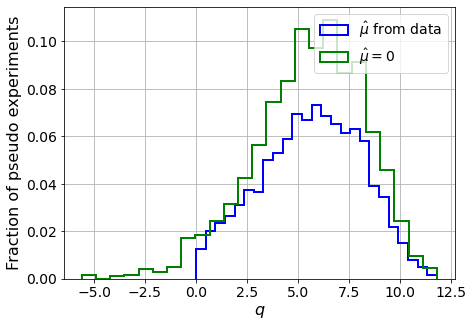

muhat mean:  -0.9171744454491277
Z_bins:  2.398940339195888
std Z_bins:  0.514618191693841
Z_bins mu=0:  2.398940339195888
std Z_bins mu=0:  0.5598563565403729

--------

B_expected:  643
S_expected:  17



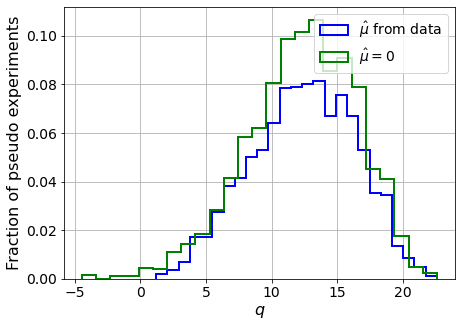

muhat mean:  -0.44205857307315843
Z_bins:  3.5396746075100527
std Z_bins:  0.5567510868422594
Z_bins mu=0:  3.5396746075100527
std Z_bins mu=0:  0.5867543256068576

--------

B_expected:  643
S_expected:  33



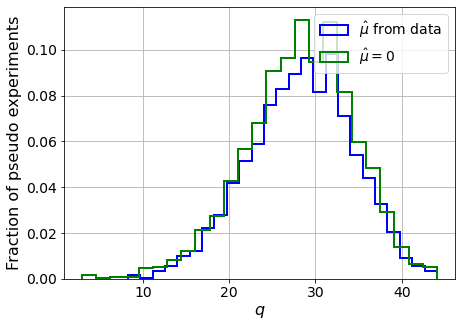

muhat mean:  -0.2417725411045821
Z_bins:  5.340316564893665
std Z_bins:  0.5597175804676302
Z_bins mu=0:  5.340316564893665
std Z_bins mu=0:  0.5820541393262776

--------

B_expected:  643
S_expected:  64



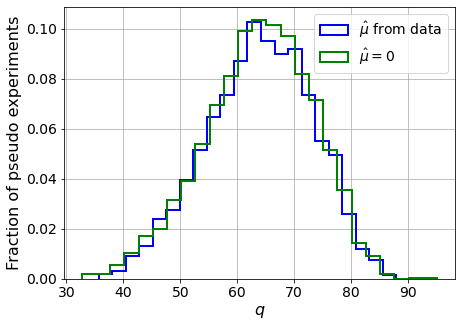

muhat mean:  -0.12828888830071924
Z_bins:  8.015728910076074
std Z_bins:  0.5808484288562915
Z_bins mu=0:  8.015728910076074
std Z_bins mu=0:  0.5936636790804986

--------

B_expected:  643
S_expected:  124



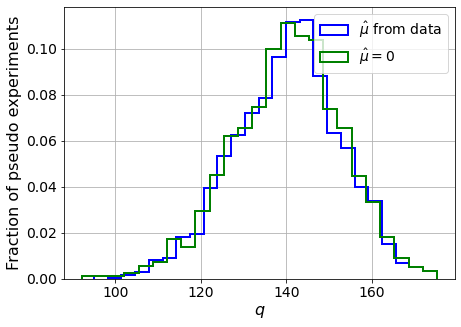

muhat mean:  -0.05862330748677121
Z_bins:  11.873222095925087
std Z_bins:  0.5280637084419936
Z_bins mu=0:  11.873181510612085
std Z_bins mu=0:  0.5363210716781707

--------

B_expected:  643
S_expected:  239



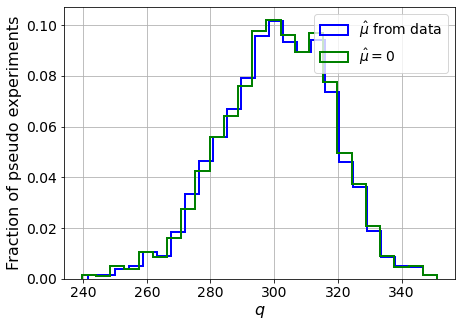

muhat mean:  -0.0341447076379321
Z_bins:  17.367128666499696
std Z_bins:  0.4954915501802497
Z_bins mu=0:  17.366688566207205
std Z_bins mu=0:  0.5005781566823121

--------

B_expected:  643
S_expected:  462



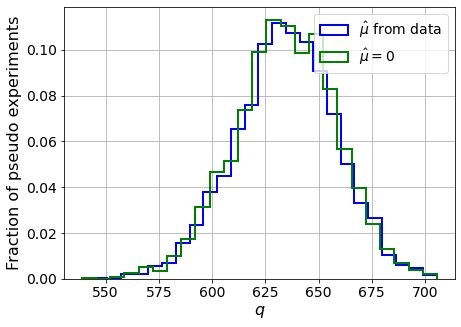

muhat mean:  -0.017355032662410237
Z_bins:  25.196927714223225
std Z_bins:  0.4674435218461027
Z_bins mu=0:  25.196927714223225
std Z_bins mu=0:  0.47083646560310605

--------

B_expected:  643
S_expected:  892



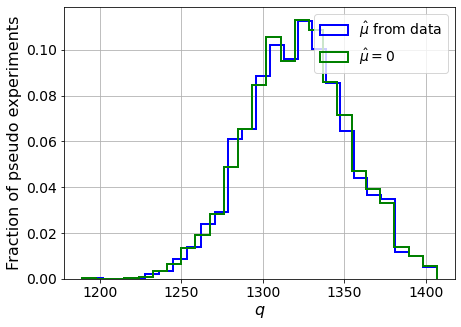

muhat mean:  -0.008791178720913551
Z_bins:  36.35770653313969
std Z_bins:  0.4325972468648056
Z_bins mu=0:  36.35715955402407
std Z_bins mu=0:  0.4344113980106913

--------

B_expected:  643
S_expected:  1723



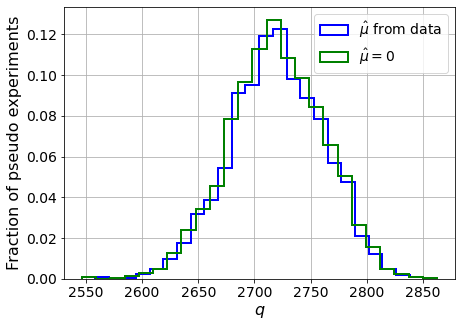

muhat mean:  -0.005170391705744858
Z_bins:  52.15085614569593
std Z_bins:  0.4006997892491214
Z_bins mu=0:  52.15028331041432
std Z_bins mu=0:  0.4022117528808855

--------

B_expected:  643
S_expected:  3326



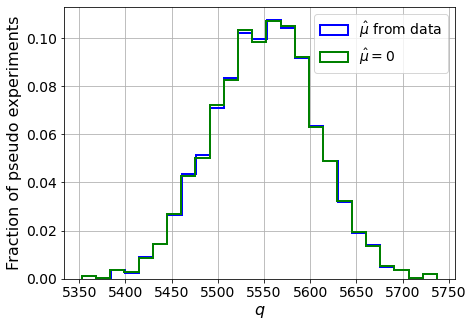

muhat mean:  -0.002273063981440126
Z_bins:  74.50423434559245
std Z_bins:  0.37832996879199826
Z_bins mu=0:  74.50423434559245
std Z_bins mu=0:  0.37900575630203426

--------


 FINAL RESULT:

[[0.6707396848843811, 0.24694570175269026, -7.815204963979816, 0.6707396848843811, 0.3069154528765188], [0.6724158759100379, 0.24862307527310157, -8.934475185027296, 0.6724158759100379, 0.3063358915971931], [0.6768011412133044, 0.2452834618719682, -7.790336293679873, 0.6768011412133044, 0.3088972341089888], [0.9699053896595516, 0.3336434703099593, -3.6678458932361444, 0.9699053896595516, 0.39444871050535657], [1.7138250143579756, 0.446055005000418, -1.7497015870465817, 1.7138250143579756, 0.509517969915502], [2.398940339195888, 0.514618191693841, -0.9171744454491277, 2.398940339195888, 0.5598563565403729], [3.5396746075100527, 0.5567510868422594, -0.44205857307315843, 3.5396746075100527, 0.5867543256068576], [5.340316564893665, 0.5597175804676302, -0.2417725411045821, 5.340316564893665, 0.5820541

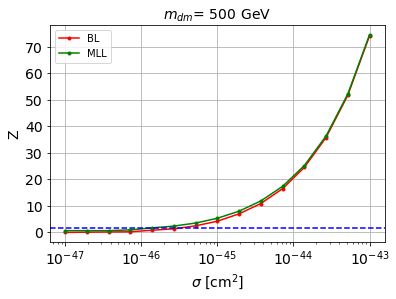


cross_BL_164:  3.1488701539451014e-46
cross_BL_164_up:  1.848455952915076e-46
cross_BL_164_down:  4.750986706035373e-46

cross_MLL_164:  1.294403945230332e-46
cross_MLL_164_up:  9.319648698764525e-47
cross_MLL_164_down:  2.067049850242316e-46

#########################



In [10]:
store_cross_BL_164 = []
store_cross_BL_164_up = []
store_cross_BL_164_down = []

store_cross_MLL_164 = []
store_cross_MLL_164_up = []
store_cross_MLL_164_down = []


for m_it2 in range(len(mDM_mDM)):

    # set the parameters
    mDM = mDM_mDM[m_it2]
    S_cross1045 = S_cross1045_mDM[m_it2]
    S_expected = S_expected_mDM[m_it2]

    print('\n#########################\n')
    print('mDM = ', mDM, 'GeV\n')


    ##########
    # SIGNAL #
    ##########

    S_cs1 = np.loadtxt(filefolder + 'WIMP_' + str(mDM) + 'GeV_cs1.txt')
    S_cs2 = np.loadtxt(filefolder + 'WIMP_' + str(mDM) + 'GeV_cs2.txt')

    print('\nS_cs1.shape: ', S_cs1.shape)
    print('S_cs2.shape: ', S_cs2.shape)

    S_cs1_aux = [S_cs1[x] for x in range(len(S_cs1)) if (3 < S_cs1[x] < 70 and 50 < S_cs2[x] < 8000)]
    S_cs2 = [S_cs2[x] for x in range(len(S_cs1)) if (3 < S_cs1[x] < 70 and 50 < S_cs2[x] < 8000)]
    S_cs1 = S_cs1_aux


    # set events per classs
    NUM_DAT = min(len(B_cs1_ER), len(S_cs1))
    print(' NUM_DAT: ', NUM_DAT, '\n')

    NUM_DAT_AC = int(NUM_DAT*f_AC)
    NUM_DAT_CNNS = max(1, int(NUM_DAT*f_CNNS))
    NUM_DAT_RN = int(NUM_DAT*f_RN)
    NUM_DAT_WALL = int(NUM_DAT*f_WALL)

    NUM_DAT_ER = NUM_DAT - ( NUM_DAT_AC + NUM_DAT_CNNS + NUM_DAT_RN + NUM_DAT_WALL )

    print('NUM_DAT_ER: ', NUM_DAT_ER)
    print('NUM_DAT_AC: ', NUM_DAT_AC)
    print('NUM_DAT_CNNS: ', NUM_DAT_CNNS)
    print('NUM_DAT_RN: ', NUM_DAT_RN)
    print('NUM_DAT_WALL: ', NUM_DAT_WALL)



    # CONCATENATE THE BACKGROUNDS
    B_cs1cs2 = np.concatenate([np.stack([B_cs1_ER,B_cs2_ER],axis=1)[:NUM_DAT_ER], np.stack([B_cs1_AC,B_cs2_AC],axis=1)[:NUM_DAT_AC], np.stack([B_cs1_CNNS,B_cs2_CNNS],axis=1)[:NUM_DAT_CNNS], np.stack([B_cs1_RN,B_cs2_RN],axis=1)[:NUM_DAT_RN], np.stack([B_cs1_WALL,B_cs2_WALL],axis=1)[:NUM_DAT_WALL]])

    print('\nB_cs1cs2.shape: ', B_cs1cs2.shape)


    S_cs1cs2 = np.stack([S_cs1,S_cs2],axis=1)[:NUM_DAT]


    print('\nS_cs1cs2.shape: ', S_cs1cs2.shape)


    rnd = 100

    B_cs1cs2_plot = shuffle(B_cs1cs2, random_state=rnd)
    S_cs1cs2_plot = shuffle(S_cs1cs2, random_state=rnd)

    plt.plot(B_cs1cs2_plot[:,0][:1000], B_cs1cs2_plot[:,1][:1000], '.', color='black', alpha=0.5, label='B')
    plt.plot(S_cs1cs2_plot[:,0][:1000], S_cs1cs2_plot[:,1][:1000], '.', color='red', alpha=0.5, label='S')
    plt.yscale('log')
    # plt.xlim([0,100])
    plt.ylim([100,10000])
    plt.xlabel('s1',fontsize=14)
    plt.ylabel('s2',fontsize=14)
    plt.legend(fontsize=14)
    plt.show()



    plt.plot(B_cs1cs2_plot[:,0][:1000], (B_cs1cs2_plot[:,1] / B_cs1cs2_plot[:,0])[:1000], '.', color='black', alpha=0.5, label='B')
    plt.plot(S_cs1cs2_plot[:,0][:1000], (S_cs1cs2_plot[:,1] / S_cs1cs2_plot[:,0])[:1000], '.', color='red', alpha=0.5, label='S')
    plt.yscale('log')
    # plt.xlim([0,100])
    # plt.ylim([100,10000])
    plt.xlabel('s1',fontsize=14)
    plt.ylabel('s2/s1',fontsize=14)
    plt.legend(fontsize=14)
    plt.show()


    ############
    # DATASETS #
    ############

    # concatenate the data
    X_mon_B = B_cs1cs2
    X_mon_S = S_cs1cs2

    # X_mon_B = np.reshape(B_pdiffT,(len(B_pdiffT),1))
    # X_mon_S = np.reshape(S_pdiffT,(len(S_pdiffT),1))
    print('X_mon_B.shape: ', X_mon_B.shape)
    print('X_mon_S.shape: ', X_mon_S.shape)

    # del B_ppeakS1
    # del B_ppeakS2
    # del B_pbot
    # del B_ptop

    # del S_ppeakS1
    # del S_ppeakS2
    # del S_pbot
    # del S_ptop

    X_mon = np.concatenate([X_mon_B, X_mon_S])

    # X_mon = np.concatenate([np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(S_pbot,(len(S_pbot),1))])

    print('X_mon.shape: ', X_mon.shape)
    # del X_mon_B
    # del X_mon_S


    # labels
    y_mon = np.concatenate([np.zeros(NUM_DAT),np.ones(NUM_DAT)])


    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                    y_mon,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon,
                                                                    shuffle=True)

    del X_mon
    del y_mon

    X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                      y_mon_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon_aux,
                                                                      shuffle=True)

    del X_mon_aux
    del y_mon_aux

    print('')
    print('X_mon_train : ', X_mon_train.shape)
    print('y_mon_train : ', y_mon_train.shape)
    print('X_mon_val : ', X_mon_val.shape)
    print('y_mon_val : ', y_mon_val.shape)
    print('X_mon_test : ', X_mon_test.shape)
    print('y_mon_test : ', y_mon_test.shape)
    print('')



    # PREDICTIONS
    y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


    # ROC
    fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
    roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)



    # XGBoost with the kinematic variables of the leptons

    ########################
    # CLASSIFICATION SCORE #
    ########################

    # Outputs for validation data set

    pred_XG_SM = []
    pred_XG_NP = []

    for i in range(len(y_mon_test)):
        if y_mon_test[i] == 0:
            pred_XG_SM.append(y_pred_xg[i])
        else:
            pred_XG_NP.append(y_pred_xg[i])


    print('Classification score:')

    weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
    nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

    weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
    nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.xlabel("Classication score (XGBoost)",fontsize=15)
    plt.ylabel("Fraction of events",fontsize=14)
    plt.grid()
    plt.legend(fontsize=12)

    plt.show()




    print('\n ROC-AUC = ', roc_auc_xg)



    #######################
    # BIN LIKELIHOOD TEST #
    #######################

    MIN_EVS = 5 # min number of background events that we allow per bin
    range_dat = [[0,1]] # range of our data (between 0 and 1 if its the ML output)

    bins_to_test=range(1,500) # number of bins we are testing to see if condition holds

    # FIND THE NUMBER OF BINS:
    num_binsX = max_num_bins(pred_XG_SM, B_expected, range_dat, MIN_EVS, bins_to_test)

    print('\n FOR BIN LIKELIHOOD WE ARE SETTING:')
    print('min number of Background events allowed per bin: ', MIN_EVS)
    print('max number of bins allowed: ', num_binsX)
    print('range of our data: ', range_dat)




    num_bins = min(10, num_binsX)
    print('number of bins we are going to use: ', num_bins)


    # OPTION 2 (mu_hat with more precision) (slower, not so bad for bin likelihood)
    store_Z_BL = []


    for s_it in range(len(S_expected)):

        print('B_expected: ', B_expected)
        print('S_expected: ', S_expected[s_it])
        print('')

        Z_BL = BL_test_fsolve(D_or_E, pred_XG_SM, pred_XG_NP, B_expected, S_expected[s_it], num_pseudo, num_bins, range_dat, MIN_EVS, linear_bins=True) 

        store_Z_BL.append( list(Z_BL) )

        print('muhat mean: ', Z_BL[2])
        print('Z_bins: ', Z_BL[0])
        print('std Z_bins: ', Z_BL[1])
        print('Z_bins mu=0: ', Z_BL[3])
        print('std Z_bins mu=0: ', Z_BL[4])
        print('')
        print('--------\n')



    print('\n FINAL RESULT:\n')
    print(store_Z_BL)




    #######
    # MLL #
    #######

    # USE KDE TO ESTIMATE THE CLASSIFIER OUTPUT PDFs

    # outputs:
    # 1st -> background PDF
    # 2nd -> signal PDF
    # 3rd -> (normalization factor of the background PDF)**-1
    # 4th -> (normalization factor of the signal PDF)**-1
    # 5th -> background bandwidth
    # 6th -> signal bandwidth
    kde_bkg, kde_sig, norm_factor_SM, norm_factor_NP, B_bandwidth, S_bandwidth = KDE_fitter(pred_XG_SM, pred_XG_NP, 
                                                                                            1000, 
                                                                                            np.logspace(-4.0, 0.05, 20), 
                                                                                            set_kernel='epanechnikov')




    # FOR EXCLUSION:
    # we need to evaluate the KDE densities with the classifier output of BACKGROUND EVENTS

    print('This may take a while...')

    pB_B_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_SM, np.zeros(len(pred_XG_SM)) ]) )
    print('1 done')
    pS_B_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_SM, np.ones(len(pred_XG_SM)) ]) )
    print('2 done')

    # Normalize
    pB_B_data = pB_B_data / norm_factor_SM
    pS_B_data = pS_B_data / norm_factor_NP


    if D_or_E == "discovery":

        # FOR DISCOVERY:
        # we need to evaluate the KDE densities with the classifier output of BACKGROUND and SIGNAL EVENTS

        pB_S_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_NP, np.zeros(len(pred_XG_NP)) ]) )
        print('3 done')
        pS_S_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_NP, np.ones(len(pred_XG_NP)) ]) )
        print('4 done')

        # Normalize
        pB_S_data = pB_S_data / norm_factor_SM
        pS_S_data = pS_S_data / norm_factor_NP

    else:
        # dummies
        pB_S_data = 1
        pS_S_data = 1





    # OPTION 2 (mu_hat with more precision) (slower)
    store_Z_MLL = []


    for s_it in range(len(S_expected)):

        print('B_expected: ', B_expected)
        print('S_expected: ', S_expected[s_it])
        print('')

        Z_MLL = MLL_test_fsolve(D_or_E, pB_B_data, pS_B_data, pB_S_data, pS_S_data, B_expected, S_expected[s_it], num_pseudo)

        store_Z_MLL.append( list(Z_MLL) )

        print('muhat mean: ', Z_MLL[2])
        print('Z_bins: ', Z_MLL[0])
        print('std Z_bins: ', Z_MLL[1])
        print('Z_bins mu=0: ', Z_MLL[3])
        print('std Z_bins mu=0: ', Z_MLL[4])
        print('')
        print('--------\n')


    print('\n FINAL RESULT:\n')
    print(store_Z_MLL)


    store_Z_MLL = np.array(store_Z_MLL)

    for hd in range(len(store_Z_MLL[:,0])):
        if store_Z_MLL[:,0][hd] == 0:
            store_Z_MLL[:,0][hd] = store_Z_MLL[:,3][hd]
            store_Z_MLL[:,1][hd] = store_Z_MLL[:,4][hd]




    # plot
    plt.plot(cross_factor*1e-45, np.array(store_Z_BL)[:,0], '.-', c='red', label='BL')
    plt.plot(cross_factor*1e-45, np.array(store_Z_MLL)[:,0], '.-', c='green', label = "MLL")

    plt.axhline(y=1.64, c='blue', linestyle='--')
    plt.title('$m_{dm}$= %0.2d GeV' % mDM, fontsize=14)
    plt.xscale('log')
    plt.xlabel(r'$\sigma$ [cm$^2$]', fontsize=14)
    plt.ylabel(r'Z', fontsize=14)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()


    # interpolate
    f_Z = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0], kind='linear')
    f_Z_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0] + np.array(store_Z_BL)[:,1], kind='linear')
    f_Z_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0] - np.array(store_Z_BL)[:,1], kind='linear')

    # compute the cross section with Z=1.64
    cross_BL_164 = 10**solvecross(f_Z, 1.64)
    cross_BL_164_up = 10**solvecross(f_Z_up, 1.64)
    cross_BL_164_down = 10**solvecross(f_Z_down, 1.64)

    store_cross_BL_164.append(cross_BL_164)
    store_cross_BL_164_up.append(cross_BL_164_up)
    store_cross_BL_164_down.append(cross_BL_164_down)


    # interpolate
    f_Z_MLL = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0], kind='linear')
    f_Z_MLL_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] + np.array(store_Z_MLL)[:,1], kind='linear')
    f_Z_MLL_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] - np.array(store_Z_MLL)[:,1], kind='linear')

    # compute the cross section with Z=1.64
    cross_MLL_164 = 10**solvecross(f_Z_MLL, 1.64)
    cross_MLL_164_up = 10**solvecross(f_Z_MLL_up, 1.64)
    cross_MLL_164_down = 10**solvecross(f_Z_MLL_down, 1.64)

    store_cross_MLL_164.append(cross_MLL_164)
    store_cross_MLL_164_up.append(cross_MLL_164_up)
    store_cross_MLL_164_down.append(cross_MLL_164_down)


    print('\ncross_BL_164: ', cross_BL_164)
    print('cross_BL_164_up: ', cross_BL_164_up)
    print('cross_BL_164_down: ', cross_BL_164_down)

    print('\ncross_MLL_164: ', cross_MLL_164)
    print('cross_MLL_164_up: ', cross_MLL_164_up)
    print('cross_MLL_164_down: ', cross_MLL_164_down)
    print('\n#########################\n')


In [11]:
cross_cs1cs2 = store_cross_BL_164
cross_cs1cs2_up = store_cross_BL_164_up
cross_cs1cs2_down = store_cross_BL_164_down

print(cross_cs1cs2)
print(cross_cs1cs2_up)
print(cross_cs1cs2_down)


cross_cs1cs2_MLL = store_cross_MLL_164
cross_cs1cs2_MLL_up = store_cross_MLL_164_up
cross_cs1cs2_MLL_down = store_cross_MLL_164_down

print(cross_cs1cs2_MLL)
print(cross_cs1cs2_MLL_up)
print(cross_cs1cs2_MLL_down)

[1.262370879480838e-45, 8.196678465156648e-47, 4.539765582703348e-47, 4.81559835079824e-47, 7.6879158647776695e-47, 1.386709121340441e-46, 3.1488701539451014e-46]
[8.120156396759621e-46, 5.009253458674365e-47, 3.0759328204464317e-47, 2.772706882437853e-47, 4.859277075077984e-47, 8.097433589578981e-47, 1.848455952915076e-46]
[1.9925089140463956e-45, 1.1607499908844029e-46, 6.930825066131275e-47, 7.420695161449042e-47, 1.056667692022132e-46, 1.970893010462454e-46, 4.750986706035373e-46]
[7.426305649521964e-46, 4.189065642914612e-47, 2.4614162227128363e-47, 2.2011699497278087e-47, 3.6027580979352e-47, 4.853777157117681e-47, 1.294403945230332e-46]
[5.236092462790996e-46, 2.3360097779749336e-47, 1.385754896297991e-47, 1.415735737157797e-47, 1.948809946619225e-47, 3.494833388255613e-47, 9.319648698764525e-47]
[1.0732865445255962e-45, 6.729461399988927e-47, 3.3083202124571173e-47, 3.7403136364689566e-47, 5.354508640182289e-47, 7.4049894971064775e-47, 2.067049850242316e-46]


In [12]:
np.savetxt('results/general/cs1cs2_mDM' + str(m_it) + '.txt', [cross_cs1cs2, cross_cs1cs2_up, cross_cs1cs2_down])
np.savetxt('results/general/cs1cs2_mDM' + str(m_it) + '_MLL.txt', [cross_cs1cs2_MLL, cross_cs1cs2_MLL_up, cross_cs1cs2_MLL_down])

In [13]:
cross_cs1cs2_general_m1 = np.loadtxt('results/general/cs1cs2_mDM' + str(m_it) + '.txt')[0]
cross_cs1cs2_general_m1_up = np.loadtxt('results/general/cs1cs2_mDM' + str(m_it) + '.txt')[1]
cross_cs1cs2_general_m1_down =np.loadtxt('results/general/cs1cs2_mDM' + str(m_it) + '.txt')[2]

cross_cs1cs2_general_m1_MLL = np.loadtxt('results/general/cs1cs2_mDM' + str(m_it) + '_MLL.txt')[0]
cross_cs1cs2_general_m1_MLL_up = np.loadtxt('results/general/cs1cs2_mDM' + str(m_it) + '_MLL.txt')[1]
cross_cs1cs2_general_m1_MLL_down = np.loadtxt('results/general/cs1cs2_mDM' + str(m_it) + '_MLL.txt')[2]

#### Train with m_it = 2


#########################

mDM =  35 GeV


S_cs1.shape:  (33697,)
S_cs2.shape:  (33697,)
 NUM_DAT:  33084 

NUM_DAT_ER:  32663
NUM_DAT_AC:  116
NUM_DAT_CNNS:  1
NUM_DAT_RN:  30
NUM_DAT_WALL:  274

B_cs1cs2.shape:  (33084, 2)

S_cs1cs2.shape:  (33084, 2)


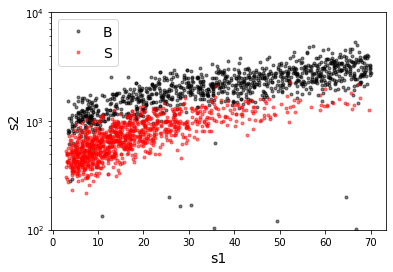

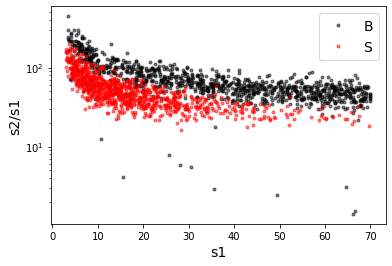

X_mon_B.shape:  (33084, 2)
X_mon_S.shape:  (33084, 2)
X_mon.shape:  (66168, 2)

X_mon_train :  (42182, 2)
y_mon_train :  (42182,)
X_mon_val :  (7444, 2)
y_mon_val :  (7444,)
X_mon_test :  (16542, 2)
y_mon_test :  (16542,)

[0]	validation_0-logloss:0.68503	validation_1-logloss:0.68497
[1]	validation_0-logloss:0.67708	validation_1-logloss:0.67696
[2]	validation_0-logloss:0.66929	validation_1-logloss:0.66911
[3]	validation_0-logloss:0.66165	validation_1-logloss:0.66141
[4]	validation_0-logloss:0.65415	validation_1-logloss:0.65386
[5]	validation_0-logloss:0.64680	validation_1-logloss:0.64645
[6]	validation_0-logloss:0.63957	validation_1-logloss:0.63918
[7]	validation_0-logloss:0.63248	validation_1-logloss:0.63204
[8]	validation_0-logloss:0.62553	validation_1-logloss:0.62503
[9]	validation_0-logloss:0.61870	validation_1-logloss:0.61816


/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10]	validation_0-logloss:0.61200	validation_1-logloss:0.61139
[11]	validation_0-logloss:0.60542	validation_1-logloss:0.60476
[12]	validation_0-logloss:0.59896	validation_1-logloss:0.59824
[13]	validation_0-logloss:0.59261	validation_1-logloss:0.59183
[14]	validation_0-logloss:0.58640	validation_1-logloss:0.58555
[15]	validation_0-logloss:0.58029	validation_1-logloss:0.57937
[16]	validation_0-logloss:0.57430	validation_1-logloss:0.57331
[17]	validation_0-logloss:0.56837	validation_1-logloss:0.56734
[18]	validation_0-logloss:0.56257	validation_1-logloss:0.56148
[19]	validation_0-logloss:0.55687	validation_1-logloss:0.55572
[20]	validation_0-logloss:0.55124	validation_1-logloss:0.55005
[21]	validation_0-logloss:0.54574	validation_1-logloss:0.54447
[22]	validation_0-logloss:0.54033	validation_1-logloss:0.53900
[23]	validation_0-logloss:0.53497	validation_1-logloss:0.53361
[24]	validation_0-logloss:0.52974	validation_1-logloss:0.52832
[25]	validation_0-logloss:0.52460	validation_1-logloss:

[140]	validation_0-logloss:0.23638	validation_1-logloss:0.23061
[141]	validation_0-logloss:0.23530	validation_1-logloss:0.22953
[142]	validation_0-logloss:0.23423	validation_1-logloss:0.22845
[143]	validation_0-logloss:0.23318	validation_1-logloss:0.22738
[144]	validation_0-logloss:0.23213	validation_1-logloss:0.22631
[145]	validation_0-logloss:0.23110	validation_1-logloss:0.22526
[146]	validation_0-logloss:0.23008	validation_1-logloss:0.22424
[147]	validation_0-logloss:0.22907	validation_1-logloss:0.22320
[148]	validation_0-logloss:0.22807	validation_1-logloss:0.22219
[149]	validation_0-logloss:0.22709	validation_1-logloss:0.22118
[150]	validation_0-logloss:0.22612	validation_1-logloss:0.22021
[151]	validation_0-logloss:0.22517	validation_1-logloss:0.21923
[152]	validation_0-logloss:0.22423	validation_1-logloss:0.21827
[153]	validation_0-logloss:0.22329	validation_1-logloss:0.21732
[154]	validation_0-logloss:0.22237	validation_1-logloss:0.21638
[155]	validation_0-logloss:0.22146	valid

[269]	validation_0-logloss:0.16377	validation_1-logloss:0.15669
[270]	validation_0-logloss:0.16353	validation_1-logloss:0.15645
[271]	validation_0-logloss:0.16329	validation_1-logloss:0.15621
[272]	validation_0-logloss:0.16305	validation_1-logloss:0.15598
[273]	validation_0-logloss:0.16281	validation_1-logloss:0.15574
[274]	validation_0-logloss:0.16257	validation_1-logloss:0.15550
[275]	validation_0-logloss:0.16234	validation_1-logloss:0.15526
[276]	validation_0-logloss:0.16211	validation_1-logloss:0.15503
[277]	validation_0-logloss:0.16188	validation_1-logloss:0.15480
[278]	validation_0-logloss:0.16166	validation_1-logloss:0.15458
[279]	validation_0-logloss:0.16144	validation_1-logloss:0.15436
[280]	validation_0-logloss:0.16122	validation_1-logloss:0.15415
[281]	validation_0-logloss:0.16101	validation_1-logloss:0.15393
[282]	validation_0-logloss:0.16079	validation_1-logloss:0.15372
[283]	validation_0-logloss:0.16058	validation_1-logloss:0.15350
[284]	validation_0-logloss:0.16037	valid

[526]	validation_0-logloss:0.14188	validation_1-logloss:0.13611
[527]	validation_0-logloss:0.14185	validation_1-logloss:0.13609
[528]	validation_0-logloss:0.14183	validation_1-logloss:0.13608
[529]	validation_0-logloss:0.14181	validation_1-logloss:0.13606
[530]	validation_0-logloss:0.14179	validation_1-logloss:0.13605
[531]	validation_0-logloss:0.14177	validation_1-logloss:0.13604
[532]	validation_0-logloss:0.14175	validation_1-logloss:0.13603
[533]	validation_0-logloss:0.14173	validation_1-logloss:0.13602
[534]	validation_0-logloss:0.14170	validation_1-logloss:0.13601
[535]	validation_0-logloss:0.14168	validation_1-logloss:0.13599
[536]	validation_0-logloss:0.14166	validation_1-logloss:0.13599
[537]	validation_0-logloss:0.14164	validation_1-logloss:0.13597
[538]	validation_0-logloss:0.14162	validation_1-logloss:0.13595
[539]	validation_0-logloss:0.14160	validation_1-logloss:0.13594
[540]	validation_0-logloss:0.14158	validation_1-logloss:0.13593
[541]	validation_0-logloss:0.14155	valid

[655]	validation_0-logloss:0.13997	validation_1-logloss:0.13533
[656]	validation_0-logloss:0.13996	validation_1-logloss:0.13533
[657]	validation_0-logloss:0.13995	validation_1-logloss:0.13533
[658]	validation_0-logloss:0.13995	validation_1-logloss:0.13533
[659]	validation_0-logloss:0.13994	validation_1-logloss:0.13532
[660]	validation_0-logloss:0.13992	validation_1-logloss:0.13532
[661]	validation_0-logloss:0.13991	validation_1-logloss:0.13531
[662]	validation_0-logloss:0.13990	validation_1-logloss:0.13532
[663]	validation_0-logloss:0.13989	validation_1-logloss:0.13531
[664]	validation_0-logloss:0.13988	validation_1-logloss:0.13531
[665]	validation_0-logloss:0.13987	validation_1-logloss:0.13532
[666]	validation_0-logloss:0.13986	validation_1-logloss:0.13532
[667]	validation_0-logloss:0.13986	validation_1-logloss:0.13532
[668]	validation_0-logloss:0.13985	validation_1-logloss:0.13532
[669]	validation_0-logloss:0.13984	validation_1-logloss:0.13532
[670]	validation_0-logloss:0.13983	valid

[784]	validation_0-logloss:0.13890	validation_1-logloss:0.13515
[785]	validation_0-logloss:0.13889	validation_1-logloss:0.13515
[786]	validation_0-logloss:0.13889	validation_1-logloss:0.13515
[787]	validation_0-logloss:0.13888	validation_1-logloss:0.13515
[788]	validation_0-logloss:0.13887	validation_1-logloss:0.13515
[789]	validation_0-logloss:0.13887	validation_1-logloss:0.13515
[790]	validation_0-logloss:0.13886	validation_1-logloss:0.13515
[791]	validation_0-logloss:0.13885	validation_1-logloss:0.13515
[792]	validation_0-logloss:0.13884	validation_1-logloss:0.13514
[793]	validation_0-logloss:0.13884	validation_1-logloss:0.13514
[794]	validation_0-logloss:0.13883	validation_1-logloss:0.13515
[795]	validation_0-logloss:0.13882	validation_1-logloss:0.13515
[796]	validation_0-logloss:0.13882	validation_1-logloss:0.13515
[797]	validation_0-logloss:0.13881	validation_1-logloss:0.13514
[798]	validation_0-logloss:0.13881	validation_1-logloss:0.13514
[799]	validation_0-logloss:0.13879	valid

[913]	validation_0-logloss:0.13809	validation_1-logloss:0.13509
[914]	validation_0-logloss:0.13809	validation_1-logloss:0.13509
[915]	validation_0-logloss:0.13808	validation_1-logloss:0.13509
[916]	validation_0-logloss:0.13808	validation_1-logloss:0.13509
[917]	validation_0-logloss:0.13808	validation_1-logloss:0.13509
[918]	validation_0-logloss:0.13808	validation_1-logloss:0.13509
[919]	validation_0-logloss:0.13807	validation_1-logloss:0.13509
[920]	validation_0-logloss:0.13807	validation_1-logloss:0.13509
[921]	validation_0-logloss:0.13806	validation_1-logloss:0.13509
[922]	validation_0-logloss:0.13806	validation_1-logloss:0.13509
[923]	validation_0-logloss:0.13805	validation_1-logloss:0.13509
[924]	validation_0-logloss:0.13805	validation_1-logloss:0.13509
[925]	validation_0-logloss:0.13805	validation_1-logloss:0.13509
[926]	validation_0-logloss:0.13804	validation_1-logloss:0.13509


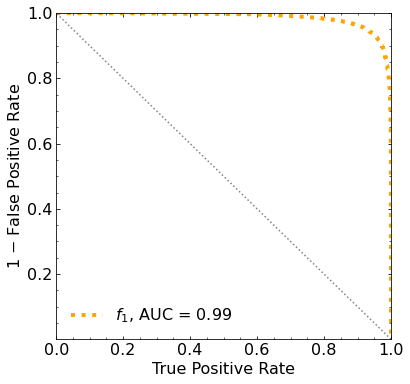

In [14]:
m_it = 2


# set the parameters
mDM = mDM_mDM[m_it]
S_cross1045 = S_cross1045_mDM[m_it]
S_expected = S_expected_mDM[m_it]

print('\n#########################\n')
print('mDM = ', mDM, 'GeV\n')


##########
# SIGNAL #
##########

S_cs1 = np.loadtxt(filefolder + 'WIMP_' + str(mDM) + 'GeV_cs1.txt')
S_cs2 = np.loadtxt(filefolder + 'WIMP_' + str(mDM) + 'GeV_cs2.txt')

print('\nS_cs1.shape: ', S_cs1.shape)
print('S_cs2.shape: ', S_cs2.shape)

S_cs1_aux = [S_cs1[x] for x in range(len(S_cs1)) if (3 < S_cs1[x] < 70 and 50 < S_cs2[x] < 8000)]
S_cs2 = [S_cs2[x] for x in range(len(S_cs1)) if (3 < S_cs1[x] < 70 and 50 < S_cs2[x] < 8000)]
S_cs1 = S_cs1_aux


# set events per classs
NUM_DAT = min(len(B_cs1_ER), len(S_cs1))
print(' NUM_DAT: ', NUM_DAT, '\n')

NUM_DAT_AC = int(NUM_DAT*f_AC)
NUM_DAT_CNNS = max(1, int(NUM_DAT*f_CNNS))
NUM_DAT_RN = int(NUM_DAT*f_RN)
NUM_DAT_WALL = int(NUM_DAT*f_WALL)

NUM_DAT_ER = NUM_DAT - ( NUM_DAT_AC + NUM_DAT_CNNS + NUM_DAT_RN + NUM_DAT_WALL )

print('NUM_DAT_ER: ', NUM_DAT_ER)
print('NUM_DAT_AC: ', NUM_DAT_AC)
print('NUM_DAT_CNNS: ', NUM_DAT_CNNS)
print('NUM_DAT_RN: ', NUM_DAT_RN)
print('NUM_DAT_WALL: ', NUM_DAT_WALL)



# CONCATENATE THE BACKGROUNDS
B_cs1cs2 = np.concatenate([np.stack([B_cs1_ER,B_cs2_ER],axis=1)[:NUM_DAT_ER], np.stack([B_cs1_AC,B_cs2_AC],axis=1)[:NUM_DAT_AC], np.stack([B_cs1_CNNS,B_cs2_CNNS],axis=1)[:NUM_DAT_CNNS], np.stack([B_cs1_RN,B_cs2_RN],axis=1)[:NUM_DAT_RN], np.stack([B_cs1_WALL,B_cs2_WALL],axis=1)[:NUM_DAT_WALL]])

print('\nB_cs1cs2.shape: ', B_cs1cs2.shape)


S_cs1cs2 = np.stack([S_cs1,S_cs2],axis=1)[:NUM_DAT]


print('\nS_cs1cs2.shape: ', S_cs1cs2.shape)


rnd = 100

B_cs1cs2_plot = shuffle(B_cs1cs2, random_state=rnd)
S_cs1cs2_plot = shuffle(S_cs1cs2, random_state=rnd)

plt.plot(B_cs1cs2_plot[:,0][:1000], B_cs1cs2_plot[:,1][:1000], '.', color='black', alpha=0.5, label='B')
plt.plot(S_cs1cs2_plot[:,0][:1000], S_cs1cs2_plot[:,1][:1000], '.', color='red', alpha=0.5, label='S')
plt.yscale('log')
# plt.xlim([0,100])
plt.ylim([100,10000])
plt.xlabel('s1',fontsize=14)
plt.ylabel('s2',fontsize=14)
plt.legend(fontsize=14)
plt.show()



plt.plot(B_cs1cs2_plot[:,0][:1000], (B_cs1cs2_plot[:,1] / B_cs1cs2_plot[:,0])[:1000], '.', color='black', alpha=0.5, label='B')
plt.plot(S_cs1cs2_plot[:,0][:1000], (S_cs1cs2_plot[:,1] / S_cs1cs2_plot[:,0])[:1000], '.', color='red', alpha=0.5, label='S')
plt.yscale('log')
# plt.xlim([0,100])
# plt.ylim([100,10000])
plt.xlabel('s1',fontsize=14)
plt.ylabel('s2/s1',fontsize=14)
plt.legend(fontsize=14)
plt.show()


############
# DATASETS #
############

# concatenate the data
X_mon_B = B_cs1cs2
X_mon_S = S_cs1cs2

# X_mon_B = np.reshape(B_pdiffT,(len(B_pdiffT),1))
# X_mon_S = np.reshape(S_pdiffT,(len(S_pdiffT),1))
print('X_mon_B.shape: ', X_mon_B.shape)
print('X_mon_S.shape: ', X_mon_S.shape)

# del B_ppeakS1
# del B_ppeakS2
# del B_pbot
# del B_ptop

# del S_ppeakS1
# del S_ppeakS2
# del S_pbot
# del S_ptop

X_mon = np.concatenate([X_mon_B, X_mon_S])

# X_mon = np.concatenate([np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(S_pbot,(len(S_pbot),1))])

print('X_mon.shape: ', X_mon.shape)
# del X_mon_B
# del X_mon_S


# labels
y_mon = np.concatenate([np.zeros(NUM_DAT),np.ones(NUM_DAT)])


# divide into train-val and test data samples
test_ratio = 0.25
val_ratio = 0.15


X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                y_mon,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_mon,
                                                                shuffle=True)

del X_mon
del y_mon

X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                  y_mon_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_mon_aux,
                                                                  shuffle=True)

del X_mon_aux
del y_mon_aux

print('')
print('X_mon_train : ', X_mon_train.shape)
print('y_mon_train : ', y_mon_train.shape)
print('X_mon_val : ', X_mon_val.shape)
print('y_mon_val : ', y_mon_val.shape)
print('X_mon_test : ', X_mon_test.shape)
print('y_mon_test : ', y_mon_test.shape)
print('')



###########
# XGBOOST #
###########

# XGBoost with only the kinematic variables of the leptons

# CLASSIFIER
classifier = XGBClassifier(
    n_estimators=2500,
    learning_rate=0.01,
    reg_lambda=0.01,reg_alpha=0.0,
    gamma=0.0,objective='binary:logistic',
    max_depth=5,
    #eval_metric=["error", "logloss", "map"]
    eval_metric='logloss')

# FIT
classifier.fit(X_mon_train,y_mon_train,eval_set=[(X_mon_train, y_mon_train), (X_mon_val, y_mon_val)],
        early_stopping_rounds=50,#early stopping
        verbose=True)


# PREDICTIONS
y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


# ROC
fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)


# PLOT THE ROC WITH AUC
fig = plt.figure(figsize=(6, 6))
gs = gridspec.GridSpec(1, 1) 
ax0 = plt.subplot(gs[0])
ax0.yaxis.set_ticks_position('both')
ax0.xaxis.set_ticks_position('both')
ax0.tick_params(direction="in",which="both")
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
ax0.minorticks_on()


plt.plot(tpr_mon_xg,1-fpr_mon_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()



#########################

mDM =  10 GeV


S_cs1.shape:  (34190,)
S_cs2.shape:  (34190,)
 NUM_DAT:  31606 

NUM_DAT_ER:  31203
NUM_DAT_AC:  111
NUM_DAT_CNNS:  1
NUM_DAT_RN:  29
NUM_DAT_WALL:  262

B_cs1cs2.shape:  (31606, 2)

S_cs1cs2.shape:  (31606, 2)


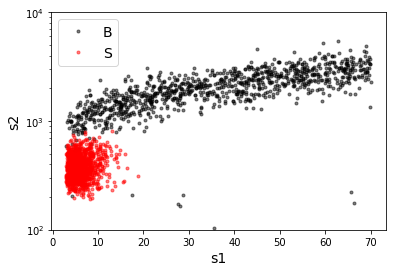

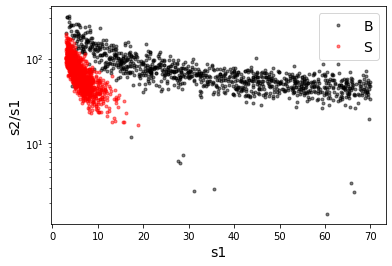

X_mon_B.shape:  (31606, 2)
X_mon_S.shape:  (31606, 2)
X_mon.shape:  (63212, 2)

X_mon_train :  (40297, 2)
y_mon_train :  (40297,)
X_mon_val :  (7112, 2)
y_mon_val :  (7112,)
X_mon_test :  (15803, 2)
y_mon_test :  (15803,)

Classification score:


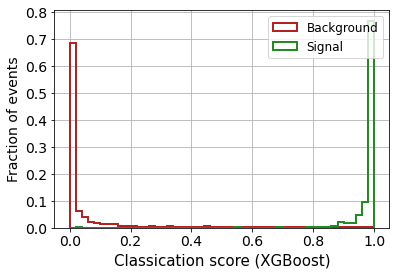


 ROC-AUC =  0.9964402071113784
At least 5 B events per bin, range = [[0, 1]]:
# bins:  13 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  13
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.44


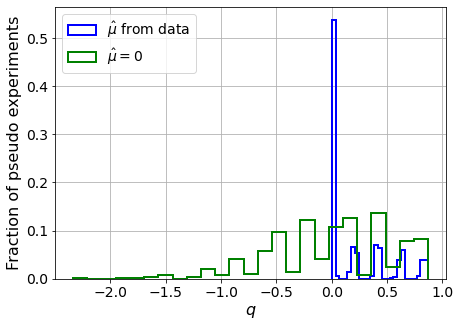

muhat mean:  0.5301276139314093
Z_bins:  0.16048178553091708
std Z_bins:  0.8739423788214811
Z_bins mu=0:  0.03225678718469785
std Z_bins mu=0:  8.625813000291952

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.454


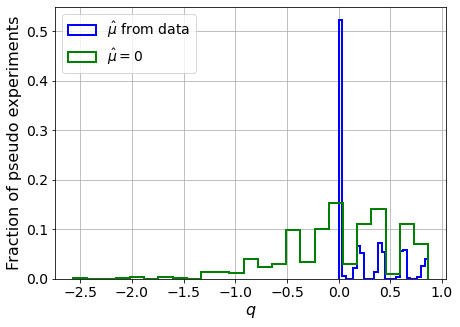

muhat mean:  0.4521020720046828
Z_bins:  0.1690397428942788
std Z_bins:  0.811339221257754
Z_bins mu=0:  0.08002034957213475
std Z_bins mu=0:  3.3891807023430074

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.456


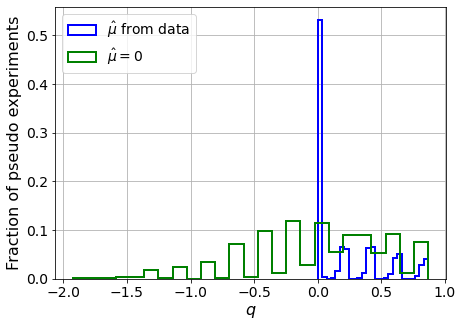

muhat mean:  0.51271877159347
Z_bins:  0.16782811787105453
std Z_bins:  0.8161548151157713
Z_bins mu=0:  0.07510692557892241
std Z_bins mu=0:  3.605954137426314

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.453


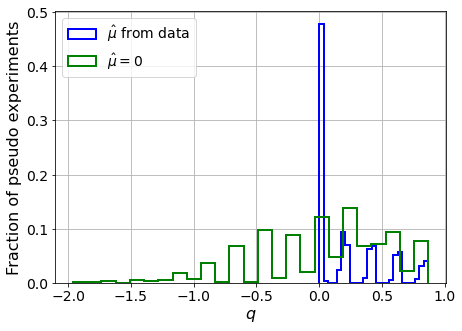

muhat mean:  0.2994653892988217
Z_bins:  0.4133917089418996
std Z_bins:  0.33189522428499435
Z_bins mu=0:  0.4133917089418996
std Z_bins mu=0:  0.6309277742961072

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.4575


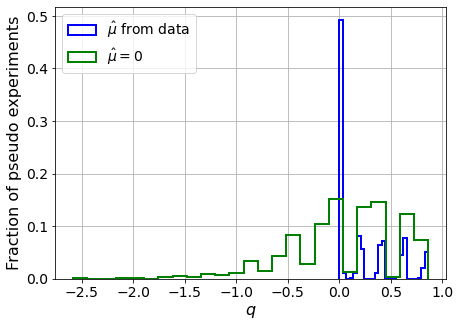

muhat mean:  0.2959053448522126
Z_bins:  0.19088429505441926
std Z_bins:  0.7273973586691306
Z_bins mu=0:  0.14179484788893987
std Z_bins mu=0:  1.880466316249587

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.4535


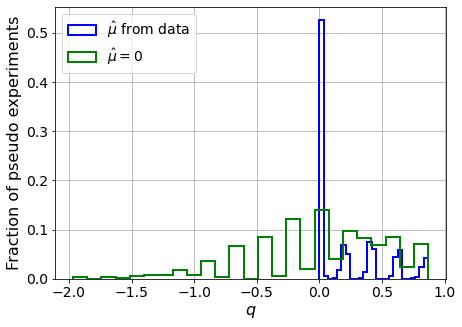

muhat mean:  0.488231657252658
Z_bins:  0.16610210662636926
std Z_bins:  0.8231389741488355
Z_bins mu=0:  0.06753952687219163
std Z_bins mu=0:  4.038161696613169

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.4725


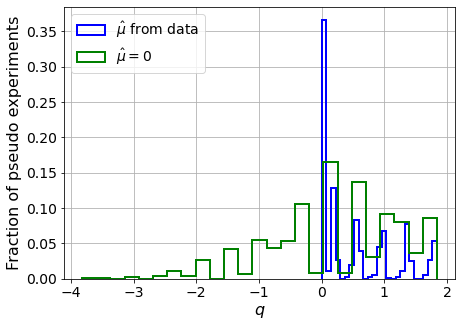

muhat mean:  0.2072018477911493
Z_bins:  0.467774342479258
std Z_bins:  0.6401700131139924
Z_bins mu=0:  0.44384418421563837
std Z_bins mu=0:  1.1577428437504689

--------

B_expected:  643
S_expected:  5

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.4545


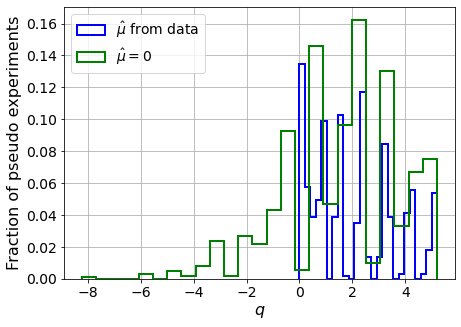

muhat mean:  0.07979189231823391
Z_bins:  1.2707044064319872
std Z_bins:  0.6068074268472761
Z_bins mu=0:  1.262633028391395
std Z_bins mu=0:  0.8505082271993549

--------

B_expected:  643
S_expected:  9

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.4575


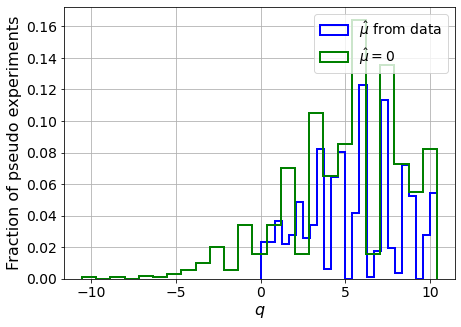

muhat mean:  0.019932795381081433
Z_bins:  2.400333742170353
std Z_bins:  0.5730458957437636
Z_bins mu=0:  2.400333742170353
std Z_bins mu=0:  0.7194352418521097

--------

B_expected:  643
S_expected:  18

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.4575


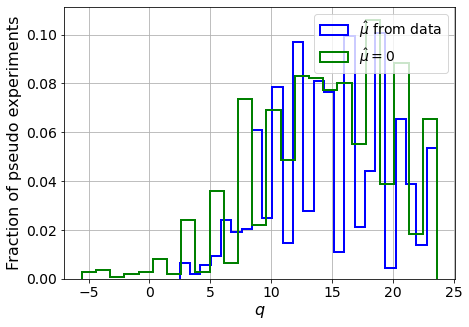

muhat mean:  0.02852108053086124
Z_bins:  3.8075500287874853
std Z_bins:  0.625286579884323
Z_bins mu=0:  3.8041688915196725
std Z_bins mu=0:  0.7253855687626249

--------

B_expected:  643
S_expected:  34

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.456


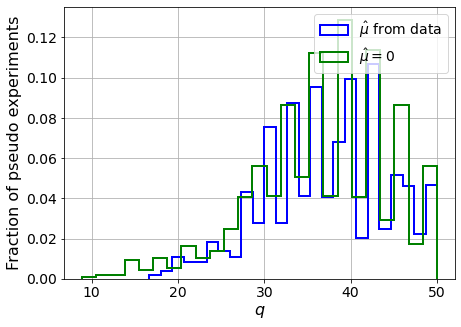

muhat mean:  0.011607057688762449
Z_bins:  6.090357921857715
std Z_bins:  0.5735645552737022
Z_bins mu=0:  6.0887582838737355
std Z_bins mu=0:  0.6355006719908692

--------

B_expected:  643
S_expected:  66

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.443


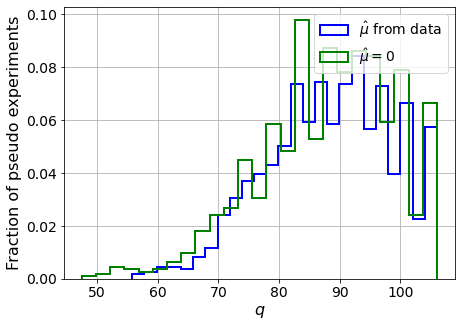

muhat mean:  0.006320663083218508
Z_bins:  9.410698019747082
std Z_bins:  0.5387601506901093
Z_bins mu=0:  9.410092213499539
std Z_bins mu=0:  0.580917335687058

--------

B_expected:  643
S_expected:  126

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.475


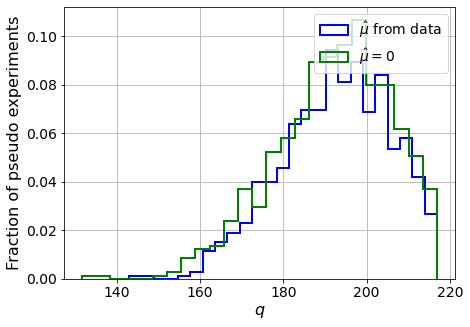

muhat mean:  0.0038086441043228953
Z_bins:  13.90310884202762
std Z_bins:  0.46691225045681517
Z_bins mu=0:  13.902257531240755
std Z_bins mu=0:  0.49526653894752887

--------

B_expected:  643
S_expected:  244

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.451


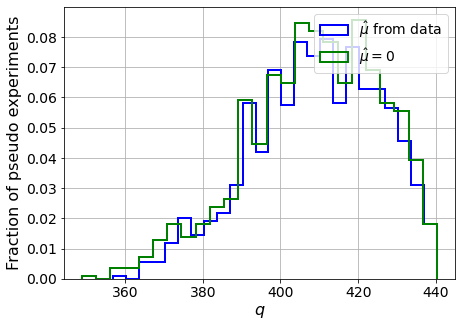

muhat mean:  0.0018218982722706235
Z_bins:  20.247242096202214
std Z_bins:  0.40543239825029587
Z_bins mu=0:  20.24665125335107
std Z_bins mu=0:  0.42445516747804607

--------

B_expected:  643
S_expected:  471

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.461


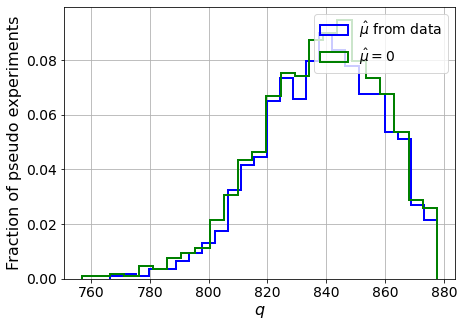

muhat mean:  0.0007876223587646434
Z_bins:  28.983313152302266
std Z_bins:  0.34220239948834547
Z_bins mu=0:  28.983078660497927
std Z_bins mu=0:  0.3547463360262493

--------


 FINAL RESULT:

[[0.16048178553091708, 0.8739423788214811, 0.5301276139314093, 0.03225678718469785, 8.625813000291952], [0.1690397428942788, 0.811339221257754, 0.4521020720046828, 0.08002034957213475, 3.3891807023430074], [0.16782811787105453, 0.8161548151157713, 0.51271877159347, 0.07510692557892241, 3.605954137426314], [0.4133917089418996, 0.33189522428499435, 0.2994653892988217, 0.4133917089418996, 0.6309277742961072], [0.19088429505441926, 0.7273973586691306, 0.2959053448522126, 0.14179484788893987, 1.880466316249587], [0.16610210662636926, 0.8231389741488355, 0.488231657252658, 0.06753952687219163, 4.038161696613169], [0.467774342479258, 0.6401700131139924, 0.2072018477911493, 0.44384418421563837, 1.1577428437504689], [1.2707044064319872, 0.6068074268472761, 0.07979189231823391, 1.262633028391395, 0.850508

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 328.55804605 279.95250556 227.73977759
 169.83559369 107.67076086  41.729143   -25.75945685 -95.45443629]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf 355.96766427
 285

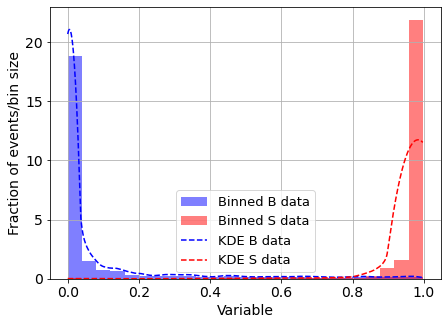

KDE Kernel:  epanechnikov
Background bandwidth:  0.03613222756796251
Signal bandwidth:  0.0964296357589577
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



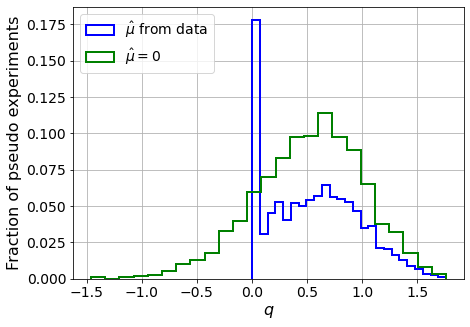

muhat mean:  -3.0532562592633266
Z_bins:  0.7489691726327431
std Z_bins:  0.274304350347746
Z_bins mu=0:  0.7489691726327431
std Z_bins mu=0:  0.3252120700055785

--------

B_expected:  643
S_expected:  1



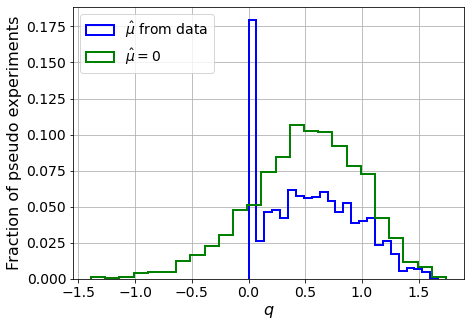

muhat mean:  -2.7973750951756275
Z_bins:  0.734916021338444
std Z_bins:  0.273430954837539
Z_bins mu=0:  0.734916021338444
std Z_bins mu=0:  0.33015972793193854

--------

B_expected:  643
S_expected:  1



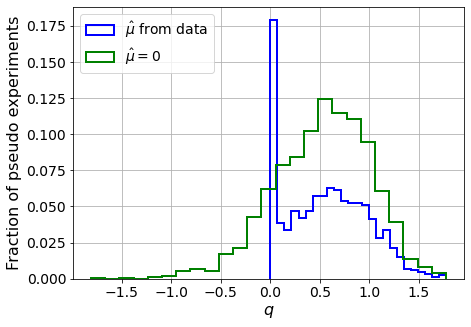

muhat mean:  -3.229363445842747
Z_bins:  0.7523259791361658
std Z_bins:  0.2717442890757787
Z_bins mu=0:  0.7523259791361658
std Z_bins mu=0:  0.3221596128767095

--------

B_expected:  643
S_expected:  1



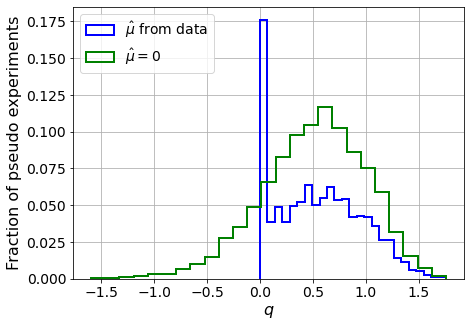

muhat mean:  -2.9551889385837926
Z_bins:  0.7356966000459308
std Z_bins:  0.27620874725189715
Z_bins mu=0:  0.7356966000459308
std Z_bins mu=0:  0.3317477431880415

--------

B_expected:  643
S_expected:  1



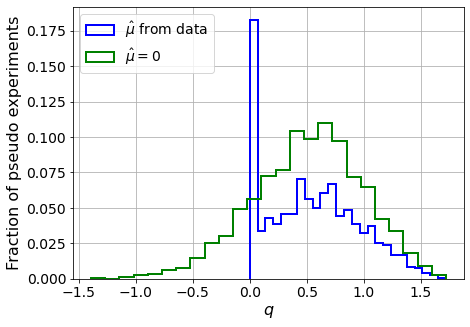

muhat mean:  -2.947508057905602
Z_bins:  0.7294719546601741
std Z_bins:  0.27908920188235903
Z_bins mu=0:  0.7294719546601741
std Z_bins mu=0:  0.33061633671199614

--------

B_expected:  643
S_expected:  1



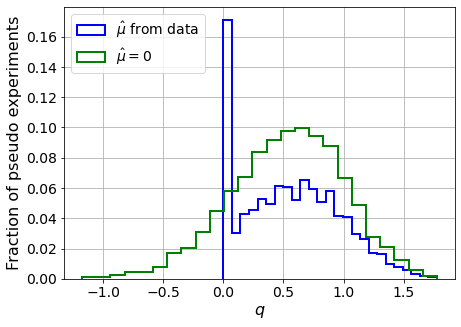

muhat mean:  -3.312695065467621
Z_bins:  0.7445313093887719
std Z_bins:  0.2717496684199345
Z_bins mu=0:  0.7445313093887719
std Z_bins mu=0:  0.31510406631964877

--------

B_expected:  643
S_expected:  2



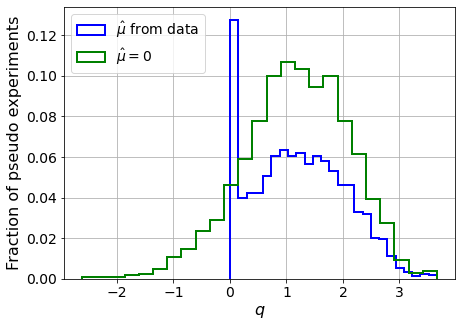

muhat mean:  -1.6288030022645203
Z_bins:  1.0995038114620006
std Z_bins:  0.36985213854698834
Z_bins mu=0:  1.0995038114620006
std Z_bins mu=0:  0.4242234445389644

--------

B_expected:  643
S_expected:  5



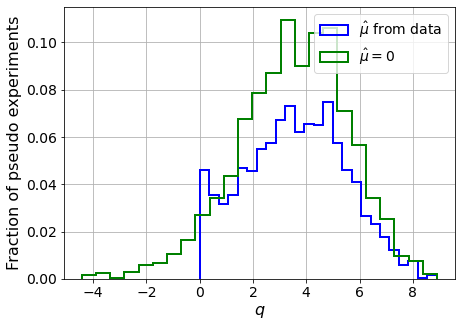

muhat mean:  -0.6008110253033827
Z_bins:  1.8989075406048004
std Z_bins:  0.49520748598780057
Z_bins mu=0:  1.8989075406048004
std Z_bins mu=0:  0.5436146719038314

--------

B_expected:  643
S_expected:  9



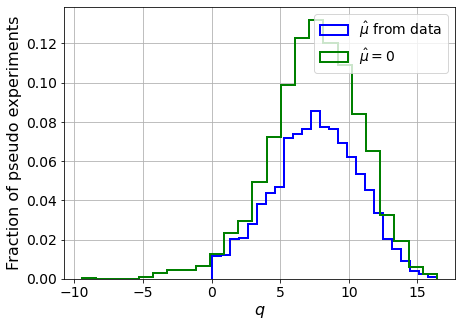

muhat mean:  -0.328063809104939
Z_bins:  2.7713013492433216
std Z_bins:  0.5585250376473346
Z_bins mu=0:  2.7713013492433216
std Z_bins mu=0:  0.5989382664269775

--------

B_expected:  643
S_expected:  18



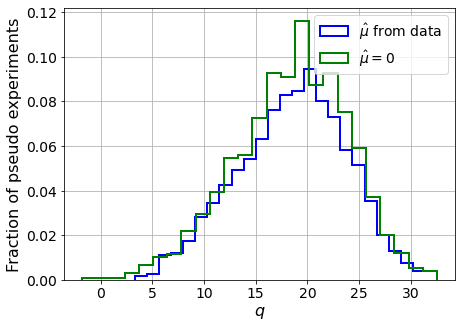

muhat mean:  -0.16388030754329558
Z_bins:  4.349231548124611
std Z_bins:  0.6041792757970519
Z_bins mu=0:  4.349231548124611
std Z_bins mu=0:  0.6267403194574303

--------

B_expected:  643
S_expected:  34



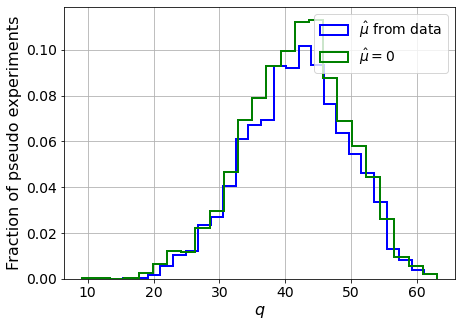

muhat mean:  -0.09066931660830664
Z_bins:  6.4754239060021055
std Z_bins:  0.5946604722712128
Z_bins mu=0:  6.4754239060021055
std Z_bins mu=0:  0.6081462939795226

--------

B_expected:  643
S_expected:  66



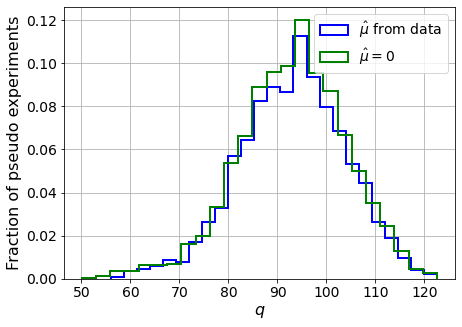

muhat mean:  -0.044999651544100766
Z_bins:  9.67013157733718
std Z_bins:  0.5584420074570335
Z_bins mu=0:  9.67013157733718
std Z_bins mu=0:  0.5701831940130648

--------

B_expected:  643
S_expected:  126



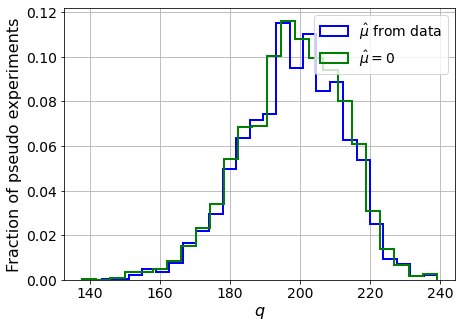

muhat mean:  -0.024891145847353427
Z_bins:  14.091350859239418
std Z_bins:  0.5081923072627124
Z_bins mu=0:  14.091350859239418
std Z_bins mu=0:  0.5159531034911263

--------

B_expected:  643
S_expected:  244



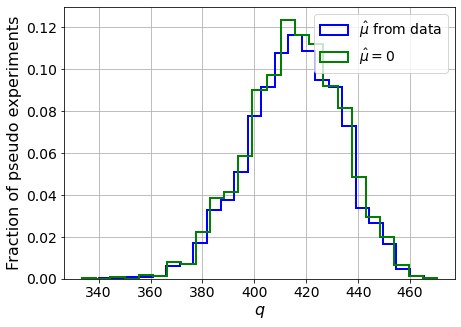

muhat mean:  -0.013960509003705858
Z_bins:  20.39696364746316
std Z_bins:  0.4414578225828
Z_bins mu=0:  20.39696364746316
std Z_bins mu=0:  0.4454330280361538

--------

B_expected:  643
S_expected:  471



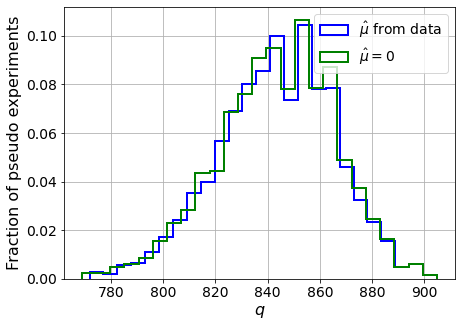

muhat mean:  -0.006033025883854887
Z_bins:  29.059860555034536
std Z_bins:  0.38473559246680916
Z_bins mu=0:  29.059860555034536
std Z_bins mu=0:  0.3877564067359908

--------


 FINAL RESULT:

[[0.7489691726327431, 0.274304350347746, -3.0532562592633266, 0.7489691726327431, 0.3252120700055785], [0.734916021338444, 0.273430954837539, -2.7973750951756275, 0.734916021338444, 0.33015972793193854], [0.7523259791361658, 0.2717442890757787, -3.229363445842747, 0.7523259791361658, 0.3221596128767095], [0.7356966000459308, 0.27620874725189715, -2.9551889385837926, 0.7356966000459308, 0.3317477431880415], [0.7294719546601741, 0.27908920188235903, -2.947508057905602, 0.7294719546601741, 0.33061633671199614], [0.7445313093887719, 0.2717496684199345, -3.312695065467621, 0.7445313093887719, 0.31510406631964877], [1.0995038114620006, 0.36985213854698834, -1.6288030022645203, 1.0995038114620006, 0.4242234445389644], [1.8989075406048004, 0.49520748598780057, -0.6008110253033827, 1.8989075406048004, 0.

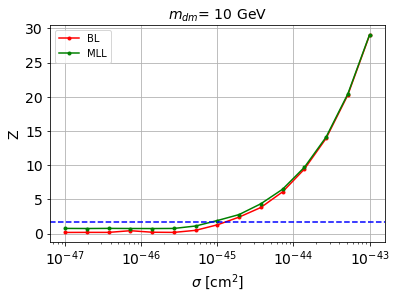


cross_BL_164:  1.2399523578835395e-45
cross_BL_164_up:  8.671135936225568e-46
cross_BL_164_down:  1.7366756965413017e-45

cross_MLL_164:  8.22633144465294e-46
cross_MLL_164_up:  5.884846644008424e-46
cross_MLL_164_down:  1.2118423194107048e-45

#########################


#########################

mDM =  20 GeV


S_cs1.shape:  (33873,)
S_cs2.shape:  (33873,)
 NUM_DAT:  33001 

NUM_DAT_ER:  32580
NUM_DAT_AC:  116
NUM_DAT_CNNS:  1
NUM_DAT_RN:  30
NUM_DAT_WALL:  274

B_cs1cs2.shape:  (33001, 2)

S_cs1cs2.shape:  (33001, 2)


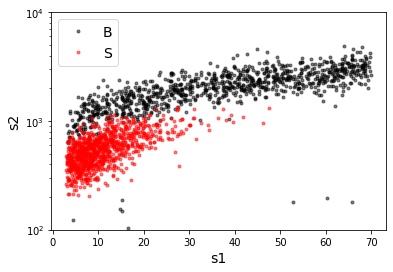

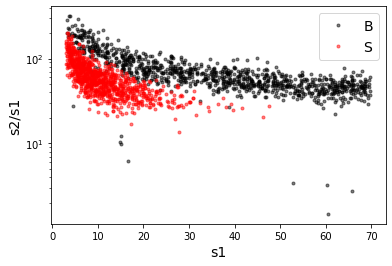

X_mon_B.shape:  (33001, 2)
X_mon_S.shape:  (33001, 2)
X_mon.shape:  (66002, 2)

X_mon_train :  (42075, 2)
y_mon_train :  (42075,)
X_mon_val :  (7426, 2)
y_mon_val :  (7426,)
X_mon_test :  (16501, 2)
y_mon_test :  (16501,)

Classification score:


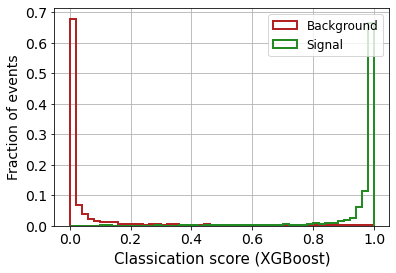


 ROC-AUC =  0.9926390862955349
At least 5 B events per bin, range = [[0, 1]]:
# bins:  13 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  13
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.4045


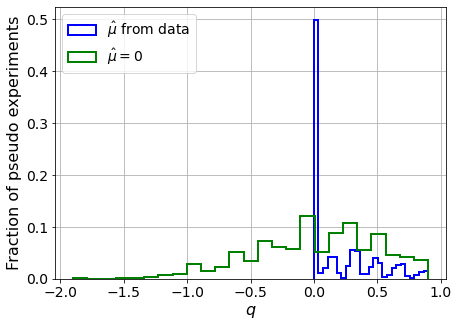

muhat mean:  0.41833316871821363
Z_bins:  0.19126695865957843
std Z_bins:  0.6727381157340943
Z_bins mu=0:  0.17133363871983054
std Z_bins mu=0:  1.4126371013888788

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.4085


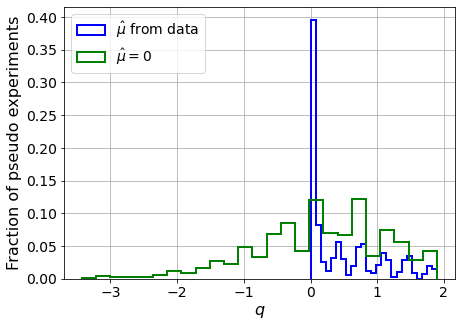

muhat mean:  0.2532862738037978
Z_bins:  0.4230186375919727
std Z_bins:  0.6520485326592346
Z_bins mu=0:  0.4019455263161491
std Z_bins mu=0:  1.2211722030106686

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.408


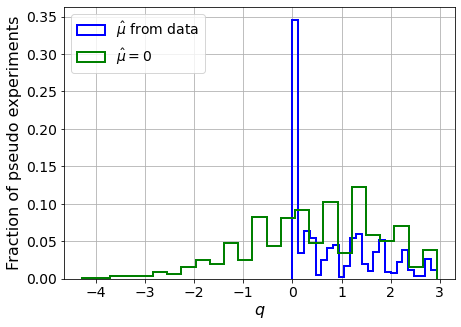

muhat mean:  0.12807703938867468
Z_bins:  0.7147857014108151
std Z_bins:  0.6008628253353994
Z_bins mu=0:  0.7120466091206937
std Z_bins mu=0:  0.9510931068918563

--------

B_expected:  643
S_expected:  6

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.413


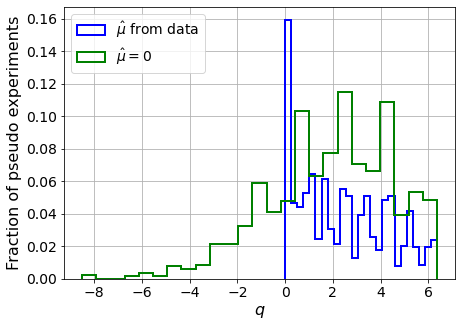

muhat mean:  0.05920710495712096
Z_bins:  1.4897700663886002
std Z_bins:  0.6215009966294479
Z_bins mu=0:  1.4897700663886002
std Z_bins mu=0:  0.8661019645994783

--------

B_expected:  643
S_expected:  12

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.4035


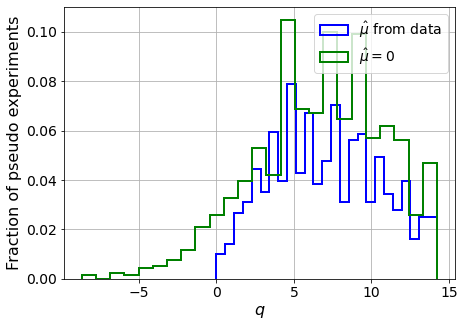

muhat mean:  0.023010017523078744
Z_bins:  2.655061145256427
std Z_bins:  0.6522594738804127
Z_bins mu=0:  2.655061145256427
std Z_bins mu=0:  0.7809470356288732

--------

B_expected:  643
S_expected:  23

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.429


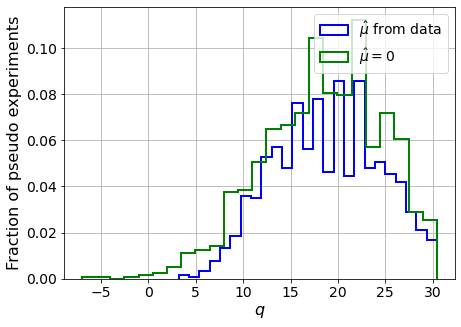

muhat mean:  0.014968188099854285
Z_bins:  4.344361889225544
std Z_bins:  0.63629310810628
Z_bins mu=0:  4.344361889225544
std Z_bins mu=0:  0.7166150851033986

--------

B_expected:  643
S_expected:  44

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.414


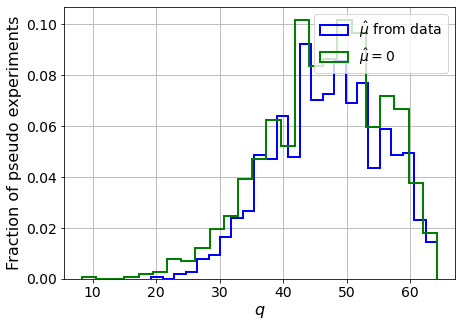

muhat mean:  0.006188347360540957
Z_bins:  6.883261082599051
std Z_bins:  0.6078904634256311
Z_bins mu=0:  6.883261082599051
std Z_bins mu=0:  0.6609940219137148

--------

B_expected:  643
S_expected:  85

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.437


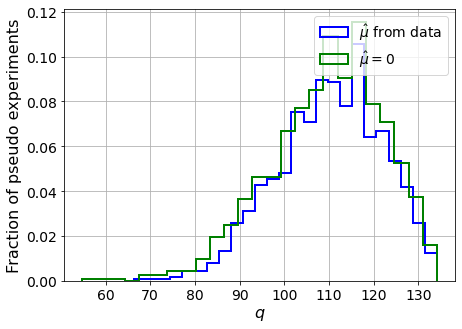

muhat mean:  0.0035339285120427407
Z_bins:  10.522494382684357
std Z_bins:  0.5558036591414411
Z_bins mu=0:  10.522494382684357
std Z_bins mu=0:  0.5957477575033725

--------

B_expected:  643
S_expected:  165

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.42


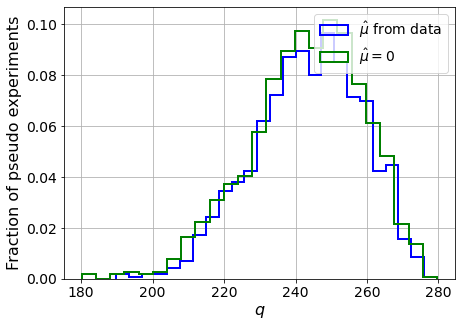

muhat mean:  0.0024590593393666853
Z_bins:  15.632080280136082
std Z_bins:  0.47808180804030637
Z_bins mu=0:  15.631808392948237
std Z_bins mu=0:  0.5030283974925748

--------

B_expected:  643
S_expected:  318

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3985


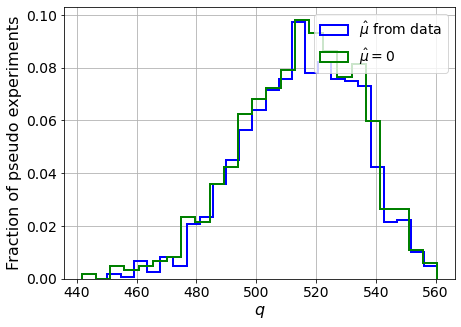

muhat mean:  0.0013010860687630583
Z_bins:  22.70870048436233
std Z_bins:  0.42439817323157003
Z_bins mu=0:  22.70870048436233
std Z_bins mu=0:  0.44144651448753697

--------

B_expected:  643
S_expected:  615

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.394


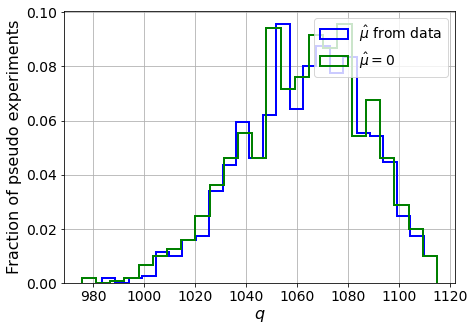

muhat mean:  0.0003921676773151169
Z_bins:  32.632166057659674
std Z_bins:  0.3614326855516307
Z_bins mu=0:  32.6317900628882
std Z_bins mu=0:  0.3713641840137269

--------

B_expected:  643
S_expected:  1187

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.423


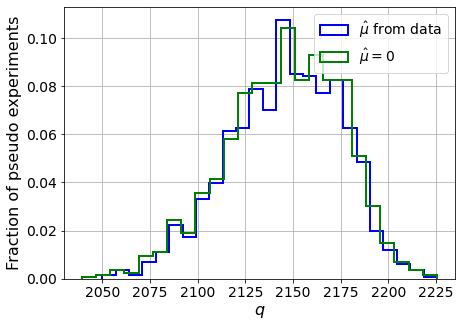

muhat mean:  0.0003213246212926607
Z_bins:  46.33539513798504
std Z_bins:  0.3168401827344507
Z_bins mu=0:  46.33520805798158
std Z_bins mu=0:  0.3246133312086885

--------

B_expected:  643
S_expected:  2291

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.4105


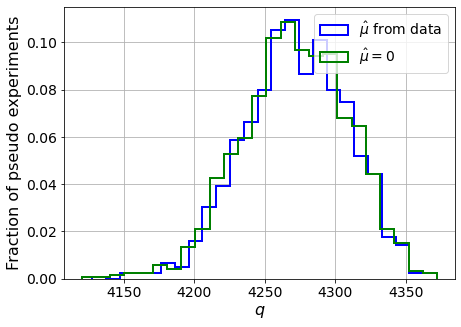

muhat mean:  0.0001984699355202127
Z_bins:  65.36015253752207
std Z_bins:  0.2818815555432618
Z_bins mu=0:  65.35938220733718
std Z_bins mu=0:  0.28728848647419203

--------

B_expected:  643
S_expected:  4424

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.4085


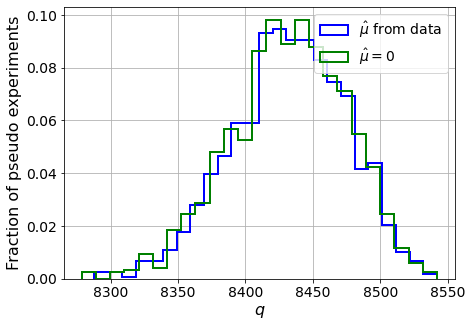

muhat mean:  0.0001124941792041789
Z_bins:  91.83482818278166
std Z_bins:  0.23196924215362594
Z_bins mu=0:  91.83371450222555
std Z_bins mu=0:  0.23542855193780302

--------

B_expected:  643
S_expected:  8542

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.409


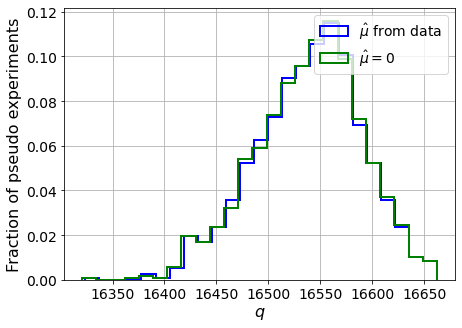

muhat mean:  4.104389483738973e-05
Z_bins:  128.62263949815429
std Z_bins:  0.19755735072121386
Z_bins mu=0:  128.62263949815429
std Z_bins mu=0:  0.19985900474274024

--------


 FINAL RESULT:

[[0.19126695865957843, 0.6727381157340943, 0.41833316871821363, 0.17133363871983054, 1.4126371013888788], [0.4230186375919727, 0.6520485326592346, 0.2532862738037978, 0.4019455263161491, 1.2211722030106686], [0.7147857014108151, 0.6008628253353994, 0.12807703938867468, 0.7120466091206937, 0.9510931068918563], [1.4897700663886002, 0.6215009966294479, 0.05920710495712096, 1.4897700663886002, 0.8661019645994783], [2.655061145256427, 0.6522594738804127, 0.023010017523078744, 2.655061145256427, 0.7809470356288732], [4.344361889225544, 0.63629310810628, 0.014968188099854285, 4.344361889225544, 0.7166150851033986], [6.883261082599051, 0.6078904634256311, 0.006188347360540957, 6.883261082599051, 0.6609940219137148], [10.522494382684357, 0.5558036591414411, 0.0035339285120427407, 10.522494382684357, 0.5

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf 301.10999565 243.53345279
 182.15484867 116.21879468  48.34545109 -20.94335664 -93.8624155 ]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf 350.17074104 291.24945912
 224

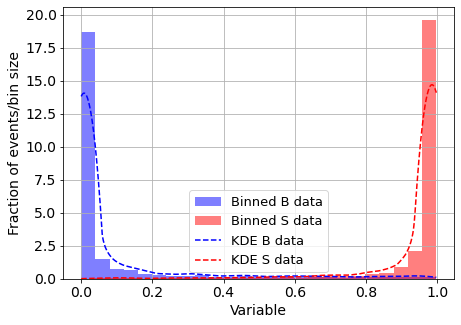

KDE Kernel:  epanechnikov
Background bandwidth:  0.059027261020128646
Signal bandwidth:  0.059027261020128646
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



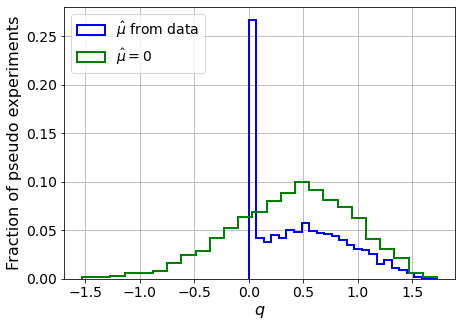

muhat mean:  -2.3365637776744874
Z_bins:  0.6615997385537252
std Z_bins:  0.31489708272229255
Z_bins mu=0:  0.6615997385537252
std Z_bins mu=0:  0.41460819176770725

--------

B_expected:  643
S_expected:  2



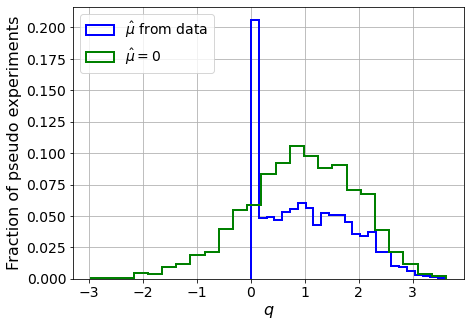

muhat mean:  -1.5805077882204936
Z_bins:  0.9788301437030845
std Z_bins:  0.42195820158718006
Z_bins mu=0:  0.9788301437030845
std Z_bins mu=0:  0.5227456501147602

--------

B_expected:  643
S_expected:  3



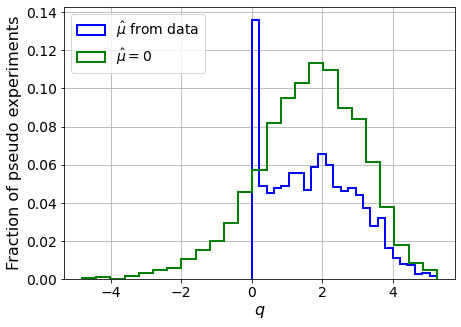

muhat mean:  -1.0734880397044981
Z_bins:  1.3185191336491175
std Z_bins:  0.46139285488843107
Z_bins mu=0:  1.3185191336491175
std Z_bins mu=0:  0.5603120426881237

--------

B_expected:  643
S_expected:  6



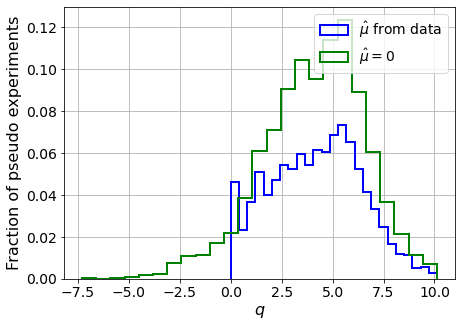

muhat mean:  -0.46695620153657774
Z_bins:  2.070557488600864
std Z_bins:  0.5353572345273618
Z_bins mu=0:  2.070557488600864
std Z_bins mu=0:  0.6058717893189292

--------

B_expected:  643
S_expected:  12



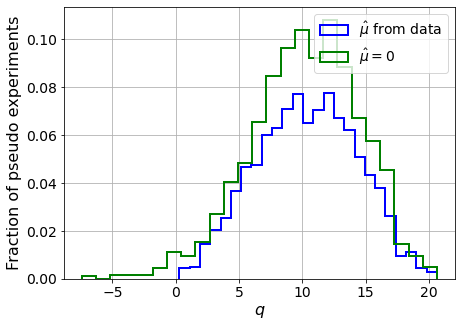

muhat mean:  -0.22705043960948815
Z_bins:  3.223855593883847
std Z_bins:  0.6133610343586179
Z_bins mu=0:  3.223855593883847
std Z_bins mu=0:  0.661695744064394

--------

B_expected:  643
S_expected:  23



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


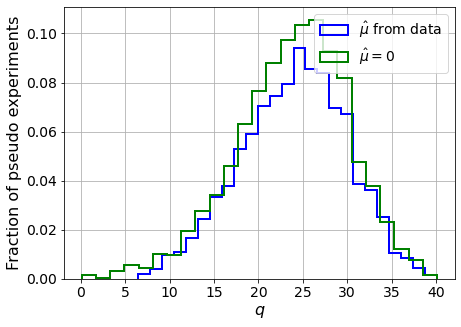

muhat mean:  -0.10849712264626774
Z_bins:  4.930315161728855
std Z_bins:  0.6040200787357994
Z_bins mu=0:  4.930315161728855
std Z_bins mu=0:  0.6386367579732662

--------

B_expected:  643
S_expected:  44



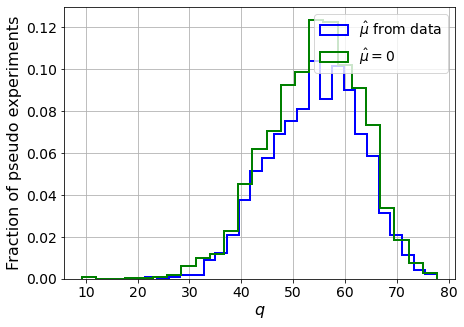

muhat mean:  -0.06487988784374364
Z_bins:  7.403592095546393
std Z_bins:  0.5918244518646667
Z_bins mu=0:  7.403592095546393
std Z_bins mu=0:  0.6151706527442349

--------

B_expected:  643
S_expected:  85



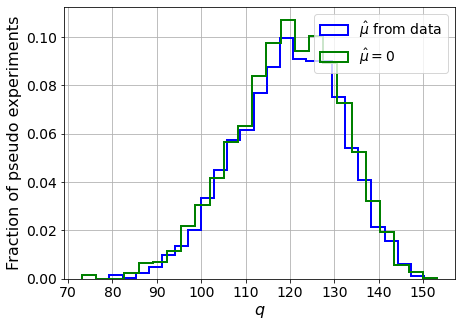

muhat mean:  -0.03515101276562608
Z_bins:  10.964949109576112
std Z_bins:  0.5361092386732221
Z_bins mu=0:  10.964949109576112
std Z_bins mu=0:  0.5479469690175945

--------

B_expected:  643
S_expected:  165



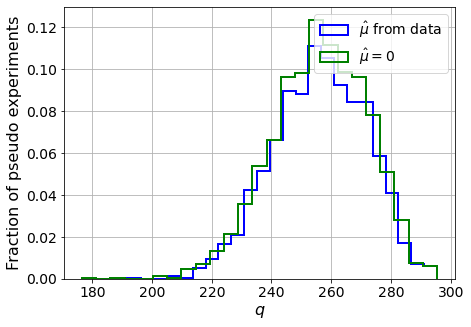

muhat mean:  -0.015324073682460184
Z_bins:  16.018563325722607
std Z_bins:  0.4845486516762663
Z_bins mu=0:  16.018563325722607
std Z_bins mu=0:  0.4937888652586909

--------

B_expected:  643
S_expected:  318



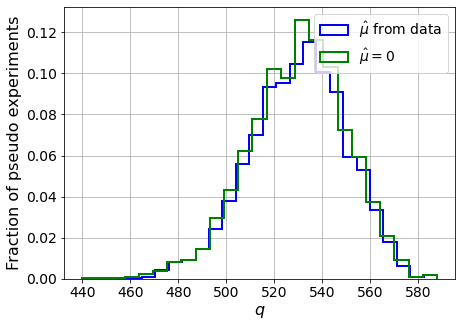

muhat mean:  -0.008183188111822766
Z_bins:  23.04403008716278
std Z_bins:  0.4334707087422234
Z_bins mu=0:  23.04397539738028
std Z_bins mu=0:  0.44056242115607447

--------

B_expected:  643
S_expected:  615



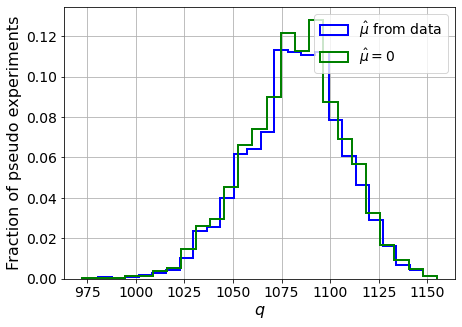

muhat mean:  -0.004142766973928465
Z_bins:  32.90660196424757
std Z_bins:  0.38198561442951934
Z_bins mu=0:  32.90660196424757
std Z_bins mu=0:  0.38609397483811014

--------

B_expected:  643
S_expected:  1187



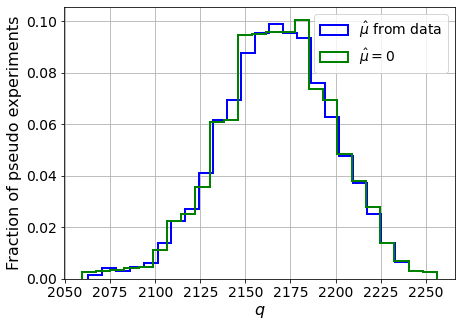

muhat mean:  -0.002211840666371344
Z_bins:  46.56495913770562
std Z_bins:  0.33286013476464876
Z_bins mu=0:  46.56445424780675
std Z_bins mu=0:  0.3358784711212364

--------

B_expected:  643
S_expected:  2291



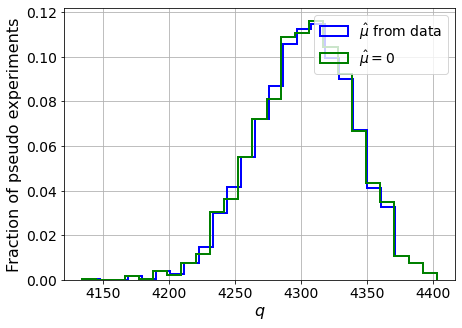

muhat mean:  -0.0011888522148328204
Z_bins:  65.60307789940852
std Z_bins:  0.28022717853796475
Z_bins mu=0:  65.60307789940852
std Z_bins mu=0:  0.28183313942096466

--------

B_expected:  643
S_expected:  4424



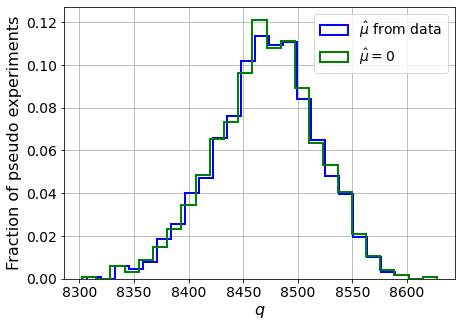

muhat mean:  -0.0006287830745404707
Z_bins:  92.04432495376489
std Z_bins:  0.2538428872484073
Z_bins mu=0:  92.04374955801703
std Z_bins mu=0:  0.2553082231200266

--------

B_expected:  643
S_expected:  8542



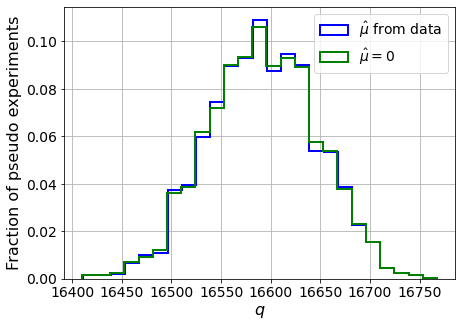

muhat mean:  -0.0003227589267514166
Z_bins:  128.80776110305018
std Z_bins:  0.21011651535022413
Z_bins mu=0:  128.80741011561298
std Z_bins mu=0:  0.2109353807190165

--------


 FINAL RESULT:

[[0.6615997385537252, 0.31489708272229255, -2.3365637776744874, 0.6615997385537252, 0.41460819176770725], [0.9788301437030845, 0.42195820158718006, -1.5805077882204936, 0.9788301437030845, 0.5227456501147602], [1.3185191336491175, 0.46139285488843107, -1.0734880397044981, 1.3185191336491175, 0.5603120426881237], [2.070557488600864, 0.5353572345273618, -0.46695620153657774, 2.070557488600864, 0.6058717893189292], [3.223855593883847, 0.6133610343586179, -0.22705043960948815, 3.223855593883847, 0.661695744064394], [4.930315161728855, 0.6040200787357994, -0.10849712264626774, 4.930315161728855, 0.6386367579732662], [7.403592095546393, 0.5918244518646667, -0.06487988784374364, 7.403592095546393, 0.6151706527442349], [10.964949109576112, 0.5361092386732221, -0.03515101276562608, 10.964949109576112, 0

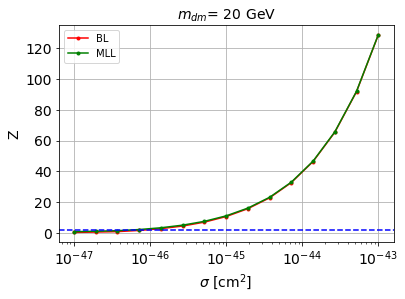


cross_BL_164:  7.833886803234381e-47
cross_BL_164_up:  4.874226723870817e-47
cross_BL_164_down:  1.125877702029272e-46

cross_MLL_164:  4.938164218295169e-47
cross_MLL_164_up:  3.3345176826587163e-47
cross_MLL_164_down:  7.673420300555924e-47

#########################


#########################

mDM =  35 GeV


S_cs1.shape:  (33697,)
S_cs2.shape:  (33697,)
 NUM_DAT:  33084 

NUM_DAT_ER:  32663
NUM_DAT_AC:  116
NUM_DAT_CNNS:  1
NUM_DAT_RN:  30
NUM_DAT_WALL:  274

B_cs1cs2.shape:  (33084, 2)

S_cs1cs2.shape:  (33084, 2)


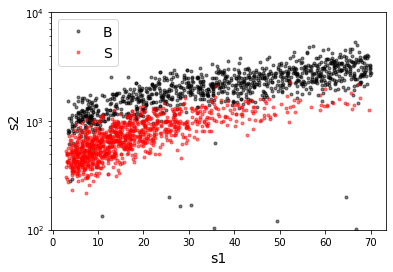

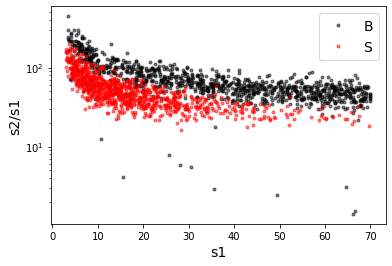

X_mon_B.shape:  (33084, 2)
X_mon_S.shape:  (33084, 2)
X_mon.shape:  (66168, 2)

X_mon_train :  (42182, 2)
y_mon_train :  (42182,)
X_mon_val :  (7444, 2)
y_mon_val :  (7444,)
X_mon_test :  (16542, 2)
y_mon_test :  (16542,)

Classification score:


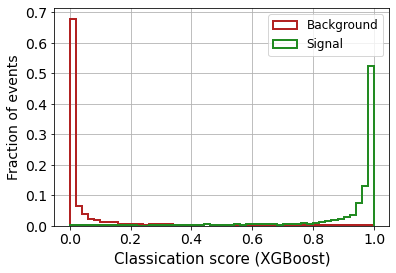


 ROC-AUC =  0.9858971416940243
At least 5 B events per bin, range = [[0, 1]]:
# bins:  13 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  13
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3965


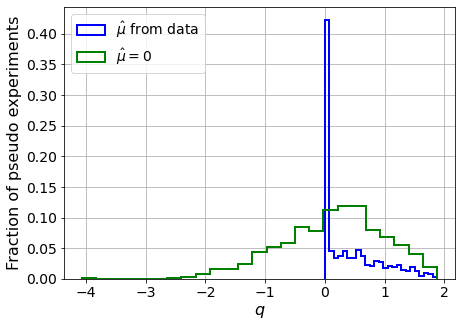

muhat mean:  0.19094350775092106
Z_bins:  0.46923785535740653
std Z_bins:  0.5268353620240898
Z_bins mu=0:  0.4692378533191163
std Z_bins mu=0:  0.9108812968969896

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3805


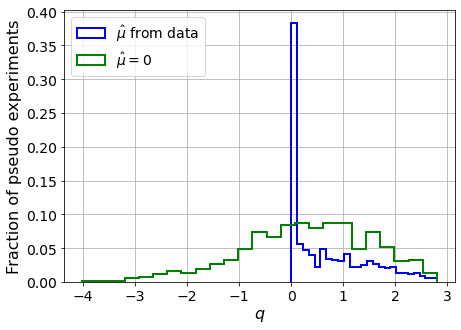

muhat mean:  0.17691730923961588
Z_bins:  0.6040308899608212
std Z_bins:  0.627174101340522
Z_bins mu=0:  0.597555985199937
std Z_bins mu=0:  1.0362739241430599

--------

B_expected:  643
S_expected:  7

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.371


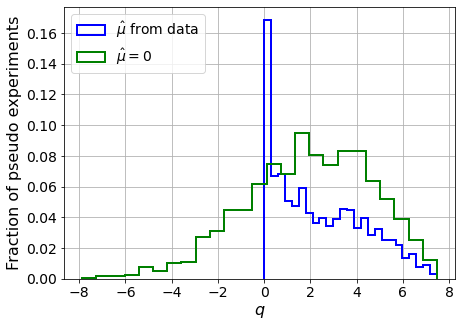

muhat mean:  0.0646882675767427
Z_bins:  1.437590786300682
std Z_bins:  0.6849749165522906
Z_bins mu=0:  1.4369624355200081
std Z_bins mu=0:  0.9420002451628805

--------

B_expected:  643
S_expected:  13

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.378


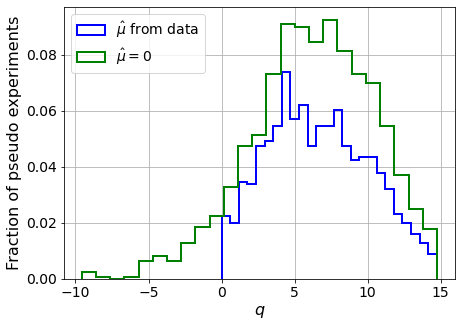

muhat mean:  0.014263071145870058
Z_bins:  2.5457496864032185
std Z_bins:  0.6759167143981405
Z_bins mu=0:  2.5457496864032185
std Z_bins mu=0:  0.8154940979627466

--------

B_expected:  643
S_expected:  25

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.389


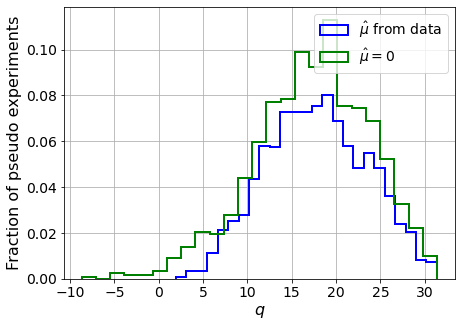

muhat mean:  0.01522585547407925
Z_bins:  4.2034429380846134
std Z_bins:  0.6753145203451165
Z_bins mu=0:  4.2034423911661305
std Z_bins mu=0:  0.767135419347218

--------

B_expected:  643
S_expected:  48

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.354


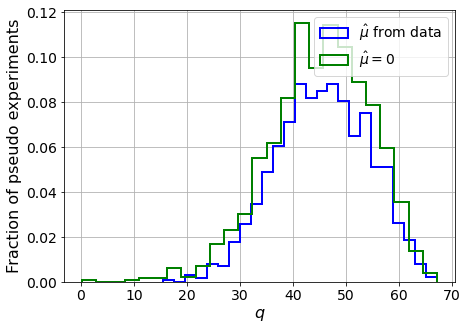

muhat mean:  0.006415217171898546
Z_bins:  6.762663946164537
std Z_bins:  0.641430182744376
Z_bins mu=0:  6.762663946164537
std Z_bins mu=0:  0.6997854346073484

--------

B_expected:  643
S_expected:  93

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.384


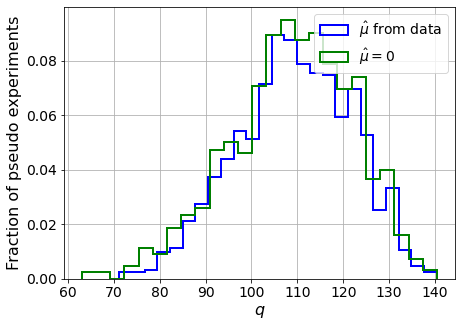

muhat mean:  0.0027867185736510655
Z_bins:  10.464847316618583
std Z_bins:  0.6001655236076219
Z_bins mu=0:  10.464521803281631
std Z_bins mu=0:  0.637896540541466

--------

B_expected:  643
S_expected:  179

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3885


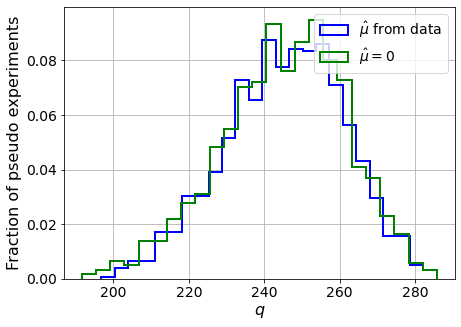

muhat mean:  0.0011134839812320214
Z_bins:  15.695339556446076
std Z_bins:  0.5064160561612804
Z_bins mu=0:  15.694258227263747
std Z_bins mu=0:  0.5281360369286785

--------

B_expected:  643
S_expected:  345

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.386


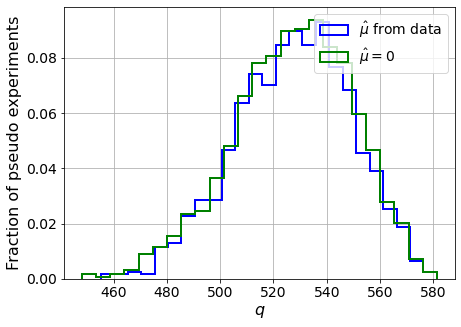

muhat mean:  0.0009184318069365639
Z_bins:  22.99467940654948
std Z_bins:  0.47036754937519737
Z_bins mu=0:  22.993906355043503
std Z_bins mu=0:  0.4867228140075991

--------

B_expected:  643
S_expected:  666

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.373


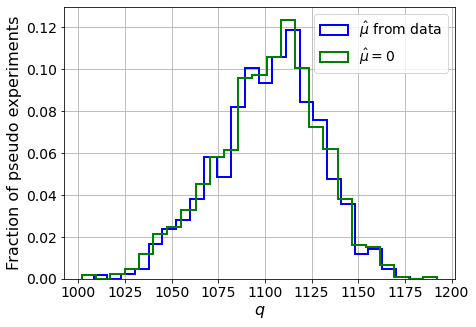

muhat mean:  0.0003352423139747422
Z_bins:  33.22651940935179
std Z_bins:  0.41397952155669093
Z_bins mu=0:  33.22204568228737
std Z_bins mu=0:  0.4246703055945114

--------

B_expected:  643
S_expected:  1286

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.404


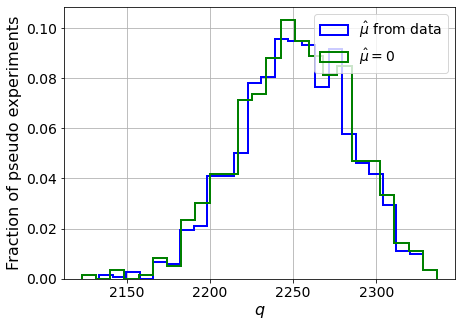

muhat mean:  0.00016182484135830196
Z_bins:  47.45358664318838
std Z_bins:  0.35067787335418044
Z_bins mu=0:  47.4520880564252
std Z_bins mu=0:  0.35741157131634665

--------

B_expected:  643
S_expected:  2484

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.383


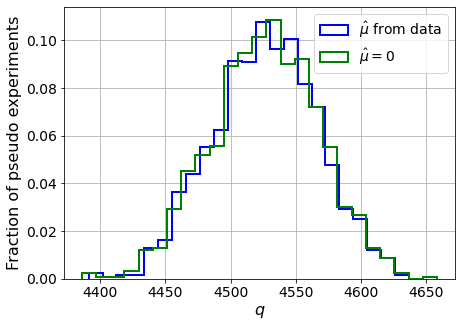

muhat mean:  0.0001608260647481075
Z_bins:  67.2868940791781
std Z_bins:  0.29885082666887375
Z_bins mu=0:  67.28686940468572
std Z_bins mu=0:  0.30335778475943886

--------

B_expected:  643
S_expected:  4795

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.4075


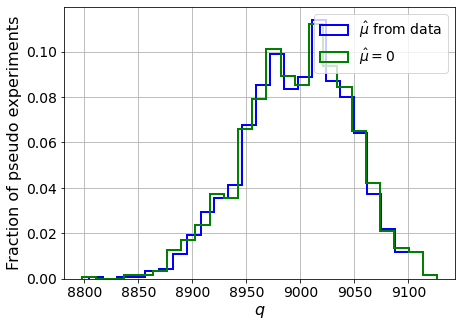

muhat mean:  5.743071390538164e-05
Z_bins:  94.87101207237335
std Z_bins:  0.2588896341287129
Z_bins mu=0:  94.87101207237335
std Z_bins mu=0:  0.2618585796957253

--------

B_expected:  643
S_expected:  9258

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3735


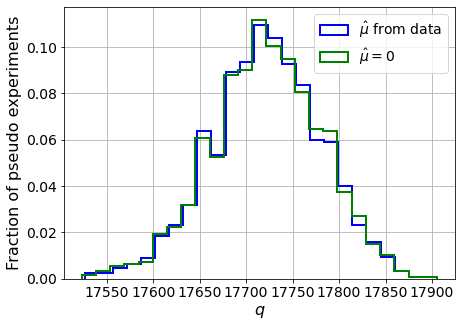

muhat mean:  1.6214832934077272e-05
Z_bins:  133.1252975307911
std Z_bins:  0.22171107421303493
Z_bins mu=0:  133.1231107952344
std Z_bins mu=0:  0.22345871073186838

--------

B_expected:  643
S_expected:  17875

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.382


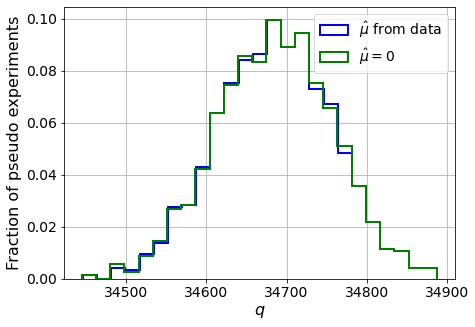

muhat mean:  1.0806151998841271e-05
Z_bins:  186.24668639734244
std Z_bins:  0.1926040970160543
Z_bins mu=0:  186.24662752247485
std Z_bins mu=0:  0.19372575442489323

--------


 FINAL RESULT:

[[0.46923785535740653, 0.5268353620240898, 0.19094350775092106, 0.4692378533191163, 0.9108812968969896], [0.6040308899608212, 0.627174101340522, 0.17691730923961588, 0.597555985199937, 1.0362739241430599], [1.437590786300682, 0.6849749165522906, 0.0646882675767427, 1.4369624355200081, 0.9420002451628805], [2.5457496864032185, 0.6759167143981405, 0.014263071145870058, 2.5457496864032185, 0.8154940979627466], [4.2034429380846134, 0.6753145203451165, 0.01522585547407925, 4.2034423911661305, 0.767135419347218], [6.762663946164537, 0.641430182744376, 0.006415217171898546, 6.762663946164537, 0.6997854346073484], [10.464847316618583, 0.6001655236076219, 0.0027867185736510655, 10.464521803281631, 0.637896540541466], [15.695339556446076, 0.5064160561612804, 0.0011134839812320214, 15.694258227263747, 0.5

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 392.53276374 349.98474015 300.1851422  244.06042144
 183.10140015 116.21281525  47.20181768 -24.77984414 -95.38386454]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf 271.89440164 228.33887187
 177

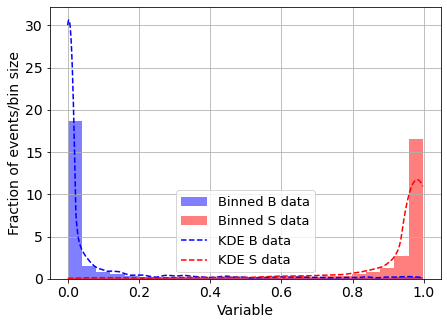

KDE Kernel:  epanechnikov
Background bandwidth:  0.022117541055781564
Signal bandwidth:  0.059027261020128646
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  2



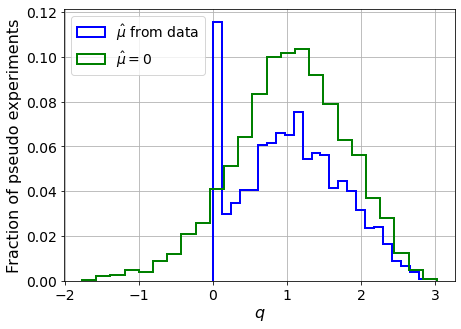

muhat mean:  -2.502355498133692
Z_bins:  1.0316544136882302
std Z_bins:  0.32783947293177307
Z_bins mu=0:  1.0316544136882302
std Z_bins mu=0:  0.36737672383576303

--------

B_expected:  643
S_expected:  3



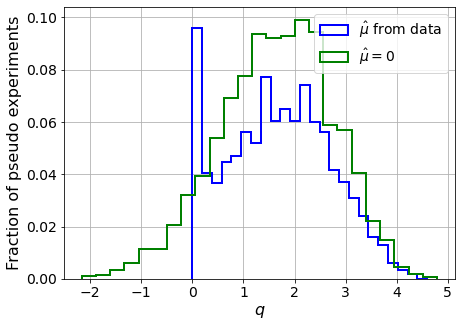

muhat mean:  -1.5792349339405856
Z_bins:  1.298820162008133
std Z_bins:  0.38986109613607267
Z_bins mu=0:  1.298820162008133
std Z_bins mu=0:  0.4269508622692103

--------

B_expected:  643
S_expected:  7



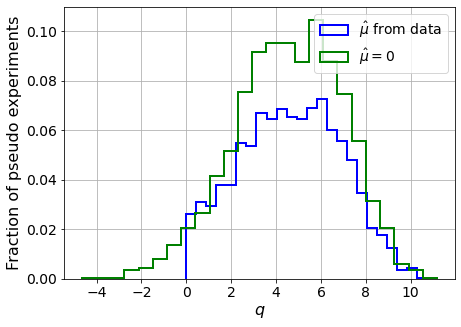

muhat mean:  -0.641983867226384
Z_bins:  2.1596547758676525
std Z_bins:  0.5202434394542819
Z_bins mu=0:  2.1596547758676525
std Z_bins mu=0:  0.5539070156567055

--------

B_expected:  643
S_expected:  13



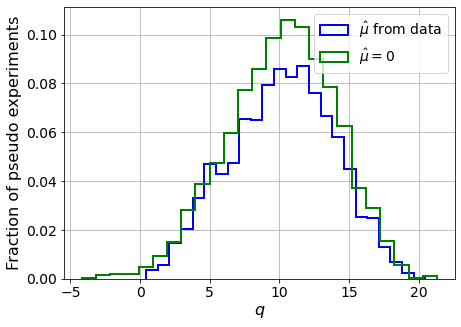

muhat mean:  -0.35288314815172406
Z_bins:  3.221590782648882
std Z_bins:  0.5760211740480026
Z_bins mu=0:  3.221590782648882
std Z_bins mu=0:  0.5978335876378923

--------

B_expected:  643
S_expected:  25



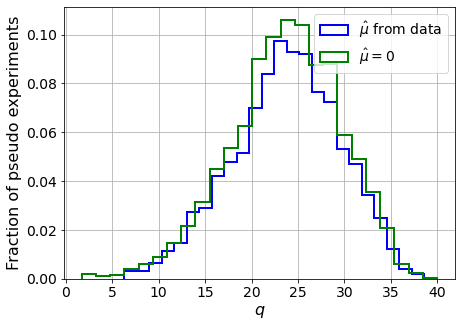

muhat mean:  -0.19244569255833302
Z_bins:  4.896252307455382
std Z_bins:  0.5885338204921543
Z_bins mu=0:  4.896252307455382
std Z_bins mu=0:  0.6042611234494547

--------

B_expected:  643
S_expected:  48



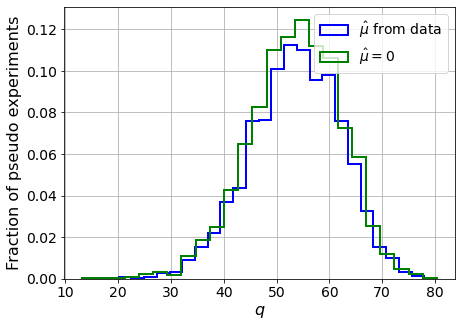

muhat mean:  -0.09329748125014516
Z_bins:  7.334315173900644
std Z_bins:  0.5822705780844127
Z_bins mu=0:  7.334315173900644
std Z_bins mu=0:  0.5939087636398002

--------

B_expected:  643
S_expected:  93



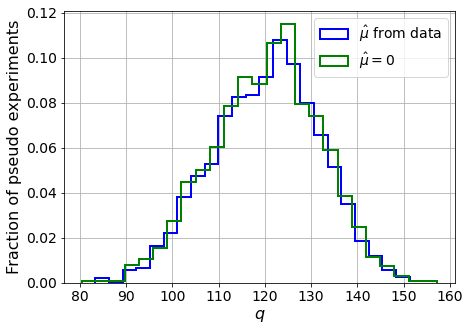

muhat mean:  -0.053396718536350016
Z_bins:  11.005561337857758
std Z_bins:  0.5266693613868001
Z_bins mu=0:  11.005561337857758
std Z_bins mu=0:  0.5306515001659033

--------

B_expected:  643
S_expected:  179



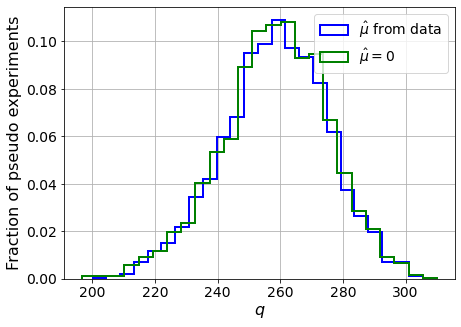

muhat mean:  -0.026378988746088333
Z_bins:  16.090939082515828
std Z_bins:  0.5213400926047047
Z_bins mu=0:  16.090939082515828
std Z_bins mu=0:  0.5260129155937121

--------

B_expected:  643
S_expected:  345



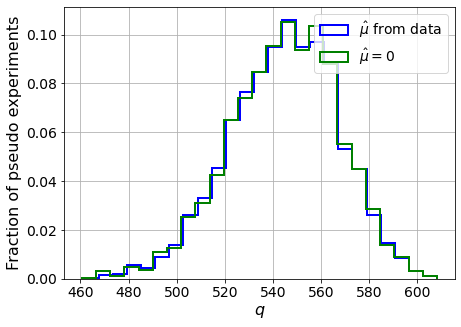

muhat mean:  -0.013974355286000979
Z_bins:  23.365256594195195
std Z_bins:  0.4825044297373352
Z_bins mu=0:  23.365233916419506
std Z_bins mu=0:  0.48586770826838466

--------

B_expected:  643
S_expected:  666



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


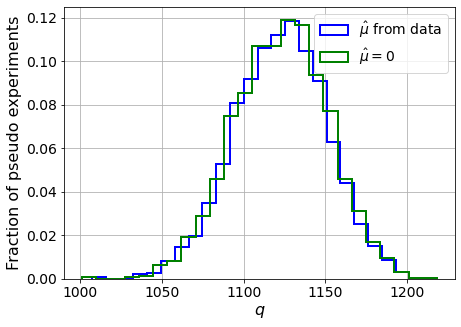

muhat mean:  -0.007060837520477047
Z_bins:  33.521022592598094
std Z_bins:  0.42517127018274103
Z_bins mu=0:  33.521022592598094
std Z_bins mu=0:  0.4271543356996194

--------

B_expected:  643
S_expected:  1286



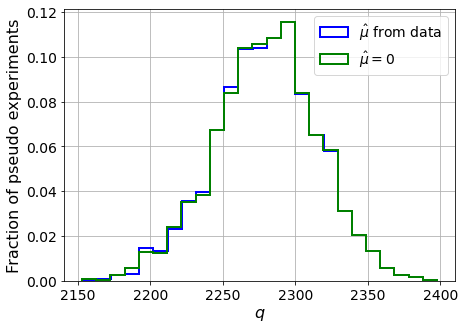

muhat mean:  -0.0036663235952121057
Z_bins:  47.758517595071375
std Z_bins:  0.37140108161450935
Z_bins mu=0:  47.758517595071375
std Z_bins mu=0:  0.3725415090013995

--------

B_expected:  643
S_expected:  2484



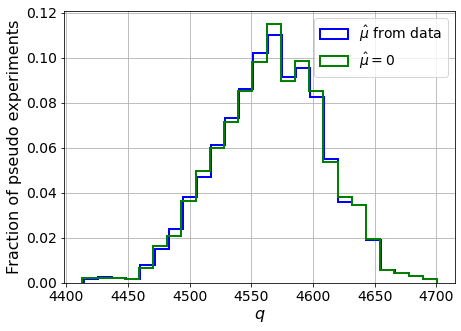

muhat mean:  -0.0017844130940837817
Z_bins:  67.5777335178705
std Z_bins:  0.32410779225574826
Z_bins mu=0:  67.5777335178705
std Z_bins mu=0:  0.3248490153923666

--------

B_expected:  643
S_expected:  4795



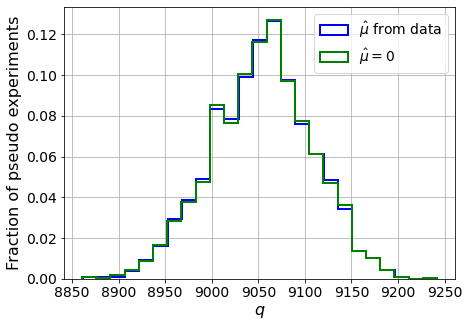

muhat mean:  -0.0010559317971347508
Z_bins:  95.16254009459563
std Z_bins:  0.28186944205768233
Z_bins mu=0:  95.16254009459563
std Z_bins mu=0:  0.2823538564674027

--------

B_expected:  643
S_expected:  9258



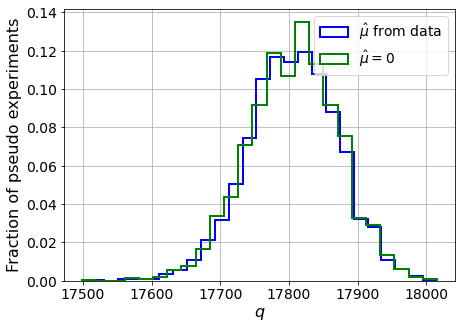

muhat mean:  -0.0004911927533684433
Z_bins:  133.44895649164874
std Z_bins:  0.24650348814156703
Z_bins mu=0:  133.44887415964607
std Z_bins mu=0:  0.2470152022884739

--------

B_expected:  643
S_expected:  17875



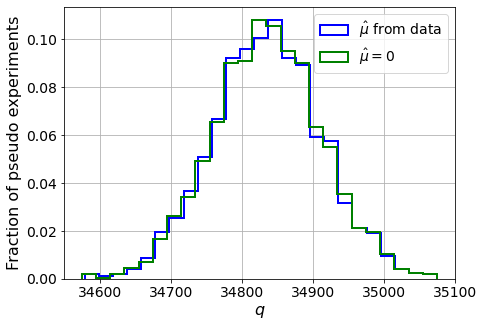

muhat mean:  -0.0002542130930890445
Z_bins:  186.64328244416163
std Z_bins:  0.20386863198469282
Z_bins mu=0:  186.64328244416163
std Z_bins mu=0:  0.20406380705897187

--------


 FINAL RESULT:

[[1.0316544136882302, 0.32783947293177307, -2.502355498133692, 1.0316544136882302, 0.36737672383576303], [1.298820162008133, 0.38986109613607267, -1.5792349339405856, 1.298820162008133, 0.4269508622692103], [2.1596547758676525, 0.5202434394542819, -0.641983867226384, 2.1596547758676525, 0.5539070156567055], [3.221590782648882, 0.5760211740480026, -0.35288314815172406, 3.221590782648882, 0.5978335876378923], [4.896252307455382, 0.5885338204921543, -0.19244569255833302, 4.896252307455382, 0.6042611234494547], [7.334315173900644, 0.5822705780844127, -0.09329748125014516, 7.334315173900644, 0.5939087636398002], [11.005561337857758, 0.5266693613868001, -0.053396718536350016, 11.005561337857758, 0.5306515001659033], [16.090939082515828, 0.5213400926047047, -0.026378988746088333, 16.090939082515828, 

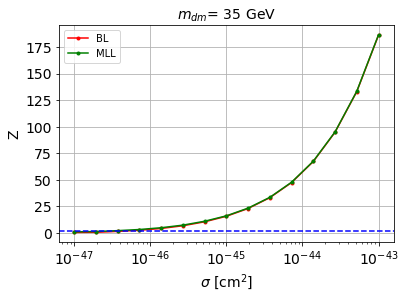


cross_BL_164:  4.2035412599502184e-47
cross_BL_164_up:  2.792442722360871e-47
cross_BL_164_down:  6.5696771038327445e-47

cross_MLL_164:  2.701563977016666e-47
cross_MLL_164_up:  1.869313358795012e-47
cross_MLL_164_down:  3.7290287492827988e-47

#########################


#########################

mDM =  50 GeV


S_cs1.shape:  (35287,)
S_cs2.shape:  (35287,)
 NUM_DAT:  34105 

NUM_DAT_ER:  33671
NUM_DAT_AC:  119
NUM_DAT_CNNS:  1
NUM_DAT_RN:  31
NUM_DAT_WALL:  283

B_cs1cs2.shape:  (34105, 2)

S_cs1cs2.shape:  (34105, 2)


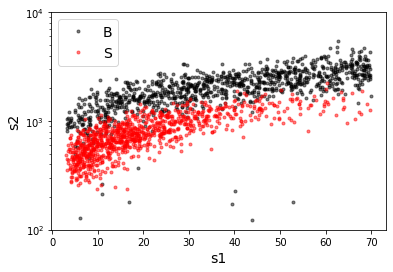

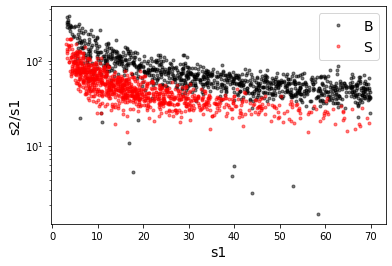

X_mon_B.shape:  (34105, 2)
X_mon_S.shape:  (34105, 2)
X_mon.shape:  (68210, 2)

X_mon_train :  (43483, 2)
y_mon_train :  (43483,)
X_mon_val :  (7674, 2)
y_mon_val :  (7674,)
X_mon_test :  (17053, 2)
y_mon_test :  (17053,)

Classification score:


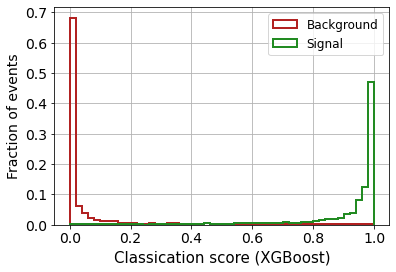


 ROC-AUC =  0.9823337400673746
At least 5 B events per bin, range = [[0, 1]]:
# bins:  13 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  13
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.385


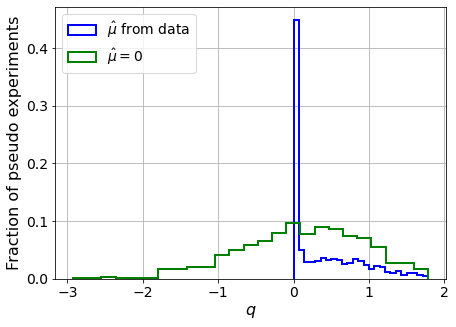

muhat mean:  0.23284293628548822
Z_bins:  0.38478069584273605
std Z_bins:  0.6089309654835853
Z_bins mu=0:  0.37553618471086553
std Z_bins mu=0:  1.082333827758709

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3895


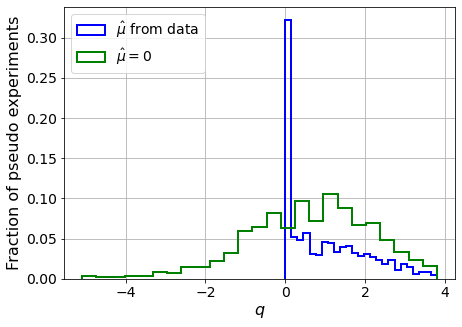

muhat mean:  0.0950289762406162
Z_bins:  0.83711257886218
std Z_bins:  0.6010184920994752
Z_bins mu=0:  0.8365274972807368
std Z_bins mu=0:  0.9257094686013897

--------

B_expected:  643
S_expected:  7

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.383


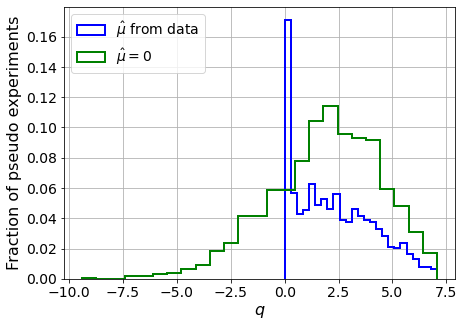

muhat mean:  0.048697655413369595
Z_bins:  1.4490702008715461
std Z_bins:  0.6325782935614448
Z_bins mu=0:  1.4490702008715461
std Z_bins mu=0:  0.8814994666354462

--------

B_expected:  643
S_expected:  14

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.378


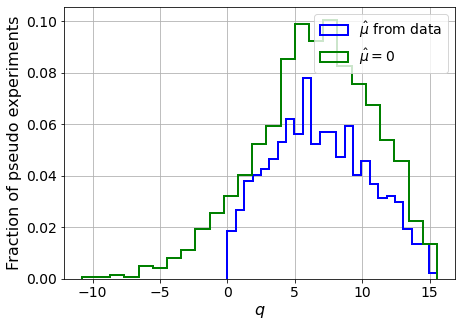

muhat mean:  0.02384887954113491
Z_bins:  2.5910780505210904
std Z_bins:  0.6905774842579102
Z_bins mu=0:  2.590431606820669
std Z_bins mu=0:  0.841881321733618

--------

B_expected:  643
S_expected:  27

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.381


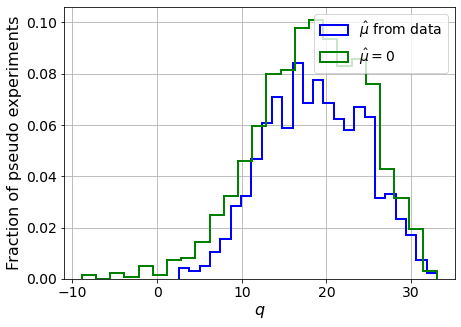

muhat mean:  0.01851429997257378
Z_bins:  4.309782404946981
std Z_bins:  0.6714911198606768
Z_bins mu=0:  4.309019350834088
std Z_bins mu=0:  0.7664088865531391

--------

B_expected:  643
S_expected:  51

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3925


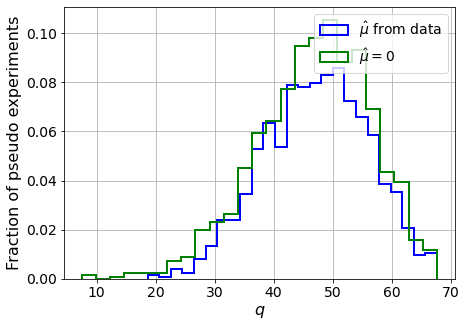

muhat mean:  0.0046465093502363625
Z_bins:  6.8922051421837125
std Z_bins:  0.6394569825424556
Z_bins mu=0:  6.8922051421837125
std Z_bins mu=0:  0.696140867047809

--------

B_expected:  643
S_expected:  99

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3885


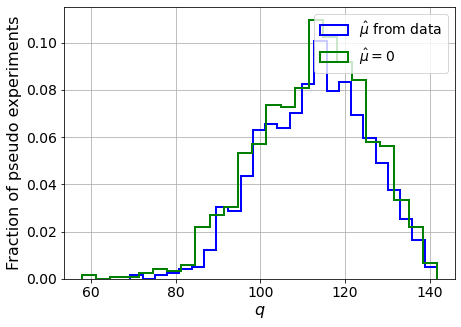

muhat mean:  0.005521703585812664
Z_bins:  10.663791634671291
std Z_bins:  0.5847378806203526
Z_bins mu=0:  10.661967566932281
std Z_bins mu=0:  0.6227154251888699

--------

B_expected:  643
S_expected:  192

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.372


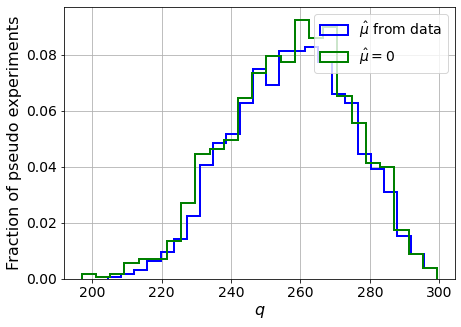

muhat mean:  0.0021089640252603295
Z_bins:  16.078365528040916
std Z_bins:  0.526893377824699
Z_bins mu=0:  16.076426791308702
std Z_bins mu=0:  0.5492602328935705

--------

B_expected:  643
S_expected:  370

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.383


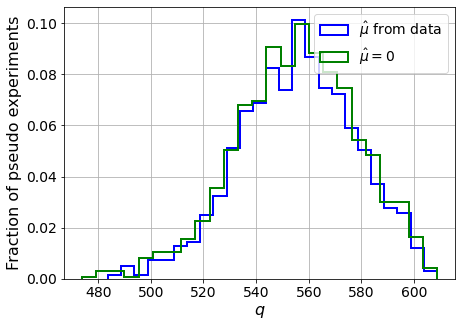

muhat mean:  0.001438122471230517
Z_bins:  23.586136969097748
std Z_bins:  0.4683821190745959
Z_bins mu=0:  23.582121190658025
std Z_bins mu=0:  0.48493019520338443

--------

B_expected:  643
S_expected:  714

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3815


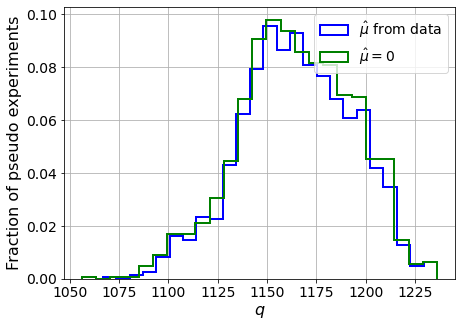

muhat mean:  0.0008325678195447277
Z_bins:  34.127202027936136
std Z_bins:  0.4153160225010551
Z_bins mu=0:  34.127202027936136
std Z_bins mu=0:  0.4255372210220276

--------

B_expected:  643
S_expected:  1378

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3935


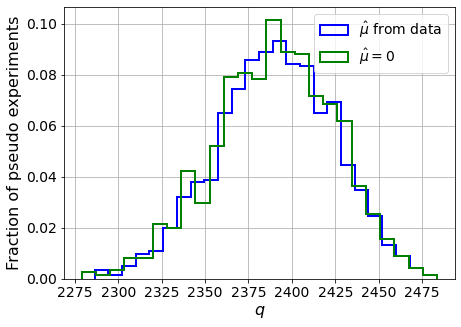

muhat mean:  0.00021449606270887385
Z_bins:  48.898525163117206
std Z_bins:  0.34589839390899946
Z_bins mu=0:  48.896885494543916
std Z_bins mu=0:  0.3520791124177274

--------

B_expected:  643
S_expected:  2661

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.385


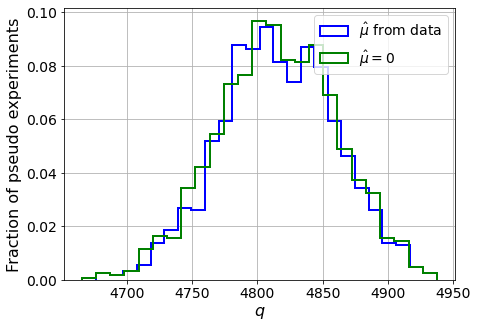

muhat mean:  0.00019808845164585325
Z_bins:  69.39023984717151
std Z_bins:  0.3205951025382054
Z_bins mu=0:  69.38971013496159
std Z_bins mu=0:  0.3254390274176656

--------

B_expected:  643
S_expected:  5138



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3775


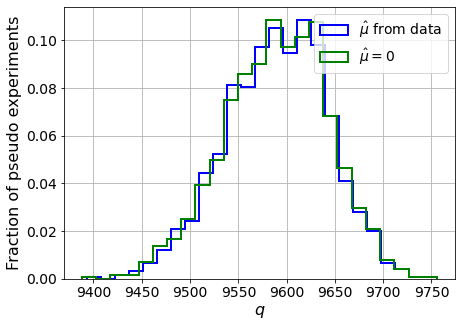

muhat mean:  7.173039531554283e-05
Z_bins:  97.93974902231756
std Z_bins:  0.26971857217387124
Z_bins mu=0:  97.93962758287971
std Z_bins mu=0:  0.27251512308070863

--------

B_expected:  643
S_expected:  9921

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3915


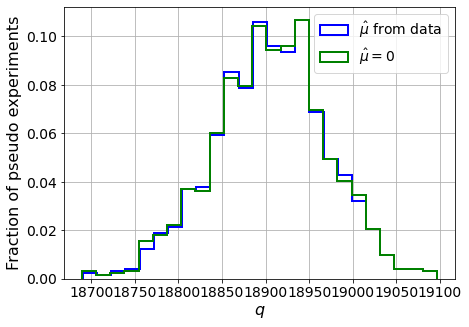

muhat mean:  4.587941996626497e-05
Z_bins:  137.50163605388988
std Z_bins:  0.23629292818376108
Z_bins mu=0:  137.50163588820996
std Z_bins mu=0:  0.23821050375779054

--------

B_expected:  643
S_expected:  19154

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3895


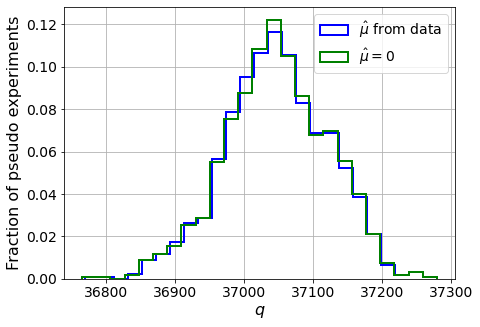

muhat mean:  2.1042566972849095e-05
Z_bins:  192.47477093637497
std Z_bins:  0.19353156060704552
Z_bins mu=0:  192.47314941961164
std Z_bins mu=0:  0.1946968524754803

--------


 FINAL RESULT:

[[0.38478069584273605, 0.6089309654835853, 0.23284293628548822, 0.37553618471086553, 1.082333827758709], [0.83711257886218, 0.6010184920994752, 0.0950289762406162, 0.8365274972807368, 0.9257094686013897], [1.4490702008715461, 0.6325782935614448, 0.048697655413369595, 1.4490702008715461, 0.8814994666354462], [2.5910780505210904, 0.6905774842579102, 0.02384887954113491, 2.590431606820669, 0.841881321733618], [4.309782404946981, 0.6714911198606768, 0.01851429997257378, 4.309019350834088, 0.7664088865531391], [6.8922051421837125, 0.6394569825424556, 0.0046465093502363625, 6.8922051421837125, 0.696140867047809], [10.663791634671291, 0.5847378806203526, 0.005521703585812664, 10.661967566932281, 0.6227154251888699], [16.078365528040916, 0.526893377824699, 0.0021089640252603295, 16.076426791308702, 0.5

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf 282.71923564 227.73246861
 171.14560102 109.20864552  41.18241412 -27.0953814  -96.72733292]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 280.80336344 246.40188322 204.56616163
 156

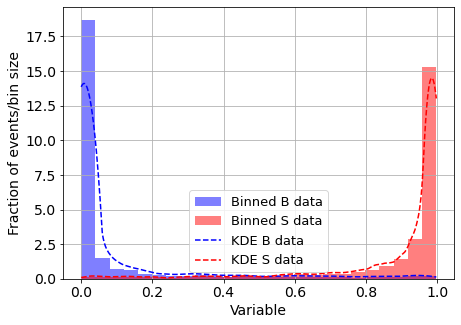

KDE Kernel:  epanechnikov
Background bandwidth:  0.059027261020128646
Signal bandwidth:  0.03613222756796251
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  2



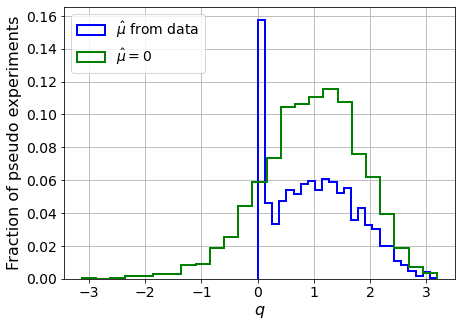

muhat mean:  -2.0654501265975664
Z_bins:  1.0041109923644471
std Z_bins:  0.3650545638173684
Z_bins mu=0:  1.0041109923644471
std Z_bins mu=0:  0.43814435277295544

--------

B_expected:  643
S_expected:  4



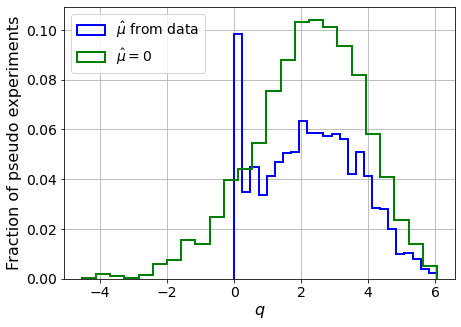

muhat mean:  -1.0573699933042726
Z_bins:  1.5248025393394447
std Z_bins:  0.467614156942851
Z_bins mu=0:  1.5248025393394447
std Z_bins mu=0:  0.5391600030945336

--------

B_expected:  643
S_expected:  7



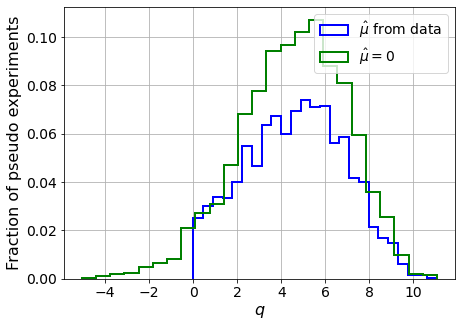

muhat mean:  -0.5208184837430287
Z_bins:  2.1651863680949166
std Z_bins:  0.5170769201722375
Z_bins mu=0:  2.1651863680949166
std Z_bins mu=0:  0.5621598039990816

--------

B_expected:  643
S_expected:  14



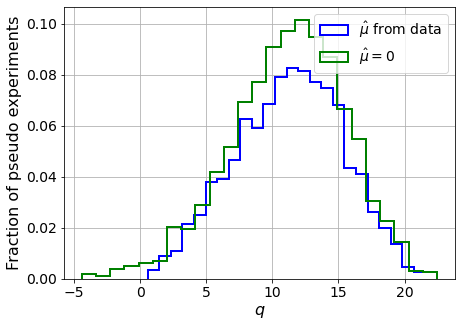

muhat mean:  -0.2943261822446432
Z_bins:  3.3891986467715047
std Z_bins:  0.6016896201740745
Z_bins mu=0:  3.3891986467715047
std Z_bins mu=0:  0.6402096304337157

--------

B_expected:  643
S_expected:  27



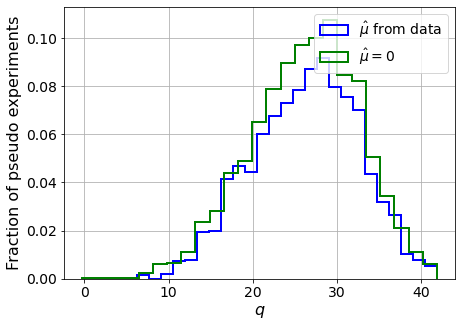

muhat mean:  -0.16820668615273637
Z_bins:  5.159295676344993
std Z_bins:  0.6063386710943878
Z_bins mu=0:  5.159295676344993
std Z_bins mu=0:  0.6280128636294504

--------

B_expected:  643
S_expected:  51



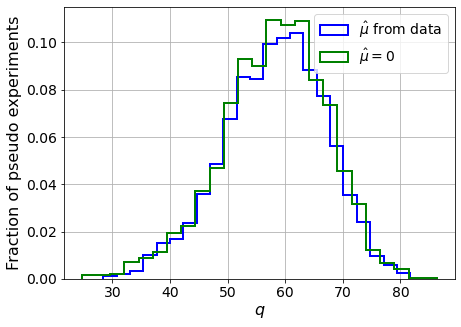

muhat mean:  -0.07847435063180679
Z_bins:  7.661418307024107
std Z_bins:  0.5763975533746936
Z_bins mu=0:  7.661418307024107
std Z_bins mu=0:  0.5918810529223376

--------

B_expected:  643
S_expected:  99



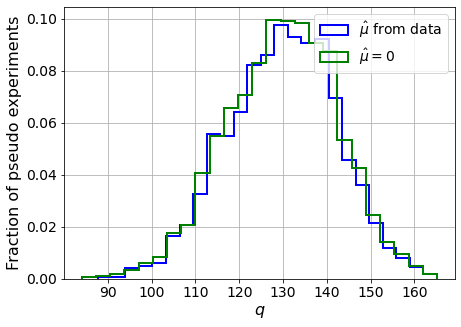

muhat mean:  -0.046066139600378704
Z_bins:  11.416359521524356
std Z_bins:  0.5424841967992925
Z_bins mu=0:  11.415941935919419
std Z_bins mu=0:  0.5510397515224651

--------

B_expected:  643
S_expected:  192



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


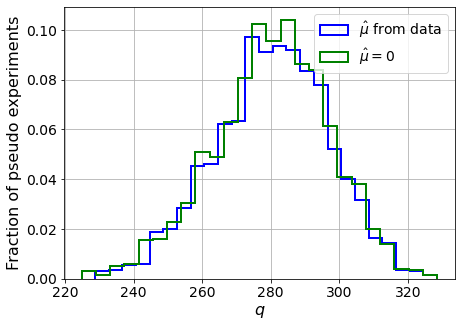

muhat mean:  -0.020787843113379365
Z_bins:  16.76427560492749
std Z_bins:  0.4983899137535972
Z_bins mu=0:  16.76427560492749
std Z_bins mu=0:  0.5053780580785696

--------

B_expected:  643
S_expected:  370



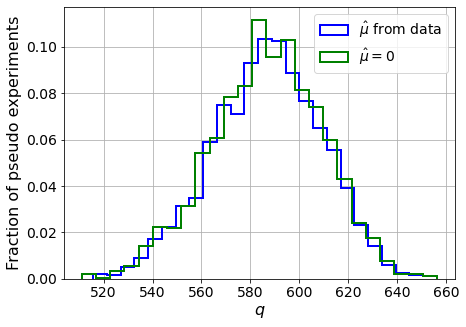

muhat mean:  -0.011202183977954411
Z_bins:  24.2318505340763
std Z_bins:  0.46238573135169336
Z_bins mu=0:  24.2318505340763
std Z_bins mu=0:  0.4664154129290752

--------

B_expected:  643
S_expected:  714



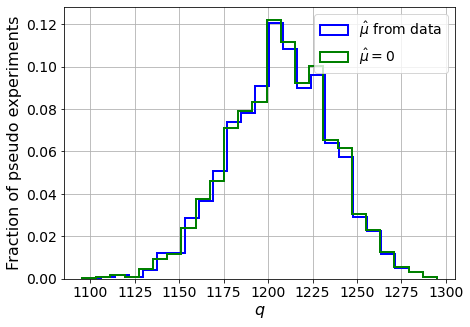

muhat mean:  -0.005591109552027509
Z_bins:  34.75092478032538
std Z_bins:  0.41544550990026363
Z_bins mu=0:  34.75092478032538
std Z_bins mu=0:  0.4184346191675075

--------

B_expected:  643
S_expected:  1378



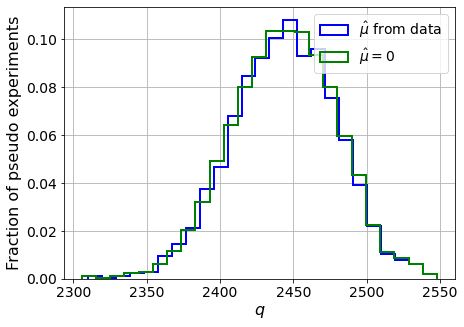

muhat mean:  -0.0025794890022650223
Z_bins:  49.44515832349104
std Z_bins:  0.3578161589826954
Z_bins mu=0:  49.44386269679984
std Z_bins mu=0:  0.3600714891521947

--------

B_expected:  643
S_expected:  2661



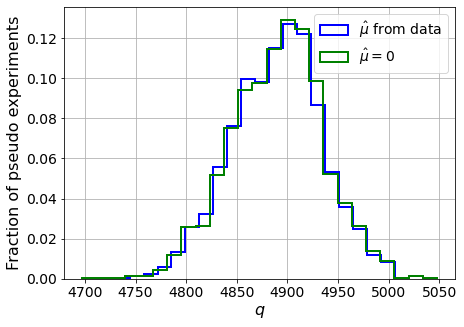

muhat mean:  -0.0014843908055496389
Z_bins:  69.94915358421407
std Z_bins:  0.3248162539446839
Z_bins mu=0:  69.9481907059985
std Z_bins mu=0:  0.32604521023799976

--------

B_expected:  643
S_expected:  5138



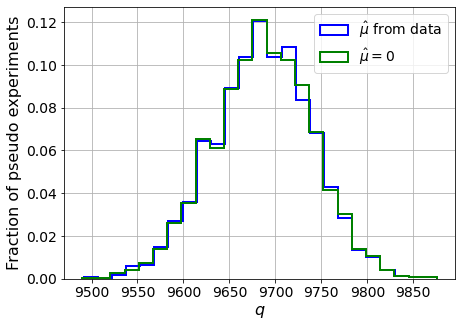

muhat mean:  -0.000801265086823902
Z_bins:  98.4215233135818
std Z_bins:  0.2740967789169555
Z_bins mu=0:  98.42151730475335
std Z_bins mu=0:  0.2749234280969197

--------

B_expected:  643
S_expected:  9921



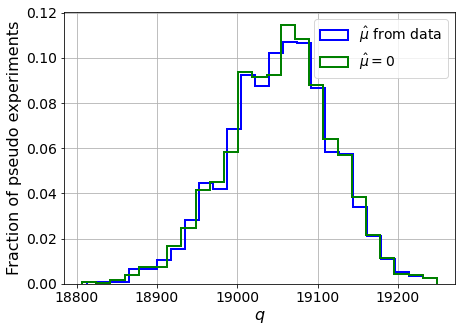

muhat mean:  -0.00041604791512510185
Z_bins:  138.04416197674814
std Z_bins:  0.2404656406162755
Z_bins mu=0:  138.04408658977806
std Z_bins mu=0:  0.24102140155776255

--------

B_expected:  643
S_expected:  19154



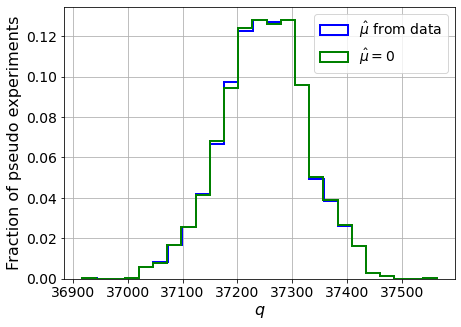

muhat mean:  -0.00022128198951586585
Z_bins:  193.00345426312614
std Z_bins:  0.20236557396103053
Z_bins mu=0:  193.00315624984103
std Z_bins mu=0:  0.2026532691184618

--------


 FINAL RESULT:

[[1.0041109923644471, 0.3650545638173684, -2.0654501265975664, 1.0041109923644471, 0.43814435277295544], [1.5248025393394447, 0.467614156942851, -1.0573699933042726, 1.5248025393394447, 0.5391600030945336], [2.1651863680949166, 0.5170769201722375, -0.5208184837430287, 2.1651863680949166, 0.5621598039990816], [3.3891986467715047, 0.6016896201740745, -0.2943261822446432, 3.3891986467715047, 0.6402096304337157], [5.159295676344993, 0.6063386710943878, -0.16820668615273637, 5.159295676344993, 0.6280128636294504], [7.661418307024107, 0.5763975533746936, -0.07847435063180679, 7.661418307024107, 0.5918810529223376], [11.416359521524356, 0.5424841967992925, -0.046066139600378704, 11.415941935919419, 0.5510397515224651], [16.76427560492749, 0.4983899137535972, -0.020787843113379365, 16.76427560492749, 

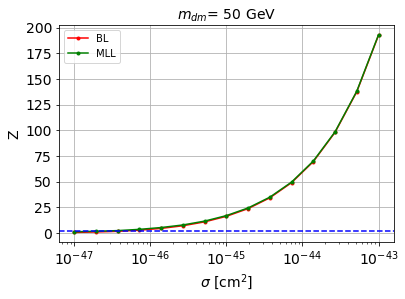


cross_BL_164:  4.1609885342393653e-47
cross_BL_164_up:  2.3732405108826783e-47
cross_BL_164_down:  6.520987119835413e-47

cross_MLL_164:  2.1732560599437332e-47
cross_MLL_164_up:  1.379601302061469e-47
cross_MLL_164_down:  3.7101806605672983e-47

#########################


#########################

mDM =  100 GeV


S_cs1.shape:  (37757,)
S_cs2.shape:  (37757,)
 NUM_DAT:  35163 

NUM_DAT_ER:  34715
NUM_DAT_AC:  123
NUM_DAT_CNNS:  1
NUM_DAT_RN:  32
NUM_DAT_WALL:  292

B_cs1cs2.shape:  (35163, 2)

S_cs1cs2.shape:  (35163, 2)


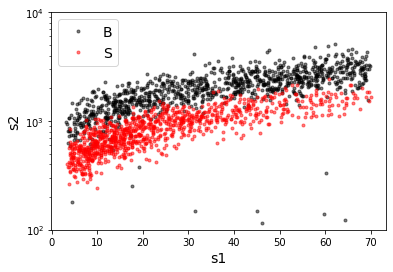

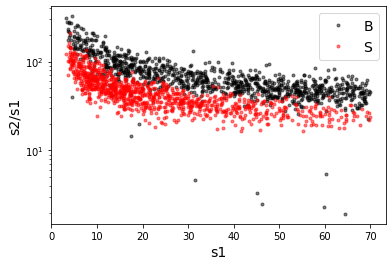

X_mon_B.shape:  (35163, 2)
X_mon_S.shape:  (35163, 2)
X_mon.shape:  (70326, 2)

X_mon_train :  (44832, 2)
y_mon_train :  (44832,)
X_mon_val :  (7912, 2)
y_mon_val :  (7912,)
X_mon_test :  (17582, 2)
y_mon_test :  (17582,)

Classification score:


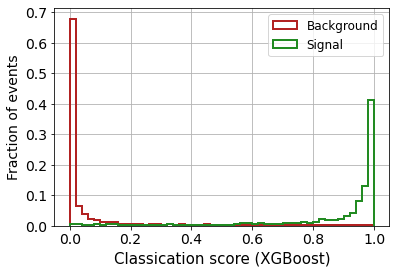


 ROC-AUC =  0.978965723361608
At least 5 B events per bin, range = [[0, 1]]:
# bins:  12 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  12
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.39


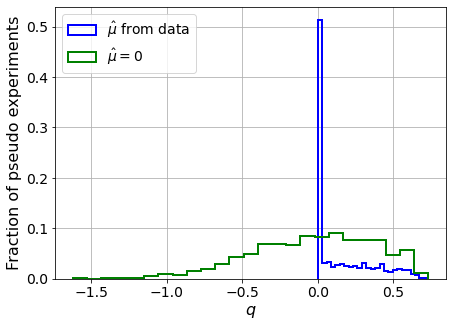

muhat mean:  0.7680479687338626
Z_bins:  0.13469229706767966
std Z_bins:  0.7353480817691463
Z_bins mu=0:  0.0829970063977891
std Z_bins mu=0:  2.477386640265933

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3895


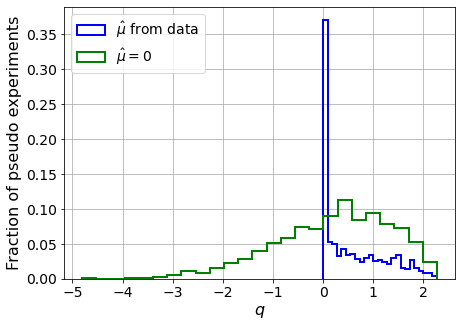

muhat mean:  0.2831434135720854
Z_bins:  0.5894319210701906
std Z_bins:  0.540373947392278
Z_bins mu=0:  0.581009338144186
std Z_bins mu=0:  0.9845675290297883

--------

B_expected:  643
S_expected:  5

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3975


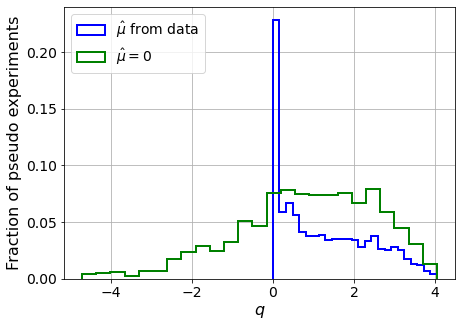

muhat mean:  0.14007510616397673
Z_bins:  1.0084862546280258
std Z_bins:  0.5525758456641936
Z_bins mu=0:  1.0043666193516587
std Z_bins mu=0:  0.8484551724681803

--------

B_expected:  643
S_expected:  10

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.406


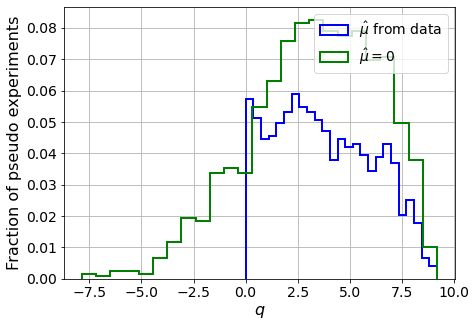

muhat mean:  0.07837985833298736
Z_bins:  1.8725944409926225
std Z_bins:  0.6260210639002406
Z_bins mu=0:  1.8665207566564037
std Z_bins mu=0:  0.8219976186091754

--------

B_expected:  643
S_expected:  19

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.4015


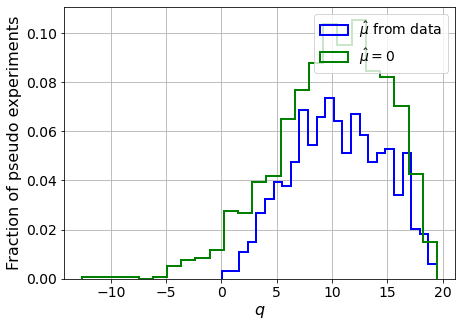

muhat mean:  0.047501559898953716
Z_bins:  3.232470564063824
std Z_bins:  0.6390446137878658
Z_bins mu=0:  3.228446020206187
std Z_bins mu=0:  0.7756930234568247

--------

B_expected:  643
S_expected:  37

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3985


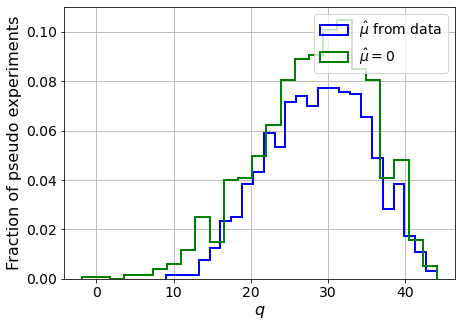

muhat mean:  0.023345849679847624
Z_bins:  5.385501258621795
std Z_bins:  0.604477308280695
Z_bins mu=0:  5.382469185498403
std Z_bins mu=0:  0.6811927197360784

--------

B_expected:  643
S_expected:  72

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.4015


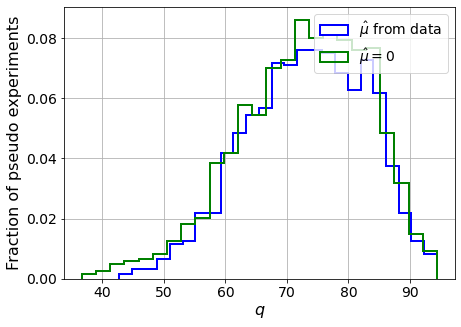

muhat mean:  0.008543745516853446
Z_bins:  8.5798310111687
std Z_bins:  0.5695337940944526
Z_bins mu=0:  8.57980976930215
std Z_bins mu=0:  0.6139985701260333

--------

B_expected:  643
S_expected:  139

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3945


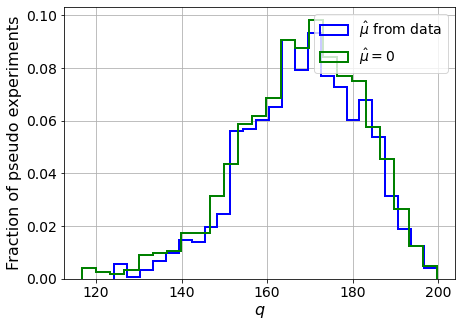

muhat mean:  0.0065423720397529556
Z_bins:  13.010507223091132
std Z_bins:  0.5250597536134928
Z_bins mu=0:  13.010487338909682
std Z_bins mu=0:  0.5573587853023435

--------

B_expected:  643
S_expected:  268

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.407


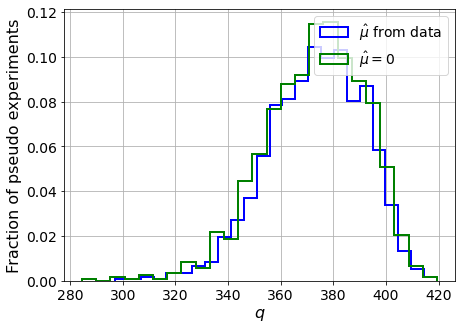

muhat mean:  0.0027723143271866204
Z_bins:  19.355094993751393
std Z_bins:  0.46926855309007226
Z_bins mu=0:  19.352293299019262
std Z_bins mu=0:  0.48986798374301155

--------

B_expected:  643
S_expected:  518

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.393


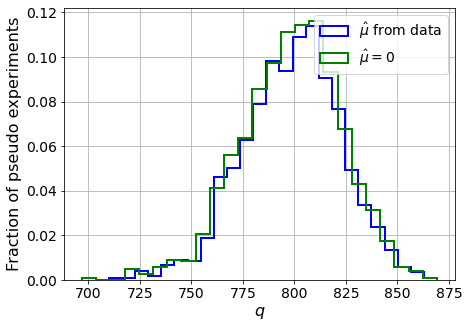

muhat mean:  0.0012776434216766701
Z_bins:  28.28597885931843
std Z_bins:  0.4154209084774342
Z_bins mu=0:  28.285356846103177
std Z_bins mu=0:  0.4274451047735409

--------

B_expected:  643
S_expected:  1001

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.391


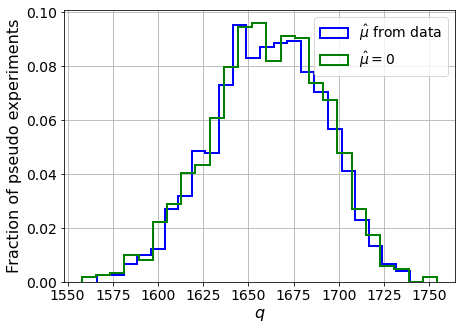

muhat mean:  0.0009466853107520887
Z_bins:  40.7499784502943
std Z_bins:  0.3776810875656854
Z_bins mu=0:  40.74662667467426
std Z_bins mu=0:  0.3862987637383773

--------

B_expected:  643
S_expected:  1932

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.411


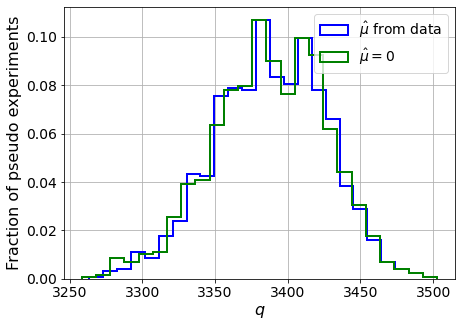

muhat mean:  0.000386602396759783
Z_bins:  58.20966182646294
std Z_bins:  0.32862163355279606
Z_bins mu=0:  58.2088502026154
std Z_bins mu=0:  0.33397745140267654

--------

B_expected:  643
S_expected:  3730

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.405


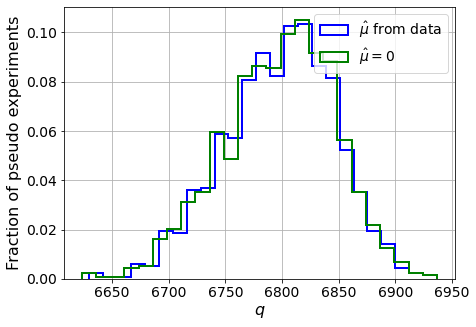

muhat mean:  0.00024906615911696677
Z_bins:  82.47631614417585
std Z_bins:  0.2937982317959024
Z_bins mu=0:  82.47562699241969
std Z_bins mu=0:  0.2978768158669703

--------

B_expected:  643
S_expected:  7201

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3995


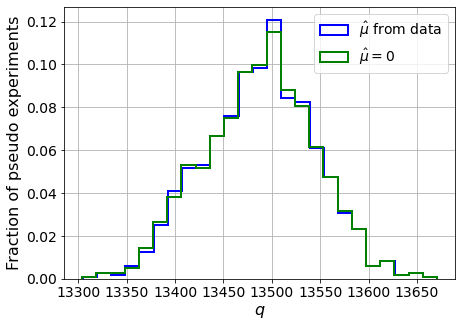

muhat mean:  0.00012793298882526324
Z_bins:  116.14777009004175
std Z_bins:  0.24348946030999646
Z_bins mu=0:  116.14491196218665
std Z_bins mu=0:  0.24560146030091695

--------

B_expected:  643
S_expected:  13904

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.381


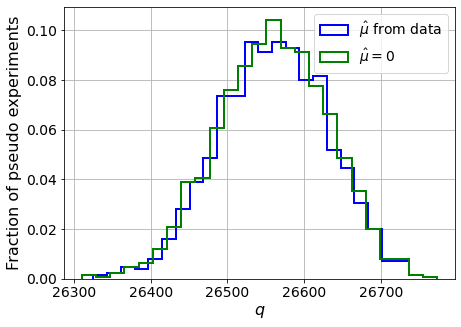

muhat mean:  5.4094384105699904e-05
Z_bins:  162.97639046564328
std Z_bins:  0.21912780284332586
Z_bins mu=0:  162.9760500420564
std Z_bins mu=0:  0.220662951472064

--------


 FINAL RESULT:

[[0.13469229706767966, 0.7353480817691463, 0.7680479687338626, 0.0829970063977891, 2.477386640265933], [0.5894319210701906, 0.540373947392278, 0.2831434135720854, 0.581009338144186, 0.9845675290297883], [1.0084862546280258, 0.5525758456641936, 0.14007510616397673, 1.0043666193516587, 0.8484551724681803], [1.8725944409926225, 0.6260210639002406, 0.07837985833298736, 1.8665207566564037, 0.8219976186091754], [3.232470564063824, 0.6390446137878658, 0.047501559898953716, 3.228446020206187, 0.7756930234568247], [5.385501258621795, 0.604477308280695, 0.023345849679847624, 5.382469185498403, 0.6811927197360784], [8.5798310111687, 0.5695337940944526, 0.008543745516853446, 8.57980976930215, 0.6139985701260333], [13.010507223091132, 0.5250597536134928, 0.0065423720397529556, 13.010487338909682, 0.5573587853

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 353.91631977 302.42018616 246.03541862
 188.49234774 124.02603688  54.23605743 -19.1374406  -92.99922521]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 244.94545116 217.06084836 179.80967103
 133

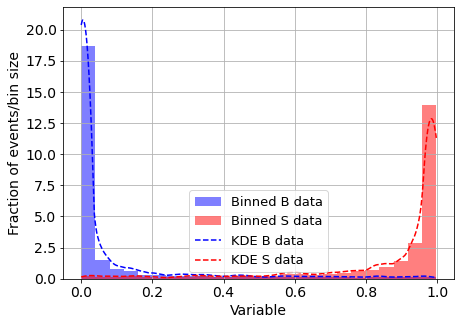

KDE Kernel:  epanechnikov
Background bandwidth:  0.03613222756796251
Signal bandwidth:  0.03613222756796251
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



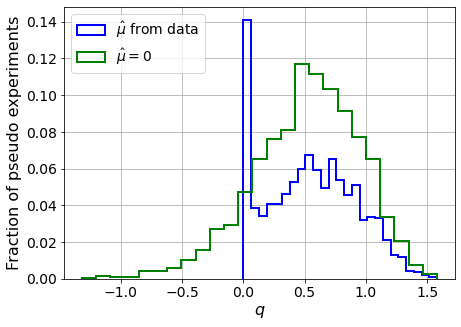

muhat mean:  -6.372029055315087
Z_bins:  0.7430992361883884
std Z_bins:  0.2474967572406417
Z_bins mu=0:  0.7430992361883884
std Z_bins mu=0:  0.29071735432045787

--------

B_expected:  643
S_expected:  3



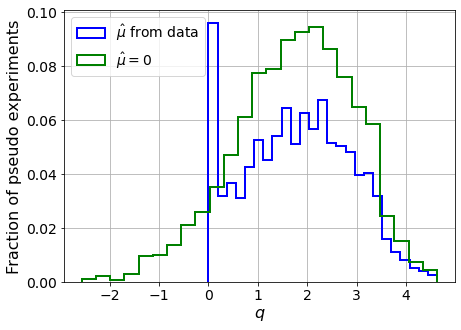

muhat mean:  -2.116669704527599
Z_bins:  1.3527976281515912
std Z_bins:  0.39739347483376875
Z_bins mu=0:  1.3527976281515912
std Z_bins mu=0:  0.4418624918397263

--------

B_expected:  643
S_expected:  5



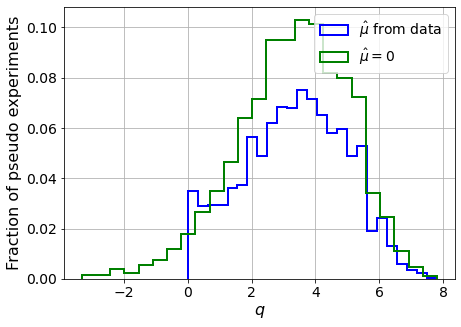

muhat mean:  -1.2846295647339208
Z_bins:  1.8512069228434553
std Z_bins:  0.4383384292107492
Z_bins mu=0:  1.8512069228434553
std Z_bins mu=0:  0.4721898912800014

--------

B_expected:  643
S_expected:  10



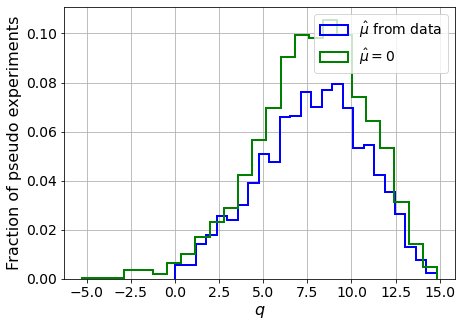

muhat mean:  -0.6008376385798437
Z_bins:  2.8314611336464797
std Z_bins:  0.5224704116742142
Z_bins mu=0:  2.8314611336464797
std Z_bins mu=0:  0.5495907383000868

--------

B_expected:  643
S_expected:  19



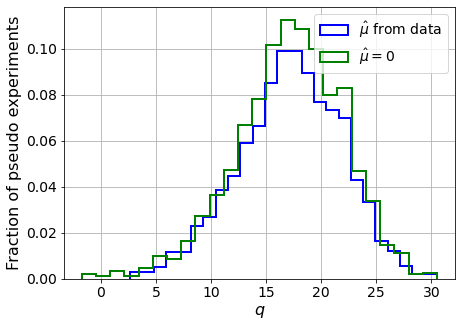

muhat mean:  -0.3209508266492845
Z_bins:  4.1733353858667375
std Z_bins:  0.5603772485590753
Z_bins mu=0:  4.1733353858667375
std Z_bins mu=0:  0.5811994298200412

--------

B_expected:  643
S_expected:  37



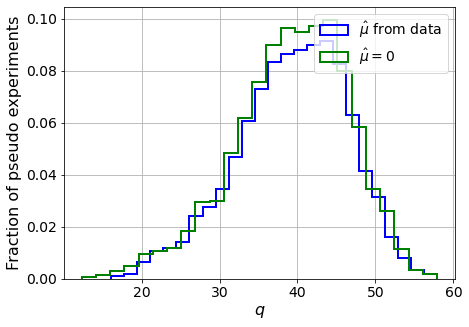

muhat mean:  -0.15536316203924083
Z_bins:  6.306311692093767
std Z_bins:  0.5649104888272639
Z_bins mu=0:  6.306311692093767
std Z_bins mu=0:  0.5784244426656485

--------

B_expected:  643
S_expected:  72



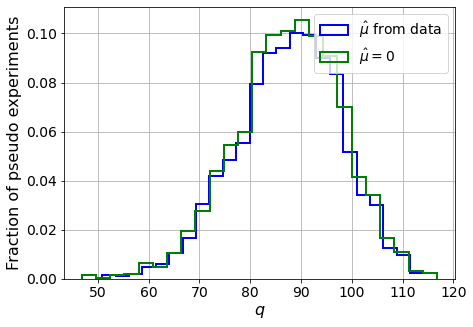

muhat mean:  -0.08015742784215386
Z_bins:  9.392805140262087
std Z_bins:  0.5499542269912321
Z_bins mu=0:  9.392805140262087
std Z_bins mu=0:  0.5584816174039959

--------

B_expected:  643
S_expected:  139



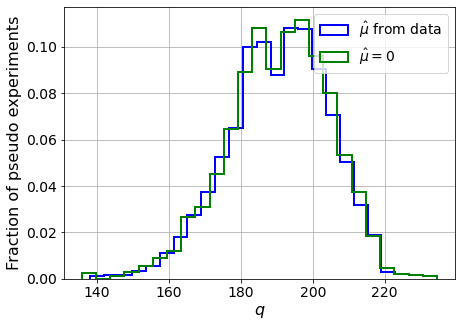

muhat mean:  -0.04338775837958865
Z_bins:  13.83943409439915
std Z_bins:  0.5048045906530395
Z_bins mu=0:  13.83943409439915
std Z_bins mu=0:  0.5097167493664704

--------

B_expected:  643
S_expected:  268



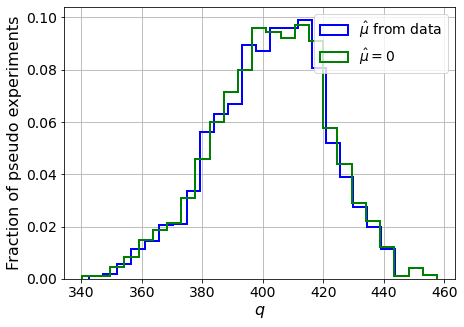

muhat mean:  -0.02194081007080547
Z_bins:  20.093500713822323
std Z_bins:  0.46677823787760847
Z_bins mu=0:  20.093500713822323
std Z_bins mu=0:  0.46960959751427644

--------

B_expected:  643
S_expected:  518



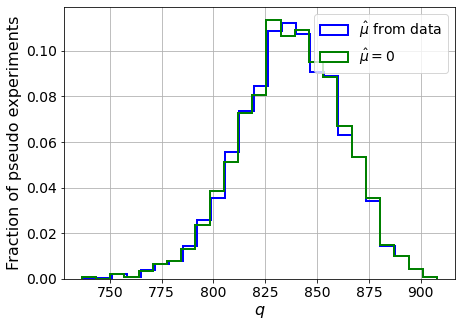

muhat mean:  -0.011130979575309383
Z_bins:  28.945895969829756
std Z_bins:  0.42437237731238053
Z_bins mu=0:  28.945895969829756
std Z_bins mu=0:  0.4264886257859192

--------

B_expected:  643
S_expected:  1001



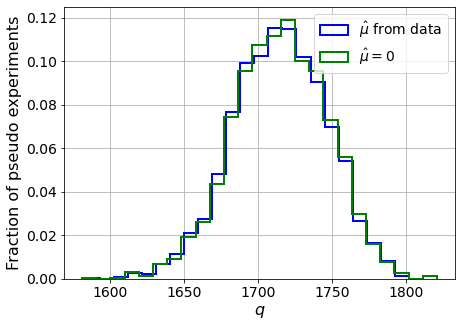

muhat mean:  -0.006491166576142365
Z_bins:  41.41653756986849
std Z_bins:  0.38317462947280595
Z_bins mu=0:  41.41612262323796
std Z_bins mu=0:  0.3843971465678344

--------

B_expected:  643
S_expected:  1932



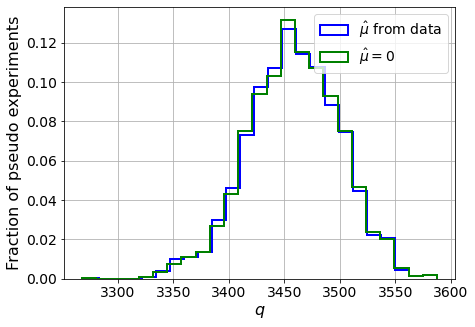

muhat mean:  -0.00294021079485047
Z_bins:  58.809607019327366
std Z_bins:  0.35296955195525903
Z_bins mu=0:  58.8094574344709
std Z_bins mu=0:  0.35399462170789786

--------

B_expected:  643
S_expected:  3730



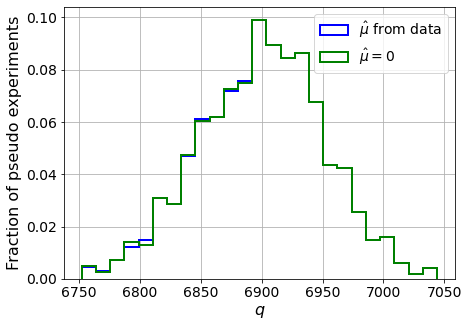

muhat mean:  -0.0015136661752075057
Z_bins:  83.07698298552282
std Z_bins:  0.30602007840482226
Z_bins mu=0:  83.07651438483701
std Z_bins mu=0:  0.30650700235293193

--------

B_expected:  643
S_expected:  7201



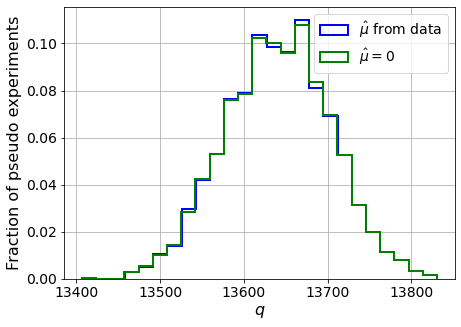

muhat mean:  -0.000780025009865826
Z_bins:  116.80014603975897
std Z_bins:  0.27000710201927086
Z_bins mu=0:  116.80005467291528
std Z_bins mu=0:  0.2702714471504429

--------

B_expected:  643
S_expected:  13904



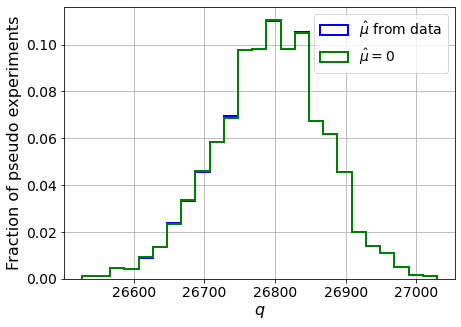

muhat mean:  -0.00043465339210893485
Z_bins:  163.68942565769723
std Z_bins:  0.23261502931403308
Z_bins mu=0:  163.68942565769723
std Z_bins mu=0:  0.2328671916282962

--------


 FINAL RESULT:

[[0.7430992361883884, 0.2474967572406417, -6.372029055315087, 0.7430992361883884, 0.29071735432045787], [1.3527976281515912, 0.39739347483376875, -2.116669704527599, 1.3527976281515912, 0.4418624918397263], [1.8512069228434553, 0.4383384292107492, -1.2846295647339208, 1.8512069228434553, 0.4721898912800014], [2.8314611336464797, 0.5224704116742142, -0.6008376385798437, 2.8314611336464797, 0.5495907383000868], [4.1733353858667375, 0.5603772485590753, -0.3209508266492845, 4.1733353858667375, 0.5811994298200412], [6.306311692093767, 0.5649104888272639, -0.15536316203924083, 6.306311692093767, 0.5784244426656485], [9.392805140262087, 0.5499542269912321, -0.08015742784215386, 9.392805140262087, 0.5584816174039959], [13.83943409439915, 0.5048045906530395, -0.04338775837958865, 13.83943409439915, 0.5

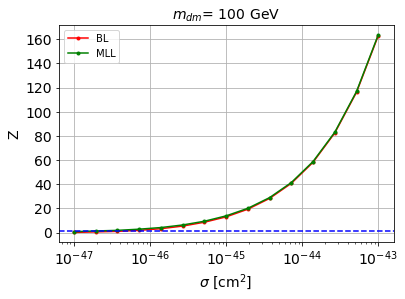


cross_BL_164:  6.430933630254586e-47
cross_BL_164_up:  3.9398933482334076e-47
cross_BL_164_down:  8.721723825646783e-47

cross_MLL_164:  2.820679306369085e-47
cross_MLL_164_up:  1.687882893073422e-47
cross_MLL_164_down:  4.403985000050499e-47

#########################


#########################

mDM =  200 GeV


S_cs1.shape:  (34573,)
S_cs2.shape:  (34573,)
 NUM_DAT:  31737 

NUM_DAT_ER:  31333
NUM_DAT_AC:  111
NUM_DAT_CNNS:  1
NUM_DAT_RN:  29
NUM_DAT_WALL:  263

B_cs1cs2.shape:  (31737, 2)

S_cs1cs2.shape:  (31737, 2)


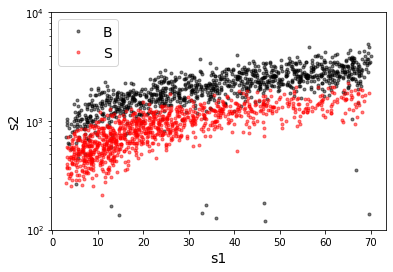

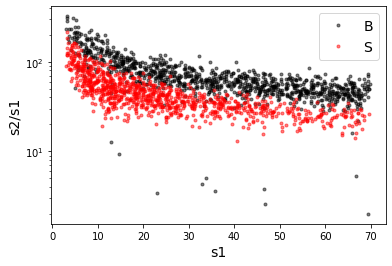

X_mon_B.shape:  (31737, 2)
X_mon_S.shape:  (31737, 2)
X_mon.shape:  (63474, 2)

X_mon_train :  (40464, 2)
y_mon_train :  (40464,)
X_mon_val :  (7141, 2)
y_mon_val :  (7141,)
X_mon_test :  (15869, 2)
y_mon_test :  (15869,)

Classification score:


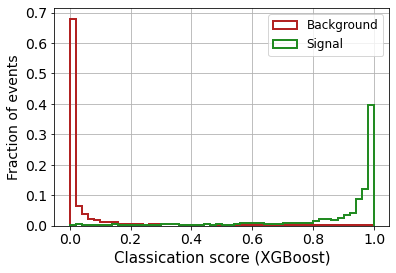


 ROC-AUC =  0.9776986430717676
At least 5 B events per bin, range = [[0, 1]]:
# bins:  13 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  13
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3735


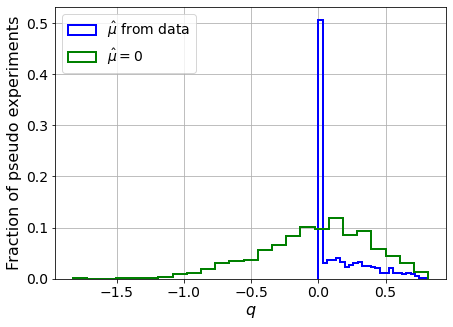

muhat mean:  0.684016836404387
Z_bins:  0.1620184256418637
std Z_bins:  0.6249168061245345
Z_bins mu=0:  0.14986051596679517
std Z_bins mu=0:  1.351081952626816

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3735


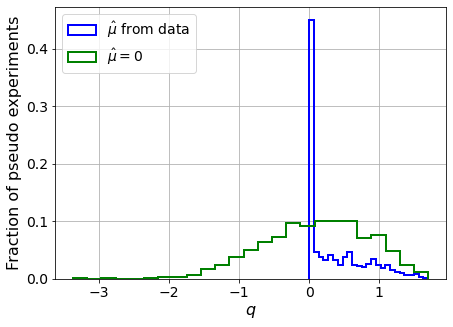

muhat mean:  0.26178282541445136
Z_bins:  0.3746746493206678
std Z_bins:  0.5690981708544259
Z_bins mu=0:  0.36888939264942094
std Z_bins mu=0:  1.0105245142213375

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.377


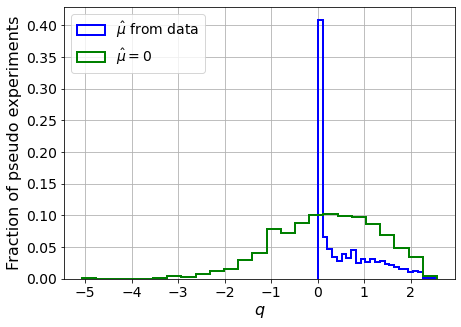

muhat mean:  0.25001636987908804
Z_bins:  0.5050572955351195
std Z_bins:  0.6411683796380541
Z_bins mu=0:  0.48569574486241535
std Z_bins mu=0:  1.1275477576895878

--------

B_expected:  643
S_expected:  6

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.379


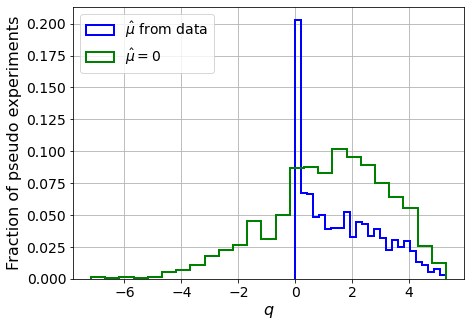

muhat mean:  0.09128364902942564
Z_bins:  1.1887576741273018
std Z_bins:  0.5837382692681351
Z_bins mu=0:  1.1887441561140693
std Z_bins mu=0:  0.8710749139807729

--------

B_expected:  643
S_expected:  11

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3705


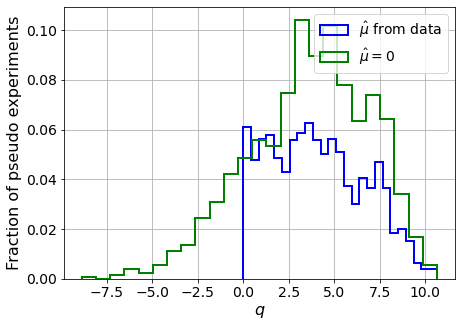

muhat mean:  0.06285887202775439
Z_bins:  1.9775166593122326
std Z_bins:  0.646548799212606
Z_bins mu=0:  1.973805446768789
std Z_bins mu=0:  0.8352338533560882

--------

B_expected:  643
S_expected:  21

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.38


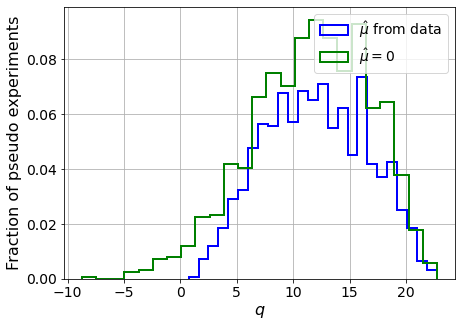

muhat mean:  0.016445480626869357
Z_bins:  3.4508821778832623
std Z_bins:  0.6587113290878022
Z_bins mu=0:  3.450105722481661
std Z_bins mu=0:  0.758012560135342

--------

B_expected:  643
S_expected:  41

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3885


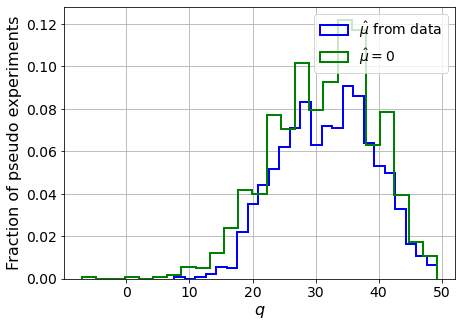

muhat mean:  0.014397829965196257
Z_bins:  5.680327150177098
std Z_bins:  0.6411572355506262
Z_bins mu=0:  5.680327150177098
std Z_bins mu=0:  0.7082034447498995

--------

B_expected:  643
S_expected:  79

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3775


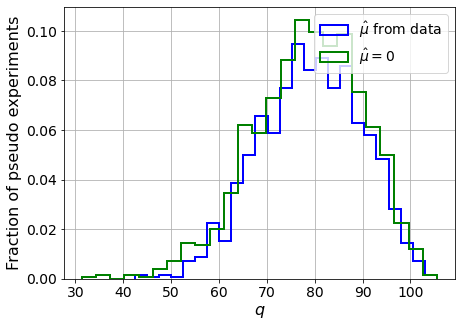

muhat mean:  0.007866184206593987
Z_bins:  8.914441288069908
std Z_bins:  0.5902519333136972
Z_bins mu=0:  8.914441288069908
std Z_bins mu=0:  0.6341589317894433

--------

B_expected:  643
S_expected:  152

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.354


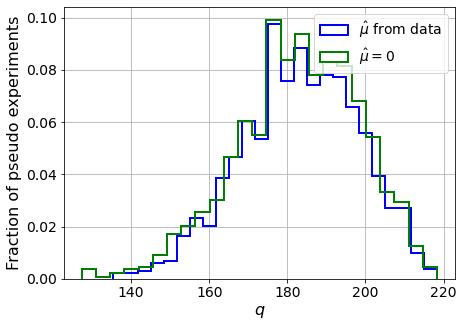

muhat mean:  0.00507746938144922
Z_bins:  13.542083023801897
std Z_bins:  0.5519585910315564
Z_bins mu=0:  13.537113941893852
std Z_bins mu=0:  0.5822731580652496

--------

B_expected:  643
S_expected:  294

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3815


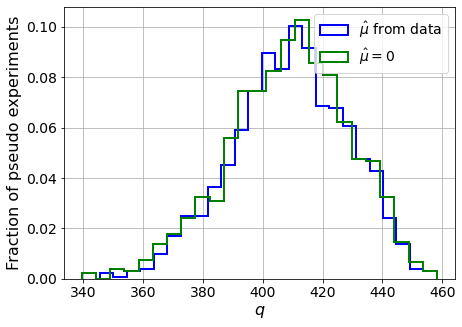

muhat mean:  0.0020435911614976278
Z_bins:  20.245120433007017
std Z_bins:  0.47669059588940255
Z_bins mu=0:  20.243610597342684
std Z_bins mu=0:  0.49341634699083625

--------

B_expected:  643
S_expected:  567

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.363


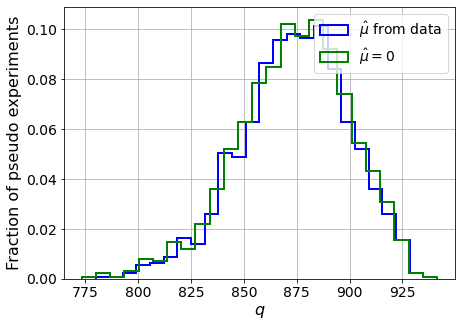

muhat mean:  0.0013149668857952899
Z_bins:  29.588227191592765
std Z_bins:  0.4320865885061121
Z_bins mu=0:  29.586164150743215
std Z_bins mu=0:  0.4457628714581773

--------

B_expected:  643
S_expected:  1094

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.372


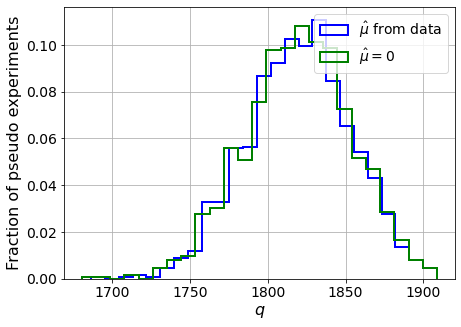

muhat mean:  0.0005972827534014546
Z_bins:  42.6744446053415
std Z_bins:  0.3913613363655274
Z_bins mu=0:  42.67163223399548
std Z_bins mu=0:  0.39924410277595407

--------

B_expected:  643
S_expected:  2113

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.362


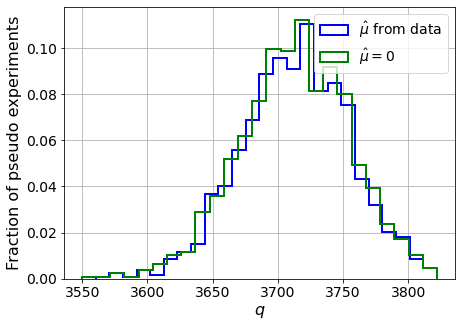

muhat mean:  0.0003067394798972952
Z_bins:  60.947952020352325
std Z_bins:  0.3403472693959672
Z_bins mu=0:  60.946175020955565
std Z_bins mu=0:  0.3458129124083441

--------

B_expected:  643
S_expected:  4079

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.372


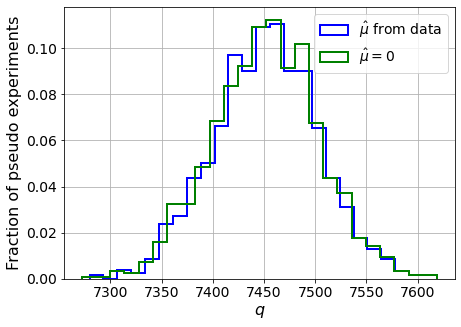

muhat mean:  0.0002028626912449852
Z_bins:  86.32993153322207
std Z_bins:  0.293368342472436
Z_bins mu=0:  86.32856777577456
std Z_bins mu=0:  0.2966890430144015

--------

B_expected:  643
S_expected:  7876

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3745


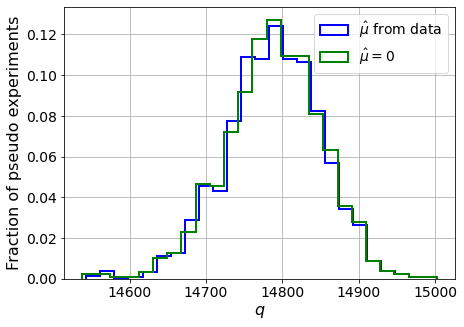

muhat mean:  7.831529365833208e-05
Z_bins:  121.61274165890815
std Z_bins:  0.2574772563686249
Z_bins mu=0:  121.61039231065747
std Z_bins mu=0:  0.2597457043398531

--------


 FINAL RESULT:

[[0.1620184256418637, 0.6249168061245345, 0.684016836404387, 0.14986051596679517, 1.351081952626816], [0.3746746493206678, 0.5690981708544259, 0.26178282541445136, 0.36888939264942094, 1.0105245142213375], [0.5050572955351195, 0.6411683796380541, 0.25001636987908804, 0.48569574486241535, 1.1275477576895878], [1.1887576741273018, 0.5837382692681351, 0.09128364902942564, 1.1887441561140693, 0.8710749139807729], [1.9775166593122326, 0.646548799212606, 0.06285887202775439, 1.973805446768789, 0.8352338533560882], [3.4508821778832623, 0.6587113290878022, 0.016445480626869357, 3.450105722481661, 0.758012560135342], [5.680327150177098, 0.6411572355506262, 0.014397829965196257, 5.680327150177098, 0.7082034447498995], [8.914441288069908, 0.5902519333136972, 0.007866184206593987, 8.914441288069908, 0.634158

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 367.63565445 324.60666789 277.38422603 225.80970854
 169.07663812 106.36262632  39.20243414 -29.62044324 -96.82164997]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
 253.15939949 240.33244569 219.24286055 195.23824612 161.69765907
 122

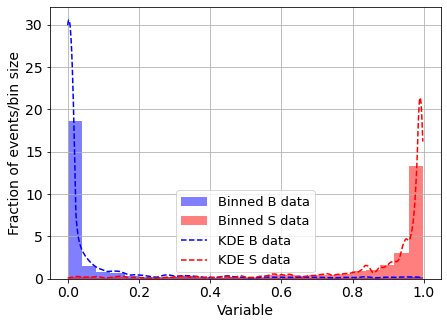

KDE Kernel:  epanechnikov
Background bandwidth:  0.022117541055781564
Signal bandwidth:  0.013538761800225447
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


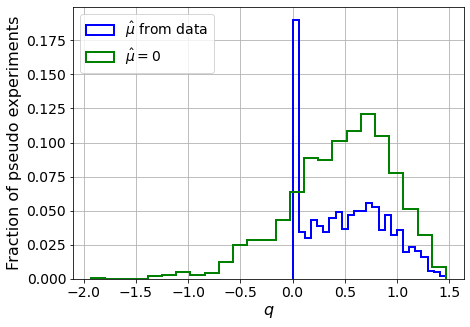

muhat mean:  -6.690748848665793
Z_bins:  0.726762984961041
std Z_bins:  0.2646824159002473
Z_bins mu=0:  0.726762984961041
std Z_bins mu=0:  0.3384610401192045

--------

B_expected:  643
S_expected:  2



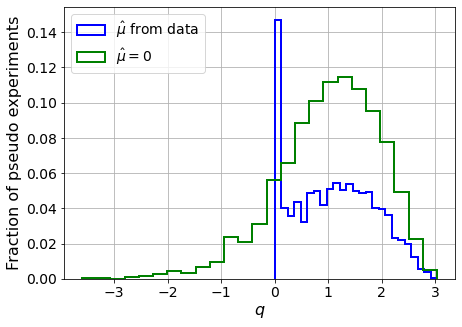

muhat mean:  -3.6057072162522683
Z_bins:  1.0576219663752944
std Z_bins:  0.35944664943530186
Z_bins mu=0:  1.0576219663752944
std Z_bins mu=0:  0.4442706776998317

--------

B_expected:  643
S_expected:  3



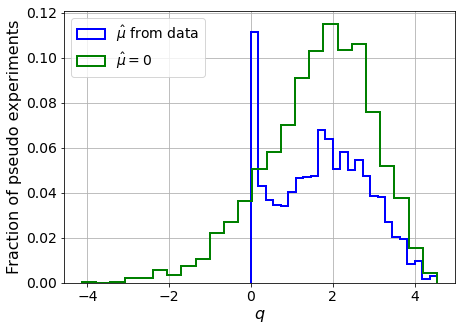

muhat mean:  -2.212520251259462
Z_bins:  1.3388866839551712
std Z_bins:  0.4124857852253883
Z_bins mu=0:  1.3388866839551712
std Z_bins mu=0:  0.4877033212906374

--------

B_expected:  643
S_expected:  6



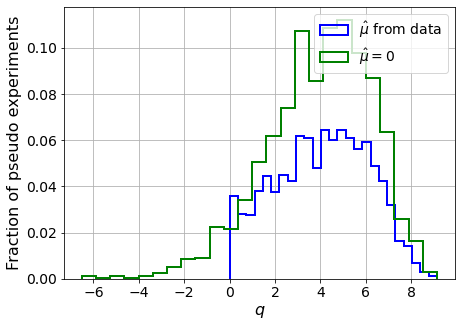

muhat mean:  -1.106105533915424
Z_bins:  2.046612633683527
std Z_bins:  0.49910026933825524
Z_bins mu=0:  2.046612633683527
std Z_bins mu=0:  0.5622892509167904

--------

B_expected:  643
S_expected:  11



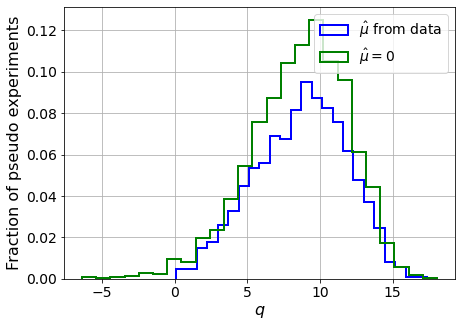

muhat mean:  -0.6095758727285379
Z_bins:  2.9902743960687013
std Z_bins:  0.5240472502390526
Z_bins mu=0:  2.9902743960687013
std Z_bins mu=0:  0.5626925050366431

--------

B_expected:  643
S_expected:  21



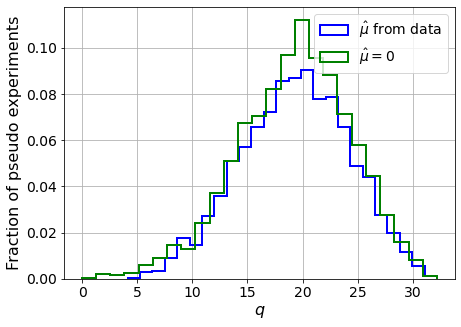

muhat mean:  -0.29487750603446616
Z_bins:  4.426552746625038
std Z_bins:  0.554443558856732
Z_bins mu=0:  4.426552746625038
std Z_bins mu=0:  0.579760029597261

--------

B_expected:  643
S_expected:  41



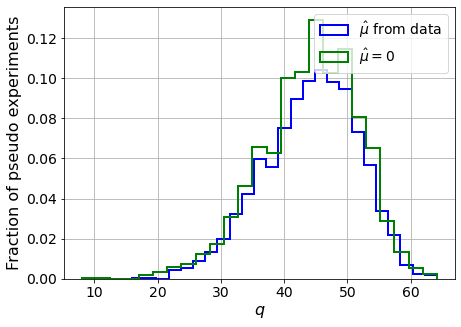

muhat mean:  -0.16857795754023855
Z_bins:  6.690806751536288
std Z_bins:  0.5572845920357745
Z_bins mu=0:  6.6905990914632625
std Z_bins mu=0:  0.5772392933718083

--------

B_expected:  643
S_expected:  79



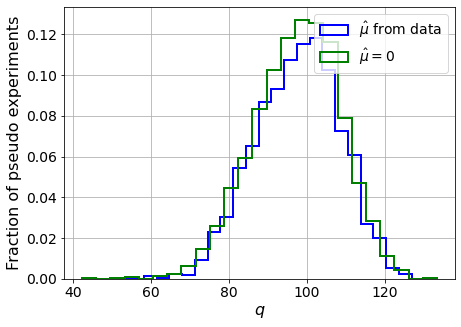

muhat mean:  -0.09430610893694251
Z_bins:  9.902796542817486
std Z_bins:  0.5477040802559159
Z_bins mu=0:  9.902796542817486
std Z_bins mu=0:  0.560251939855976

--------

B_expected:  643
S_expected:  152



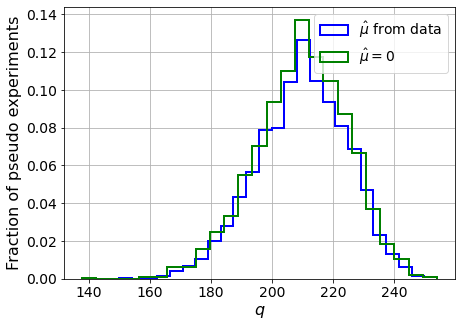

muhat mean:  -0.0473422470517993
Z_bins:  14.5000109735353
std Z_bins:  0.5093934768824012
Z_bins mu=0:  14.498552575178826
std Z_bins mu=0:  0.5170827080889013

--------

B_expected:  643
S_expected:  294



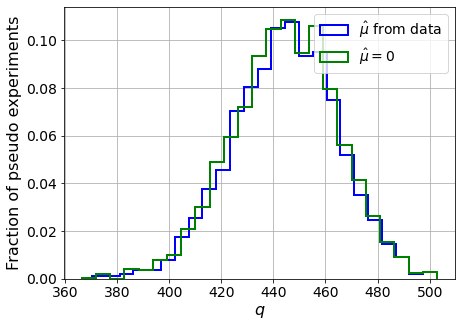

muhat mean:  -0.024003492318389802
Z_bins:  21.09390288448207
std Z_bins:  0.4752771984676264
Z_bins mu=0:  21.092364037955573
std Z_bins mu=0:  0.4799147115258805

--------

B_expected:  643
S_expected:  567



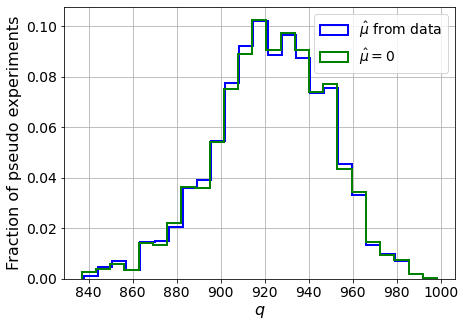

muhat mean:  -0.011732038671593132
Z_bins:  30.40252742547164
std Z_bins:  0.4232343337317354
Z_bins mu=0:  30.40140616274896
std Z_bins mu=0:  0.4261324795151423

--------

B_expected:  643
S_expected:  1094



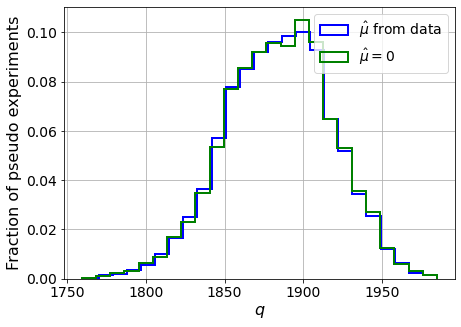

muhat mean:  -0.0061337891255757926
Z_bins:  43.424062933559306
std Z_bins:  0.3896538178764873
Z_bins mu=0:  43.42346313932198
std Z_bins mu=0:  0.3916472463872422

--------

B_expected:  643
S_expected:  2113



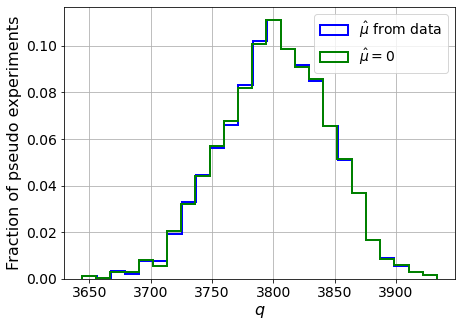

muhat mean:  -0.0034398171921598128
Z_bins:  61.66485602445626
std Z_bins:  0.3524207874802559
Z_bins mu=0:  61.66463751578086
std Z_bins mu=0:  0.35382789587772984

--------

B_expected:  643
S_expected:  4079



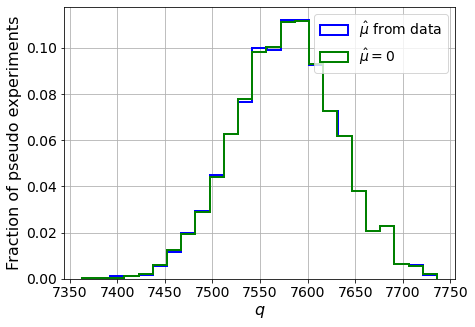

muhat mean:  -0.001801343383785749
Z_bins:  87.05638992689181
std Z_bins:  0.30812134687309223
Z_bins mu=0:  87.05638992689181
std Z_bins mu=0:  0.30894807964910587

--------

B_expected:  643
S_expected:  7876



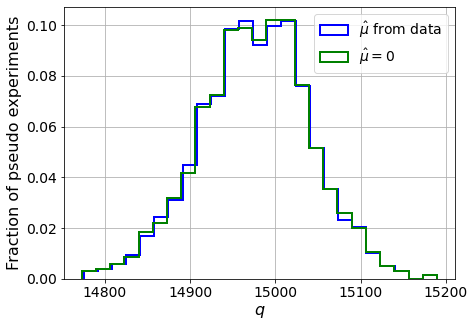

muhat mean:  -0.0008912177596468509
Z_bins:  122.38359363135186
std Z_bins:  0.2639942893063992
Z_bins mu=0:  122.38306457606004
std Z_bins mu=0:  0.26451699638952636

--------


 FINAL RESULT:

[[0.726762984961041, 0.2646824159002473, -6.690748848665793, 0.726762984961041, 0.3384610401192045], [1.0576219663752944, 0.35944664943530186, -3.6057072162522683, 1.0576219663752944, 0.4442706776998317], [1.3388866839551712, 0.4124857852253883, -2.212520251259462, 1.3388866839551712, 0.4877033212906374], [2.046612633683527, 0.49910026933825524, -1.106105533915424, 2.046612633683527, 0.5622892509167904], [2.9902743960687013, 0.5240472502390526, -0.6095758727285379, 2.9902743960687013, 0.5626925050366431], [4.426552746625038, 0.554443558856732, -0.29487750603446616, 4.426552746625038, 0.579760029597261], [6.690806751536288, 0.5572845920357745, -0.16857795754023855, 6.6905990914632625, 0.5772392933718083], [9.902796542817486, 0.5477040802559159, -0.09430610893694251, 9.902796542817486, 0.56025193

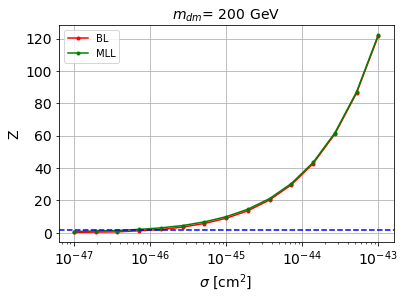


cross_BL_164:  1.0485703587977675e-46
cross_BL_164_up:  6.49663533717186e-47
cross_BL_164_down:  1.5969205540121762e-46

cross_MLL_164:  4.931627668759744e-47
cross_MLL_164_up:  3.399141876164685e-47
cross_MLL_164_down:  7.689638201462867e-47

#########################


#########################

mDM =  500 GeV


S_cs1.shape:  (35477,)
S_cs2.shape:  (35477,)
 NUM_DAT:  32117 

NUM_DAT_ER:  31709
NUM_DAT_AC:  112
NUM_DAT_CNNS:  1
NUM_DAT_RN:  29
NUM_DAT_WALL:  266

B_cs1cs2.shape:  (32117, 2)

S_cs1cs2.shape:  (32117, 2)


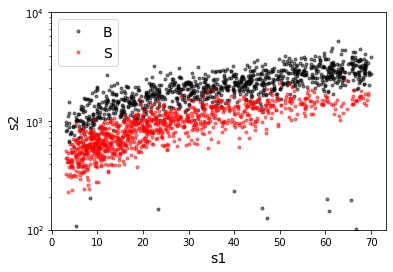

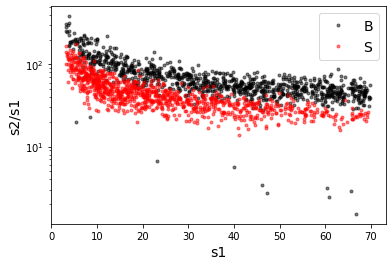

X_mon_B.shape:  (32117, 2)
X_mon_S.shape:  (32117, 2)
X_mon.shape:  (64234, 2)

X_mon_train :  (40948, 2)
y_mon_train :  (40948,)
X_mon_val :  (7227, 2)
y_mon_val :  (7227,)
X_mon_test :  (16059, 2)
y_mon_test :  (16059,)

Classification score:


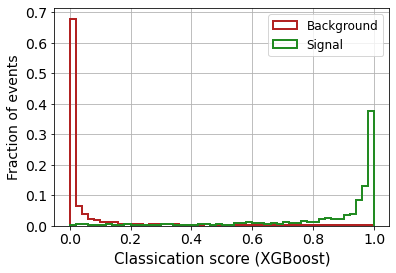


 ROC-AUC =  0.9770096366864779
At least 5 B events per bin, range = [[0, 1]]:
# bins:  13 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  13
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.438


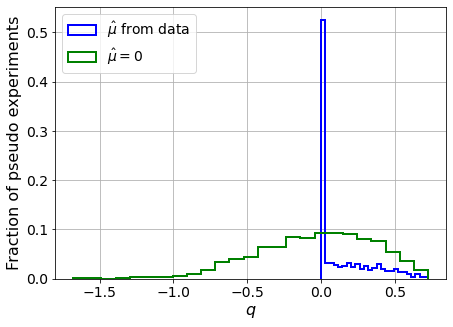

muhat mean:  0.8880419856957275
Z_bins:  0.103234684135645
std Z_bins:  0.914025954614643
Z_bins mu=0:  0.0552753695860951
std Z_bins mu=0:  3.551702002773753

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.425


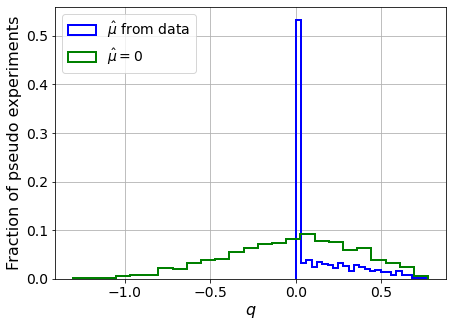

muhat mean:  0.8407265778077313
Z_bins:  0.08979001280220474
std Z_bins:  1.0565742964774618
Z_bins mu=0:  0.10033273130831895
std Z_bins mu=0:  1.8993121992851827

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.4555


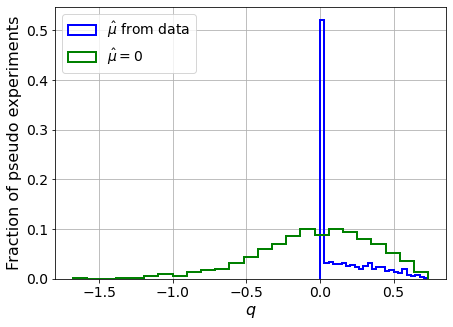

muhat mean:  0.7921812504472395
Z_bins:  0.11443369955530867
std Z_bins:  0.8238579672500357
Z_bins mu=0:  0.0581636381157029
std Z_bins mu=0:  3.3208245375414087

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.4535


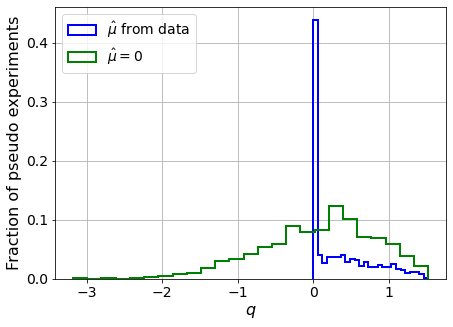

muhat mean:  0.29819469153122036
Z_bins:  0.4074414465959566
std Z_bins:  0.5049855213459848
Z_bins mu=0:  0.4066628895412116
std Z_bins mu=0:  0.9281600586028007

--------

B_expected:  643
S_expected:  5

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.441


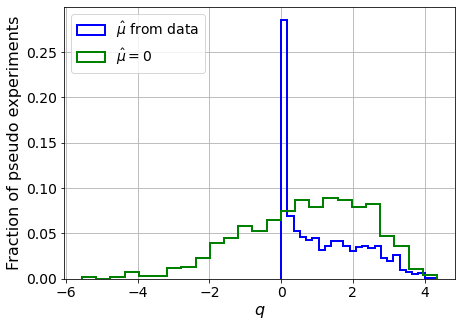

muhat mean:  0.15268106607974155
Z_bins:  0.9382163376261526
std Z_bins:  0.5839090789304492
Z_bins mu=0:  0.9347771152640626
std Z_bins mu=0:  0.9128831554094176

--------

B_expected:  643
S_expected:  9

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.4385


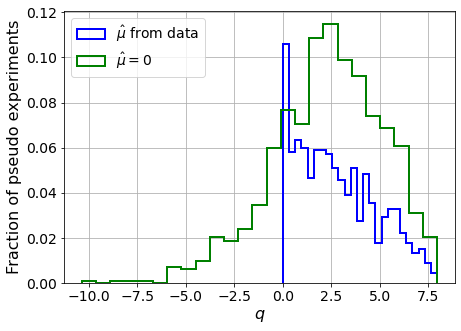

muhat mean:  0.09637540028862522
Z_bins:  1.5850707545569351
std Z_bins:  0.6435201452226319
Z_bins mu=0:  1.5798046617633037
std Z_bins mu=0:  0.8912613105553365

--------

B_expected:  643
S_expected:  17

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.446


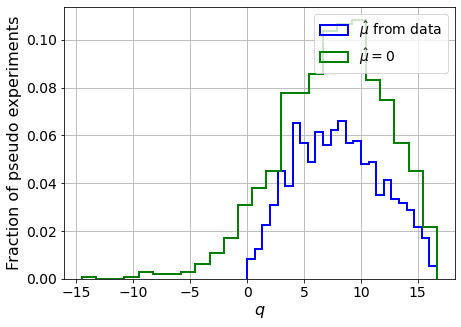

muhat mean:  0.04932658827399131
Z_bins:  2.812001649795984
std Z_bins:  0.6754334382628981
Z_bins mu=0:  2.8110950402716
std Z_bins mu=0:  0.8309121488529103

--------

B_expected:  643
S_expected:  33

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.434


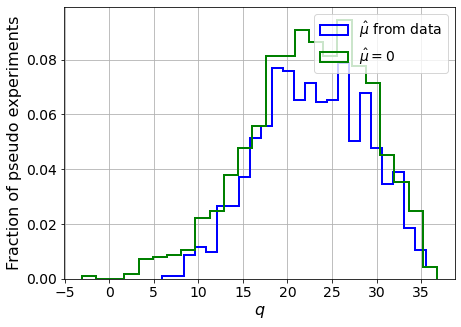

muhat mean:  0.01802671752227936
Z_bins:  4.7761914708945294
std Z_bins:  0.6226125162534035
Z_bins mu=0:  4.775519711179483
std Z_bins mu=0:  0.6958190704513231

--------

B_expected:  643
S_expected:  64

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.433


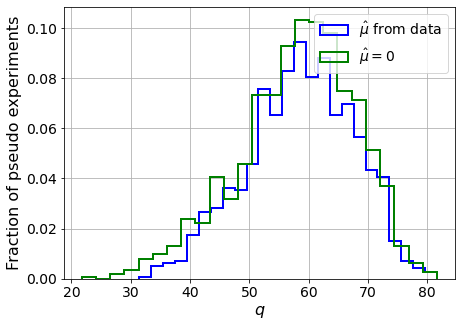

muhat mean:  0.012142792923843442
Z_bins:  7.678669633795449
std Z_bins:  0.5845049823773494
Z_bins mu=0:  7.6780326095298665
std Z_bins mu=0:  0.6358834949870216

--------

B_expected:  643
S_expected:  124

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.4395


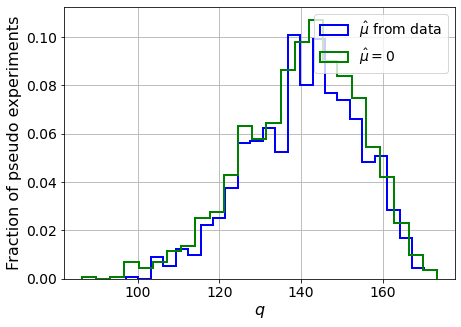

muhat mean:  0.0059520314670927265
Z_bins:  11.901225311086103
std Z_bins:  0.5653215553919594
Z_bins mu=0:  11.899555931812007
std Z_bins mu=0:  0.6000524380318373

--------

B_expected:  643
S_expected:  239

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.4455


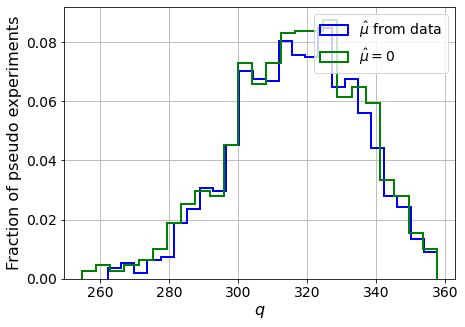

muhat mean:  0.0037747091329934693
Z_bins:  17.8350409755219
std Z_bins:  0.5022572527553376
Z_bins mu=0:  17.833658563626
std Z_bins mu=0:  0.5253612632494697

--------

B_expected:  643
S_expected:  462

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.434


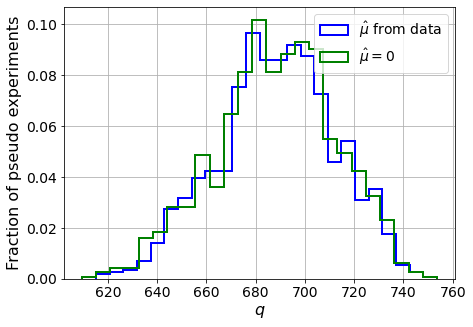

muhat mean:  0.002028803688831213
Z_bins:  26.25527293103407
std Z_bins:  0.45109881120921774
Z_bins mu=0:  26.25247138121597
std Z_bins mu=0:  0.46503618471717645

--------

B_expected:  643
S_expected:  892

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.4315


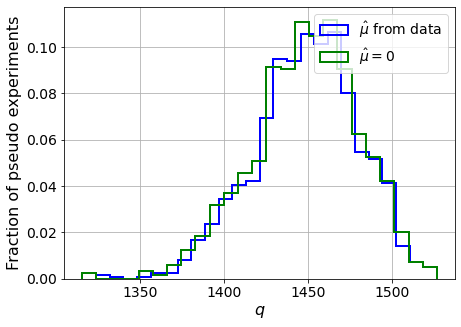

muhat mean:  0.0009246124113470339
Z_bins:  38.087903742201476
std Z_bins:  0.4057640329626837
Z_bins mu=0:  38.085410379087214
std Z_bins mu=0:  0.41591598972984306

--------

B_expected:  643
S_expected:  1723

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.435


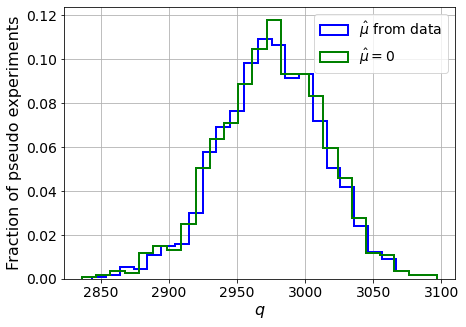

muhat mean:  0.0005471642177770992
Z_bins:  54.55279256496568
std Z_bins:  0.35144831825386336
Z_bins mu=0:  54.551285861859064
std Z_bins mu=0:  0.35767332769349663

--------

B_expected:  643
S_expected:  3326

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.438


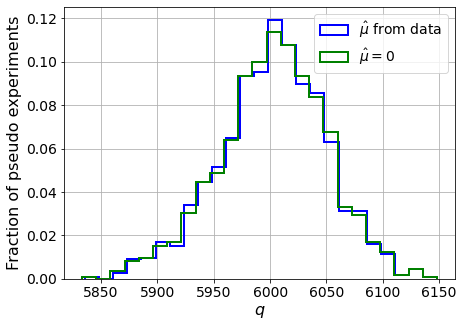

muhat mean:  0.0002332852285495446
Z_bins:  77.4876684426552
std Z_bins:  0.306574286295785
Z_bins mu=0:  77.48650559195825
std Z_bins mu=0:  0.3104102349486343

--------


 FINAL RESULT:

[[0.103234684135645, 0.914025954614643, 0.8880419856957275, 0.0552753695860951, 3.551702002773753], [0.08979001280220474, 1.0565742964774618, 0.8407265778077313, 0.10033273130831895, 1.8993121992851827], [0.11443369955530867, 0.8238579672500357, 0.7921812504472395, 0.0581636381157029, 3.3208245375414087], [0.4074414465959566, 0.5049855213459848, 0.29819469153122036, 0.4066628895412116, 0.9281600586028007], [0.9382163376261526, 0.5839090789304492, 0.15268106607974155, 0.9347771152640626, 0.9128831554094176], [1.5850707545569351, 0.6435201452226319, 0.09637540028862522, 1.5798046617633037, 0.8912613105553365], [2.812001649795984, 0.6754334382628981, 0.04932658827399131, 2.8110950402716, 0.8309121488529103], [4.7761914708945294, 0.6226125162534035, 0.01802671752227936, 4.775519711179483, 0.6958190704513

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 337.10028698 285.74209847 233.17249698
 175.53496895 109.44810786  41.42125584 -27.15357735 -95.76107777]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
          -inf  216.78575401  197.35208036  175.09520423  14

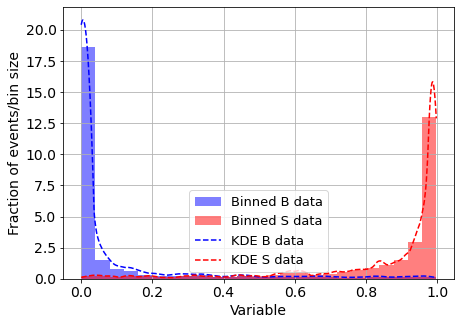

KDE Kernel:  epanechnikov
Background bandwidth:  0.03613222756796251
Signal bandwidth:  0.022117541055781564
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



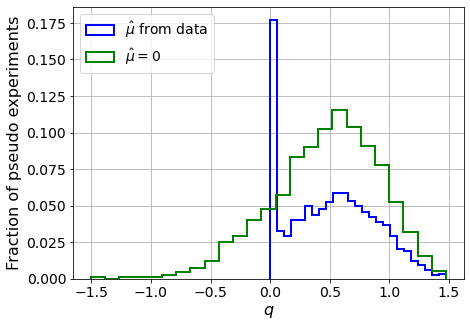

muhat mean:  -6.193470502685555
Z_bins:  0.7154597276421255
std Z_bins:  0.2562310756991136
Z_bins mu=0:  0.7154597276421255
std Z_bins mu=0:  0.3135131293769239

--------

B_expected:  643
S_expected:  1



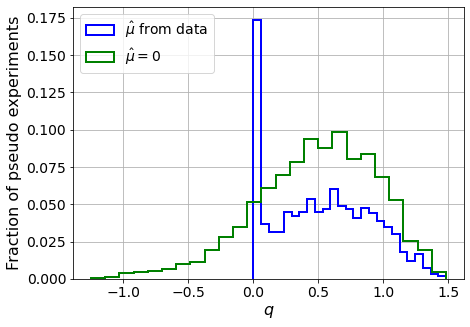

muhat mean:  -6.9649237238805215
Z_bins:  0.7274062310486827
std Z_bins:  0.2607035187314145
Z_bins mu=0:  0.7274062310486827
std Z_bins mu=0:  0.31697074628053173

--------

B_expected:  643
S_expected:  1



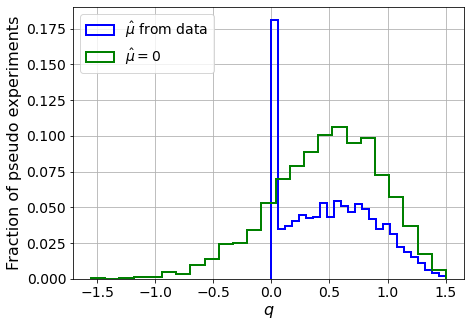

muhat mean:  -6.707630285682433
Z_bins:  0.7167098082053059
std Z_bins:  0.2662303129058612
Z_bins mu=0:  0.7167098082053059
std Z_bins mu=0:  0.3248310533197353

--------

B_expected:  643
S_expected:  2



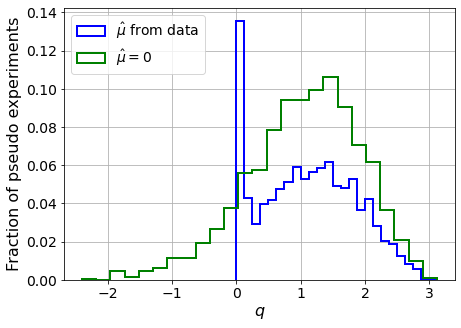

muhat mean:  -3.5821802301587358
Z_bins:  1.0598952386209675
std Z_bins:  0.3479794582337591
Z_bins mu=0:  1.0598952386209675
std Z_bins mu=0:  0.4101602316380755

--------

B_expected:  643
S_expected:  5



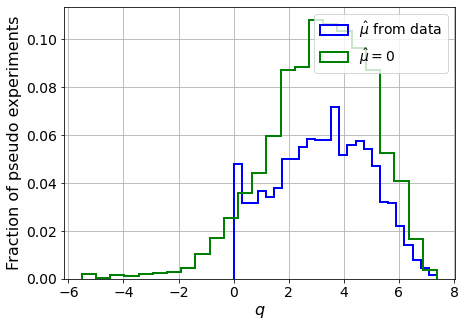

muhat mean:  -1.2840336988933339
Z_bins:  1.816954294260865
std Z_bins:  0.4661449800638993
Z_bins mu=0:  1.816954294260865
std Z_bins mu=0:  0.527266238501788

--------

B_expected:  643
S_expected:  9



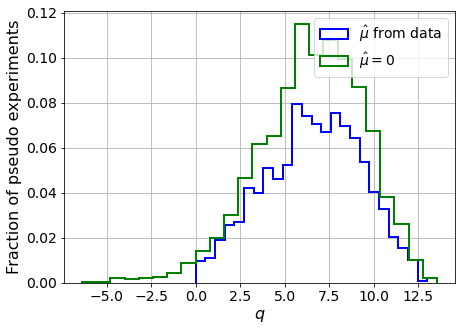

muhat mean:  -0.6634025232355627
Z_bins:  2.5901248735651836
std Z_bins:  0.523088497701696
Z_bins mu=0:  2.5901248735651836
std Z_bins mu=0:  0.5649341102245128

--------

B_expected:  643
S_expected:  17



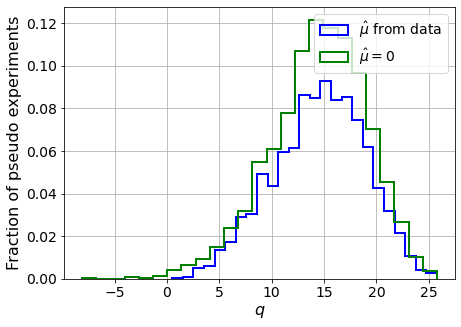

muhat mean:  -0.3580788934673964
Z_bins:  3.846571610693614
std Z_bins:  0.5688225017412257
Z_bins mu=0:  3.846571610693614
std Z_bins mu=0:  0.6005460378077369

--------

B_expected:  643
S_expected:  33



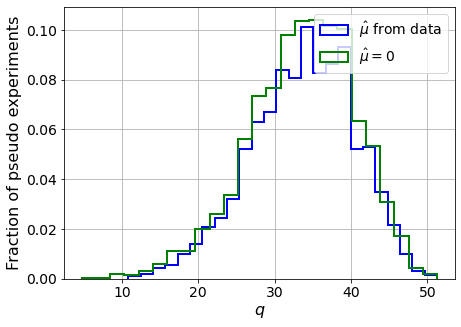

muhat mean:  -0.1997439730623009
Z_bins:  5.837563310958663
std Z_bins:  0.5795777608517562
Z_bins mu=0:  5.837563310958663
std Z_bins mu=0:  0.5985367810587705

--------

B_expected:  643
S_expected:  64



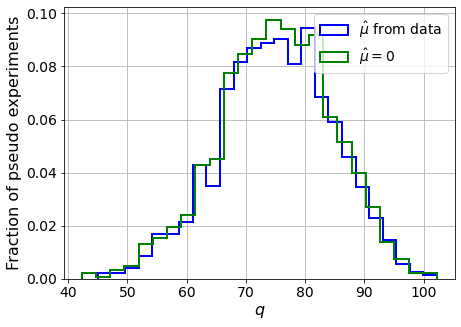

muhat mean:  -0.10090567240925233
Z_bins:  8.676892943609117
std Z_bins:  0.5496751023176193
Z_bins mu=0:  8.676892943609117
std Z_bins mu=0:  0.5588049661370559

--------

B_expected:  643
S_expected:  124



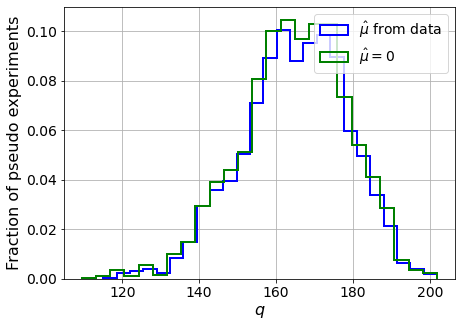

muhat mean:  -0.04946185043268389
Z_bins:  12.862850999834212
std Z_bins:  0.5321060012857042
Z_bins mu=0:  12.862850999834212
std Z_bins mu=0:  0.5406594536360146

--------

B_expected:  643
S_expected:  239



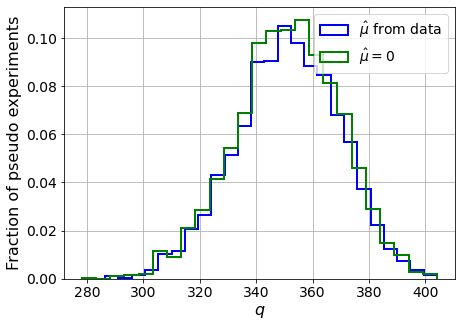

muhat mean:  -0.02509760929199432
Z_bins:  18.750182031811512
std Z_bins:  0.49007769562819675
Z_bins mu=0:  18.750182031811512
std Z_bins mu=0:  0.49440962012536854

--------

B_expected:  643
S_expected:  462



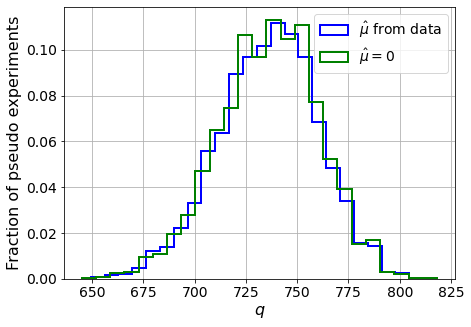

muhat mean:  -0.013905111454562729
Z_bins:  27.150836396203825
std Z_bins:  0.4462109783127619
Z_bins mu=0:  27.150836396203825
std Z_bins mu=0:  0.4490438687607892

--------

B_expected:  643
S_expected:  892



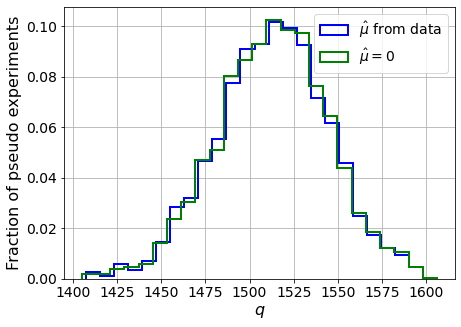

muhat mean:  -0.006766539709158636
Z_bins:  38.91209642406321
std Z_bins:  0.40536361991261183
Z_bins mu=0:  38.911298289134244
std Z_bins mu=0:  0.4073041574455341

--------

B_expected:  643
S_expected:  1723



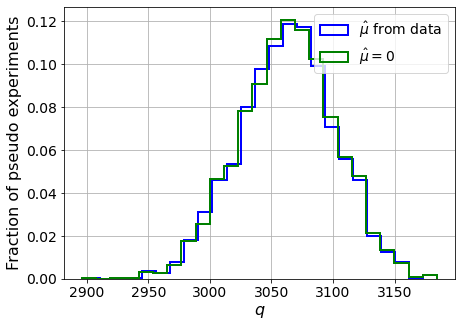

muhat mean:  -0.0037396283178107136
Z_bins:  55.353916827692274
std Z_bins:  0.35242362144069456
Z_bins mu=0:  55.353916827692274
std Z_bins mu=0:  0.3536001018071873

--------

B_expected:  643
S_expected:  3326



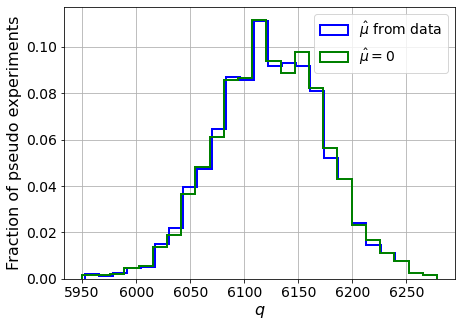

muhat mean:  -0.0017551408397427316
Z_bins:  78.25360805179427
std Z_bins:  0.31965562690941274
Z_bins mu=0:  78.25278706465222
std Z_bins mu=0:  0.32038828498155

--------


 FINAL RESULT:

[[0.7154597276421255, 0.2562310756991136, -6.193470502685555, 0.7154597276421255, 0.3135131293769239], [0.7274062310486827, 0.2607035187314145, -6.9649237238805215, 0.7274062310486827, 0.31697074628053173], [0.7167098082053059, 0.2662303129058612, -6.707630285682433, 0.7167098082053059, 0.3248310533197353], [1.0598952386209675, 0.3479794582337591, -3.5821802301587358, 1.0598952386209675, 0.4101602316380755], [1.816954294260865, 0.4661449800638993, -1.2840336988933339, 1.816954294260865, 0.527266238501788], [2.5901248735651836, 0.523088497701696, -0.6634025232355627, 2.5901248735651836, 0.5649341102245128], [3.846571610693614, 0.5688225017412257, -0.3580788934673964, 3.846571610693614, 0.6005460378077369], [5.837563310958663, 0.5795777608517562, -0.1997439730623009, 5.837563310958663, 0.598536781058

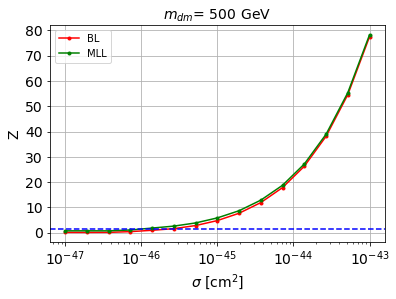


cross_BL_164:  2.7628846411633577e-46
cross_BL_164_up:  1.550703981916485e-46
cross_BL_164_down:  3.9405990482760404e-46

cross_MLL_164:  1.1952704381295543e-46
cross_MLL_164_up:  8.568788544185873e-47
cross_MLL_164_down:  1.8122573691291566e-46

#########################



In [15]:
store_cross_BL_164 = []
store_cross_BL_164_up = []
store_cross_BL_164_down = []

store_cross_MLL_164 = []
store_cross_MLL_164_up = []
store_cross_MLL_164_down = []


for m_it2 in range(len(mDM_mDM)):

    # set the parameters
    mDM = mDM_mDM[m_it2]
    S_cross1045 = S_cross1045_mDM[m_it2]
    S_expected = S_expected_mDM[m_it2]

    print('\n#########################\n')
    print('mDM = ', mDM, 'GeV\n')


    ##########
    # SIGNAL #
    ##########

    S_cs1 = np.loadtxt(filefolder + 'WIMP_' + str(mDM) + 'GeV_cs1.txt')
    S_cs2 = np.loadtxt(filefolder + 'WIMP_' + str(mDM) + 'GeV_cs2.txt')

    print('\nS_cs1.shape: ', S_cs1.shape)
    print('S_cs2.shape: ', S_cs2.shape)

    S_cs1_aux = [S_cs1[x] for x in range(len(S_cs1)) if (3 < S_cs1[x] < 70 and 50 < S_cs2[x] < 8000)]
    S_cs2 = [S_cs2[x] for x in range(len(S_cs1)) if (3 < S_cs1[x] < 70 and 50 < S_cs2[x] < 8000)]
    S_cs1 = S_cs1_aux


    # set events per classs
    NUM_DAT = min(len(B_cs1_ER), len(S_cs1))
    print(' NUM_DAT: ', NUM_DAT, '\n')

    NUM_DAT_AC = int(NUM_DAT*f_AC)
    NUM_DAT_CNNS = max(1, int(NUM_DAT*f_CNNS))
    NUM_DAT_RN = int(NUM_DAT*f_RN)
    NUM_DAT_WALL = int(NUM_DAT*f_WALL)

    NUM_DAT_ER = NUM_DAT - ( NUM_DAT_AC + NUM_DAT_CNNS + NUM_DAT_RN + NUM_DAT_WALL )

    print('NUM_DAT_ER: ', NUM_DAT_ER)
    print('NUM_DAT_AC: ', NUM_DAT_AC)
    print('NUM_DAT_CNNS: ', NUM_DAT_CNNS)
    print('NUM_DAT_RN: ', NUM_DAT_RN)
    print('NUM_DAT_WALL: ', NUM_DAT_WALL)



    # CONCATENATE THE BACKGROUNDS
    B_cs1cs2 = np.concatenate([np.stack([B_cs1_ER,B_cs2_ER],axis=1)[:NUM_DAT_ER], np.stack([B_cs1_AC,B_cs2_AC],axis=1)[:NUM_DAT_AC], np.stack([B_cs1_CNNS,B_cs2_CNNS],axis=1)[:NUM_DAT_CNNS], np.stack([B_cs1_RN,B_cs2_RN],axis=1)[:NUM_DAT_RN], np.stack([B_cs1_WALL,B_cs2_WALL],axis=1)[:NUM_DAT_WALL]])

    print('\nB_cs1cs2.shape: ', B_cs1cs2.shape)


    S_cs1cs2 = np.stack([S_cs1,S_cs2],axis=1)[:NUM_DAT]


    print('\nS_cs1cs2.shape: ', S_cs1cs2.shape)


    rnd = 100

    B_cs1cs2_plot = shuffle(B_cs1cs2, random_state=rnd)
    S_cs1cs2_plot = shuffle(S_cs1cs2, random_state=rnd)

    plt.plot(B_cs1cs2_plot[:,0][:1000], B_cs1cs2_plot[:,1][:1000], '.', color='black', alpha=0.5, label='B')
    plt.plot(S_cs1cs2_plot[:,0][:1000], S_cs1cs2_plot[:,1][:1000], '.', color='red', alpha=0.5, label='S')
    plt.yscale('log')
    # plt.xlim([0,100])
    plt.ylim([100,10000])
    plt.xlabel('s1',fontsize=14)
    plt.ylabel('s2',fontsize=14)
    plt.legend(fontsize=14)
    plt.show()



    plt.plot(B_cs1cs2_plot[:,0][:1000], (B_cs1cs2_plot[:,1] / B_cs1cs2_plot[:,0])[:1000], '.', color='black', alpha=0.5, label='B')
    plt.plot(S_cs1cs2_plot[:,0][:1000], (S_cs1cs2_plot[:,1] / S_cs1cs2_plot[:,0])[:1000], '.', color='red', alpha=0.5, label='S')
    plt.yscale('log')
    # plt.xlim([0,100])
    # plt.ylim([100,10000])
    plt.xlabel('s1',fontsize=14)
    plt.ylabel('s2/s1',fontsize=14)
    plt.legend(fontsize=14)
    plt.show()


    ############
    # DATASETS #
    ############

    # concatenate the data
    X_mon_B = B_cs1cs2
    X_mon_S = S_cs1cs2

    # X_mon_B = np.reshape(B_pdiffT,(len(B_pdiffT),1))
    # X_mon_S = np.reshape(S_pdiffT,(len(S_pdiffT),1))
    print('X_mon_B.shape: ', X_mon_B.shape)
    print('X_mon_S.shape: ', X_mon_S.shape)

    # del B_ppeakS1
    # del B_ppeakS2
    # del B_pbot
    # del B_ptop

    # del S_ppeakS1
    # del S_ppeakS2
    # del S_pbot
    # del S_ptop

    X_mon = np.concatenate([X_mon_B, X_mon_S])

    # X_mon = np.concatenate([np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(S_pbot,(len(S_pbot),1))])

    print('X_mon.shape: ', X_mon.shape)
    # del X_mon_B
    # del X_mon_S


    # labels
    y_mon = np.concatenate([np.zeros(NUM_DAT),np.ones(NUM_DAT)])


    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                    y_mon,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon,
                                                                    shuffle=True)

    del X_mon
    del y_mon

    X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                      y_mon_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon_aux,
                                                                      shuffle=True)

    del X_mon_aux
    del y_mon_aux

    print('')
    print('X_mon_train : ', X_mon_train.shape)
    print('y_mon_train : ', y_mon_train.shape)
    print('X_mon_val : ', X_mon_val.shape)
    print('y_mon_val : ', y_mon_val.shape)
    print('X_mon_test : ', X_mon_test.shape)
    print('y_mon_test : ', y_mon_test.shape)
    print('')



    # PREDICTIONS
    y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


    # ROC
    fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
    roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)



    # XGBoost with the kinematic variables of the leptons

    ########################
    # CLASSIFICATION SCORE #
    ########################

    # Outputs for validation data set

    pred_XG_SM = []
    pred_XG_NP = []

    for i in range(len(y_mon_test)):
        if y_mon_test[i] == 0:
            pred_XG_SM.append(y_pred_xg[i])
        else:
            pred_XG_NP.append(y_pred_xg[i])


    print('Classification score:')

    weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
    nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

    weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
    nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.xlabel("Classication score (XGBoost)",fontsize=15)
    plt.ylabel("Fraction of events",fontsize=14)
    plt.grid()
    plt.legend(fontsize=12)

    plt.show()




    print('\n ROC-AUC = ', roc_auc_xg)



    #######################
    # BIN LIKELIHOOD TEST #
    #######################

    MIN_EVS = 5 # min number of background events that we allow per bin
    range_dat = [[0,1]] # range of our data (between 0 and 1 if its the ML output)

    bins_to_test=range(1,500) # number of bins we are testing to see if condition holds

    # FIND THE NUMBER OF BINS:
    num_binsX = max_num_bins(pred_XG_SM, B_expected, range_dat, MIN_EVS, bins_to_test)

    print('\n FOR BIN LIKELIHOOD WE ARE SETTING:')
    print('min number of Background events allowed per bin: ', MIN_EVS)
    print('max number of bins allowed: ', num_binsX)
    print('range of our data: ', range_dat)




    num_bins = min(10, num_binsX)
    print('number of bins we are going to use: ', num_bins)


    # OPTION 2 (mu_hat with more precision) (slower, not so bad for bin likelihood)
    store_Z_BL = []


    for s_it in range(len(S_expected)):

        print('B_expected: ', B_expected)
        print('S_expected: ', S_expected[s_it])
        print('')

        Z_BL = BL_test_fsolve(D_or_E, pred_XG_SM, pred_XG_NP, B_expected, S_expected[s_it], num_pseudo, num_bins, range_dat, MIN_EVS, linear_bins=True) 

        store_Z_BL.append( list(Z_BL) )

        print('muhat mean: ', Z_BL[2])
        print('Z_bins: ', Z_BL[0])
        print('std Z_bins: ', Z_BL[1])
        print('Z_bins mu=0: ', Z_BL[3])
        print('std Z_bins mu=0: ', Z_BL[4])
        print('')
        print('--------\n')



    print('\n FINAL RESULT:\n')
    print(store_Z_BL)




    #######
    # MLL #
    #######

    # USE KDE TO ESTIMATE THE CLASSIFIER OUTPUT PDFs

    # outputs:
    # 1st -> background PDF
    # 2nd -> signal PDF
    # 3rd -> (normalization factor of the background PDF)**-1
    # 4th -> (normalization factor of the signal PDF)**-1
    # 5th -> background bandwidth
    # 6th -> signal bandwidth
    kde_bkg, kde_sig, norm_factor_SM, norm_factor_NP, B_bandwidth, S_bandwidth = KDE_fitter(pred_XG_SM, pred_XG_NP, 
                                                                                            1000, 
                                                                                            np.logspace(-4.0, 0.05, 20), 
                                                                                            set_kernel='epanechnikov')




    # FOR EXCLUSION:
    # we need to evaluate the KDE densities with the classifier output of BACKGROUND EVENTS

    print('This may take a while...')

    pB_B_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_SM, np.zeros(len(pred_XG_SM)) ]) )
    print('1 done')
    pS_B_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_SM, np.ones(len(pred_XG_SM)) ]) )
    print('2 done')

    # Normalize
    pB_B_data = pB_B_data / norm_factor_SM
    pS_B_data = pS_B_data / norm_factor_NP


    if D_or_E == "discovery":

        # FOR DISCOVERY:
        # we need to evaluate the KDE densities with the classifier output of BACKGROUND and SIGNAL EVENTS

        pB_S_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_NP, np.zeros(len(pred_XG_NP)) ]) )
        print('3 done')
        pS_S_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_NP, np.ones(len(pred_XG_NP)) ]) )
        print('4 done')

        # Normalize
        pB_S_data = pB_S_data / norm_factor_SM
        pS_S_data = pS_S_data / norm_factor_NP

    else:
        # dummies
        pB_S_data = 1
        pS_S_data = 1





    # OPTION 2 (mu_hat with more precision) (slower)
    store_Z_MLL = []


    for s_it in range(len(S_expected)):

        print('B_expected: ', B_expected)
        print('S_expected: ', S_expected[s_it])
        print('')

        Z_MLL = MLL_test_fsolve(D_or_E, pB_B_data, pS_B_data, pB_S_data, pS_S_data, B_expected, S_expected[s_it], num_pseudo)

        store_Z_MLL.append( list(Z_MLL) )

        print('muhat mean: ', Z_MLL[2])
        print('Z_bins: ', Z_MLL[0])
        print('std Z_bins: ', Z_MLL[1])
        print('Z_bins mu=0: ', Z_MLL[3])
        print('std Z_bins mu=0: ', Z_MLL[4])
        print('')
        print('--------\n')


    print('\n FINAL RESULT:\n')
    print(store_Z_MLL)


    store_Z_MLL = np.array(store_Z_MLL)

    for hd in range(len(store_Z_MLL[:,0])):
        if store_Z_MLL[:,0][hd] == 0:
            store_Z_MLL[:,0][hd] = store_Z_MLL[:,3][hd]
            store_Z_MLL[:,1][hd] = store_Z_MLL[:,4][hd]




    # plot
    plt.plot(cross_factor*1e-45, np.array(store_Z_BL)[:,0], '.-', c='red', label='BL')
    plt.plot(cross_factor*1e-45, np.array(store_Z_MLL)[:,0], '.-', c='green', label = "MLL")

    plt.axhline(y=1.64, c='blue', linestyle='--')
    plt.title('$m_{dm}$= %0.2d GeV' % mDM, fontsize=14)
    plt.xscale('log')
    plt.xlabel(r'$\sigma$ [cm$^2$]', fontsize=14)
    plt.ylabel(r'Z', fontsize=14)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()


    # interpolate
    f_Z = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0], kind='linear')
    f_Z_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0] + np.array(store_Z_BL)[:,1], kind='linear')
    f_Z_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0] - np.array(store_Z_BL)[:,1], kind='linear')

    # compute the cross section with Z=1.64
    cross_BL_164 = 10**solvecross(f_Z, 1.64)
    cross_BL_164_up = 10**solvecross(f_Z_up, 1.64)
    cross_BL_164_down = 10**solvecross(f_Z_down, 1.64)

    store_cross_BL_164.append(cross_BL_164)
    store_cross_BL_164_up.append(cross_BL_164_up)
    store_cross_BL_164_down.append(cross_BL_164_down)


    # interpolate
    f_Z_MLL = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0], kind='linear')
    f_Z_MLL_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] + np.array(store_Z_MLL)[:,1], kind='linear')
    f_Z_MLL_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] - np.array(store_Z_MLL)[:,1], kind='linear')

    # compute the cross section with Z=1.64
    cross_MLL_164 = 10**solvecross(f_Z_MLL, 1.64)
    cross_MLL_164_up = 10**solvecross(f_Z_MLL_up, 1.64)
    cross_MLL_164_down = 10**solvecross(f_Z_MLL_down, 1.64)

    store_cross_MLL_164.append(cross_MLL_164)
    store_cross_MLL_164_up.append(cross_MLL_164_up)
    store_cross_MLL_164_down.append(cross_MLL_164_down)


    print('\ncross_BL_164: ', cross_BL_164)
    print('cross_BL_164_up: ', cross_BL_164_up)
    print('cross_BL_164_down: ', cross_BL_164_down)

    print('\ncross_MLL_164: ', cross_MLL_164)
    print('cross_MLL_164_up: ', cross_MLL_164_up)
    print('cross_MLL_164_down: ', cross_MLL_164_down)
    print('\n#########################\n')


In [16]:
cross_cs1cs2 = store_cross_BL_164
cross_cs1cs2_up = store_cross_BL_164_up
cross_cs1cs2_down = store_cross_BL_164_down

print(cross_cs1cs2)
print(cross_cs1cs2_up)
print(cross_cs1cs2_down)


cross_cs1cs2_MLL = store_cross_MLL_164
cross_cs1cs2_MLL_up = store_cross_MLL_164_up
cross_cs1cs2_MLL_down = store_cross_MLL_164_down

print(cross_cs1cs2_MLL)
print(cross_cs1cs2_MLL_up)
print(cross_cs1cs2_MLL_down)

[1.2399523578835395e-45, 7.833886803234381e-47, 4.2035412599502184e-47, 4.1609885342393653e-47, 6.430933630254586e-47, 1.0485703587977675e-46, 2.7628846411633577e-46]
[8.671135936225568e-46, 4.874226723870817e-47, 2.792442722360871e-47, 2.3732405108826783e-47, 3.9398933482334076e-47, 6.49663533717186e-47, 1.550703981916485e-46]
[1.7366756965413017e-45, 1.125877702029272e-46, 6.5696771038327445e-47, 6.520987119835413e-47, 8.721723825646783e-47, 1.5969205540121762e-46, 3.9405990482760404e-46]
[8.22633144465294e-46, 4.938164218295169e-47, 2.701563977016666e-47, 2.1732560599437332e-47, 2.820679306369085e-47, 4.931627668759744e-47, 1.1952704381295543e-46]
[5.884846644008424e-46, 3.3345176826587163e-47, 1.869313358795012e-47, 1.379601302061469e-47, 1.687882893073422e-47, 3.399141876164685e-47, 8.568788544185873e-47]
[1.2118423194107048e-45, 7.673420300555924e-47, 3.7290287492827988e-47, 3.7101806605672983e-47, 4.403985000050499e-47, 7.689638201462867e-47, 1.8122573691291566e-46]


In [17]:
np.savetxt('results/general/cs1cs2_mDM' + str(m_it) + '.txt', [cross_cs1cs2, cross_cs1cs2_up, cross_cs1cs2_down])
np.savetxt('results/general/cs1cs2_mDM' + str(m_it) + '_MLL.txt', [cross_cs1cs2_MLL, cross_cs1cs2_MLL_up, cross_cs1cs2_MLL_down])

In [18]:
cross_cs1cs2_general_m2 = np.loadtxt('results/general/cs1cs2_mDM' + str(m_it) + '.txt')[0]
cross_cs1cs2_general_m2_up = np.loadtxt('results/general/cs1cs2_mDM' + str(m_it) + '.txt')[1]
cross_cs1cs2_general_m2_down =np.loadtxt('results/general/cs1cs2_mDM' + str(m_it) + '.txt')[2]

cross_cs1cs2_general_m2_MLL = np.loadtxt('results/general/cs1cs2_mDM' + str(m_it) + '_MLL.txt')[0]
cross_cs1cs2_general_m2_MLL_up = np.loadtxt('results/general/cs1cs2_mDM' + str(m_it) + '_MLL.txt')[1]
cross_cs1cs2_general_m2_MLL_down = np.loadtxt('results/general/cs1cs2_mDM' + str(m_it) + '_MLL.txt')[2]

#### Train with m_it = 3


#########################

mDM =  50 GeV


S_cs1.shape:  (35287,)
S_cs2.shape:  (35287,)
 NUM_DAT:  34105 

NUM_DAT_ER:  33671
NUM_DAT_AC:  119
NUM_DAT_CNNS:  1
NUM_DAT_RN:  31
NUM_DAT_WALL:  283

B_cs1cs2.shape:  (34105, 2)

S_cs1cs2.shape:  (34105, 2)


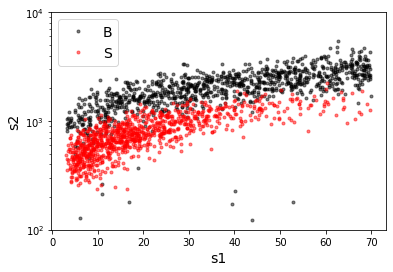

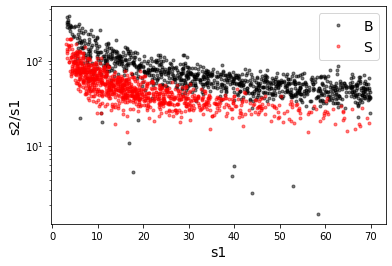

X_mon_B.shape:  (34105, 2)
X_mon_S.shape:  (34105, 2)
X_mon.shape:  (68210, 2)

X_mon_train :  (43483, 2)
y_mon_train :  (43483,)
X_mon_val :  (7674, 2)
y_mon_val :  (7674,)
X_mon_test :  (17053, 2)
y_mon_test :  (17053,)

[0]	validation_0-logloss:0.68533	validation_1-logloss:0.68531
[1]	validation_0-logloss:0.67766	validation_1-logloss:0.67762
[2]	validation_0-logloss:0.67016	validation_1-logloss:0.67009
[3]	validation_0-logloss:0.66278	validation_1-logloss:0.66270
[4]	validation_0-logloss:0.65556	validation_1-logloss:0.65546
[5]	validation_0-logloss:0.64848	validation_1-logloss:0.64834
[6]	validation_0-logloss:0.64152	validation_1-logloss:0.64137
[7]	validation_0-logloss:0.63468	validation_1-logloss:0.63451
[8]	validation_0-logloss:0.62799	validation_1-logloss:0.62780


/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[9]	validation_0-logloss:0.62140	validation_1-logloss:0.62119
[10]	validation_0-logloss:0.61493	validation_1-logloss:0.61470
[11]	validation_0-logloss:0.60859	validation_1-logloss:0.60834
[12]	validation_0-logloss:0.60236	validation_1-logloss:0.60208
[13]	validation_0-logloss:0.59625	validation_1-logloss:0.59595
[14]	validation_0-logloss:0.59021	validation_1-logloss:0.58991
[15]	validation_0-logloss:0.58431	validation_1-logloss:0.58396
[16]	validation_0-logloss:0.57852	validation_1-logloss:0.57815
[17]	validation_0-logloss:0.57279	validation_1-logloss:0.57240
[18]	validation_0-logloss:0.56717	validation_1-logloss:0.56677
[19]	validation_0-logloss:0.56167	validation_1-logloss:0.56124
[20]	validation_0-logloss:0.55622	validation_1-logloss:0.55578
[21]	validation_0-logloss:0.55088	validation_1-logloss:0.55041
[22]	validation_0-logloss:0.54563	validation_1-logloss:0.54514
[23]	validation_0-logloss:0.54046	validation_1-logloss:0.53995
[24]	validation_0-logloss:0.53536	validation_1-logloss:0

[139]	validation_0-logloss:0.25270	validation_1-logloss:0.25199
[140]	validation_0-logloss:0.25162	validation_1-logloss:0.25092
[141]	validation_0-logloss:0.25058	validation_1-logloss:0.24990
[142]	validation_0-logloss:0.24954	validation_1-logloss:0.24887
[143]	validation_0-logloss:0.24850	validation_1-logloss:0.24784
[144]	validation_0-logloss:0.24749	validation_1-logloss:0.24684
[145]	validation_0-logloss:0.24650	validation_1-logloss:0.24587
[146]	validation_0-logloss:0.24551	validation_1-logloss:0.24489
[147]	validation_0-logloss:0.24452	validation_1-logloss:0.24391
[148]	validation_0-logloss:0.24356	validation_1-logloss:0.24297
[149]	validation_0-logloss:0.24259	validation_1-logloss:0.24201
[150]	validation_0-logloss:0.24165	validation_1-logloss:0.24108
[151]	validation_0-logloss:0.24073	validation_1-logloss:0.24018
[152]	validation_0-logloss:0.23979	validation_1-logloss:0.23924
[153]	validation_0-logloss:0.23889	validation_1-logloss:0.23835
[154]	validation_0-logloss:0.23798	valid

[268]	validation_0-logloss:0.18107	validation_1-logloss:0.18163
[269]	validation_0-logloss:0.18084	validation_1-logloss:0.18140
[270]	validation_0-logloss:0.18060	validation_1-logloss:0.18117
[271]	validation_0-logloss:0.18037	validation_1-logloss:0.18094
[272]	validation_0-logloss:0.18013	validation_1-logloss:0.18071
[273]	validation_0-logloss:0.17990	validation_1-logloss:0.18049
[274]	validation_0-logloss:0.17966	validation_1-logloss:0.18027
[275]	validation_0-logloss:0.17944	validation_1-logloss:0.18004
[276]	validation_0-logloss:0.17921	validation_1-logloss:0.17982
[277]	validation_0-logloss:0.17898	validation_1-logloss:0.17961
[278]	validation_0-logloss:0.17877	validation_1-logloss:0.17939
[279]	validation_0-logloss:0.17856	validation_1-logloss:0.17919
[280]	validation_0-logloss:0.17834	validation_1-logloss:0.17898
[281]	validation_0-logloss:0.17813	validation_1-logloss:0.17879
[282]	validation_0-logloss:0.17792	validation_1-logloss:0.17859
[283]	validation_0-logloss:0.17772	valid

[397]	validation_0-logloss:0.16413	validation_1-logloss:0.16554
[398]	validation_0-logloss:0.16407	validation_1-logloss:0.16548
[399]	validation_0-logloss:0.16400	validation_1-logloss:0.16543
[400]	validation_0-logloss:0.16394	validation_1-logloss:0.16537
[401]	validation_0-logloss:0.16388	validation_1-logloss:0.16531
[402]	validation_0-logloss:0.16382	validation_1-logloss:0.16526
[403]	validation_0-logloss:0.16376	validation_1-logloss:0.16520
[404]	validation_0-logloss:0.16370	validation_1-logloss:0.16515
[405]	validation_0-logloss:0.16365	validation_1-logloss:0.16510
[406]	validation_0-logloss:0.16359	validation_1-logloss:0.16505
[407]	validation_0-logloss:0.16353	validation_1-logloss:0.16500
[408]	validation_0-logloss:0.16348	validation_1-logloss:0.16496
[409]	validation_0-logloss:0.16342	validation_1-logloss:0.16490
[410]	validation_0-logloss:0.16336	validation_1-logloss:0.16484
[411]	validation_0-logloss:0.16331	validation_1-logloss:0.16480
[412]	validation_0-logloss:0.16325	valid

[526]	validation_0-logloss:0.15916	validation_1-logloss:0.16172
[527]	validation_0-logloss:0.15914	validation_1-logloss:0.16169
[528]	validation_0-logloss:0.15912	validation_1-logloss:0.16168
[529]	validation_0-logloss:0.15910	validation_1-logloss:0.16167
[530]	validation_0-logloss:0.15908	validation_1-logloss:0.16166
[531]	validation_0-logloss:0.15906	validation_1-logloss:0.16164
[532]	validation_0-logloss:0.15904	validation_1-logloss:0.16163
[533]	validation_0-logloss:0.15902	validation_1-logloss:0.16163
[534]	validation_0-logloss:0.15900	validation_1-logloss:0.16162
[535]	validation_0-logloss:0.15898	validation_1-logloss:0.16160
[536]	validation_0-logloss:0.15896	validation_1-logloss:0.16158
[537]	validation_0-logloss:0.15894	validation_1-logloss:0.16156
[538]	validation_0-logloss:0.15892	validation_1-logloss:0.16156
[539]	validation_0-logloss:0.15890	validation_1-logloss:0.16154
[540]	validation_0-logloss:0.15888	validation_1-logloss:0.16153
[541]	validation_0-logloss:0.15886	valid

[783]	validation_0-logloss:0.15630	validation_1-logloss:0.16034
[784]	validation_0-logloss:0.15629	validation_1-logloss:0.16034
[785]	validation_0-logloss:0.15628	validation_1-logloss:0.16034
[786]	validation_0-logloss:0.15626	validation_1-logloss:0.16034
[787]	validation_0-logloss:0.15626	validation_1-logloss:0.16033
[788]	validation_0-logloss:0.15624	validation_1-logloss:0.16033
[789]	validation_0-logloss:0.15623	validation_1-logloss:0.16032
[790]	validation_0-logloss:0.15622	validation_1-logloss:0.16032
[791]	validation_0-logloss:0.15621	validation_1-logloss:0.16031
[792]	validation_0-logloss:0.15620	validation_1-logloss:0.16031
[793]	validation_0-logloss:0.15619	validation_1-logloss:0.16031
[794]	validation_0-logloss:0.15619	validation_1-logloss:0.16031
[795]	validation_0-logloss:0.15617	validation_1-logloss:0.16031
[796]	validation_0-logloss:0.15616	validation_1-logloss:0.16031
[797]	validation_0-logloss:0.15615	validation_1-logloss:0.16031
[798]	validation_0-logloss:0.15614	valid

[912]	validation_0-logloss:0.15497	validation_1-logloss:0.16013
[913]	validation_0-logloss:0.15495	validation_1-logloss:0.16013
[914]	validation_0-logloss:0.15494	validation_1-logloss:0.16013
[915]	validation_0-logloss:0.15493	validation_1-logloss:0.16012
[916]	validation_0-logloss:0.15491	validation_1-logloss:0.16011
[917]	validation_0-logloss:0.15491	validation_1-logloss:0.16011
[918]	validation_0-logloss:0.15490	validation_1-logloss:0.16011
[919]	validation_0-logloss:0.15488	validation_1-logloss:0.16012
[920]	validation_0-logloss:0.15487	validation_1-logloss:0.16011
[921]	validation_0-logloss:0.15486	validation_1-logloss:0.16011
[922]	validation_0-logloss:0.15486	validation_1-logloss:0.16011
[923]	validation_0-logloss:0.15485	validation_1-logloss:0.16011
[924]	validation_0-logloss:0.15484	validation_1-logloss:0.16010
[925]	validation_0-logloss:0.15483	validation_1-logloss:0.16010
[926]	validation_0-logloss:0.15482	validation_1-logloss:0.16010
[927]	validation_0-logloss:0.15481	valid

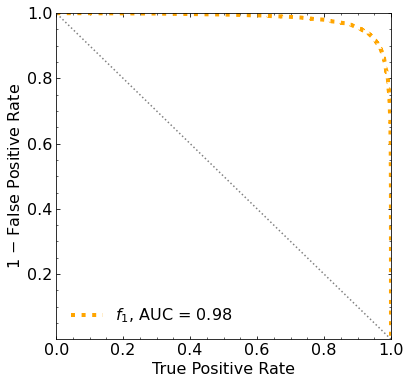

In [19]:
m_it = 3


# set the parameters
mDM = mDM_mDM[m_it]
S_cross1045 = S_cross1045_mDM[m_it]
S_expected = S_expected_mDM[m_it]

print('\n#########################\n')
print('mDM = ', mDM, 'GeV\n')


##########
# SIGNAL #
##########

S_cs1 = np.loadtxt(filefolder + 'WIMP_' + str(mDM) + 'GeV_cs1.txt')
S_cs2 = np.loadtxt(filefolder + 'WIMP_' + str(mDM) + 'GeV_cs2.txt')

print('\nS_cs1.shape: ', S_cs1.shape)
print('S_cs2.shape: ', S_cs2.shape)

S_cs1_aux = [S_cs1[x] for x in range(len(S_cs1)) if (3 < S_cs1[x] < 70 and 50 < S_cs2[x] < 8000)]
S_cs2 = [S_cs2[x] for x in range(len(S_cs1)) if (3 < S_cs1[x] < 70 and 50 < S_cs2[x] < 8000)]
S_cs1 = S_cs1_aux


# set events per classs
NUM_DAT = min(len(B_cs1_ER), len(S_cs1))
print(' NUM_DAT: ', NUM_DAT, '\n')

NUM_DAT_AC = int(NUM_DAT*f_AC)
NUM_DAT_CNNS = max(1, int(NUM_DAT*f_CNNS))
NUM_DAT_RN = int(NUM_DAT*f_RN)
NUM_DAT_WALL = int(NUM_DAT*f_WALL)

NUM_DAT_ER = NUM_DAT - ( NUM_DAT_AC + NUM_DAT_CNNS + NUM_DAT_RN + NUM_DAT_WALL )

print('NUM_DAT_ER: ', NUM_DAT_ER)
print('NUM_DAT_AC: ', NUM_DAT_AC)
print('NUM_DAT_CNNS: ', NUM_DAT_CNNS)
print('NUM_DAT_RN: ', NUM_DAT_RN)
print('NUM_DAT_WALL: ', NUM_DAT_WALL)



# CONCATENATE THE BACKGROUNDS
B_cs1cs2 = np.concatenate([np.stack([B_cs1_ER,B_cs2_ER],axis=1)[:NUM_DAT_ER], np.stack([B_cs1_AC,B_cs2_AC],axis=1)[:NUM_DAT_AC], np.stack([B_cs1_CNNS,B_cs2_CNNS],axis=1)[:NUM_DAT_CNNS], np.stack([B_cs1_RN,B_cs2_RN],axis=1)[:NUM_DAT_RN], np.stack([B_cs1_WALL,B_cs2_WALL],axis=1)[:NUM_DAT_WALL]])

print('\nB_cs1cs2.shape: ', B_cs1cs2.shape)


S_cs1cs2 = np.stack([S_cs1,S_cs2],axis=1)[:NUM_DAT]


print('\nS_cs1cs2.shape: ', S_cs1cs2.shape)


rnd = 100

B_cs1cs2_plot = shuffle(B_cs1cs2, random_state=rnd)
S_cs1cs2_plot = shuffle(S_cs1cs2, random_state=rnd)

plt.plot(B_cs1cs2_plot[:,0][:1000], B_cs1cs2_plot[:,1][:1000], '.', color='black', alpha=0.5, label='B')
plt.plot(S_cs1cs2_plot[:,0][:1000], S_cs1cs2_plot[:,1][:1000], '.', color='red', alpha=0.5, label='S')
plt.yscale('log')
# plt.xlim([0,100])
plt.ylim([100,10000])
plt.xlabel('s1',fontsize=14)
plt.ylabel('s2',fontsize=14)
plt.legend(fontsize=14)
plt.show()



plt.plot(B_cs1cs2_plot[:,0][:1000], (B_cs1cs2_plot[:,1] / B_cs1cs2_plot[:,0])[:1000], '.', color='black', alpha=0.5, label='B')
plt.plot(S_cs1cs2_plot[:,0][:1000], (S_cs1cs2_plot[:,1] / S_cs1cs2_plot[:,0])[:1000], '.', color='red', alpha=0.5, label='S')
plt.yscale('log')
# plt.xlim([0,100])
# plt.ylim([100,10000])
plt.xlabel('s1',fontsize=14)
plt.ylabel('s2/s1',fontsize=14)
plt.legend(fontsize=14)
plt.show()


############
# DATASETS #
############

# concatenate the data
X_mon_B = B_cs1cs2
X_mon_S = S_cs1cs2

# X_mon_B = np.reshape(B_pdiffT,(len(B_pdiffT),1))
# X_mon_S = np.reshape(S_pdiffT,(len(S_pdiffT),1))
print('X_mon_B.shape: ', X_mon_B.shape)
print('X_mon_S.shape: ', X_mon_S.shape)

# del B_ppeakS1
# del B_ppeakS2
# del B_pbot
# del B_ptop

# del S_ppeakS1
# del S_ppeakS2
# del S_pbot
# del S_ptop

X_mon = np.concatenate([X_mon_B, X_mon_S])

# X_mon = np.concatenate([np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(S_pbot,(len(S_pbot),1))])

print('X_mon.shape: ', X_mon.shape)
# del X_mon_B
# del X_mon_S


# labels
y_mon = np.concatenate([np.zeros(NUM_DAT),np.ones(NUM_DAT)])


# divide into train-val and test data samples
test_ratio = 0.25
val_ratio = 0.15


X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                y_mon,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_mon,
                                                                shuffle=True)

del X_mon
del y_mon

X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                  y_mon_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_mon_aux,
                                                                  shuffle=True)

del X_mon_aux
del y_mon_aux

print('')
print('X_mon_train : ', X_mon_train.shape)
print('y_mon_train : ', y_mon_train.shape)
print('X_mon_val : ', X_mon_val.shape)
print('y_mon_val : ', y_mon_val.shape)
print('X_mon_test : ', X_mon_test.shape)
print('y_mon_test : ', y_mon_test.shape)
print('')



###########
# XGBOOST #
###########

# XGBoost with only the kinematic variables of the leptons

# CLASSIFIER
classifier = XGBClassifier(
    n_estimators=2500,
    learning_rate=0.01,
    reg_lambda=0.01,reg_alpha=0.0,
    gamma=0.0,objective='binary:logistic',
    max_depth=5,
    #eval_metric=["error", "logloss", "map"]
    eval_metric='logloss')

# FIT
classifier.fit(X_mon_train,y_mon_train,eval_set=[(X_mon_train, y_mon_train), (X_mon_val, y_mon_val)],
        early_stopping_rounds=50,#early stopping
        verbose=True)


# PREDICTIONS
y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


# ROC
fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)


# PLOT THE ROC WITH AUC
fig = plt.figure(figsize=(6, 6))
gs = gridspec.GridSpec(1, 1) 
ax0 = plt.subplot(gs[0])
ax0.yaxis.set_ticks_position('both')
ax0.xaxis.set_ticks_position('both')
ax0.tick_params(direction="in",which="both")
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
ax0.minorticks_on()


plt.plot(tpr_mon_xg,1-fpr_mon_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()



#########################

mDM =  10 GeV


S_cs1.shape:  (34190,)
S_cs2.shape:  (34190,)
 NUM_DAT:  31606 

NUM_DAT_ER:  31203
NUM_DAT_AC:  111
NUM_DAT_CNNS:  1
NUM_DAT_RN:  29
NUM_DAT_WALL:  262

B_cs1cs2.shape:  (31606, 2)

S_cs1cs2.shape:  (31606, 2)


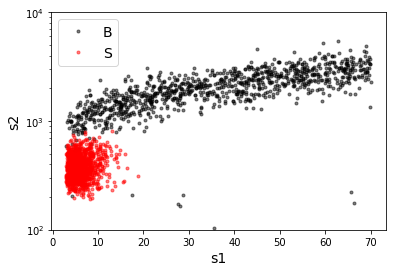

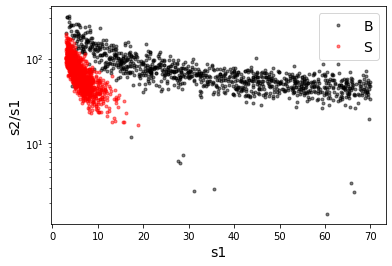

X_mon_B.shape:  (31606, 2)
X_mon_S.shape:  (31606, 2)
X_mon.shape:  (63212, 2)

X_mon_train :  (40297, 2)
y_mon_train :  (40297,)
X_mon_val :  (7112, 2)
y_mon_val :  (7112,)
X_mon_test :  (15803, 2)
y_mon_test :  (15803,)

Classification score:


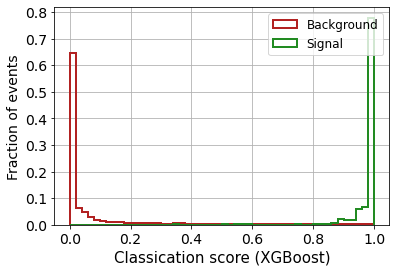


 ROC-AUC =  0.9956899394830082
At least 5 B events per bin, range = [[0, 1]]:
# bins:  15 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  15
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2605


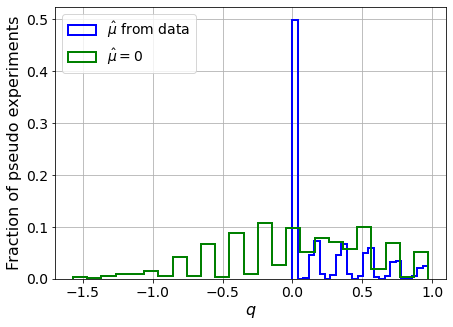

muhat mean:  0.307163511844173
Z_bins:  0.33811400410125364
std Z_bins:  0.42816524399659506
Z_bins mu=0:  0.33811400410125364
std Z_bins mu=0:  0.7783860871581553

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.284


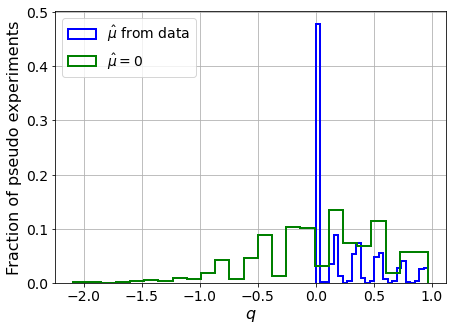

muhat mean:  0.1993744494574619
Z_bins:  0.38122297821055234
std Z_bins:  0.38357038240709257
Z_bins mu=0:  0.38122297821055234
std Z_bins mu=0:  0.6946910455145877

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.237


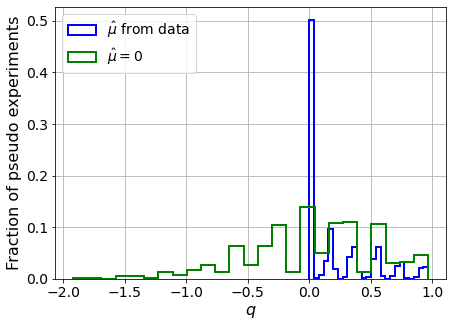

muhat mean:  0.35702136559931374
Z_bins:  0.17331725791694214
std Z_bins:  0.8048982679865091
Z_bins mu=0:  0.11571562857523629
std Z_bins mu=0:  2.220432936852117

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.26


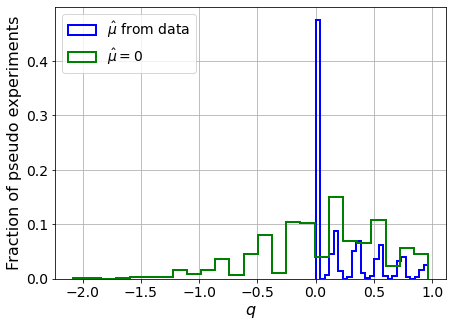

muhat mean:  0.22137202578169554
Z_bins:  0.37263962726403727
std Z_bins:  0.380959513568112
Z_bins mu=0:  0.37263962726403727
std Z_bins mu=0:  0.6958307455674111

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2575


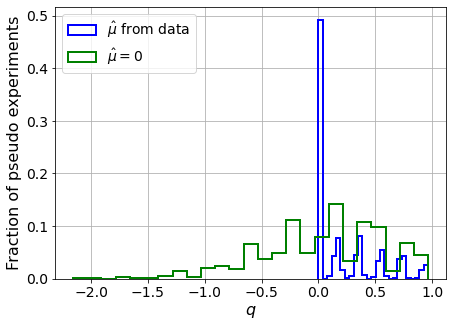

muhat mean:  0.3429882542171985
Z_bins:  0.34990398213035717
std Z_bins:  0.40745115771036733
Z_bins mu=0:  0.34990398213035717
std Z_bins mu=0:  0.7651784547680971

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2605


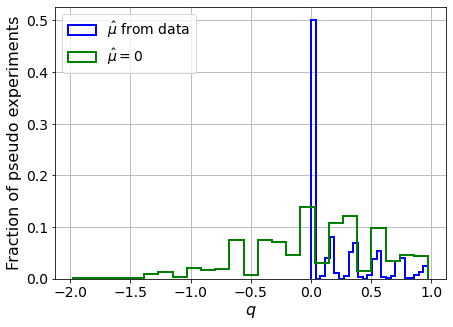

muhat mean:  0.32080337386309477
Z_bins:  0.18194897511870098
std Z_bins:  0.7839973427545791
Z_bins mu=0:  0.1363471451508997
std Z_bins mu=0:  1.921812173708646

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.246


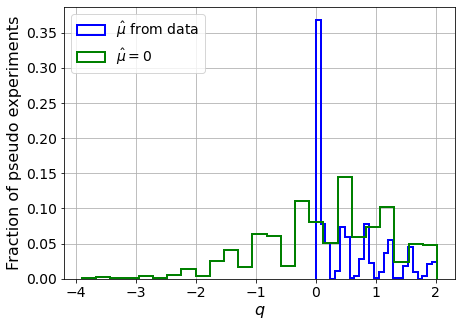

muhat mean:  0.19506781932619374
Z_bins:  0.6169423995190462
std Z_bins:  0.48471853922398567
Z_bins mu=0:  0.6169423995190462
std Z_bins mu=0:  0.8328168264749579

--------

B_expected:  643
S_expected:  5

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.266


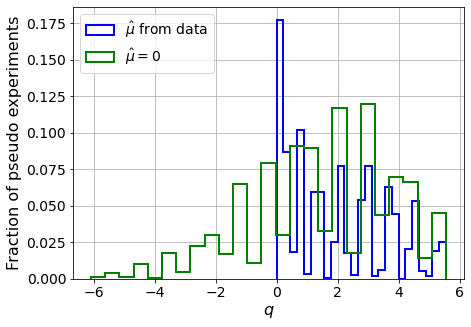

muhat mean:  0.08094168791187817
Z_bins:  1.2180465783243097
std Z_bins:  0.6676903304136428
Z_bins mu=0:  1.2102953786607231
std Z_bins mu=0:  0.9568785036573446

--------

B_expected:  643
S_expected:  9

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.263


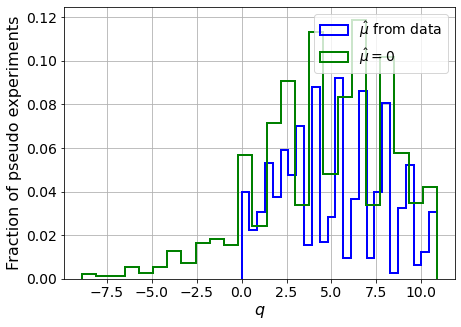

muhat mean:  0.025111130043024187
Z_bins:  2.2699657831167865
std Z_bins:  0.6312271761852489
Z_bins mu=0:  2.2699657831167865
std Z_bins mu=0:  0.798161495568201

--------

B_expected:  643
S_expected:  18

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.256


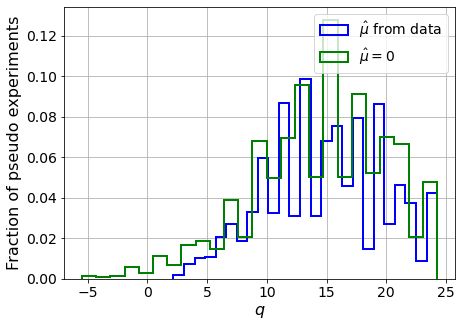

muhat mean:  0.0027983413575715273
Z_bins:  3.884756545279633
std Z_bins:  0.6252231183060702
Z_bins mu=0:  3.884756545279633
std Z_bins mu=0:  0.7089945385891446

--------

B_expected:  643
S_expected:  34

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.272


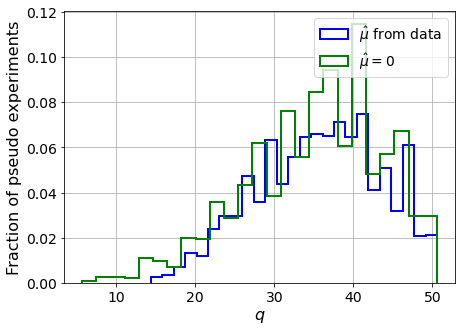

muhat mean:  0.011207359257052784
Z_bins:  6.018219188352944
std Z_bins:  0.6431571298462606
Z_bins mu=0:  6.018219188352944
std Z_bins mu=0:  0.7137834090056713

--------

B_expected:  643
S_expected:  66

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.257


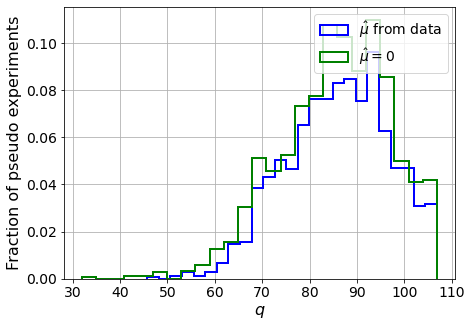

muhat mean:  0.004169467079091744
Z_bins:  9.293827192644914
std Z_bins:  0.5770707019365875
Z_bins mu=0:  9.293827192644914
std Z_bins mu=0:  0.6202469415186601

--------

B_expected:  643
S_expected:  126

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.272


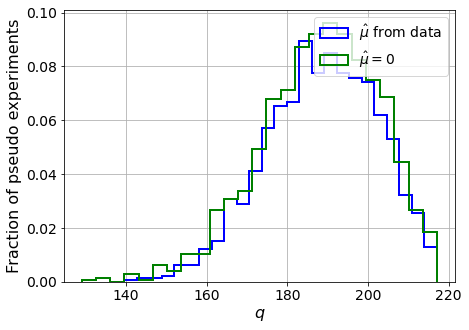

muhat mean:  0.0029193665490610293
Z_bins:  13.751680858273616
std Z_bins:  0.4967733544244928
Z_bins mu=0:  13.75126221786979
std Z_bins mu=0:  0.5249810667961443

--------

B_expected:  643
S_expected:  244

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2375


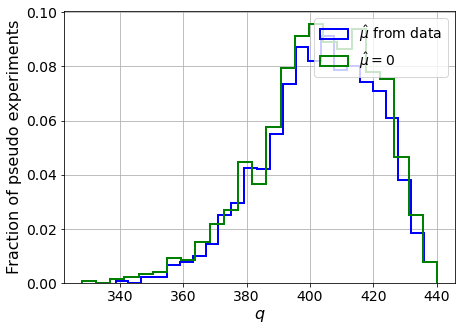

muhat mean:  0.0008765810903827205
Z_bins:  20.108816991664195
std Z_bins:  0.4369343099733831
Z_bins mu=0:  20.108816991664195
std Z_bins mu=0:  0.45614673439601977

--------

B_expected:  643
S_expected:  471

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2645


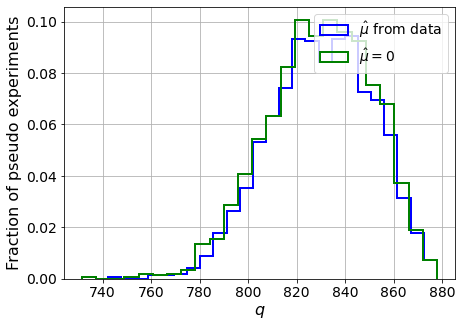

muhat mean:  0.00032734827528905743
Z_bins:  28.822693630229825
std Z_bins:  0.36356052987973264
Z_bins mu=0:  28.822693630229825
std Z_bins mu=0:  0.37482051951047723

--------


 FINAL RESULT:

[[0.33811400410125364, 0.42816524399659506, 0.307163511844173, 0.33811400410125364, 0.7783860871581553], [0.38122297821055234, 0.38357038240709257, 0.1993744494574619, 0.38122297821055234, 0.6946910455145877], [0.17331725791694214, 0.8048982679865091, 0.35702136559931374, 0.11571562857523629, 2.220432936852117], [0.37263962726403727, 0.380959513568112, 0.22137202578169554, 0.37263962726403727, 0.6958307455674111], [0.34990398213035717, 0.40745115771036733, 0.3429882542171985, 0.34990398213035717, 0.7651784547680971], [0.18194897511870098, 0.7839973427545791, 0.32080337386309477, 0.1363471451508997, 1.921812173708646], [0.6169423995190462, 0.48471853922398567, 0.19506781932619374, 0.6169423995190462, 0.8328168264749579], [1.2180465783243097, 0.6676903304136428, 0.08094168791187817, 1.2102953786

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 337.30752963 295.3536776  255.83931837 209.86198582
 155.47952549  93.97711595  34.38447078 -29.34812916 -96.9585343 ]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf 348.41088664
 279

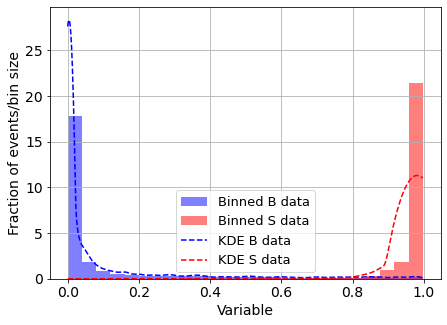

KDE Kernel:  epanechnikov
Background bandwidth:  0.022117541055781564
Signal bandwidth:  0.0964296357589577
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



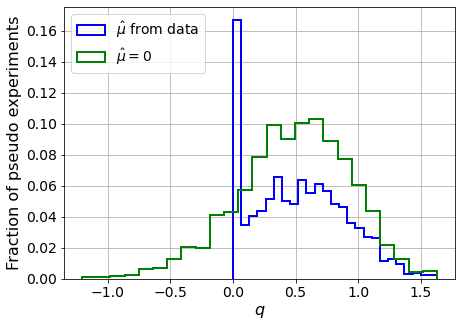

muhat mean:  -3.2920132054404134
Z_bins:  0.7215840266448913
std Z_bins:  0.2609787075008356
Z_bins mu=0:  0.7215840266448913
std Z_bins mu=0:  0.30864054037082433

--------

B_expected:  643
S_expected:  1



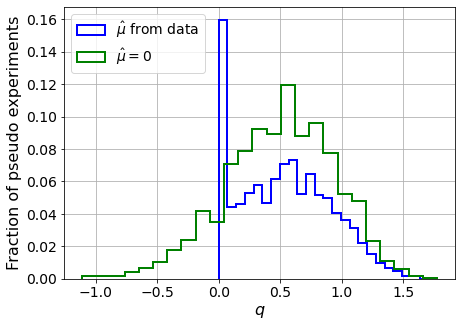

muhat mean:  -3.314284873729971
Z_bins:  0.7260876822385137
std Z_bins:  0.26044937047417765
Z_bins mu=0:  0.7260876822385137
std Z_bins mu=0:  0.3038326455924963

--------

B_expected:  643
S_expected:  1



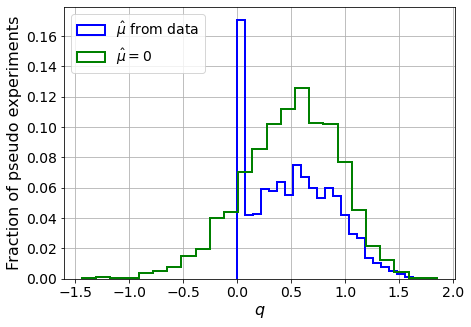

muhat mean:  -3.3472266907966346
Z_bins:  0.7270944425965911
std Z_bins:  0.2591981000006712
Z_bins mu=0:  0.7270944425965911
std Z_bins mu=0:  0.30554670827164415

--------

B_expected:  643
S_expected:  1



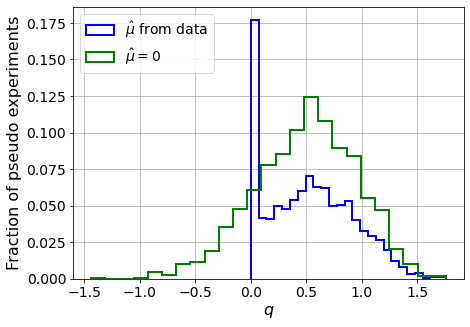

muhat mean:  -3.5078933397538594
Z_bins:  0.7227003919144694
std Z_bins:  0.2676988314569716
Z_bins mu=0:  0.7227003919144694
std Z_bins mu=0:  0.3133702837902873

--------

B_expected:  643
S_expected:  1



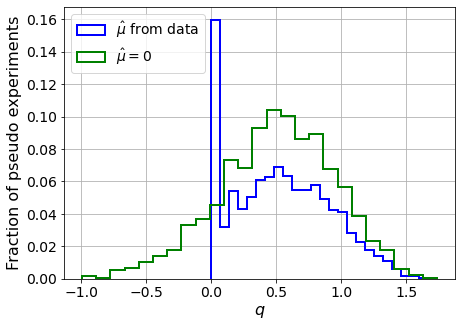

muhat mean:  -3.298133897006395
Z_bins:  0.7242393883796004
std Z_bins:  0.26247761867106373
Z_bins mu=0:  0.7242393883796004
std Z_bins mu=0:  0.3040166795848381

--------

B_expected:  643
S_expected:  1



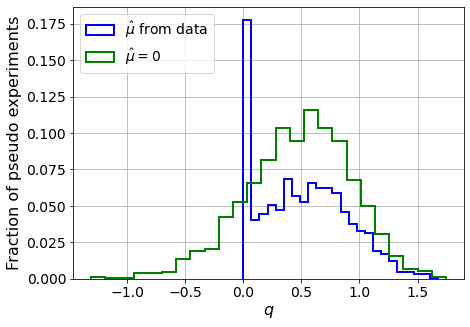

muhat mean:  -3.3348547222621283
Z_bins:  0.716017195622092
std Z_bins:  0.26565614241255403
Z_bins mu=0:  0.716017195622092
std Z_bins mu=0:  0.31541191461147194

--------

B_expected:  643
S_expected:  2



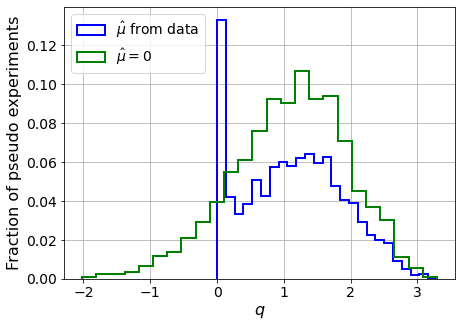

muhat mean:  -1.6485377077844405
Z_bins:  1.074080725441746
std Z_bins:  0.3491845093820561
Z_bins mu=0:  1.074080725441746
std Z_bins mu=0:  0.40047881051555595

--------

B_expected:  643
S_expected:  5



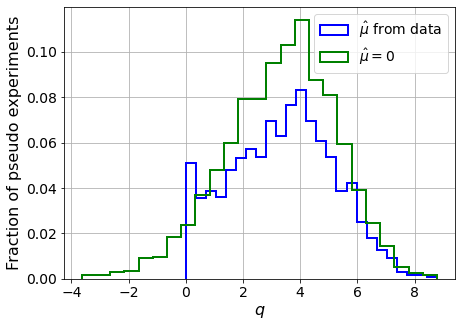

muhat mean:  -0.6827680217574473
Z_bins:  1.8680364094053905
std Z_bins:  0.47891960301087594
Z_bins mu=0:  1.8680364094053905
std Z_bins mu=0:  0.5177388273703092

--------

B_expected:  643
S_expected:  9



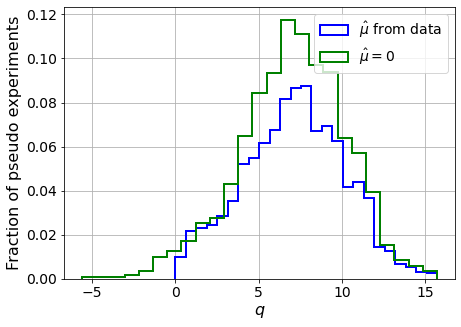

muhat mean:  -0.37718744233569546
Z_bins:  2.6750080429192744
std Z_bins:  0.5626993309528299
Z_bins mu=0:  2.6750080429192744
std Z_bins mu=0:  0.5976674857979

--------

B_expected:  643
S_expected:  18



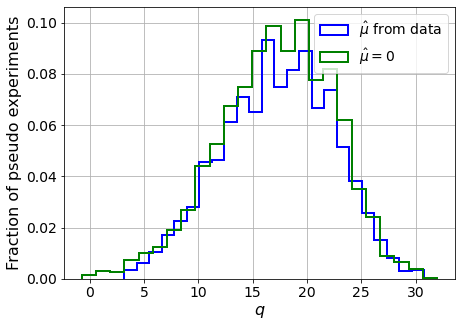

muhat mean:  -0.17486260094402567
Z_bins:  4.177573003562767
std Z_bins:  0.6091392044848847
Z_bins mu=0:  4.177573003562767
std Z_bins mu=0:  0.6297551336043733

--------

B_expected:  643
S_expected:  34



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


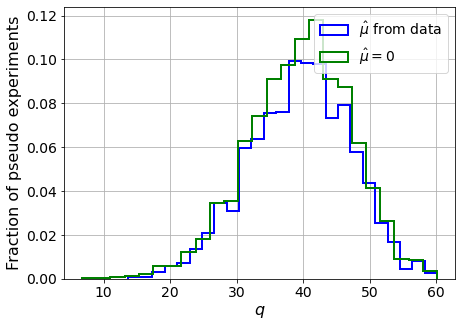

muhat mean:  -0.09859241986181763
Z_bins:  6.3124066906556076
std Z_bins:  0.5999869455058127
Z_bins mu=0:  6.3124066906556076
std Z_bins mu=0:  0.6143557109160044

--------

B_expected:  643
S_expected:  66



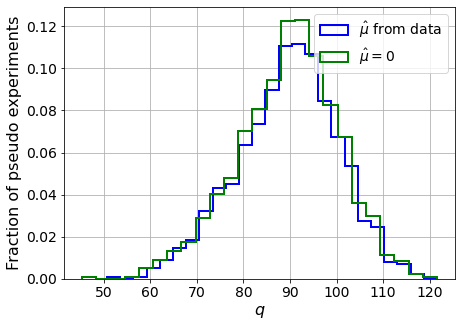

muhat mean:  -0.051762981202229406
Z_bins:  9.502159607108958
std Z_bins:  0.566675618819633
Z_bins mu=0:  9.502159607108958
std Z_bins mu=0:  0.5754690452046608

--------

B_expected:  643
S_expected:  126



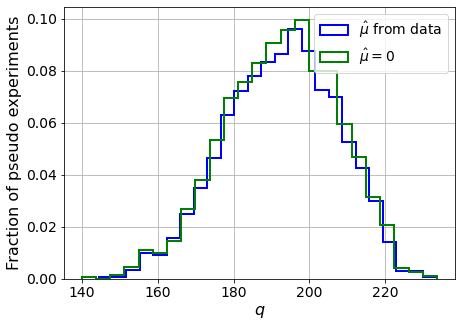

muhat mean:  -0.026995910438118574
Z_bins:  13.90544004918223
std Z_bins:  0.5269343654790832
Z_bins mu=0:  13.90544004918223
std Z_bins mu=0:  0.5319673733681125

--------

B_expected:  643
S_expected:  244



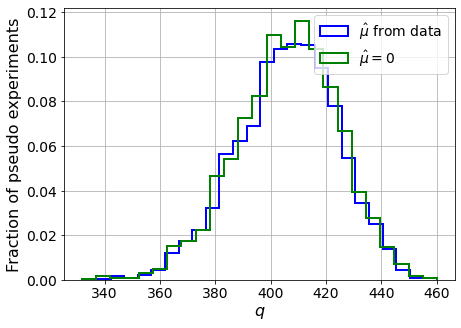

muhat mean:  -0.014463877359750512
Z_bins:  20.177598796171115
std Z_bins:  0.45052308003593117
Z_bins mu=0:  20.177598796171115
std Z_bins mu=0:  0.4542754871925892

--------

B_expected:  643
S_expected:  471



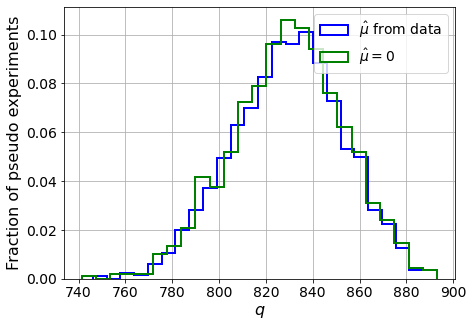

muhat mean:  -0.006880085653784447
Z_bins:  28.81166506877153
std Z_bins:  0.40856887741063846
Z_bins mu=0:  28.81166506877153
std Z_bins mu=0:  0.4110881434041071

--------


 FINAL RESULT:

[[0.7215840266448913, 0.2609787075008356, -3.2920132054404134, 0.7215840266448913, 0.30864054037082433], [0.7260876822385137, 0.26044937047417765, -3.314284873729971, 0.7260876822385137, 0.3038326455924963], [0.7270944425965911, 0.2591981000006712, -3.3472266907966346, 0.7270944425965911, 0.30554670827164415], [0.7227003919144694, 0.2676988314569716, -3.5078933397538594, 0.7227003919144694, 0.3133702837902873], [0.7242393883796004, 0.26247761867106373, -3.298133897006395, 0.7242393883796004, 0.3040166795848381], [0.716017195622092, 0.26565614241255403, -3.3348547222621283, 0.716017195622092, 0.31541191461147194], [1.074080725441746, 0.3491845093820561, -1.6485377077844405, 1.074080725441746, 0.40047881051555595], [1.8680364094053905, 0.47891960301087594, -0.6827680217574473, 1.8680364094053905, 0.

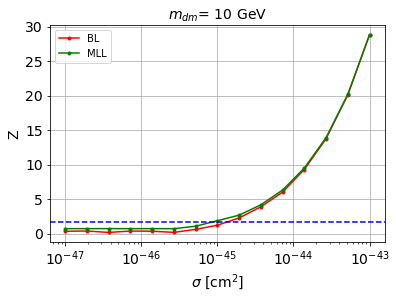


cross_BL_164:  1.3019903815405825e-45
cross_BL_164_up:  8.52821450008676e-46
cross_BL_164_down:  1.932170368411707e-45

cross_MLL_164:  8.303515863905588e-46
cross_MLL_164_up:  5.93252075759493e-46
cross_MLL_164_down:  1.2563695883064707e-45

#########################


#########################

mDM =  20 GeV


S_cs1.shape:  (33873,)
S_cs2.shape:  (33873,)
 NUM_DAT:  33001 

NUM_DAT_ER:  32580
NUM_DAT_AC:  116
NUM_DAT_CNNS:  1
NUM_DAT_RN:  30
NUM_DAT_WALL:  274

B_cs1cs2.shape:  (33001, 2)

S_cs1cs2.shape:  (33001, 2)


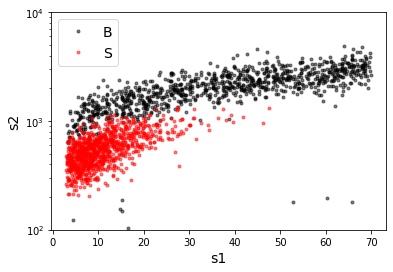

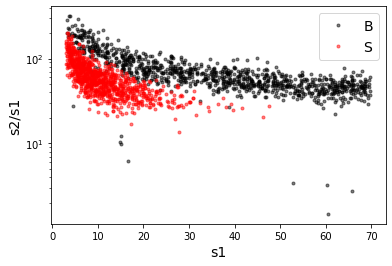

X_mon_B.shape:  (33001, 2)
X_mon_S.shape:  (33001, 2)
X_mon.shape:  (66002, 2)

X_mon_train :  (42075, 2)
y_mon_train :  (42075,)
X_mon_val :  (7426, 2)
y_mon_val :  (7426,)
X_mon_test :  (16501, 2)
y_mon_test :  (16501,)

Classification score:


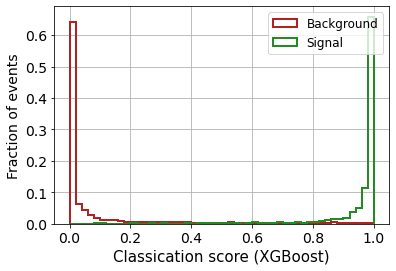


 ROC-AUC =  0.991591093893579
At least 5 B events per bin, range = [[0, 1]]:
# bins:  15 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  15
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2345


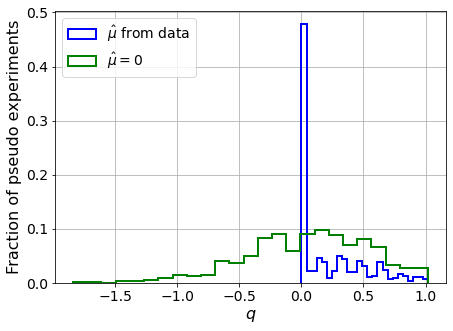

muhat mean:  0.12438446484085461
Z_bins:  0.2847172648499652
std Z_bins:  0.48743743085127633
Z_bins mu=0:  0.2847172648499652
std Z_bins mu=0:  0.8603855222247289

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.228


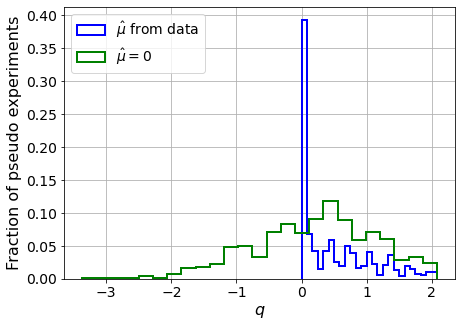

muhat mean:  0.11887966096514525
Z_bins:  0.48619690204346494
std Z_bins:  0.5806304967083267
Z_bins mu=0:  0.4853468920137792
std Z_bins mu=0:  0.9575729420751042

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2165


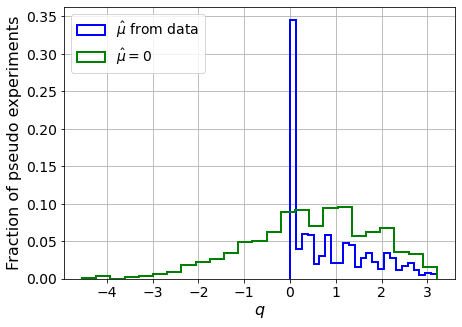

muhat mean:  0.0819893258344999
Z_bins:  0.7087583345253778
std Z_bins:  0.6199678187926002
Z_bins mu=0:  0.7065235263139785
std Z_bins mu=0:  0.9717115990081221

--------

B_expected:  643
S_expected:  6

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.212


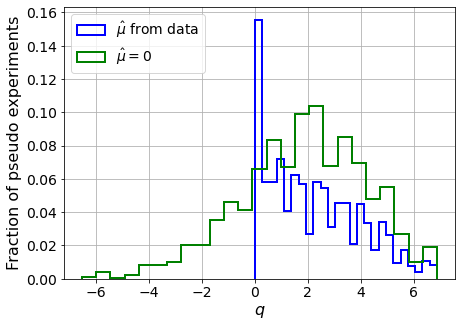

muhat mean:  0.04268822184051391
Z_bins:  1.3778298799348359
std Z_bins:  0.6355127558557145
Z_bins mu=0:  1.3774014861704846
std Z_bins mu=0:  0.8583492518642412

--------

B_expected:  643
S_expected:  12

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.211


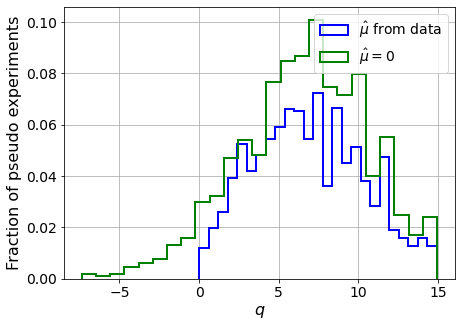

muhat mean:  -0.0028307911993094956
Z_bins:  2.593366518240103
std Z_bins:  0.658930659949937
Z_bins mu=0:  2.593366518240103
std Z_bins mu=0:  0.7740342147629703

--------

B_expected:  643
S_expected:  23

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.207


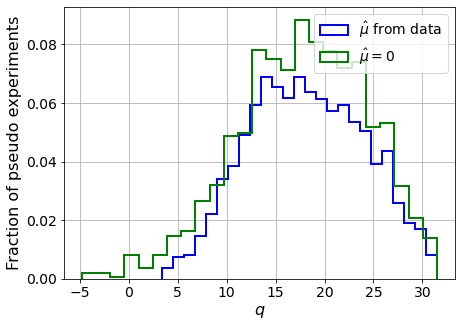

muhat mean:  0.006208454655552344
Z_bins:  4.2387923821559195
std Z_bins:  0.6921762566520959
Z_bins mu=0:  4.238365608927943
std Z_bins mu=0:  0.7763594529943936

--------

B_expected:  643
S_expected:  44

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2265


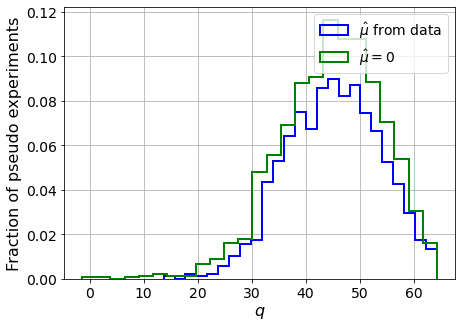

muhat mean:  0.0054511158832027855
Z_bins:  6.734509177202799
std Z_bins:  0.6335088568620943
Z_bins mu=0:  6.734328285596797
std Z_bins mu=0:  0.6929062515751114

--------

B_expected:  643
S_expected:  85

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2155


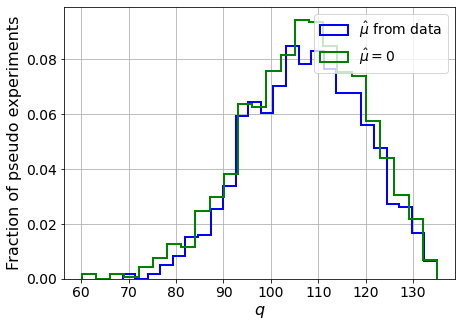

muhat mean:  0.000666083275520042
Z_bins:  10.375786138775451
std Z_bins:  0.5776448142854863
Z_bins mu=0:  10.375418705061213
std Z_bins mu=0:  0.6093632229173624

--------

B_expected:  643
S_expected:  165

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.218


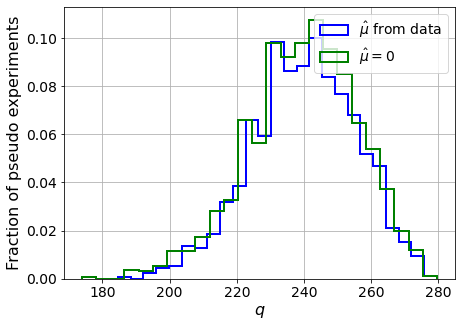

muhat mean:  0.00047927159148177347
Z_bins:  15.509447294260129
std Z_bins:  0.5006461003871064
Z_bins mu=0:  15.509061389245222
std Z_bins mu=0:  0.5225826849164703

--------

B_expected:  643
S_expected:  318

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.221


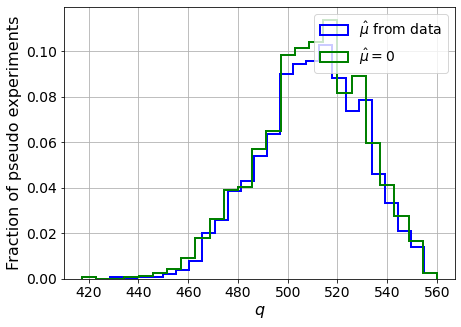

muhat mean:  0.00020089660297485824
Z_bins:  22.59756906032506
std Z_bins:  0.4536884422552838
Z_bins mu=0:  22.59633544073849
std Z_bins mu=0:  0.46863056834375083

--------

B_expected:  643
S_expected:  615

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.23


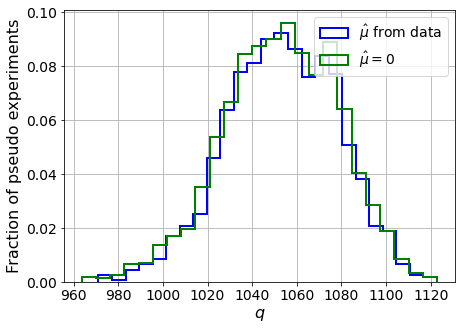

muhat mean:  0.00037276014352456693
Z_bins:  32.46157810712624
std Z_bins:  0.385475369440629
Z_bins mu=0:  32.46132118396725
std Z_bins mu=0:  0.39599825699295765

--------

B_expected:  643
S_expected:  1187

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2145


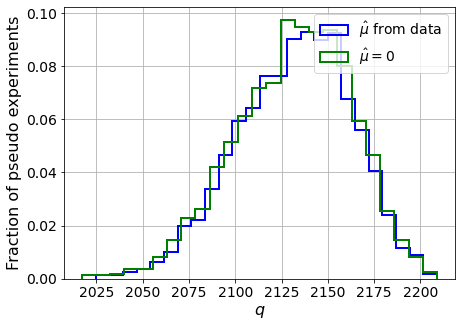

muhat mean:  0.00017003731445425075
Z_bins:  46.194197177184165
std Z_bins:  0.3326954779252722
Z_bins mu=0:  46.19359936835059
std Z_bins mu=0:  0.33954829952519644

--------

B_expected:  643
S_expected:  2291

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.229


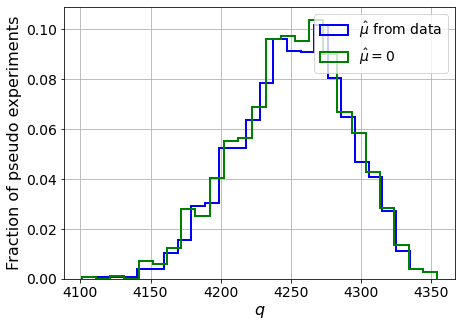

muhat mean:  0.00020686177156268847
Z_bins:  65.21979716558454
std Z_bins:  0.29867104577614534
Z_bins mu=0:  65.21959319115561
std Z_bins mu=0:  0.3045020375640025

--------

B_expected:  643
S_expected:  4424

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1955


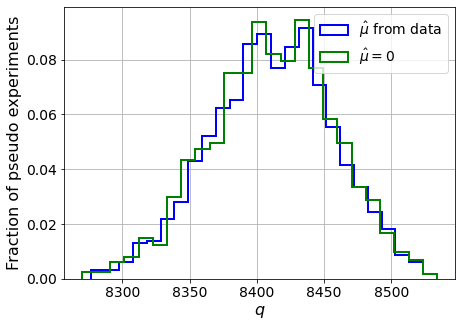

muhat mean:  2.5927312503753432e-05
Z_bins:  91.72230628283266
std Z_bins:  0.24760525328563618
Z_bins mu=0:  91.72191718584735
std Z_bins mu=0:  0.25058428175581354

--------

B_expected:  643
S_expected:  8542

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2275


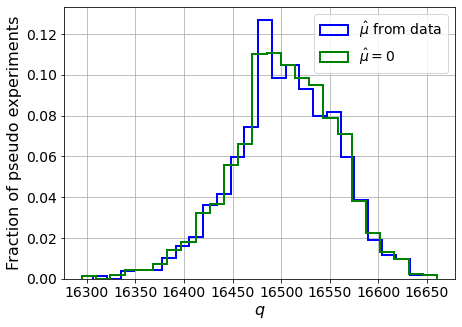

muhat mean:  3.982681455443204e-05
Z_bins:  128.47162829683336
std Z_bins:  0.2083763901153392
Z_bins mu=0:  128.47162829683336
std Z_bins mu=0:  0.210827209281613

--------


 FINAL RESULT:

[[0.2847172648499652, 0.48743743085127633, 0.12438446484085461, 0.2847172648499652, 0.8603855222247289], [0.48619690204346494, 0.5806304967083267, 0.11887966096514525, 0.4853468920137792, 0.9575729420751042], [0.7087583345253778, 0.6199678187926002, 0.0819893258344999, 0.7065235263139785, 0.9717115990081221], [1.3778298799348359, 0.6355127558557145, 0.04268822184051391, 1.3774014861704846, 0.8583492518642412], [2.593366518240103, 0.658930659949937, -0.0028307911993094956, 2.593366518240103, 0.7740342147629703], [4.2387923821559195, 0.6921762566520959, 0.006208454655552344, 4.238365608927943, 0.7763594529943936], [6.734509177202799, 0.6335088568620943, 0.0054511158832027855, 6.734328285596797, 0.6929062515751114], [10.375786138775451, 0.5776448142854863, 0.000666083275520042, 10.375418705061213, 0.

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 359.55610036 317.32679539 274.35244308 225.16234644
 167.2483751  105.5647411   40.07349255 -25.51407489 -95.51195331]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [           -inf            -inf            -inf            -inf
            -inf            -inf            -inf            -inf
            -inf            -inf            -inf            -inf
       

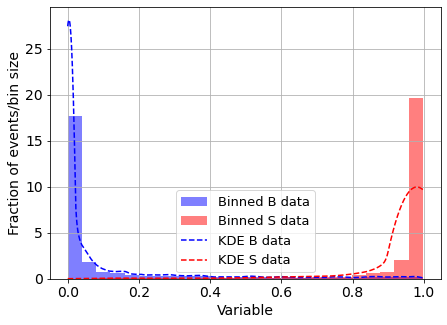

KDE Kernel:  epanechnikov
Background bandwidth:  0.022117541055781564
Signal bandwidth:  0.0964296357589577
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



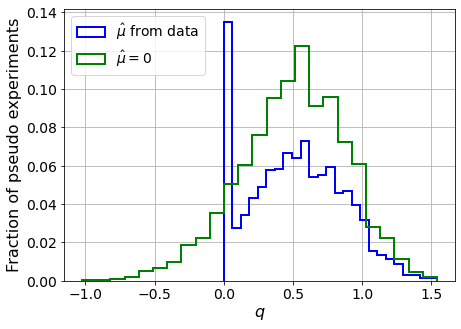

muhat mean:  -4.913531401542208
Z_bins:  0.7255789806529355
std Z_bins:  0.2338970699475271
Z_bins mu=0:  0.7255789806529355
std Z_bins mu=0:  0.26341628689670704

--------

B_expected:  643
S_expected:  2



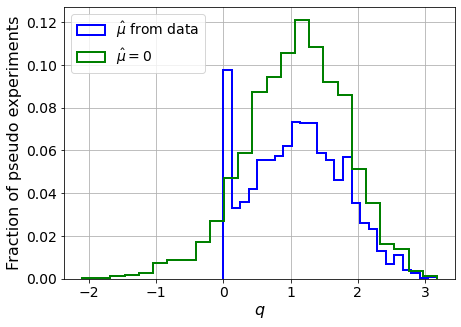

muhat mean:  -2.3723998167632674
Z_bins:  1.0582241773958074
std Z_bins:  0.3164954508652093
Z_bins mu=0:  1.0582241773958074
std Z_bins mu=0:  0.352957878704602

--------

B_expected:  643
S_expected:  3



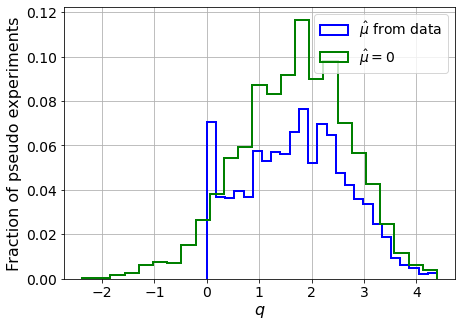

muhat mean:  -1.4778047380061625
Z_bins:  1.31893582016831
std Z_bins:  0.3676016876229228
Z_bins mu=0:  1.31893582016831
std Z_bins mu=0:  0.39696206569877457

--------

B_expected:  643
S_expected:  6



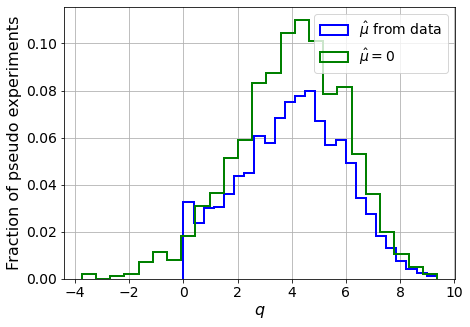

muhat mean:  -0.7842467773978167
Z_bins:  2.0272129048377776
std Z_bins:  0.47081774589511205
Z_bins mu=0:  2.0272129048377776
std Z_bins mu=0:  0.4984872624808345

--------

B_expected:  643
S_expected:  12



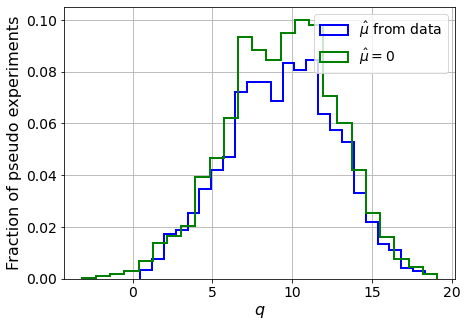

muhat mean:  -0.38379112451594016
Z_bins:  3.077637913781584
std Z_bins:  0.551881927309832
Z_bins mu=0:  3.077637913781584
std Z_bins mu=0:  0.5669955887579591

--------

B_expected:  643
S_expected:  23



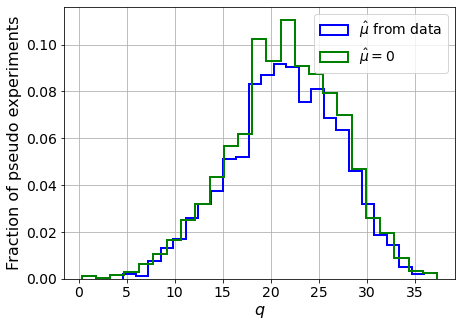

muhat mean:  -0.1943701884549504
Z_bins:  4.650558750955154
std Z_bins:  0.6079660614774925
Z_bins mu=0:  4.650558750955154
std Z_bins mu=0:  0.62090277997714

--------

B_expected:  643
S_expected:  44



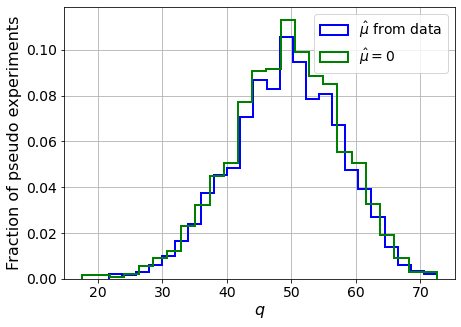

muhat mean:  -0.10500772670460057
Z_bins:  7.023067241738622
std Z_bins:  0.5958619898726876
Z_bins mu=0:  7.023067241738622
std Z_bins mu=0:  0.6045681410685192

--------

B_expected:  643
S_expected:  85



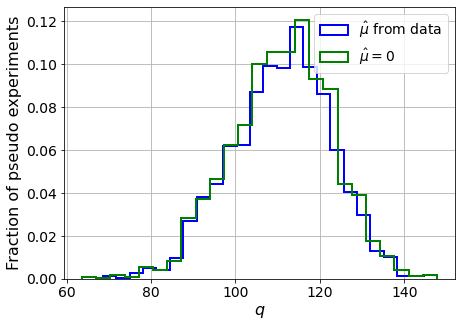

muhat mean:  -0.056698890716470794
Z_bins:  10.564898767382536
std Z_bins:  0.5586375223480244
Z_bins mu=0:  10.564898767382536
std Z_bins mu=0:  0.5640173025687887

--------

B_expected:  643
S_expected:  165



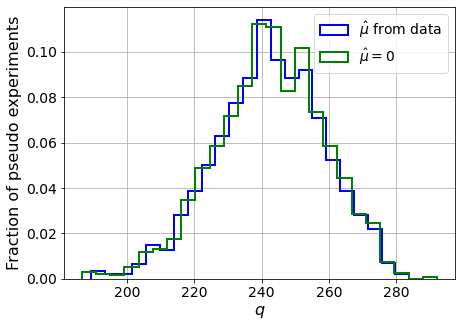

muhat mean:  -0.027950003109630018
Z_bins:  15.578563031237268
std Z_bins:  0.515420793835784
Z_bins mu=0:  15.578563031237268
std Z_bins mu=0:  0.5186275033301361

--------

B_expected:  643
S_expected:  318



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


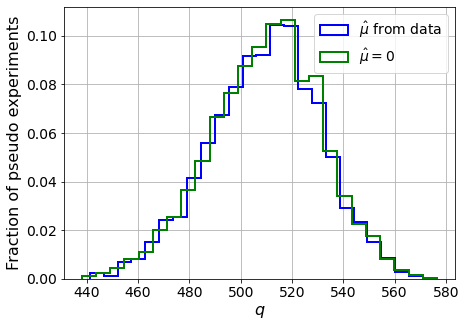

muhat mean:  -0.014757953921170434
Z_bins:  22.603542399213985
std Z_bins:  0.4739143523249014
Z_bins mu=0:  22.603542399213985
std Z_bins mu=0:  0.4762457949611427

--------

B_expected:  643
S_expected:  615



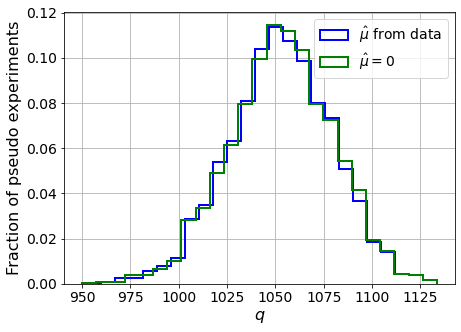

muhat mean:  -0.007562576151918791
Z_bins:  32.4551599397997
std Z_bins:  0.41192080019125715
Z_bins mu=0:  32.4551599397997
std Z_bins mu=0:  0.41337574797170307

--------

B_expected:  643
S_expected:  1187



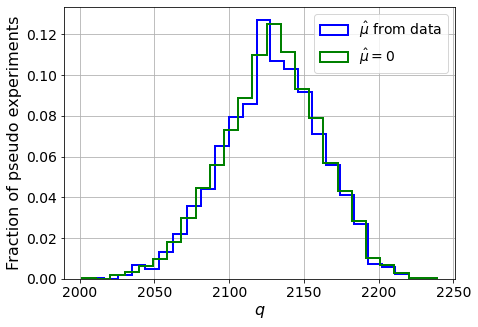

muhat mean:  -0.003896779475164455
Z_bins:  46.13910631836807
std Z_bins:  0.3602828632888862
Z_bins mu=0:  46.13910500714989
std Z_bins mu=0:  0.36149895867408577

--------

B_expected:  643
S_expected:  2291



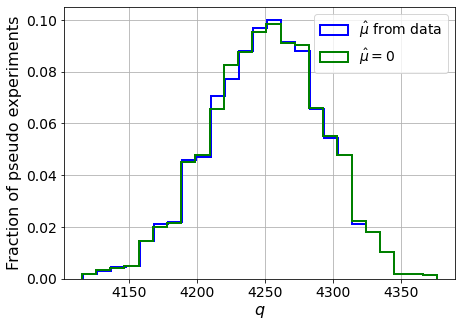

muhat mean:  -0.001956739766613266
Z_bins:  65.2036187256678
std Z_bins:  0.32006646252170257
Z_bins mu=0:  65.2036187256678
std Z_bins mu=0:  0.32084931098461794

--------

B_expected:  643
S_expected:  4424



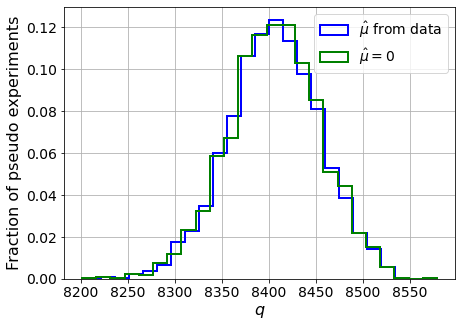

muhat mean:  -0.0010774439632124215
Z_bins:  91.68096263078642
std Z_bins:  0.26788506409821633
Z_bins mu=0:  91.68096263078642
std Z_bins mu=0:  0.2684059097132551

--------

B_expected:  643
S_expected:  8542



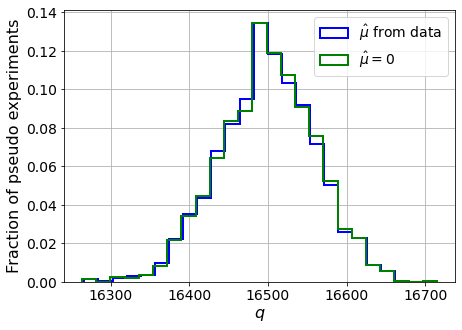

muhat mean:  -0.0005184826530867824
Z_bins:  128.45131053385393
std Z_bins:  0.23617117425276707
Z_bins mu=0:  128.45131053385393
std Z_bins mu=0:  0.23651149111802094

--------


 FINAL RESULT:

[[0.7255789806529355, 0.2338970699475271, -4.913531401542208, 0.7255789806529355, 0.26341628689670704], [1.0582241773958074, 0.3164954508652093, -2.3723998167632674, 1.0582241773958074, 0.352957878704602], [1.31893582016831, 0.3676016876229228, -1.4778047380061625, 1.31893582016831, 0.39696206569877457], [2.0272129048377776, 0.47081774589511205, -0.7842467773978167, 2.0272129048377776, 0.4984872624808345], [3.077637913781584, 0.551881927309832, -0.38379112451594016, 3.077637913781584, 0.5669955887579591], [4.650558750955154, 0.6079660614774925, -0.1943701884549504, 4.650558750955154, 0.62090277997714], [7.023067241738622, 0.5958619898726876, -0.10500772670460057, 7.023067241738622, 0.6045681410685192], [10.564898767382536, 0.5586375223480244, -0.056698890716470794, 10.564898767382536, 0.564017

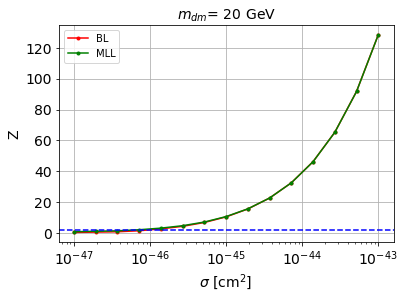


cross_BL_164:  8.294046411837459e-47
cross_BL_164_up:  5.02729049791531e-47
cross_BL_164_down:  1.232186778738092e-46

cross_MLL_164:  5.022775133143472e-47
cross_MLL_164_up:  3.5895782819063715e-47
cross_MLL_164_down:  7.617017764945001e-47

#########################


#########################

mDM =  35 GeV


S_cs1.shape:  (33697,)
S_cs2.shape:  (33697,)
 NUM_DAT:  33084 

NUM_DAT_ER:  32663
NUM_DAT_AC:  116
NUM_DAT_CNNS:  1
NUM_DAT_RN:  30
NUM_DAT_WALL:  274

B_cs1cs2.shape:  (33084, 2)

S_cs1cs2.shape:  (33084, 2)


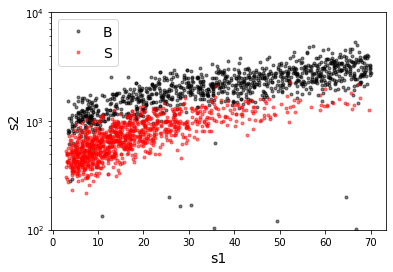

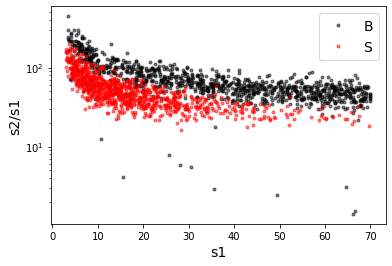

X_mon_B.shape:  (33084, 2)
X_mon_S.shape:  (33084, 2)
X_mon.shape:  (66168, 2)

X_mon_train :  (42182, 2)
y_mon_train :  (42182,)
X_mon_val :  (7444, 2)
y_mon_val :  (7444,)
X_mon_test :  (16542, 2)
y_mon_test :  (16542,)

Classification score:


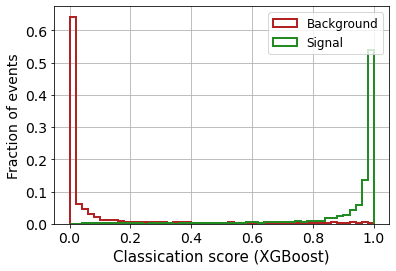


 ROC-AUC =  0.9862017513002134
At least 5 B events per bin, range = [[0, 1]]:
# bins:  16 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  16
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.22


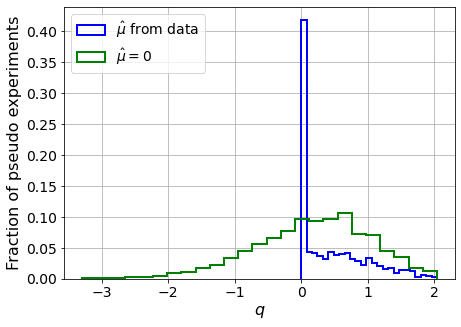

muhat mean:  0.10877717010974693
Z_bins:  0.486393434103675
std Z_bins:  0.5260934740229511
Z_bins mu=0:  0.486393434103675
std Z_bins mu=0:  0.8921078891991391

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2055


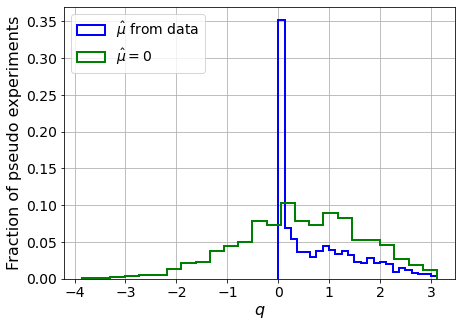

muhat mean:  0.030839218481396414
Z_bins:  0.6861073459637864
std Z_bins:  0.589947468939965
Z_bins mu=0:  0.6861073459637864
std Z_bins mu=0:  0.8862927059141098

--------

B_expected:  643
S_expected:  7

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.196


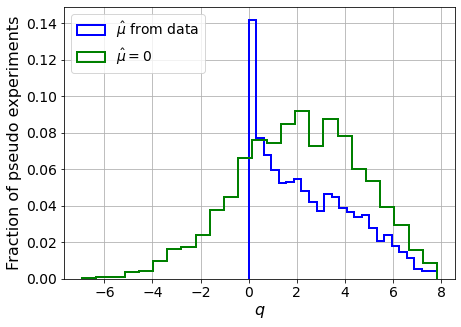

muhat mean:  0.023893192368966264
Z_bins:  1.471837425817402
std Z_bins:  0.6656094371258526
Z_bins mu=0:  1.4712885984924495
std Z_bins mu=0:  0.8675491807835435

--------

B_expected:  643
S_expected:  13

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.201


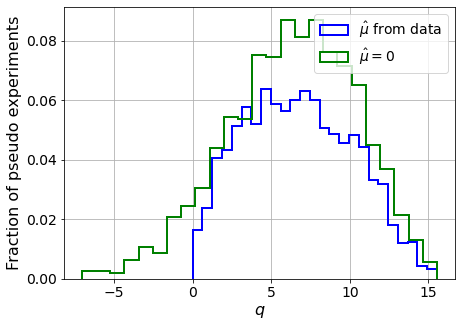

muhat mean:  -6.026526414208121e-05
Z_bins:  2.5601175627275796
std Z_bins:  0.6743609372564242
Z_bins mu=0:  2.5601175627275796
std Z_bins mu=0:  0.7959230673464375

--------

B_expected:  643
S_expected:  25

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.216


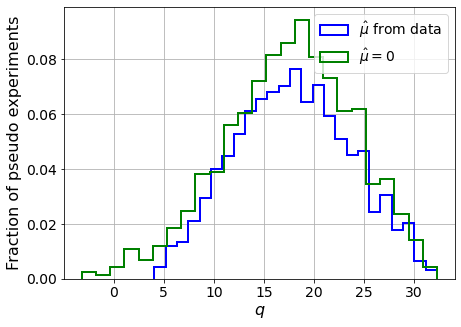

muhat mean:  0.00576910692307208
Z_bins:  4.231349080598261
std Z_bins:  0.6806891010207178
Z_bins mu=0:  4.230864078204921
std Z_bins mu=0:  0.7610275469462757

--------

B_expected:  643
S_expected:  48

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2175


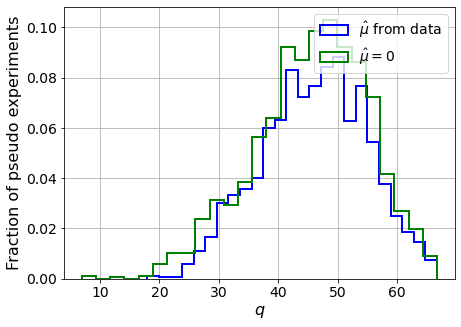

muhat mean:  -0.0001704222582252381
Z_bins:  6.825205542239957
std Z_bins:  0.6475413237733779
Z_bins mu=0:  6.825205542239957
std Z_bins mu=0:  0.7009818699513152

--------

B_expected:  643
S_expected:  93

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.198


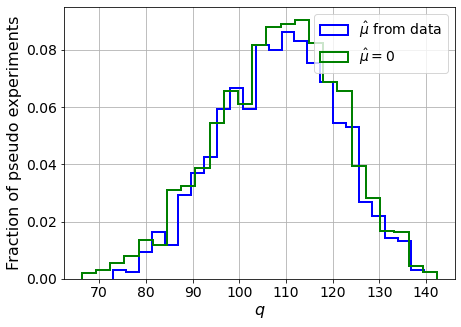

muhat mean:  0.004378858853887847
Z_bins:  10.444112381125594
std Z_bins:  0.6031564323541458
Z_bins mu=0:  10.442433761715542
std Z_bins mu=0:  0.6394747749215988

--------

B_expected:  643
S_expected:  179

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.221


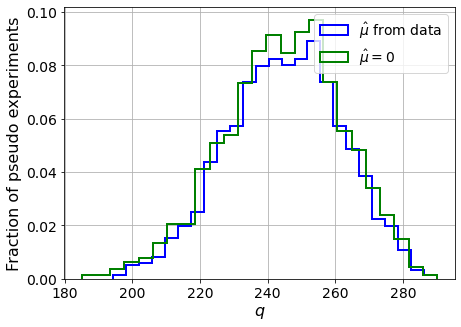

muhat mean:  0.0017148261370122724
Z_bins:  15.67007314328721
std Z_bins:  0.5373202733797438
Z_bins mu=0:  15.67007314328721
std Z_bins mu=0:  0.5597111841838194

--------

B_expected:  643
S_expected:  345

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.204


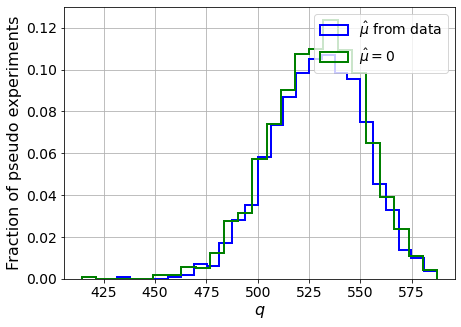

muhat mean:  -0.00011865846331453026
Z_bins:  23.0301919578407
std Z_bins:  0.4782033705701911
Z_bins mu=0:  23.02960662265992
std Z_bins mu=0:  0.49381772036939736

--------

B_expected:  643
S_expected:  666

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1965


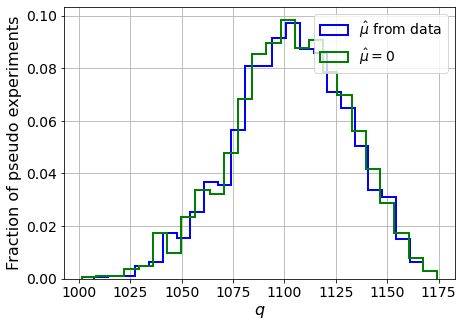

muhat mean:  0.00020279456968955715
Z_bins:  33.22663185518051
std Z_bins:  0.41887250247605917
Z_bins mu=0:  33.22330322877985
std Z_bins mu=0:  0.4286522531414788

--------

B_expected:  643
S_expected:  1286

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.19


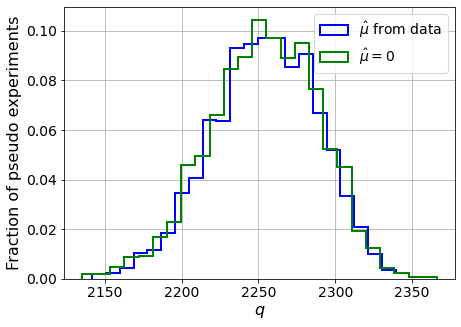

muhat mean:  0.00013075185242021026
Z_bins:  47.48720656833657
std Z_bins:  0.3651995751944033
Z_bins mu=0:  47.48620154750673
std Z_bins mu=0:  0.37250161337309423

--------

B_expected:  643
S_expected:  2484

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2105


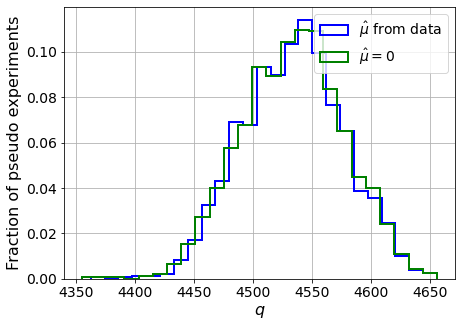

muhat mean:  9.405418570250047e-05
Z_bins:  67.34363165593975
std Z_bins:  0.3168259777505328
Z_bins mu=0:  67.3409980213607
std Z_bins mu=0:  0.32155928789248384

--------

B_expected:  643
S_expected:  4795

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2025


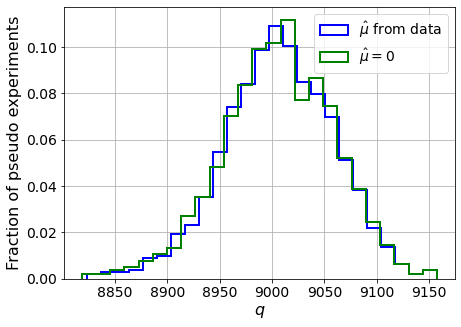

muhat mean:  2.568895191613179e-05
Z_bins:  94.90438655959713
std Z_bins:  0.2762394745030421
Z_bins mu=0:  94.90438655959713
std Z_bins mu=0:  0.27944032346219416

--------

B_expected:  643
S_expected:  9258

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.198


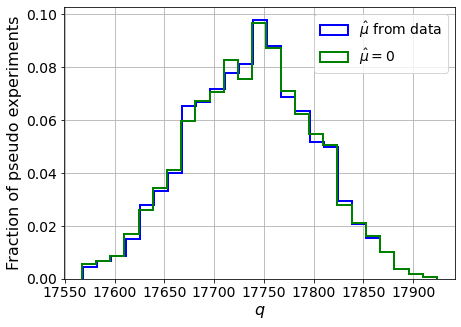

muhat mean:  2.4107299435374944e-05
Z_bins:  133.1888542364748
std Z_bins:  0.23508110528772147
Z_bins mu=0:  133.1878991425251
std Z_bins mu=0:  0.23705738030523338

--------

B_expected:  643
S_expected:  17875

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2185


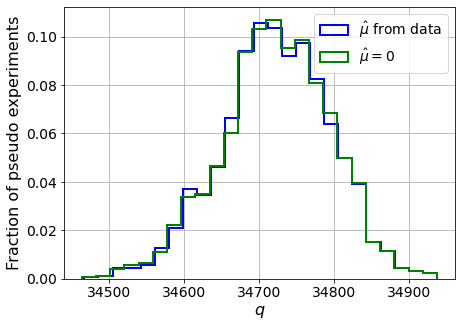

muhat mean:  1.2786629123164987e-05
Z_bins:  186.33916414793148
std Z_bins:  0.19406447661031642
Z_bins mu=0:  186.33916414793148
std Z_bins mu=0:  0.19560254462317925

--------


 FINAL RESULT:

[[0.486393434103675, 0.5260934740229511, 0.10877717010974693, 0.486393434103675, 0.8921078891991391], [0.6861073459637864, 0.589947468939965, 0.030839218481396414, 0.6861073459637864, 0.8862927059141098], [1.471837425817402, 0.6656094371258526, 0.023893192368966264, 1.4712885984924495, 0.8675491807835435], [2.5601175627275796, 0.6743609372564242, -6.026526414208121e-05, 2.5601175627275796, 0.7959230673464375], [4.231349080598261, 0.6806891010207178, 0.00576910692307208, 4.230864078204921, 0.7610275469462757], [6.825205542239957, 0.6475413237733779, -0.0001704222582252381, 6.825205542239957, 0.7009818699513152], [10.444112381125594, 0.6031564323541458, 0.004378858853887847, 10.442433761715542, 0.6394747749215988], [15.67007314328721, 0.5373202733797438, 0.0017148261370122724, 15.67007314328721,

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 360.54348962 319.76543241 277.20236489 228.43200133
 171.46740732 106.27464255  41.59812974 -27.74330803 -96.66557289]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf 286.65331519 238.99670801
 186

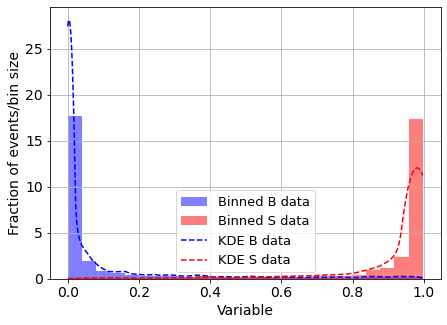

KDE Kernel:  epanechnikov
Background bandwidth:  0.022117541055781564
Signal bandwidth:  0.059027261020128646
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  2



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


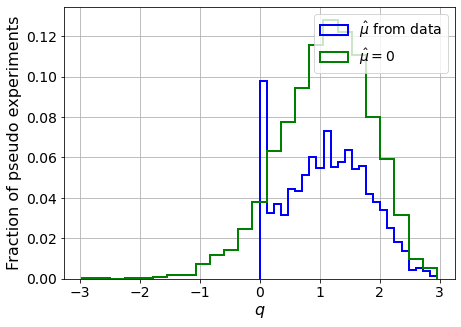

muhat mean:  -2.722372781657216
Z_bins:  1.066277537089377
std Z_bins:  0.3185853047115027
Z_bins mu=0:  1.066277537089377
std Z_bins mu=0:  0.3611240610537806

--------

B_expected:  643
S_expected:  3



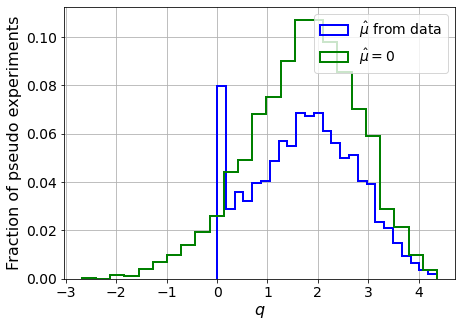

muhat mean:  -1.7632755654433216
Z_bins:  1.3382746288762346
std Z_bins:  0.3719162683764397
Z_bins mu=0:  1.3382746288762346
std Z_bins mu=0:  0.4073833000461121

--------

B_expected:  643
S_expected:  7



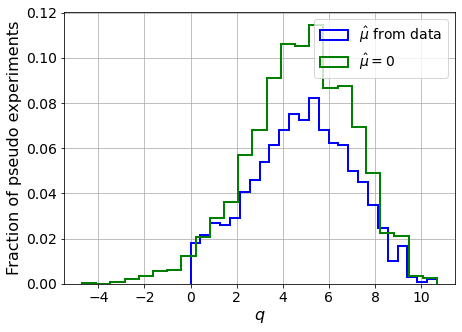

muhat mean:  -0.7554345628132115
Z_bins:  2.2142181420604974
std Z_bins:  0.4862943824125838
Z_bins mu=0:  2.2142181420604974
std Z_bins mu=0:  0.5129077079862034

--------

B_expected:  643
S_expected:  13



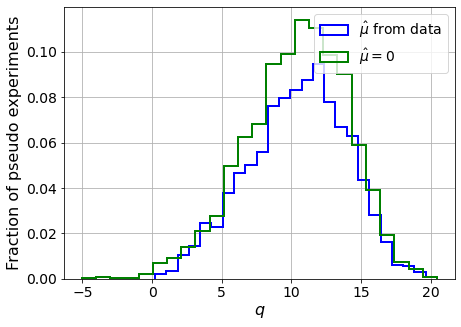

muhat mean:  -0.40815310689102197
Z_bins:  3.2693072525047104
std Z_bins:  0.540638397440694
Z_bins mu=0:  3.2693072525047104
std Z_bins mu=0:  0.5591480817424482

--------

B_expected:  643
S_expected:  25



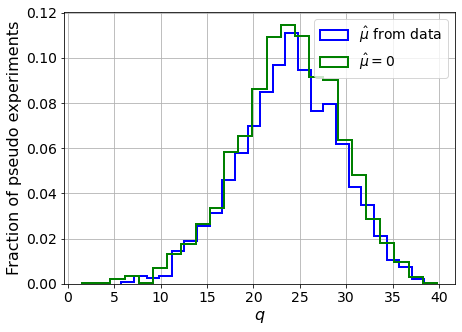

muhat mean:  -0.21319566552213745
Z_bins:  4.903553867110981
std Z_bins:  0.5582533162421048
Z_bins mu=0:  4.903553867110981
std Z_bins mu=0:  0.5686788132463036

--------

B_expected:  643
S_expected:  48



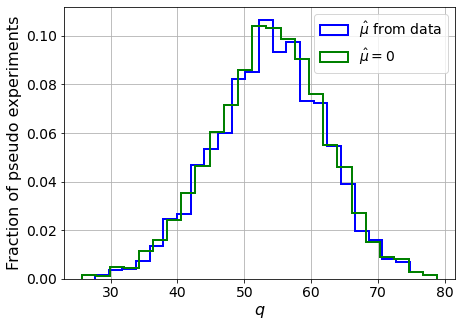

muhat mean:  -0.11357775925695573
Z_bins:  7.348127744208527
std Z_bins:  0.5640535352500555
Z_bins mu=0:  7.348127744208527
std Z_bins mu=0:  0.5691378645045435

--------

B_expected:  643
S_expected:  93



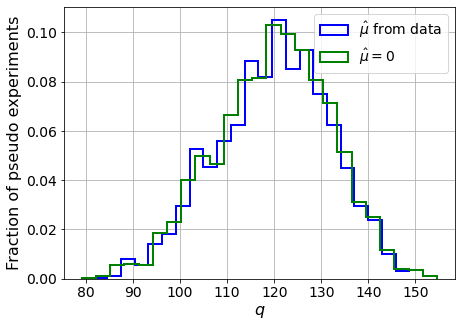

muhat mean:  -0.05527124660341228
Z_bins:  10.977125296307037
std Z_bins:  0.5480044691187851
Z_bins mu=0:  10.977125296307037
std Z_bins mu=0:  0.5519659872984447

--------

B_expected:  643
S_expected:  179



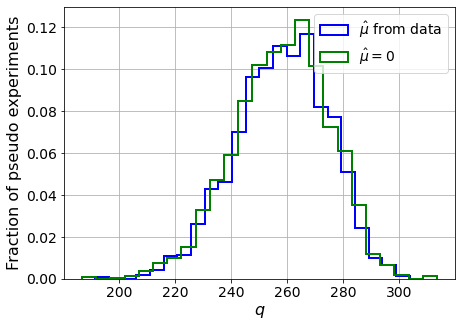

muhat mean:  -0.032095261583272784
Z_bins:  16.094755783080586
std Z_bins:  0.5201483049342192
Z_bins mu=0:  16.094755783080586
std Z_bins mu=0:  0.5239032808476407

--------

B_expected:  643
S_expected:  345



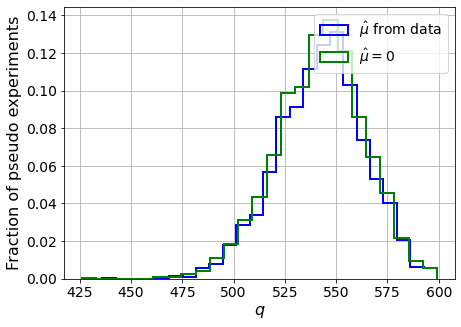

muhat mean:  -0.01493765548503083
Z_bins:  23.3090372381057
std Z_bins:  0.45962188019731154
Z_bins mu=0:  23.3090372381057
std Z_bins mu=0:  0.4622222781884712

--------

B_expected:  643
S_expected:  666



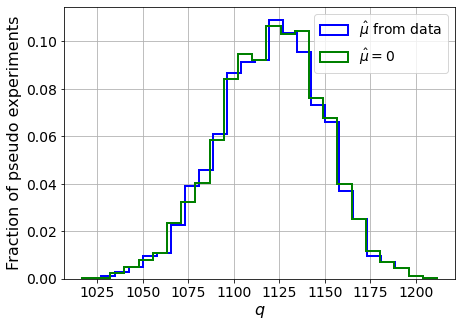

muhat mean:  -0.007962746213018656
Z_bins:  33.48592952816428
std Z_bins:  0.42444517775674667
Z_bins mu=0:  33.48592952816428
std Z_bins mu=0:  0.42586572662372973

--------

B_expected:  643
S_expected:  1286



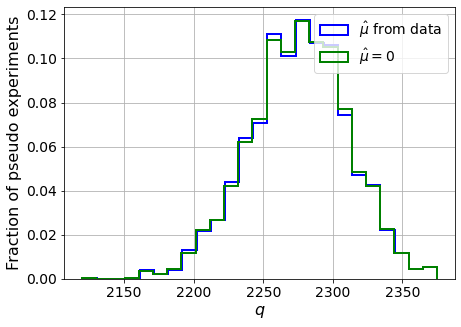

muhat mean:  -0.004144430825679411
Z_bins:  47.7094113316469
std Z_bins:  0.37196497641217663
Z_bins mu=0:  47.7094113316469
std Z_bins mu=0:  0.37280122006588

--------

B_expected:  643
S_expected:  2484



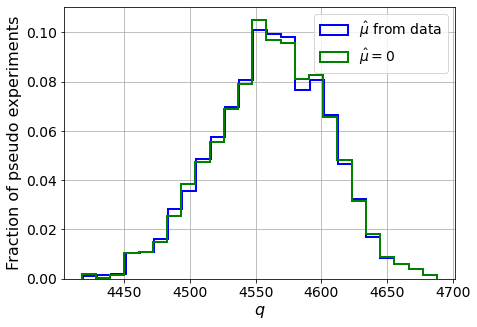

muhat mean:  -0.002179245168981447
Z_bins:  67.54937534195648
std Z_bins:  0.3215965986764747
Z_bins mu=0:  67.54937534195648
std Z_bins mu=0:  0.32208526999025633

--------

B_expected:  643
S_expected:  4795



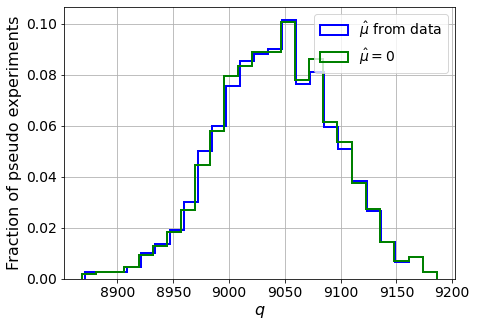

muhat mean:  -0.0010748947621337195
Z_bins:  95.0945672174317
std Z_bins:  0.2744149188683765
Z_bins mu=0:  95.0945672174317
std Z_bins mu=0:  0.2748154892710172

--------

B_expected:  643
S_expected:  9258



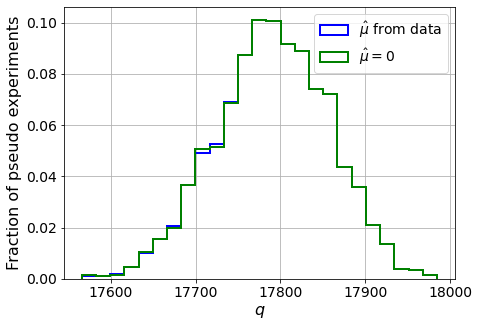

muhat mean:  -0.0005379540847655961
Z_bins:  133.3842101076774
std Z_bins:  0.24694958471367467
Z_bins mu=0:  133.3842101076774
std Z_bins mu=0:  0.2472758114836973

--------

B_expected:  643
S_expected:  17875



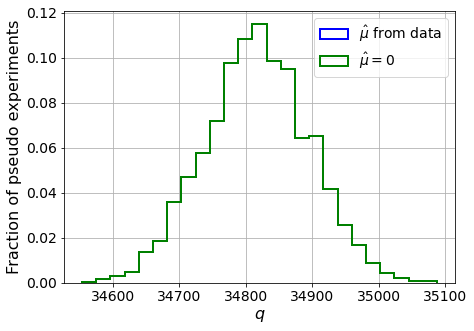

muhat mean:  -0.000284973960813395
Z_bins:  186.59396733104515
std Z_bins:  0.21011071560322125
Z_bins mu=0:  186.59396733104515
std Z_bins mu=0:  0.21028780734047728

--------


 FINAL RESULT:

[[1.066277537089377, 0.3185853047115027, -2.722372781657216, 1.066277537089377, 0.3611240610537806], [1.3382746288762346, 0.3719162683764397, -1.7632755654433216, 1.3382746288762346, 0.4073833000461121], [2.2142181420604974, 0.4862943824125838, -0.7554345628132115, 2.2142181420604974, 0.5129077079862034], [3.2693072525047104, 0.540638397440694, -0.40815310689102197, 3.2693072525047104, 0.5591480817424482], [4.903553867110981, 0.5582533162421048, -0.21319566552213745, 4.903553867110981, 0.5686788132463036], [7.348127744208527, 0.5640535352500555, -0.11357775925695573, 7.348127744208527, 0.5691378645045435], [10.977125296307037, 0.5480044691187851, -0.05527124660341228, 10.977125296307037, 0.5519659872984447], [16.094755783080586, 0.5201483049342192, -0.032095261583272784, 16.094755783080586, 0.5

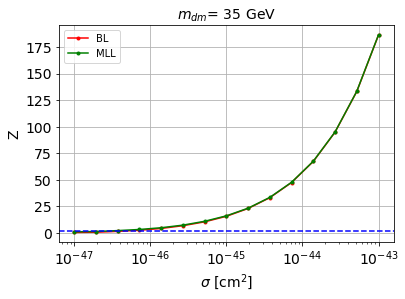


cross_BL_164:  4.126459090214003e-47
cross_BL_164_up:  2.5493584782147247e-47
cross_BL_164_down:  6.53083226994854e-47

cross_MLL_164:  2.605747869556403e-47
cross_MLL_164_up:  1.8427386775663761e-47
cross_MLL_164_down:  3.518245986452911e-47

#########################


#########################

mDM =  50 GeV


S_cs1.shape:  (35287,)
S_cs2.shape:  (35287,)
 NUM_DAT:  34105 

NUM_DAT_ER:  33671
NUM_DAT_AC:  119
NUM_DAT_CNNS:  1
NUM_DAT_RN:  31
NUM_DAT_WALL:  283

B_cs1cs2.shape:  (34105, 2)

S_cs1cs2.shape:  (34105, 2)


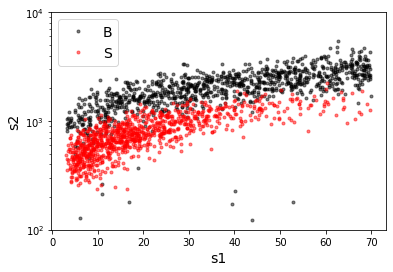

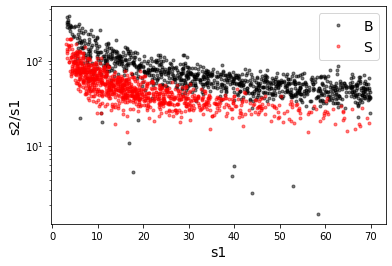

X_mon_B.shape:  (34105, 2)
X_mon_S.shape:  (34105, 2)
X_mon.shape:  (68210, 2)

X_mon_train :  (43483, 2)
y_mon_train :  (43483,)
X_mon_val :  (7674, 2)
y_mon_val :  (7674,)
X_mon_test :  (17053, 2)
y_mon_test :  (17053,)

Classification score:


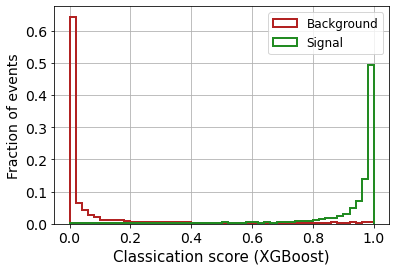


 ROC-AUC =  0.982592312602827
At least 5 B events per bin, range = [[0, 1]]:
# bins:  15 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  15
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2115


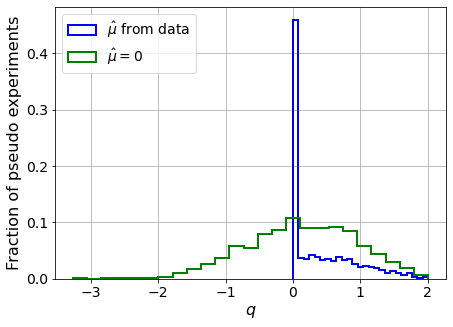

muhat mean:  0.14178575607532137
Z_bins:  0.4074157862307322
std Z_bins:  0.5998462163342494
Z_bins mu=0:  0.40636857920477204
std Z_bins mu=0:  0.9867748778336621

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.204


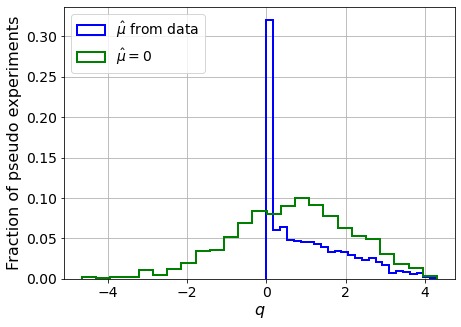

muhat mean:  0.03459155521238711
Z_bins:  0.8495817546171447
std Z_bins:  0.611095275758952
Z_bins mu=0:  0.8495817546171447
std Z_bins mu=0:  0.8900918373689761

--------

B_expected:  643
S_expected:  7

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1945


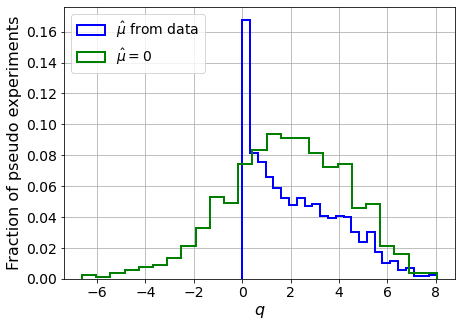

muhat mean:  0.02781002891381845
Z_bins:  1.3852415012201387
std Z_bins:  0.6665054802094204
Z_bins mu=0:  1.3850968308222058
std Z_bins mu=0:  0.8853319238353613

--------

B_expected:  643
S_expected:  14

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2115


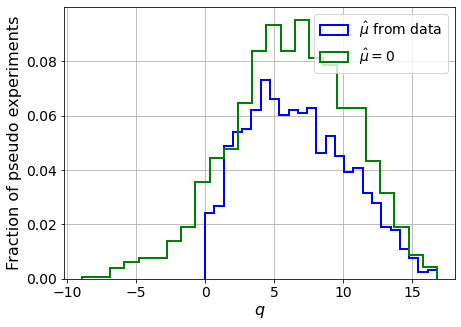

muhat mean:  0.018803114214560192
Z_bins:  2.5193856425698704
std Z_bins:  0.7231725959233154
Z_bins mu=0:  2.519203965815585
std Z_bins mu=0:  0.8641576806966823

--------

B_expected:  643
S_expected:  27

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2135


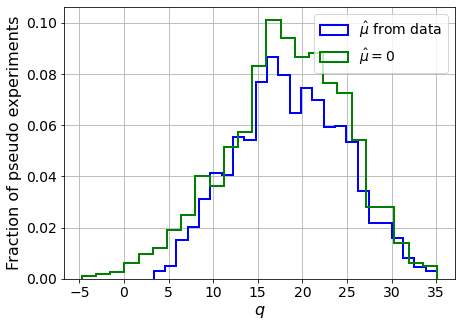

muhat mean:  0.006051552390388544
Z_bins:  4.293925821058882
std Z_bins:  0.7046716961434252
Z_bins mu=0:  4.2936714201063575
std Z_bins mu=0:  0.78785516370773

--------

B_expected:  643
S_expected:  51

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.219


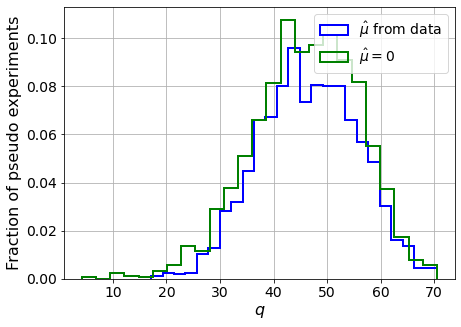

muhat mean:  0.0052481214873799364
Z_bins:  6.816016166353453
std Z_bins:  0.6680000999992759
Z_bins mu=0:  6.813843183517424
std Z_bins mu=0:  0.7244800196956273

--------

B_expected:  643
S_expected:  99

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2135


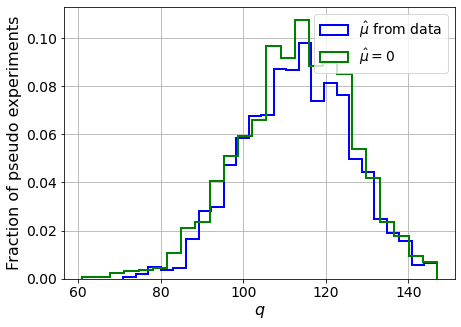

muhat mean:  0.0024605528893778023
Z_bins:  10.643386873263397
std Z_bins:  0.6126740119464773
Z_bins mu=0:  10.643386873263397
std Z_bins mu=0:  0.6469549487382932

--------

B_expected:  643
S_expected:  192

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.198


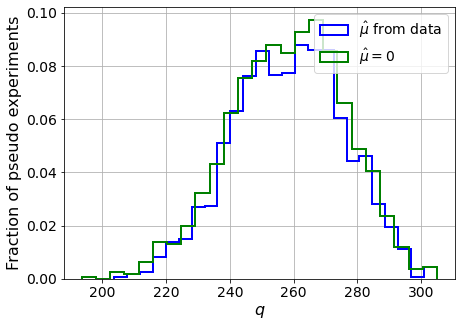

muhat mean:  0.0006403006272521448
Z_bins:  16.1070807687021
std Z_bins:  0.5367953155962265
Z_bins mu=0:  16.104751190095666
std Z_bins mu=0:  0.5568112134922286

--------

B_expected:  643
S_expected:  370

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.198


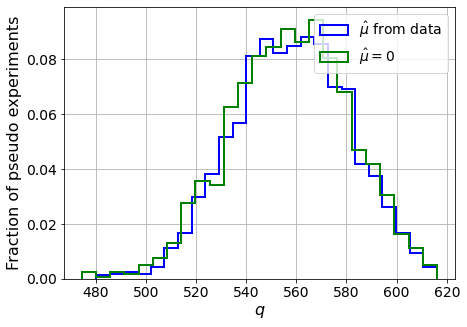

muhat mean:  0.0007677828230017299
Z_bins:  23.62981183647782
std Z_bins:  0.48394440467388244
Z_bins mu=0:  23.628852548928176
std Z_bins mu=0:  0.49858434526033246

--------

B_expected:  643
S_expected:  714

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2155


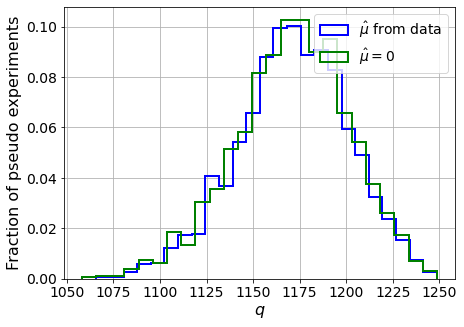

muhat mean:  0.00019504677101260732
Z_bins:  34.24011840275557
std Z_bins:  0.43571819045524063
Z_bins mu=0:  34.238321998300414
std Z_bins mu=0:  0.4462977678793778

--------

B_expected:  643
S_expected:  1378

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2095


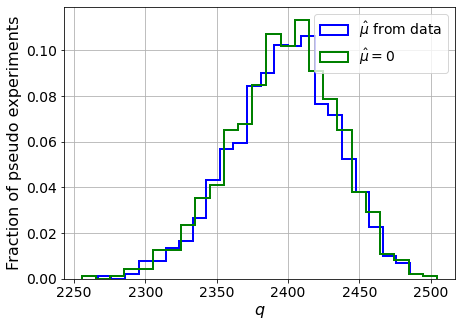

muhat mean:  0.00022116440843335288
Z_bins:  48.975545207505895
std Z_bins:  0.3748427076305438
Z_bins mu=0:  48.973262622608665
std Z_bins mu=0:  0.382221418692572

--------

B_expected:  643
S_expected:  2661

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2085


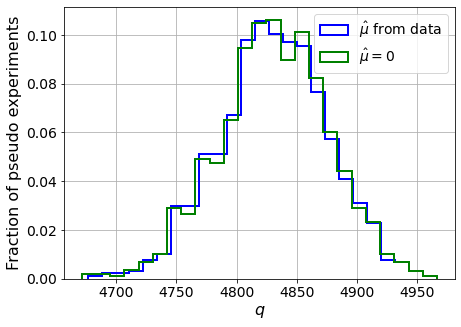

muhat mean:  6.843650566159344e-05
Z_bins:  69.50836312384271
std Z_bins:  0.32199087796928494
Z_bins mu=0:  69.50736825851386
std Z_bins mu=0:  0.3263499200395866

--------

B_expected:  643
S_expected:  5138

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1905


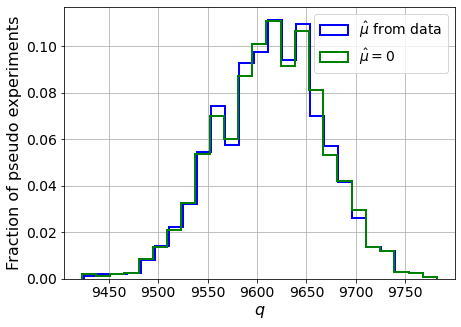

muhat mean:  6.434350492277336e-06
Z_bins:  98.06464212247869
std Z_bins:  0.27366715882522735
Z_bins mu=0:  98.06409837825066
std Z_bins mu=0:  0.2762186846500941

--------

B_expected:  643
S_expected:  9921

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2115


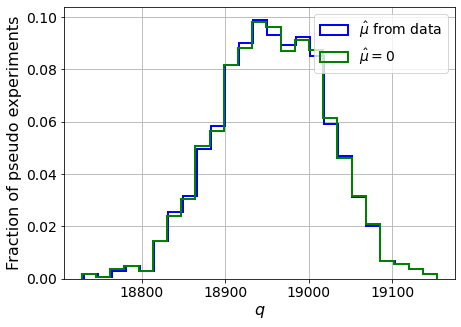

muhat mean:  -6.187003807881327e-07
Z_bins:  137.680413281273
std Z_bins:  0.23917329177730318
Z_bins mu=0:  137.680413281273
std Z_bins mu=0:  0.2410305295930455

--------

B_expected:  643
S_expected:  19154

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2205


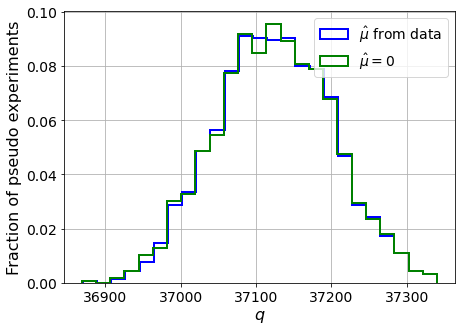

muhat mean:  7.180991754842343e-06
Z_bins:  192.67698815151542
std Z_bins:  0.19869342383788788
Z_bins mu=0:  192.676449477738
std Z_bins mu=0:  0.19989845121335098

--------


 FINAL RESULT:

[[0.4074157862307322, 0.5998462163342494, 0.14178575607532137, 0.40636857920477204, 0.9867748778336621], [0.8495817546171447, 0.611095275758952, 0.03459155521238711, 0.8495817546171447, 0.8900918373689761], [1.3852415012201387, 0.6665054802094204, 0.02781002891381845, 1.3850968308222058, 0.8853319238353613], [2.5193856425698704, 0.7231725959233154, 0.018803114214560192, 2.519203965815585, 0.8641576806966823], [4.293925821058882, 0.7046716961434252, 0.006051552390388544, 4.2936714201063575, 0.78785516370773], [6.816016166353453, 0.6680000999992759, 0.0052481214873799364, 6.813843183517424, 0.7244800196956273], [10.643386873263397, 0.6126740119464773, 0.0024605528893778023, 10.643386873263397, 0.6469549487382932], [16.1070807687021, 0.5367953155962265, 0.0006403006272521448, 16.104751190095666, 0.5

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 341.49646549 301.89877456 260.24201201 211.90105054
 157.0529026   96.43397676  34.60828665 -32.87512949 -99.01684956]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 334.12056279 304.60525922 267.16989031 224.68185389
 175

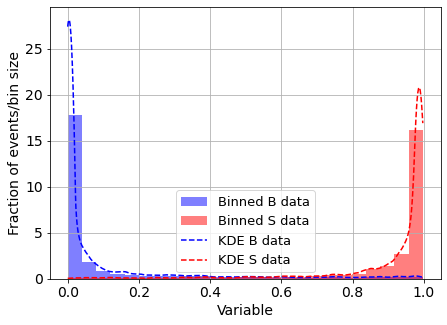

KDE Kernel:  epanechnikov
Background bandwidth:  0.022117541055781564
Signal bandwidth:  0.022117541055781564
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  2



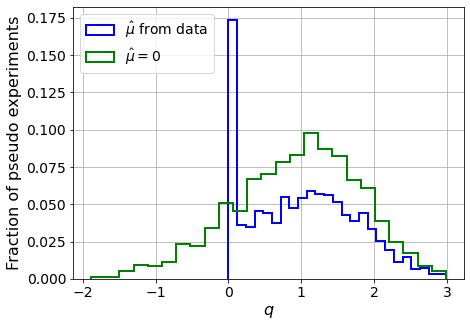

muhat mean:  -2.1239055018820774
Z_bins:  1.008274243992802
std Z_bins:  0.36132723984299886
Z_bins mu=0:  1.008274243992802
std Z_bins mu=0:  0.42832887895067445

--------

B_expected:  643
S_expected:  4



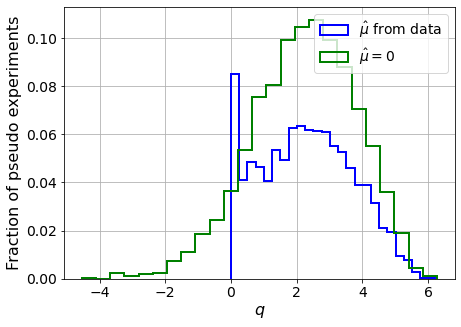

muhat mean:  -1.102063092868273
Z_bins:  1.5136033787686902
std Z_bins:  0.46282790849093686
Z_bins mu=0:  1.5136033787686902
std Z_bins mu=0:  0.522896205224944

--------

B_expected:  643
S_expected:  7



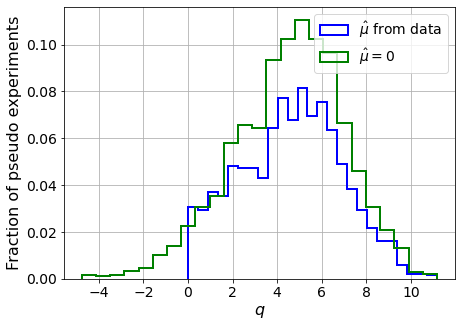

muhat mean:  -0.6263156336989539
Z_bins:  2.1763577073826847
std Z_bins:  0.5232285075420722
Z_bins mu=0:  2.1763577073826847
std Z_bins mu=0:  0.5694434547182098

--------

B_expected:  643
S_expected:  14



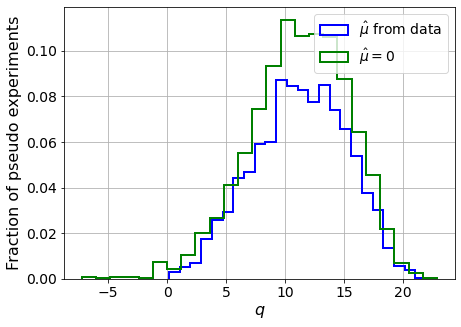

muhat mean:  -0.3122938456099557
Z_bins:  3.3789355833664927
std Z_bins:  0.5858618106817965
Z_bins mu=0:  3.3789355833664927
std Z_bins mu=0:  0.622030778224757

--------

B_expected:  643
S_expected:  27



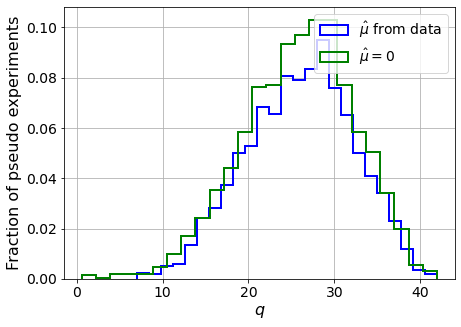

muhat mean:  -0.1425837642632217
Z_bins:  5.126499625633428
std Z_bins:  0.6079907420097328
Z_bins mu=0:  5.126499625633428
std Z_bins mu=0:  0.6314760029433024

--------

B_expected:  643
S_expected:  51



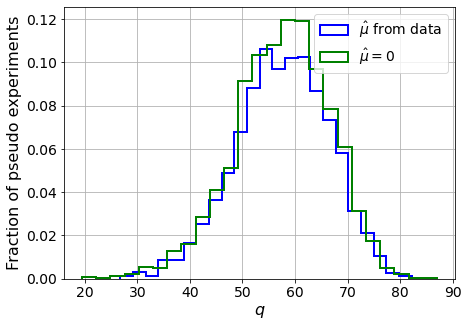

muhat mean:  -0.07876306551265287
Z_bins:  7.611221843552072
std Z_bins:  0.5822082341374788
Z_bins mu=0:  7.611221843552072
std Z_bins mu=0:  0.5983183317825288

--------

B_expected:  643
S_expected:  99



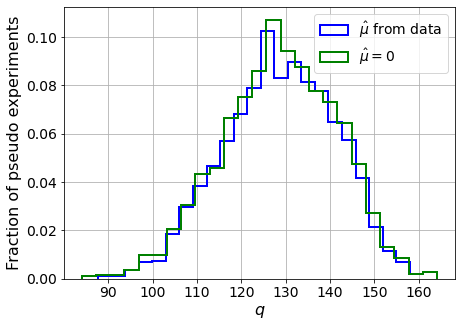

muhat mean:  -0.04026074524466095
Z_bins:  11.347868391967335
std Z_bins:  0.5562716303347
Z_bins mu=0:  11.347868391967335
std Z_bins mu=0:  0.565255673225608

--------

B_expected:  643
S_expected:  192



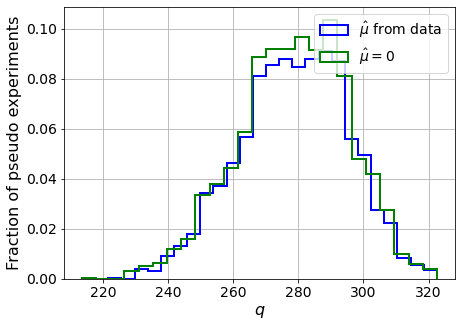

muhat mean:  -0.020265435652629598
Z_bins:  16.715010816346133
std Z_bins:  0.4977996111490103
Z_bins mu=0:  16.715010816346133
std Z_bins mu=0:  0.5036028063745197

--------

B_expected:  643
S_expected:  370



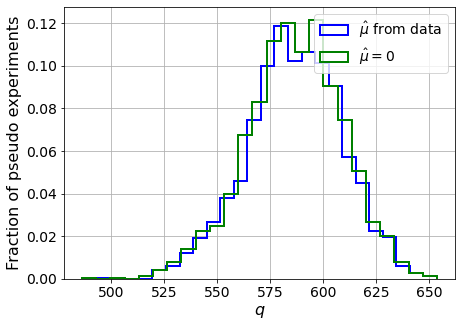

muhat mean:  -0.012575973496065086
Z_bins:  24.22439102729057
std Z_bins:  0.4627186042432775
Z_bins mu=0:  24.22439102729057
std Z_bins mu=0:  0.46683903677383737

--------

B_expected:  643
S_expected:  714



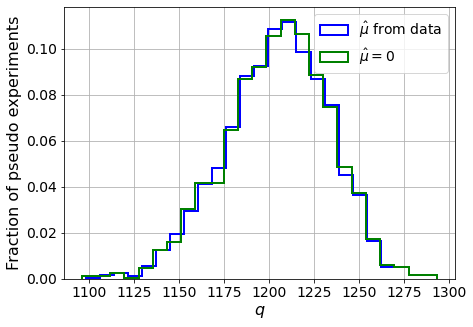

muhat mean:  -0.005966034909457077
Z_bins:  34.733574489363605
std Z_bins:  0.41269130921009994
Z_bins mu=0:  34.733105928630025
std Z_bins mu=0:  0.4153749283312209

--------

B_expected:  643
S_expected:  1378



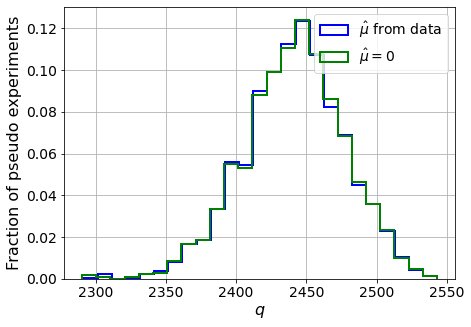

muhat mean:  -0.0030923148555898274
Z_bins:  49.421309263890976
std Z_bins:  0.36345051312284954
Z_bins mu=0:  49.42062198931696
std Z_bins mu=0:  0.3658868821136235

--------

B_expected:  643
S_expected:  2661



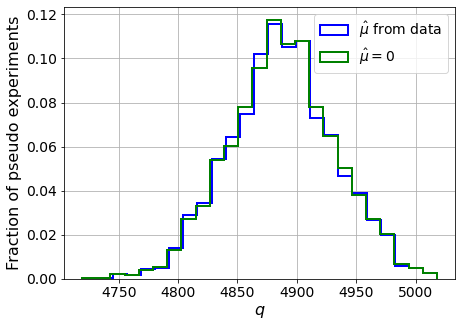

muhat mean:  -0.0015504538777933593
Z_bins:  69.90798180978494
std Z_bins:  0.31848886485679917
Z_bins mu=0:  69.90796907687518
std Z_bins mu=0:  0.3195749174804651

--------

B_expected:  643
S_expected:  5138



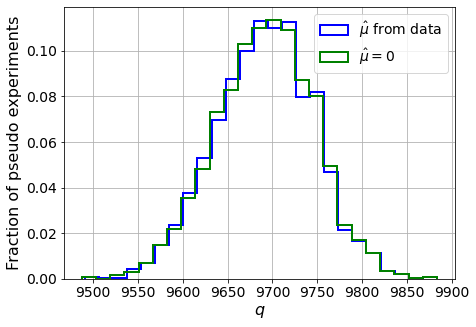

muhat mean:  -0.0007886989528839339
Z_bins:  98.45446023289426
std Z_bins:  0.27763501202619933
Z_bins mu=0:  98.45400700044412
std Z_bins mu=0:  0.2784933103174389

--------

B_expected:  643
S_expected:  9921



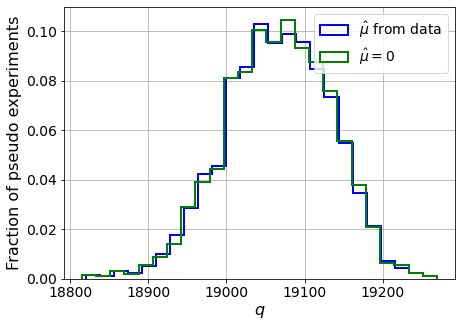

muhat mean:  -0.00039093051020977476
Z_bins:  138.0857913307269
std Z_bins:  0.244700699650964
Z_bins mu=0:  138.08578073672768
std Z_bins mu=0:  0.24531733255171437

--------

B_expected:  643
S_expected:  19154



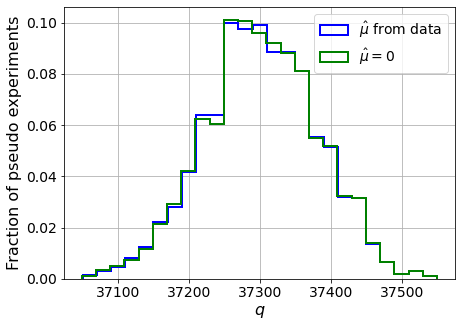

muhat mean:  -0.00021806897449970914
Z_bins:  193.1355788271591
std Z_bins:  0.205734968536863
Z_bins mu=0:  193.13556036740647
std Z_bins mu=0:  0.20602831236745342

--------


 FINAL RESULT:

[[1.008274243992802, 0.36132723984299886, -2.1239055018820774, 1.008274243992802, 0.42832887895067445], [1.5136033787686902, 0.46282790849093686, -1.102063092868273, 1.5136033787686902, 0.522896205224944], [2.1763577073826847, 0.5232285075420722, -0.6263156336989539, 2.1763577073826847, 0.5694434547182098], [3.3789355833664927, 0.5858618106817965, -0.3122938456099557, 3.3789355833664927, 0.622030778224757], [5.126499625633428, 0.6079907420097328, -0.1425837642632217, 5.126499625633428, 0.6314760029433024], [7.611221843552072, 0.5822082341374788, -0.07876306551265287, 7.611221843552072, 0.5983183317825288], [11.347868391967335, 0.5562716303347, -0.04026074524466095, 11.347868391967335, 0.565255673225608], [16.715010816346133, 0.4977996111490103, -0.020265435652629598, 16.715010816346133, 0.503602

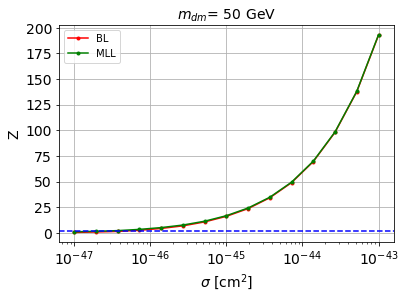


cross_BL_164:  4.3212310521393664e-47
cross_BL_164_up:  2.357199283430055e-47
cross_BL_164_down:  6.795961368533197e-47

cross_MLL_164:  2.1887897171651982e-47
cross_MLL_164_up:  1.4216485625760621e-47
cross_MLL_164_down:  3.6994561602495133e-47

#########################


#########################

mDM =  100 GeV


S_cs1.shape:  (37757,)
S_cs2.shape:  (37757,)
 NUM_DAT:  35163 

NUM_DAT_ER:  34715
NUM_DAT_AC:  123
NUM_DAT_CNNS:  1
NUM_DAT_RN:  32
NUM_DAT_WALL:  292

B_cs1cs2.shape:  (35163, 2)

S_cs1cs2.shape:  (35163, 2)


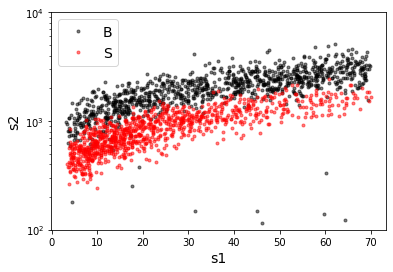

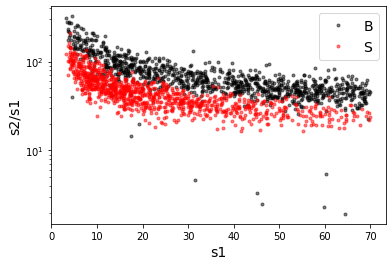

X_mon_B.shape:  (35163, 2)
X_mon_S.shape:  (35163, 2)
X_mon.shape:  (70326, 2)

X_mon_train :  (44832, 2)
y_mon_train :  (44832,)
X_mon_val :  (7912, 2)
y_mon_val :  (7912,)
X_mon_test :  (17582, 2)
y_mon_test :  (17582,)

Classification score:


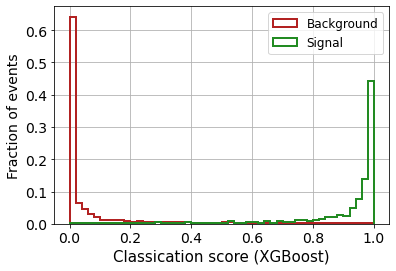


 ROC-AUC =  0.9805947518327282
At least 5 B events per bin, range = [[0, 1]]:
# bins:  15 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  15
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2275


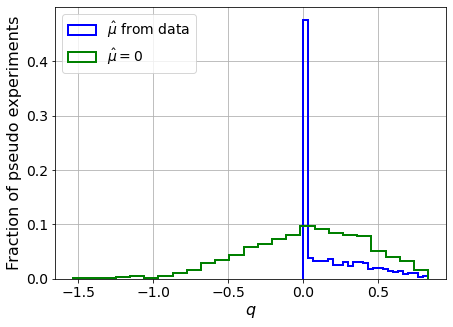

muhat mean:  0.24803043078397807
Z_bins:  0.22946950294225416
std Z_bins:  0.4818691123370408
Z_bins mu=0:  0.2294344272716061
std Z_bins mu=0:  0.8699944781502515

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.219


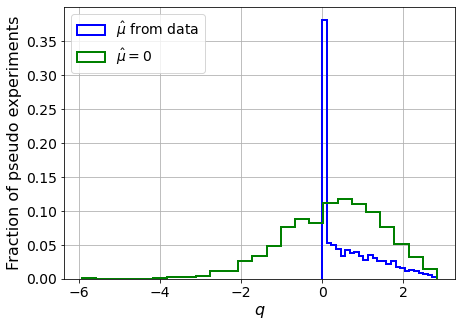

muhat mean:  0.17716806109750766
Z_bins:  0.620340867220678
std Z_bins:  0.5849069321571013
Z_bins mu=0:  0.6185223004952175
std Z_bins mu=0:  0.977255089747969

--------

B_expected:  643
S_expected:  5

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.236


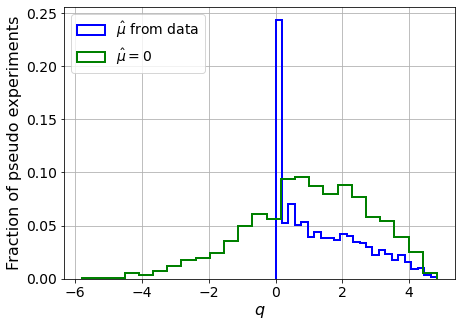

muhat mean:  0.05758414482334079
Z_bins:  1.0529937350196181
std Z_bins:  0.597905927721452
Z_bins mu=0:  1.0527763426140309
std Z_bins mu=0:  0.8679970640370603

--------

B_expected:  643
S_expected:  10

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2235


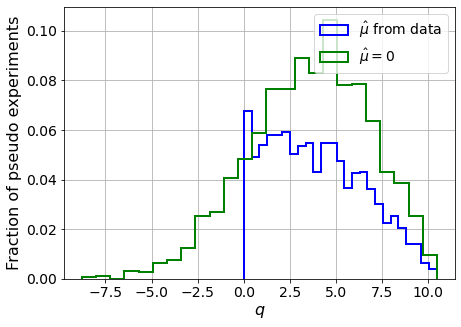

muhat mean:  0.03527215172540069
Z_bins:  1.9328334162803176
std Z_bins:  0.6643311519163169
Z_bins mu=0:  1.932473515844475
std Z_bins mu=0:  0.8392054975095701

--------

B_expected:  643
S_expected:  19

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.224


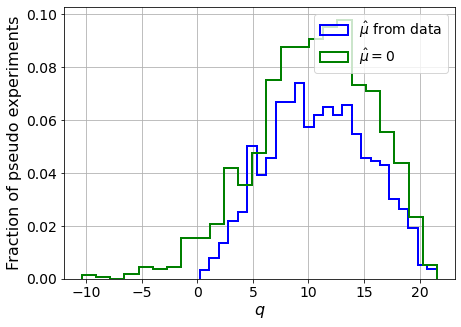

muhat mean:  0.018696363291656474
Z_bins:  3.2860410533367106
std Z_bins:  0.6755489604912798
Z_bins mu=0:  3.2858225657587794
std Z_bins mu=0:  0.7910588972224936

--------

B_expected:  643
S_expected:  37

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.21


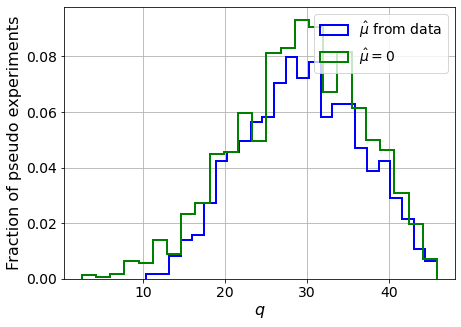

muhat mean:  0.010601386702018892
Z_bins:  5.417528509136814
std Z_bins:  0.6505338197704047
Z_bins mu=0:  5.414633001506557
std Z_bins mu=0:  0.7148689636834845

--------

B_expected:  643
S_expected:  72

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2225


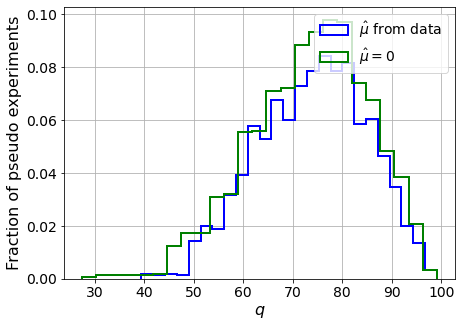

muhat mean:  0.0044805269496403285
Z_bins:  8.641155375202022
std Z_bins:  0.6341535376688706
Z_bins mu=0:  8.641155375202022
std Z_bins mu=0:  0.6809282217513019

--------

B_expected:  643
S_expected:  139

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.234


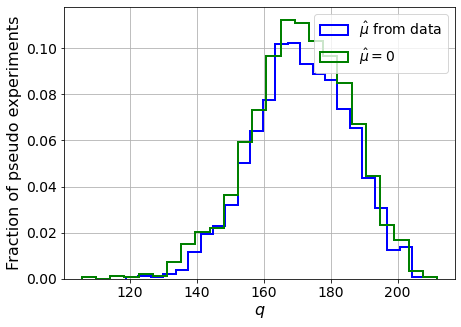

muhat mean:  0.0027226563782902515
Z_bins:  13.085086810168455
std Z_bins:  0.5459259173414521
Z_bins mu=0:  13.082602624754237
std Z_bins mu=0:  0.5737776927508075

--------

B_expected:  643
S_expected:  268

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2335


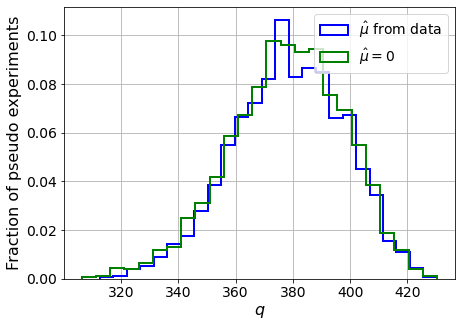

muhat mean:  0.0013191372938041615
Z_bins:  19.454746662346206
std Z_bins:  0.4990793679415983
Z_bins mu=0:  19.452958489647777
std Z_bins mu=0:  0.5169411992955404

--------

B_expected:  643
S_expected:  518

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2295


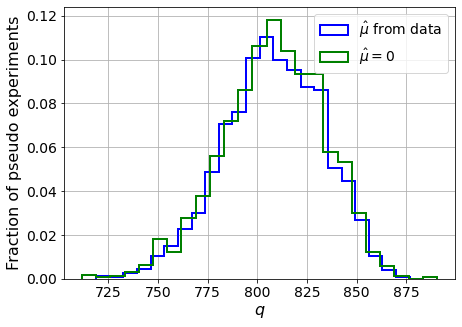

muhat mean:  0.00044754364736572527
Z_bins:  28.436238326630583
std Z_bins:  0.4408918722884233
Z_bins mu=0:  28.434309792346863
std Z_bins mu=0:  0.4522750104412005

--------

B_expected:  643
S_expected:  1001

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2255


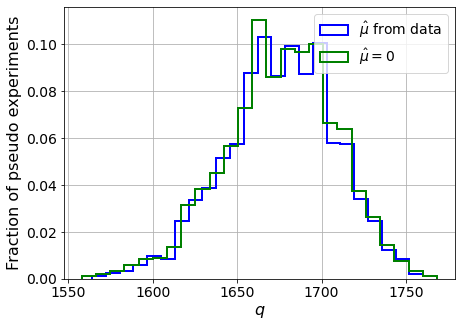

muhat mean:  0.00048488599736742986
Z_bins:  40.95674192471507
std Z_bins:  0.3974691528316355
Z_bins mu=0:  40.95434500334839
std Z_bins mu=0:  0.40573585052415917

--------

B_expected:  643
S_expected:  1932

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2325


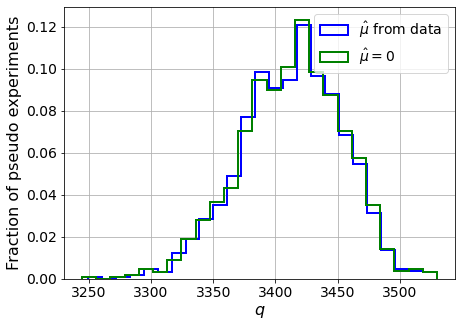

muhat mean:  9.331288008900779e-05
Z_bins:  58.441578291192876
std Z_bins:  0.34858851407970964
Z_bins mu=0:  58.44156086013217
std Z_bins mu=0:  0.35356016408561197

--------

B_expected:  643
S_expected:  3730

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2345


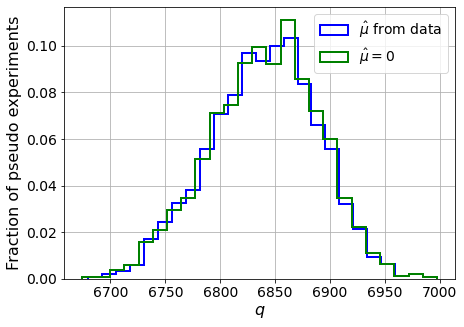

muhat mean:  8.773305920374405e-05
Z_bins:  82.72084236507872
std Z_bins:  0.296364060074939
Z_bins mu=0:  82.71704501311272
std Z_bins mu=0:  0.29921818513312126

--------

B_expected:  643
S_expected:  7201

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2135


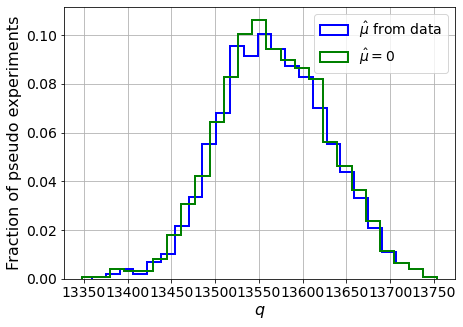

muhat mean:  4.761238467988173e-05
Z_bins:  116.47237642541647
std Z_bins:  0.26274878236874133
Z_bins mu=0:  116.4716950618898
std Z_bins mu=0:  0.2649514153378946

--------

B_expected:  643
S_expected:  13904

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.229


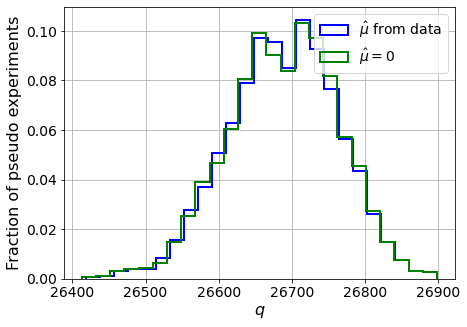

muhat mean:  2.7306413039764296e-05
Z_bins:  163.37396300727968
std Z_bins:  0.2286858810422438
Z_bins mu=0:  163.37324371432052
std Z_bins mu=0:  0.23029811144104653

--------


 FINAL RESULT:

[[0.22946950294225416, 0.4818691123370408, 0.24803043078397807, 0.2294344272716061, 0.8699944781502515], [0.620340867220678, 0.5849069321571013, 0.17716806109750766, 0.6185223004952175, 0.977255089747969], [1.0529937350196181, 0.597905927721452, 0.05758414482334079, 1.0527763426140309, 0.8679970640370603], [1.9328334162803176, 0.6643311519163169, 0.03527215172540069, 1.932473515844475, 0.8392054975095701], [3.2860410533367106, 0.6755489604912798, 0.018696363291656474, 3.2858225657587794, 0.7910588972224936], [5.417528509136814, 0.6505338197704047, 0.010601386702018892, 5.414633001506557, 0.7148689636834845], [8.641155375202022, 0.6341535376688706, 0.0044805269496403285, 8.641155375202022, 0.6809282217513019], [13.085086810168455, 0.5459259173414521, 0.0027226563782902515, 13.082602624754237, 0.

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 322.74059263 277.48915304 227.87471836
 170.74200018 111.10733868  47.08846408 -23.50803044 -95.03136071]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 297.06657092 272.58281965 240.21202823 199.2084459
 152.

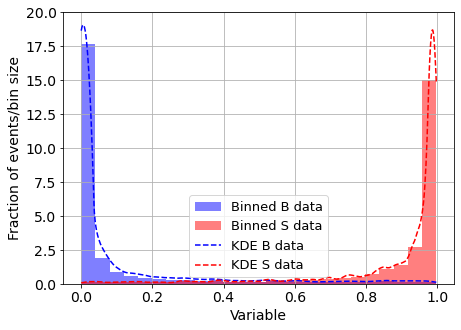

KDE Kernel:  epanechnikov
Background bandwidth:  0.03613222756796251
Signal bandwidth:  0.022117541055781564
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



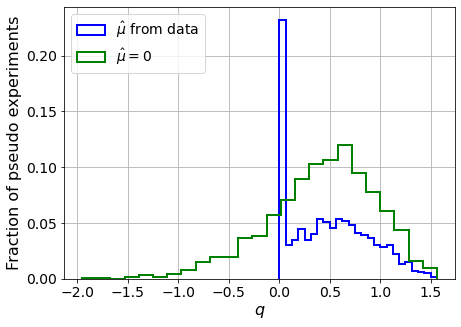

muhat mean:  -5.322763464136655
Z_bins:  0.6866944391583615
std Z_bins:  0.290258534195989
Z_bins mu=0:  0.6866944391583615
std Z_bins mu=0:  0.3895475437930968

--------

B_expected:  643
S_expected:  3



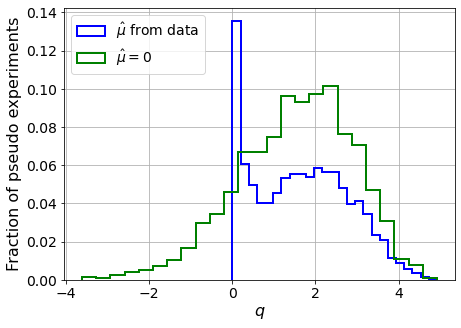

muhat mean:  -1.6084321476384864
Z_bins:  1.2797864782712793
std Z_bins:  0.4465826525342061
Z_bins mu=0:  1.2797864782712793
std Z_bins mu=0:  0.5358082019038056

--------

B_expected:  643
S_expected:  5



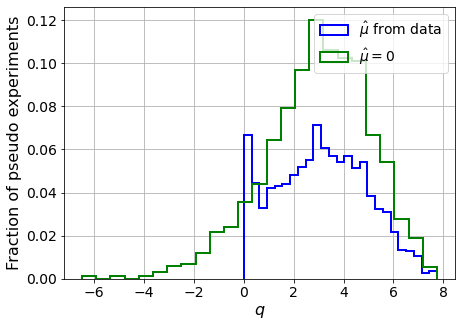

muhat mean:  -0.9228421397824054
Z_bins:  1.7607046788988157
std Z_bins:  0.5123226807486199
Z_bins mu=0:  1.7607046788988157
std Z_bins mu=0:  0.6000960896064312

--------

B_expected:  643
S_expected:  10



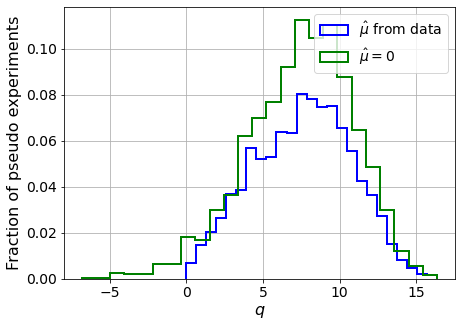

muhat mean:  -0.5145355099732974
Z_bins:  2.7831155349515897
std Z_bins:  0.5672565263949081
Z_bins mu=0:  2.7831155349515897
std Z_bins mu=0:  0.6225920796844284

--------

B_expected:  643
S_expected:  19



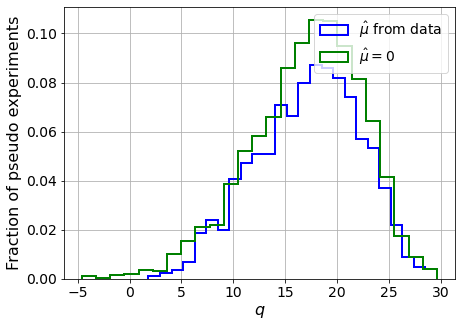

muhat mean:  -0.22519461163204732
Z_bins:  4.1930554015823125
std Z_bins:  0.5982973678162418
Z_bins mu=0:  4.1930554015823125
std Z_bins mu=0:  0.6381239758765777

--------

B_expected:  643
S_expected:  37



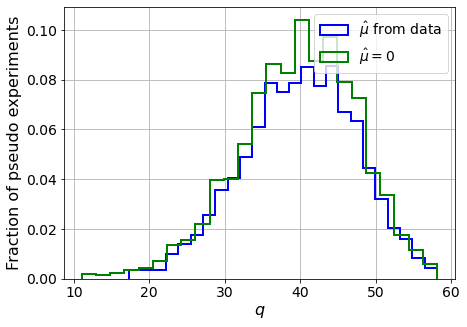

muhat mean:  -0.136435550316396
Z_bins:  6.34544809586754
std Z_bins:  0.5871748580169782
Z_bins mu=0:  6.34544809586754
std Z_bins mu=0:  0.6127942262373316

--------

B_expected:  643
S_expected:  72



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


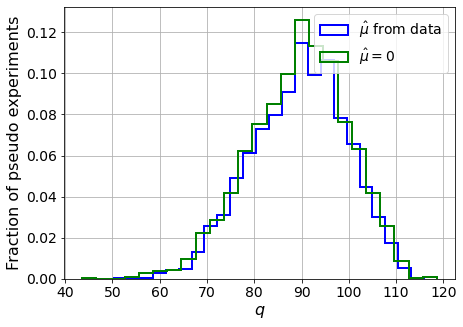

muhat mean:  -0.06722467222753661
Z_bins:  9.490683097876927
std Z_bins:  0.5318351796802977
Z_bins mu=0:  9.489835364079672
std Z_bins mu=0:  0.5453851516650937

--------

B_expected:  643
S_expected:  139



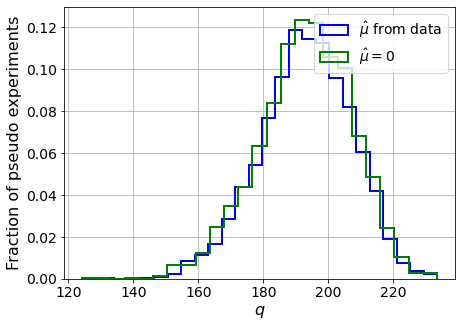

muhat mean:  -0.03249724895546953
Z_bins:  13.9103352112007
std Z_bins:  0.507934262168083
Z_bins mu=0:  13.910315468598409
std Z_bins mu=0:  0.5181084693821579

--------

B_expected:  643
S_expected:  268



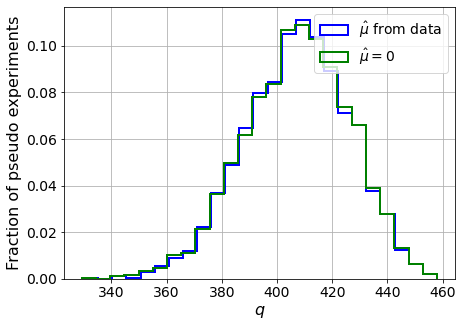

muhat mean:  -0.018419152205863376
Z_bins:  20.196624225817317
std Z_bins:  0.4685827184613557
Z_bins mu=0:  20.196624225817317
std Z_bins mu=0:  0.47425130169127405

--------

B_expected:  643
S_expected:  518



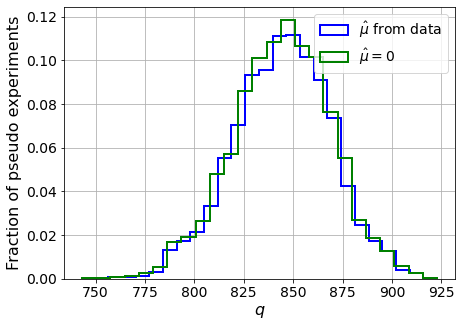

muhat mean:  -0.010214591124711786
Z_bins:  29.070768179673795
std Z_bins:  0.4246205914108198
Z_bins mu=0:  29.070768179673795
std Z_bins mu=0:  0.42873033336368854

--------

B_expected:  643
S_expected:  1001



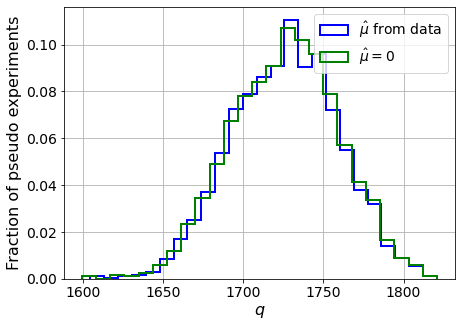

muhat mean:  -0.004695930453593048
Z_bins:  41.566463729293254
std Z_bins:  0.39637261596562273
Z_bins mu=0:  41.56645432593002
std Z_bins mu=0:  0.39921601987509414

--------

B_expected:  643
S_expected:  1932



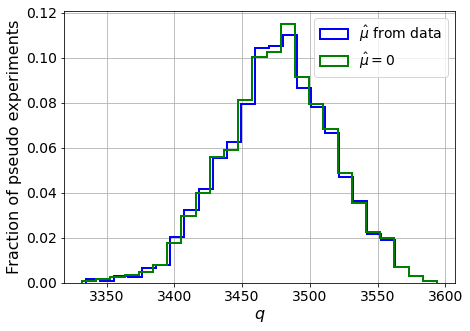

muhat mean:  -0.00278765512524161
Z_bins:  58.97360906330691
std Z_bins:  0.3400239225071674
Z_bins mu=0:  58.97324055618946
std Z_bins mu=0:  0.3416942398351282

--------

B_expected:  643
S_expected:  3730



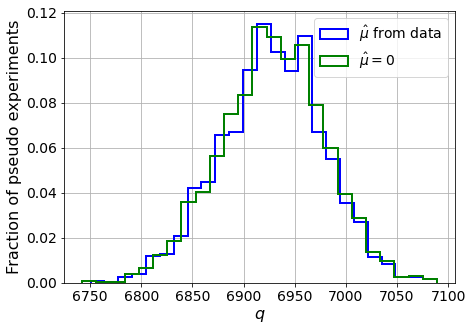

muhat mean:  -0.0013481176087934775
Z_bins:  83.2394276360885
std Z_bins:  0.30360632348018896
Z_bins mu=0:  83.23933666004099
std Z_bins mu=0:  0.3047529427470082

--------

B_expected:  643
S_expected:  7201



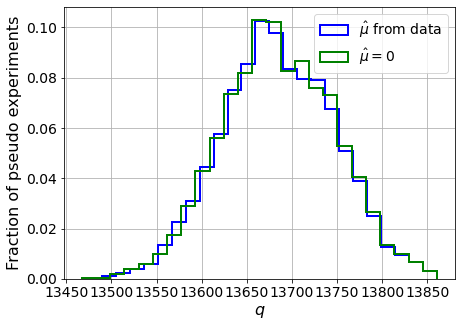

muhat mean:  -0.0006132259465231218
Z_bins:  116.9754014459585
std Z_bins:  0.2662068286809622
Z_bins mu=0:  116.97484287094125
std Z_bins mu=0:  0.2669867508604458

--------

B_expected:  643
S_expected:  13904



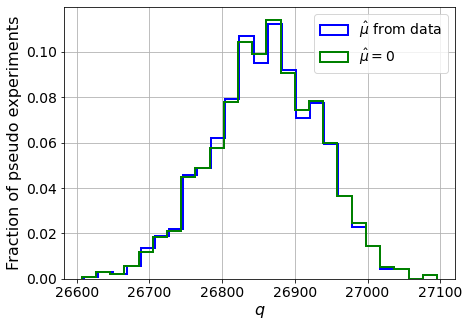

muhat mean:  -0.0003168650112293404
Z_bins:  163.89611705604554
std Z_bins:  0.2267469623370748
Z_bins mu=0:  163.8954408783937
std Z_bins mu=0:  0.2272894698998375

--------


 FINAL RESULT:

[[0.6866944391583615, 0.290258534195989, -5.322763464136655, 0.6866944391583615, 0.3895475437930968], [1.2797864782712793, 0.4465826525342061, -1.6084321476384864, 1.2797864782712793, 0.5358082019038056], [1.7607046788988157, 0.5123226807486199, -0.9228421397824054, 1.7607046788988157, 0.6000960896064312], [2.7831155349515897, 0.5672565263949081, -0.5145355099732974, 2.7831155349515897, 0.6225920796844284], [4.1930554015823125, 0.5982973678162418, -0.22519461163204732, 4.1930554015823125, 0.6381239758765777], [6.34544809586754, 0.5871748580169782, -0.136435550316396, 6.34544809586754, 0.6127942262373316], [9.490683097876927, 0.5318351796802977, -0.06722467222753661, 9.489835364079672, 0.5453851516650937], [13.9103352112007, 0.507934262168083, -0.03249724895546953, 13.910315468598409, 0.5181084693

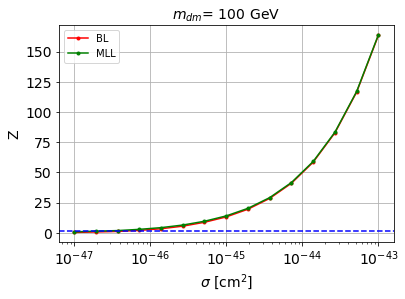


cross_BL_164:  5.781622722394619e-47
cross_BL_164_up:  3.69945320378003e-47
cross_BL_164_down:  8.634476515828676e-47

cross_MLL_164:  3.4490339025701315e-47
cross_MLL_164_up:  1.7400948763512366e-47
cross_MLL_164_down:  4.864976926336549e-47

#########################


#########################

mDM =  200 GeV


S_cs1.shape:  (34573,)
S_cs2.shape:  (34573,)
 NUM_DAT:  31737 

NUM_DAT_ER:  31333
NUM_DAT_AC:  111
NUM_DAT_CNNS:  1
NUM_DAT_RN:  29
NUM_DAT_WALL:  263

B_cs1cs2.shape:  (31737, 2)

S_cs1cs2.shape:  (31737, 2)


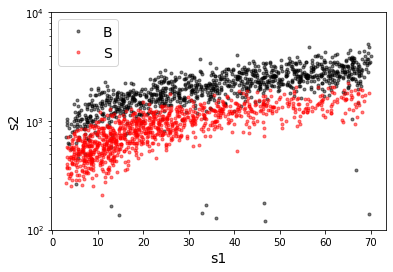

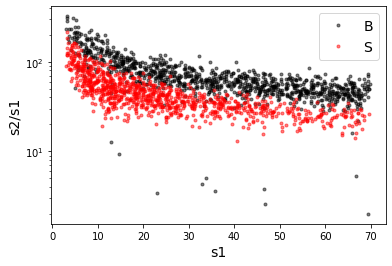

X_mon_B.shape:  (31737, 2)
X_mon_S.shape:  (31737, 2)
X_mon.shape:  (63474, 2)

X_mon_train :  (40464, 2)
y_mon_train :  (40464,)
X_mon_val :  (7141, 2)
y_mon_val :  (7141,)
X_mon_test :  (15869, 2)
y_mon_test :  (15869,)

Classification score:


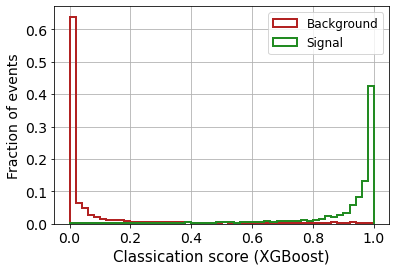


 ROC-AUC =  0.9797365705887616
At least 5 B events per bin, range = [[0, 1]]:
# bins:  15 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  15
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.212


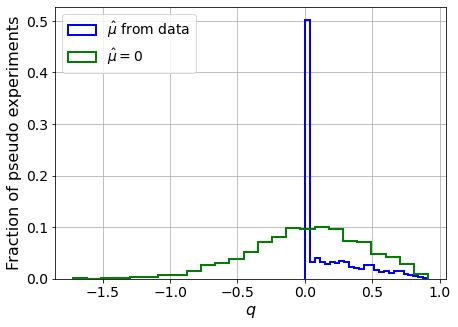

muhat mean:  0.33797563525616003
Z_bins:  0.1847469790959478
std Z_bins:  0.6246067512263092
Z_bins mu=0:  0.1799457518239944
std Z_bins mu=0:  1.1610092789991997

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.207


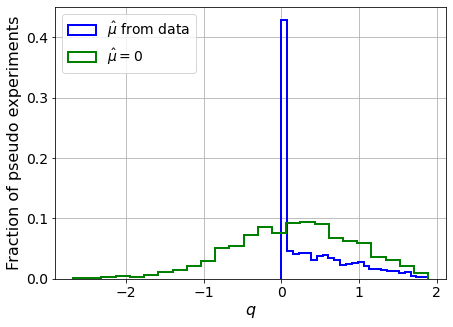

muhat mean:  0.09302378660968715
Z_bins:  0.45121348984770815
std Z_bins:  0.52738656957397
Z_bins mu=0:  0.45121348984770815
std Z_bins mu=0:  0.8573800114853843

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2145


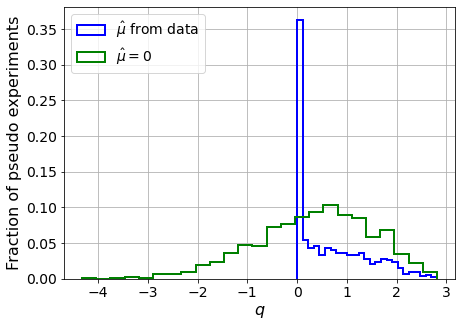

muhat mean:  0.08646607372634364
Z_bins:  0.6562487897758938
std Z_bins:  0.5482879595038808
Z_bins mu=0:  0.6562487897758938
std Z_bins mu=0:  0.8851867024172958

--------

B_expected:  643
S_expected:  6

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2255


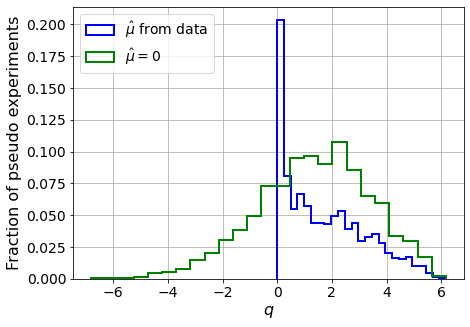

muhat mean:  0.04993814714364417
Z_bins:  1.2009693580646914
std Z_bins:  0.61801994493439
Z_bins mu=0:  1.20096628925457
std Z_bins mu=0:  0.8591668479722385

--------

B_expected:  643
S_expected:  11

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2085


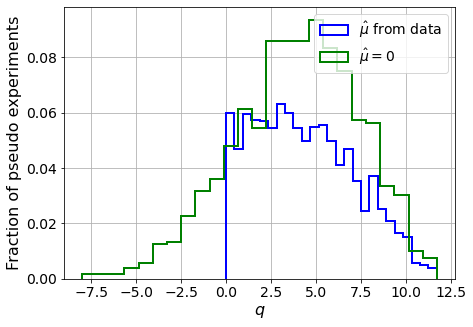

muhat mean:  0.040295895089766436
Z_bins:  2.019941333144657
std Z_bins:  0.6831975397545147
Z_bins mu=0:  2.0180311007457523
std Z_bins mu=0:  0.8601018050350842

--------

B_expected:  643
S_expected:  21

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.222


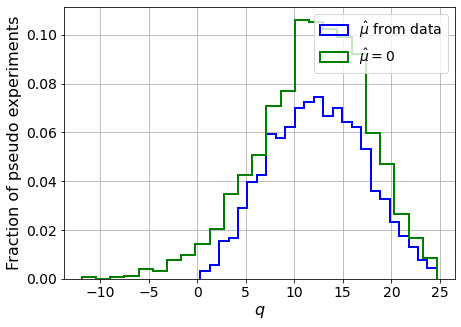

muhat mean:  0.014919077986596061
Z_bins:  3.5202353464845113
std Z_bins:  0.6862924796337952
Z_bins mu=0:  3.519988451815185
std Z_bins mu=0:  0.7973641178350603

--------

B_expected:  643
S_expected:  41

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.203


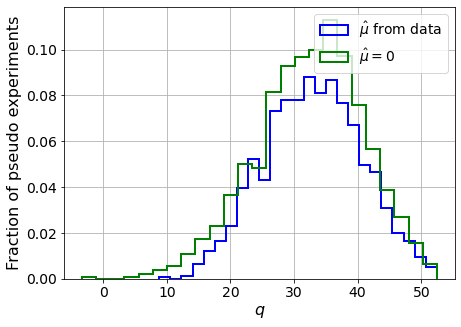

muhat mean:  0.011500700645778333
Z_bins:  5.74357608433135
std Z_bins:  0.6648285866863467
Z_bins mu=0:  5.743087794292916
std Z_bins mu=0:  0.7316573381578998

--------

B_expected:  643
S_expected:  79

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2105


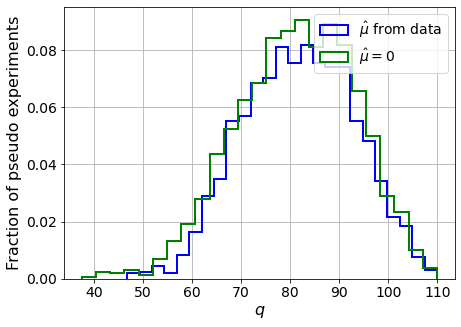

muhat mean:  0.005273621630189011
Z_bins:  9.049629669511791
std Z_bins:  0.6236776964617047
Z_bins mu=0:  9.049629669511791
std Z_bins mu=0:  0.6650125016873356

--------

B_expected:  643
S_expected:  152

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2


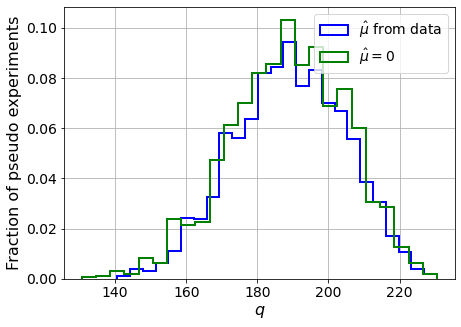

muhat mean:  0.0015479870943896138
Z_bins:  13.751778246591607
std Z_bins:  0.5671645011330656
Z_bins mu=0:  13.749636644490941
std Z_bins mu=0:  0.5922673330768733

--------

B_expected:  643
S_expected:  294

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.199


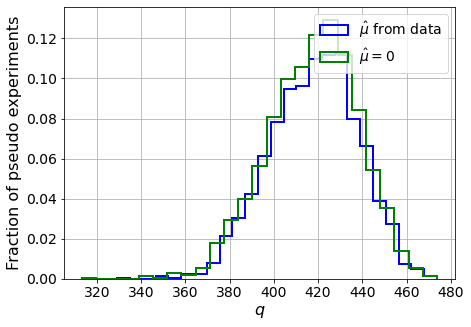

muhat mean:  0.0006978946353955588
Z_bins:  20.468072080947074
std Z_bins:  0.4837621927387949
Z_bins mu=0:  20.465106601878368
std Z_bins mu=0:  0.5007700167340021

--------

B_expected:  643
S_expected:  567

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2225


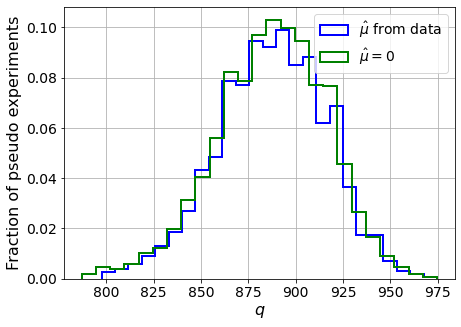

muhat mean:  0.000848069596096399
Z_bins:  29.80922076501946
std Z_bins:  0.4768376575046713
Z_bins mu=0:  29.80728428819107
std Z_bins mu=0:  0.49108624290463027

--------

B_expected:  643
S_expected:  1094

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2035


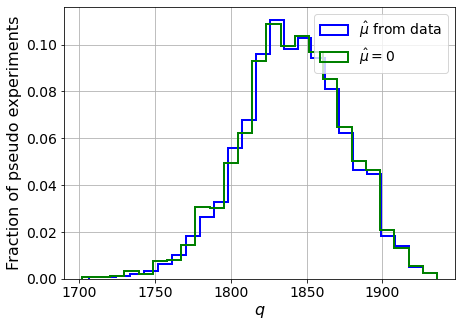

muhat mean:  0.00039234667254953246
Z_bins:  42.91511999423295
std Z_bins:  0.4020774192102591
Z_bins mu=0:  42.910499204409334
std Z_bins mu=0:  0.4102302573730376

--------

B_expected:  643
S_expected:  2113

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2065


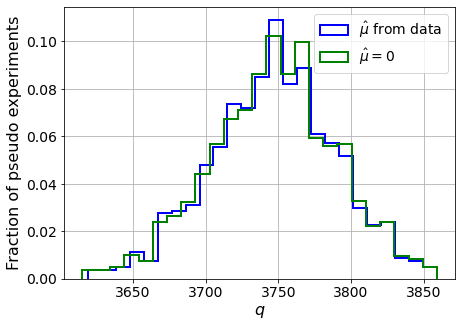

muhat mean:  0.00010573789504491621
Z_bins:  61.22005161881329
std Z_bins:  0.34994343242431547
Z_bins mu=0:  61.216828479536396
std Z_bins mu=0:  0.35456402755374505

--------

B_expected:  643
S_expected:  4079

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2085


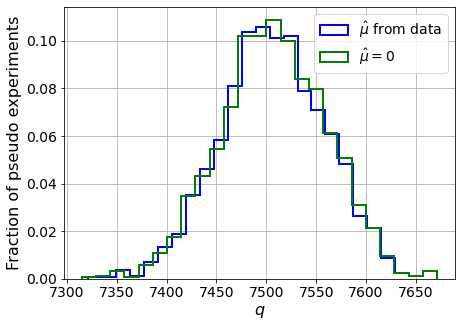

muhat mean:  6.414853944290565e-05
Z_bins:  86.64538948381366
std Z_bins:  0.30375708320367845
Z_bins mu=0:  86.64369916697886
std Z_bins mu=0:  0.30705261798490247

--------

B_expected:  643
S_expected:  7876

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.202


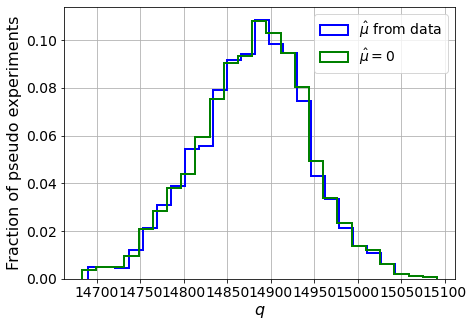

muhat mean:  4.229343297661321e-05
Z_bins:  121.99824722535956
std Z_bins:  0.26002767207500865
Z_bins mu=0:  121.99720335749277
std Z_bins mu=0:  0.2621120094228957

--------


 FINAL RESULT:

[[0.1847469790959478, 0.6246067512263092, 0.33797563525616003, 0.1799457518239944, 1.1610092789991997], [0.45121348984770815, 0.52738656957397, 0.09302378660968715, 0.45121348984770815, 0.8573800114853843], [0.6562487897758938, 0.5482879595038808, 0.08646607372634364, 0.6562487897758938, 0.8851867024172958], [1.2009693580646914, 0.61801994493439, 0.04993814714364417, 1.20096628925457, 0.8591668479722385], [2.019941333144657, 0.6831975397545147, 0.040295895089766436, 2.0180311007457523, 0.8601018050350842], [3.5202353464845113, 0.6862924796337952, 0.014919077986596061, 3.519988451815185, 0.7973641178350603], [5.74357608433135, 0.6648285866863467, 0.011500700645778333, 5.743087794292916, 0.7316573381578998], [9.049629669511791, 0.6236776964617047, 0.005273621630189011, 9.049629669511791, 0.6650125

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 297.48990358 256.31848768 208.7114234
 154.43441678  94.18346473  32.94548645 -33.0472733  -98.57942297]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
 292.34668992 276.88486629 252.83518957 222.17563603 186.85895669
 144.

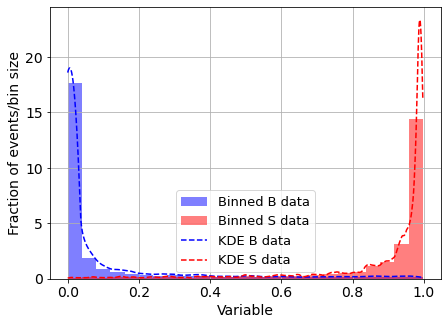

KDE Kernel:  epanechnikov
Background bandwidth:  0.03613222756796251
Signal bandwidth:  0.013538761800225447
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



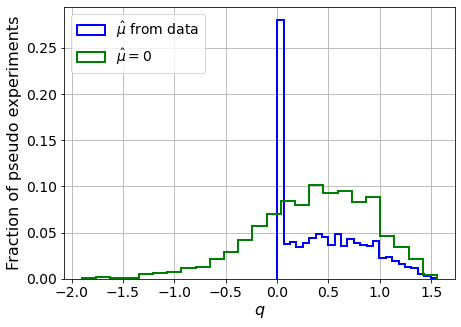

muhat mean:  -4.85528111246033
Z_bins:  0.6390047834483654
std Z_bins:  0.3156295622687244
Z_bins mu=0:  0.6390047834483654
std Z_bins mu=0:  0.43698250608250483

--------

B_expected:  643
S_expected:  2



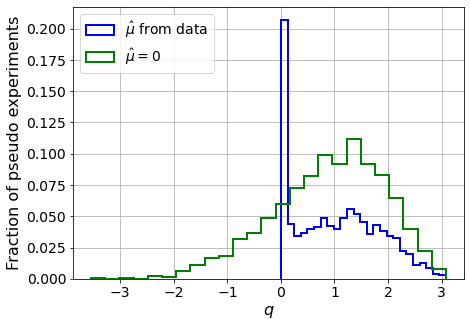

muhat mean:  -2.6471646716106814
Z_bins:  1.0057455295391242
std Z_bins:  0.3983425734266372
Z_bins mu=0:  1.0057455295391242
std Z_bins mu=0:  0.5133855181632632

--------

B_expected:  643
S_expected:  3



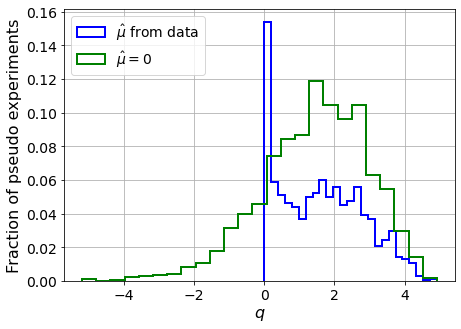

muhat mean:  -1.8773914586985059
Z_bins:  1.2636282835031647
std Z_bins:  0.47011941327919904
Z_bins mu=0:  1.2636282835031647
std Z_bins mu=0:  0.595420794104652

--------

B_expected:  643
S_expected:  6



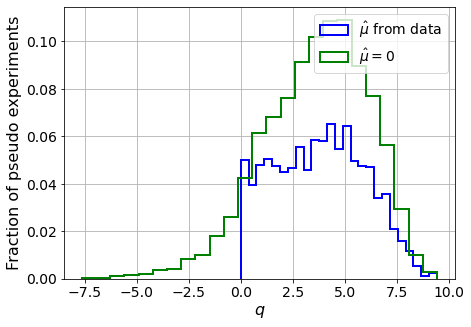

muhat mean:  -0.8137536074639659
Z_bins:  1.9616777437719837
std Z_bins:  0.5493982098081603
Z_bins mu=0:  1.9616777437719837
std Z_bins mu=0:  0.6450881727102827

--------

B_expected:  643
S_expected:  11



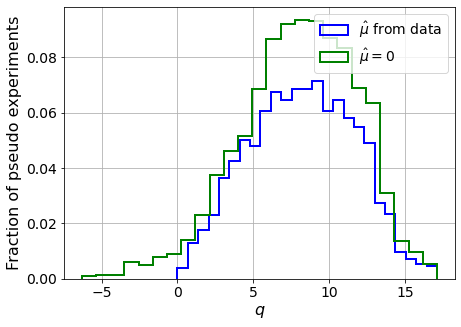

muhat mean:  -0.4444659391633819
Z_bins:  2.8751184137530768
std Z_bins:  0.5995416775278318
Z_bins mu=0:  2.8751184137530768
std Z_bins mu=0:  0.6668063572158904

--------

B_expected:  643
S_expected:  21



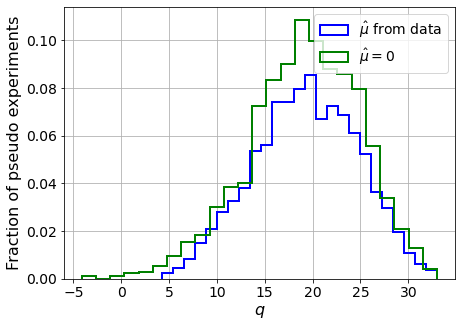

muhat mean:  -0.2384941220879328
Z_bins:  4.405465285430902
std Z_bins:  0.6147487963482106
Z_bins mu=0:  4.405465285430902
std Z_bins mu=0:  0.65864281681929

--------

B_expected:  643
S_expected:  41



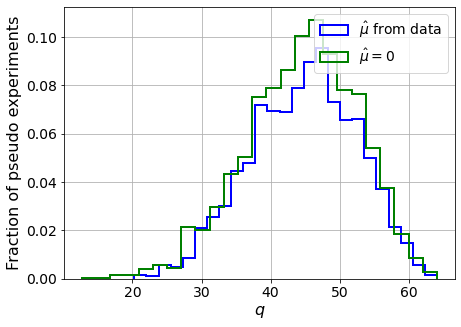

muhat mean:  -0.1079903972549883
Z_bins:  6.723630012468452
std Z_bins:  0.572533230016267
Z_bins mu=0:  6.723630012468452
std Z_bins mu=0:  0.5967067325268562

--------

B_expected:  643
S_expected:  79



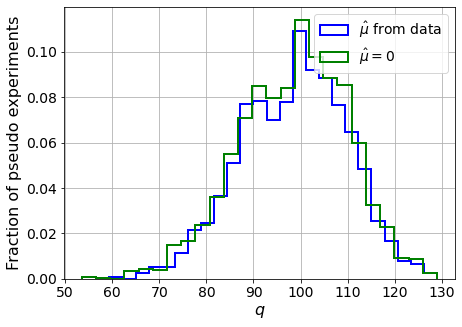

muhat mean:  -0.06943059796270605
Z_bins:  9.969265007602038
std Z_bins:  0.5612563601482814
Z_bins mu=0:  9.96709413688848
std Z_bins mu=0:  0.5794837750312776

--------

B_expected:  643
S_expected:  152



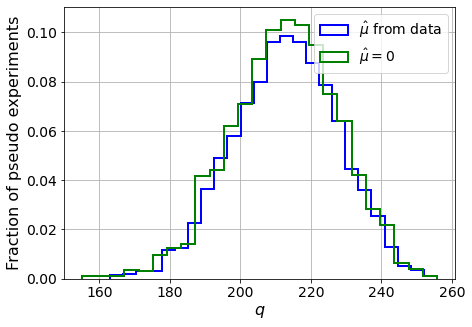

muhat mean:  -0.03291559700577167
Z_bins:  14.60049579276106
std Z_bins:  0.5099311411987649
Z_bins mu=0:  14.60049579276106
std Z_bins mu=0:  0.5207642410373692

--------

B_expected:  643
S_expected:  294



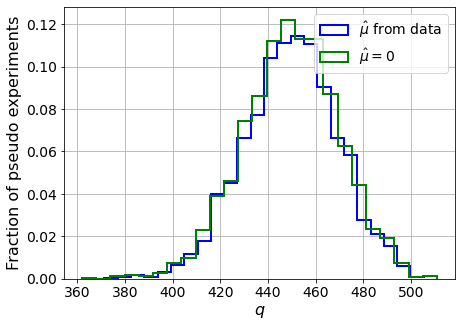

muhat mean:  -0.0136095418126671
Z_bins:  21.216923271963342
std Z_bins:  0.4643325483713398
Z_bins mu=0:  21.21413032784027
std Z_bins mu=0:  0.4725319885869545

--------

B_expected:  643
S_expected:  567



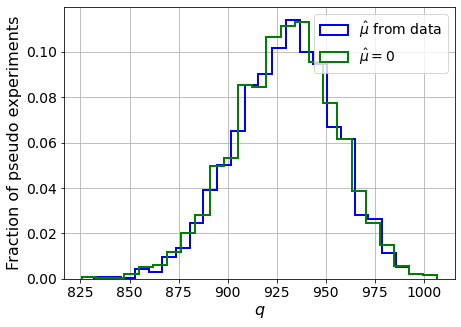

muhat mean:  -0.007053403374200122
Z_bins:  30.50187748133616
std Z_bins:  0.4222250966301456
Z_bins mu=0:  30.501554957482128
std Z_bins mu=0:  0.4271399214770524

--------

B_expected:  643
S_expected:  1094



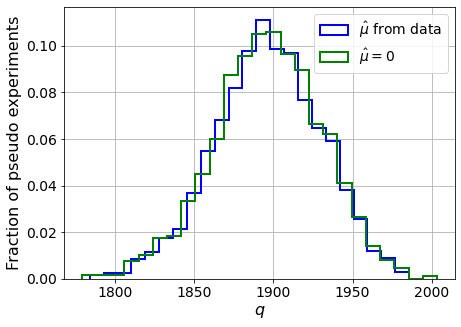

muhat mean:  -0.004805155786541978
Z_bins:  43.551208720597025
std Z_bins:  0.3859749293516117
Z_bins mu=0:  43.550292922502926
std Z_bins mu=0:  0.38894864210179725

--------

B_expected:  643
S_expected:  2113



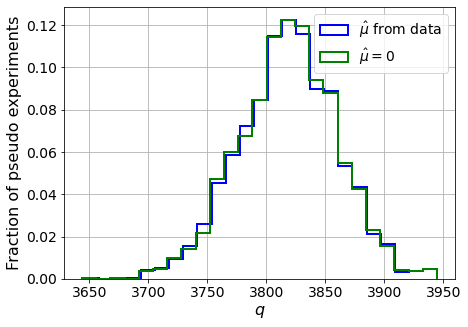

muhat mean:  -0.0024080640418417203
Z_bins:  61.803719928027284
std Z_bins:  0.3354579685969843
Z_bins mu=0:  61.803135256354864
std Z_bins mu=0:  0.33718025478321795

--------

B_expected:  643
S_expected:  4079



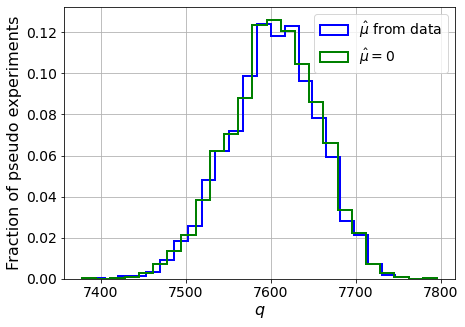

muhat mean:  -0.0011864062948029983
Z_bins:  87.20312595593174
std Z_bins:  0.3029173276174896
Z_bins mu=0:  87.20260702532858
std Z_bins mu=0:  0.3043385483868863

--------

B_expected:  643
S_expected:  7876



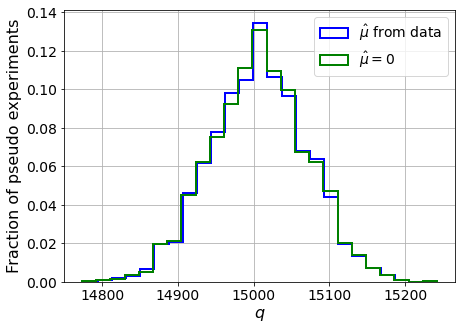

muhat mean:  -0.0005605126181659305
Z_bins:  122.50532293704141
std Z_bins:  0.2573655640546628
Z_bins mu=0:  122.50519664406654
std Z_bins mu=0:  0.25823606500435925

--------


 FINAL RESULT:

[[0.6390047834483654, 0.3156295622687244, -4.85528111246033, 0.6390047834483654, 0.43698250608250483], [1.0057455295391242, 0.3983425734266372, -2.6471646716106814, 1.0057455295391242, 0.5133855181632632], [1.2636282835031647, 0.47011941327919904, -1.8773914586985059, 1.2636282835031647, 0.595420794104652], [1.9616777437719837, 0.5493982098081603, -0.8137536074639659, 1.9616777437719837, 0.6450881727102827], [2.8751184137530768, 0.5995416775278318, -0.4444659391633819, 2.8751184137530768, 0.6668063572158904], [4.405465285430902, 0.6147487963482106, -0.2384941220879328, 4.405465285430902, 0.65864281681929], [6.723630012468452, 0.572533230016267, -0.1079903972549883, 6.723630012468452, 0.5967067325268562], [9.969265007602038, 0.5612563601482814, -0.06943059796270605, 9.96709413688848, 0.579483775

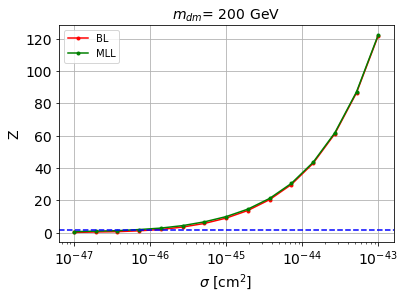


cross_BL_164:  1.024017141888832e-46
cross_BL_164_up:  6.299443573327745e-47
cross_BL_164_down:  1.5875532146462468e-46

cross_MLL_164:  5.708546788128554e-47
cross_MLL_164_up:  3.443267210471209e-47
cross_MLL_164_down:  8.560685616521162e-47

#########################


#########################

mDM =  500 GeV


S_cs1.shape:  (35477,)
S_cs2.shape:  (35477,)
 NUM_DAT:  32117 

NUM_DAT_ER:  31709
NUM_DAT_AC:  112
NUM_DAT_CNNS:  1
NUM_DAT_RN:  29
NUM_DAT_WALL:  266

B_cs1cs2.shape:  (32117, 2)

S_cs1cs2.shape:  (32117, 2)


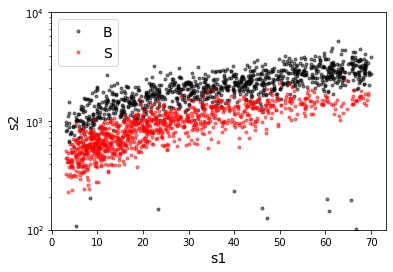

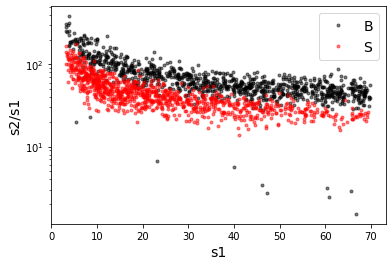

X_mon_B.shape:  (32117, 2)
X_mon_S.shape:  (32117, 2)
X_mon.shape:  (64234, 2)

X_mon_train :  (40948, 2)
y_mon_train :  (40948,)
X_mon_val :  (7227, 2)
y_mon_val :  (7227,)
X_mon_test :  (16059, 2)
y_mon_test :  (16059,)

Classification score:


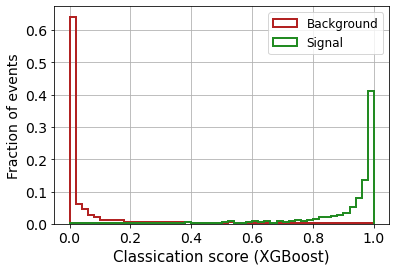


 ROC-AUC =  0.9794117353263748
At least 5 B events per bin, range = [[0, 1]]:
# bins:  15 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  15
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.234


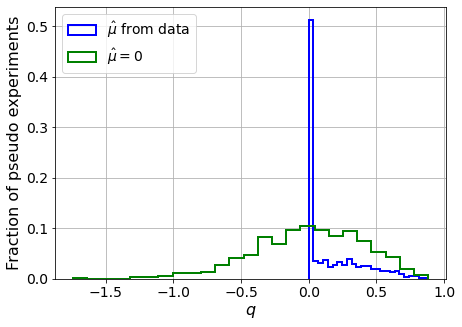

muhat mean:  0.49434497566058233
Z_bins:  0.16670450645849266
std Z_bins:  0.6434333418188363
Z_bins mu=0:  0.15689966065778743
std Z_bins mu=0:  1.291393583367057

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2615


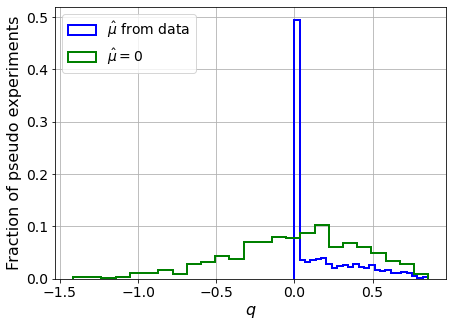

muhat mean:  0.4860076594502277
Z_bins:  0.19826713666964313
std Z_bins:  0.552067504389036
Z_bins mu=0:  0.19606901473711405
std Z_bins mu=0:  1.0664361055860865

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2595


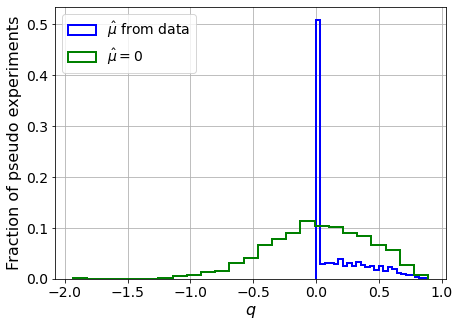

muhat mean:  0.3139002561724469
Z_bins:  0.1768221334997853
std Z_bins:  0.6285943653911127
Z_bins mu=0:  0.17195257004349637
std Z_bins mu=0:  1.1574064625901488

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.241


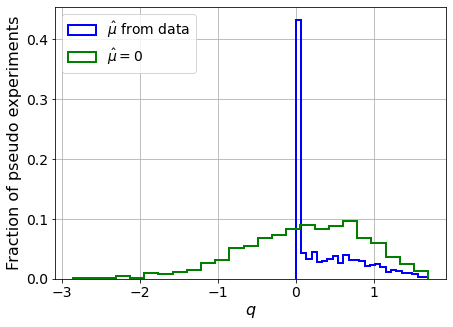

muhat mean:  0.21053213953510952
Z_bins:  0.42932525444802966
std Z_bins:  0.5135029458279147
Z_bins mu=0:  0.42902986839680174
std Z_bins mu=0:  0.9062021666104348

--------

B_expected:  643
S_expected:  5

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2465


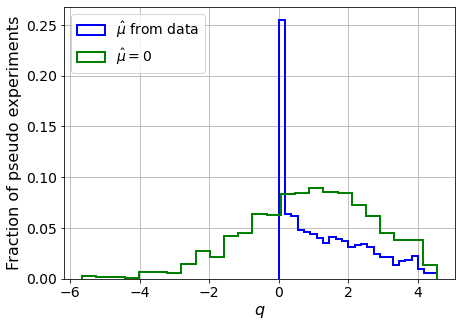

muhat mean:  0.07693018937914181
Z_bins:  1.0043091643699191
std Z_bins:  0.6159018897058669
Z_bins mu=0:  1.0033377834862012
std Z_bins mu=0:  0.9026157762691949

--------

B_expected:  643
S_expected:  9

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.224


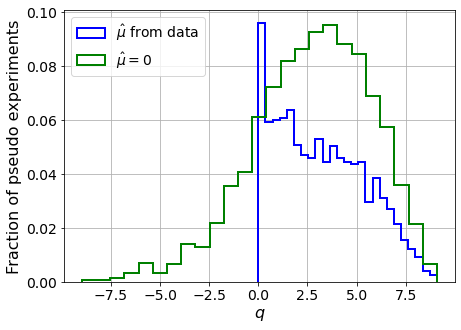

muhat mean:  0.047050167924402614
Z_bins:  1.7367178897367668
std Z_bins:  0.6444687481935331
Z_bins mu=0:  1.7364797148769098
std Z_bins mu=0:  0.8573023741801609

--------

B_expected:  643
S_expected:  17

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.255


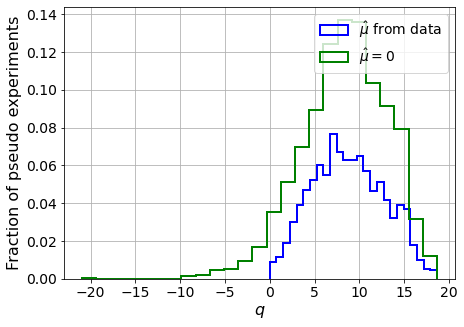

muhat mean:  0.02662659487078397
Z_bins:  2.9366221148521867
std Z_bins:  0.6781278658350395
Z_bins mu=0:  2.9347616504031846
std Z_bins mu=0:  0.8161563291614543

--------

B_expected:  643
S_expected:  33

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.236


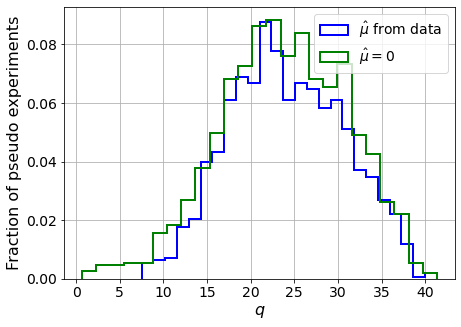

muhat mean:  0.01340021374138183
Z_bins:  4.868453049986264
std Z_bins:  0.6701176459797733
Z_bins mu=0:  4.866995464239907
std Z_bins mu=0:  0.7403889484033855

--------

B_expected:  643
S_expected:  64

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.239


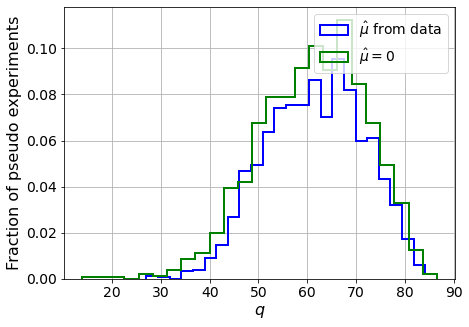

muhat mean:  0.006457756299270969
Z_bins:  7.8694946258073575
std Z_bins:  0.6339740772752244
Z_bins mu=0:  7.868759095111061
std Z_bins mu=0:  0.6834373011273528

--------

B_expected:  643
S_expected:  124

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.233


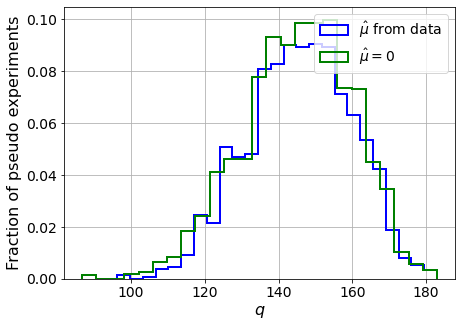

muhat mean:  0.004299187608680648
Z_bins:  12.09503281714444
std Z_bins:  0.5815491766185841
Z_bins mu=0:  12.093251726582816
std Z_bins mu=0:  0.6143754233673997

--------

B_expected:  643
S_expected:  239

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.248


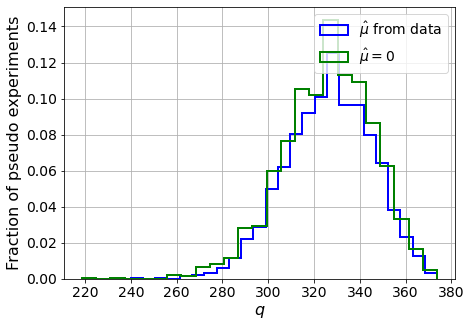

muhat mean:  0.0017139944173830805
Z_bins:  18.093776070209618
std Z_bins:  0.5207826568196776
Z_bins mu=0:  18.093165607789935
std Z_bins mu=0:  0.5445978570898015

--------

B_expected:  643
S_expected:  462

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.247


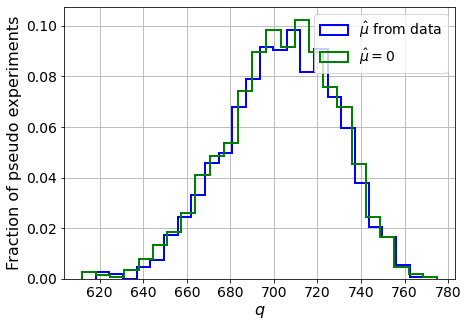

muhat mean:  0.0009749477889999385
Z_bins:  26.547750057343386
std Z_bins:  0.4719272886235286
Z_bins mu=0:  26.545723303837956
std Z_bins mu=0:  0.48643655566251476

--------

B_expected:  643
S_expected:  892

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2255


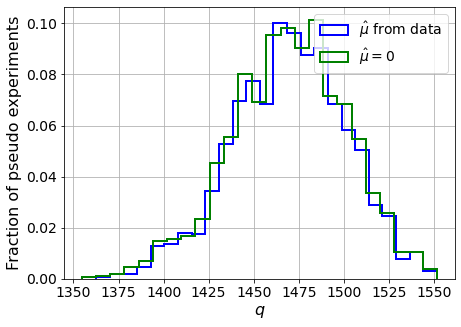

muhat mean:  0.0005762765984697399
Z_bins:  38.35047200088175
std Z_bins:  0.4106662043745797
Z_bins mu=0:  38.347613463916964
std Z_bins mu=0:  0.4197289344962738

--------

B_expected:  643
S_expected:  1723

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.232


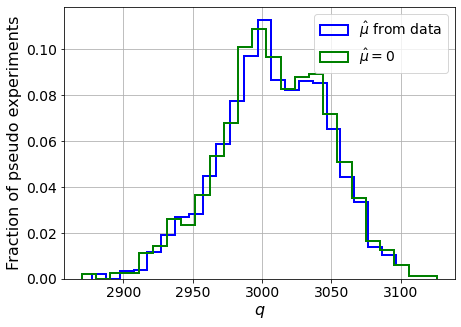

muhat mean:  0.0002081423619752803
Z_bins:  54.845923444004995
std Z_bins:  0.3551862350746954
Z_bins mu=0:  54.845874150104855
std Z_bins mu=0:  0.36033577808490763

--------

B_expected:  643
S_expected:  3326

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.24


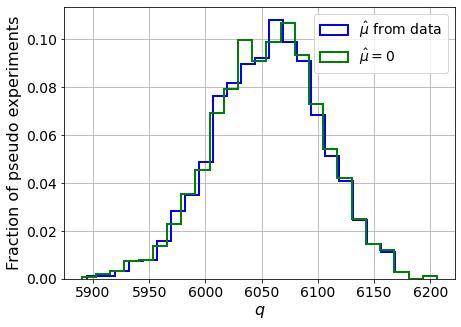

muhat mean:  9.670419571056714e-05
Z_bins:  77.83482871010311
std Z_bins:  0.30593049275553924
Z_bins mu=0:  77.8319168324329
std Z_bins mu=0:  0.3093773868508659

--------


 FINAL RESULT:

[[0.16670450645849266, 0.6434333418188363, 0.49434497566058233, 0.15689966065778743, 1.291393583367057], [0.19826713666964313, 0.552067504389036, 0.4860076594502277, 0.19606901473711405, 1.0664361055860865], [0.1768221334997853, 0.6285943653911127, 0.3139002561724469, 0.17195257004349637, 1.1574064625901488], [0.42932525444802966, 0.5135029458279147, 0.21053213953510952, 0.42902986839680174, 0.9062021666104348], [1.0043091643699191, 0.6159018897058669, 0.07693018937914181, 1.0033377834862012, 0.9026157762691949], [1.7367178897367668, 0.6444687481935331, 0.047050167924402614, 1.7364797148769098, 0.8573023741801609], [2.9366221148521867, 0.6781278658350395, 0.02662659487078397, 2.9347616504031846, 0.8161563291614543], [4.868453049986264, 0.6701176459797733, 0.01340021374138183, 4.866995464239907, 0.7

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 311.35276507 267.85899465 218.2588294
 159.99714205  96.8172046   34.66093881 -31.46752578 -97.74401519]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 256.74926208 235.31448326 208.21339544 172.41125891
 132.

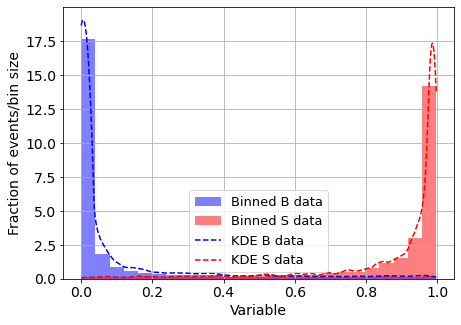

KDE Kernel:  epanechnikov
Background bandwidth:  0.03613222756796251
Signal bandwidth:  0.022117541055781564
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



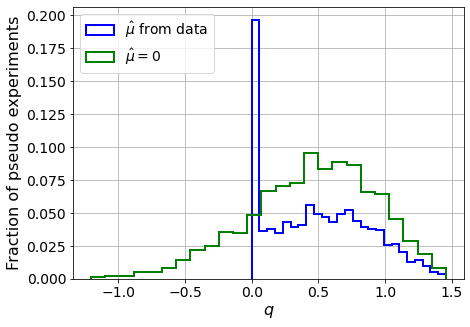

muhat mean:  -6.076986382415699
Z_bins:  0.6962288456398769
std Z_bins:  0.2740595837405
Z_bins mu=0:  0.6962288456398769
std Z_bins mu=0:  0.33977382450396176

--------

B_expected:  643
S_expected:  1



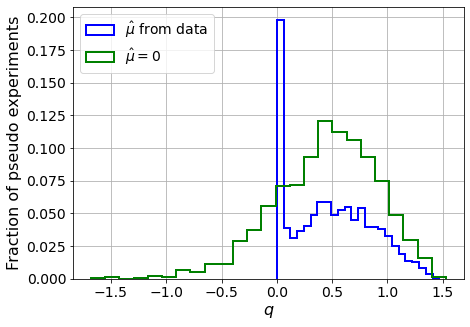

muhat mean:  -5.316784700905383
Z_bins:  0.6917497119445167
std Z_bins:  0.26846580758396504
Z_bins mu=0:  0.6917497119445167
std Z_bins mu=0:  0.33243988533909563

--------

B_expected:  643
S_expected:  1



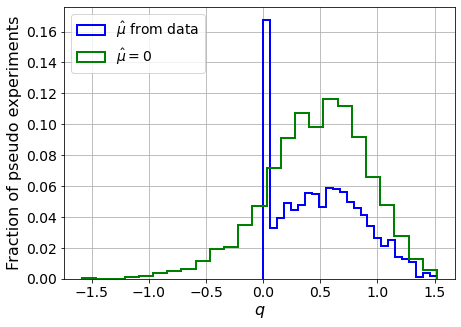

muhat mean:  -5.858820835191139
Z_bins:  0.710004685090972
std Z_bins:  0.2579783568996484
Z_bins mu=0:  0.710004685090972
std Z_bins mu=0:  0.3125492219545076

--------

B_expected:  643
S_expected:  2



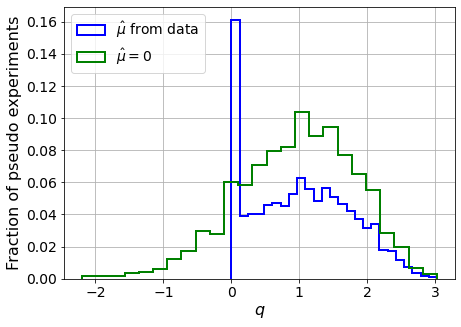

muhat mean:  -2.446809966992144
Z_bins:  1.0073606384125473
std Z_bins:  0.3608452813808747
Z_bins mu=0:  1.0073606384125473
std Z_bins mu=0:  0.4232411714247504

--------

B_expected:  643
S_expected:  5



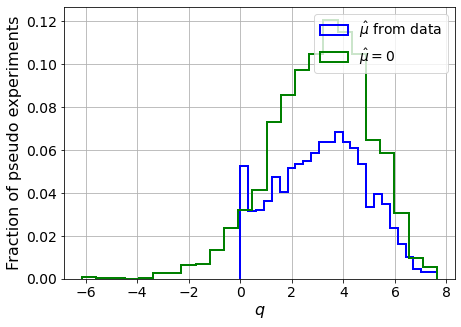

muhat mean:  -1.2219957717454824
Z_bins:  1.805119833513765
std Z_bins:  0.47161021426029237
Z_bins mu=0:  1.805119833513765
std Z_bins mu=0:  0.5265513428952162

--------

B_expected:  643
S_expected:  9



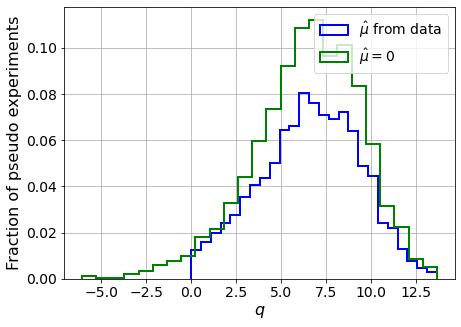

muhat mean:  -0.5727234763406165
Z_bins:  2.5937001137608537
std Z_bins:  0.5316226941525398
Z_bins mu=0:  2.5937001137608537
std Z_bins mu=0:  0.5748810513799955

--------

B_expected:  643
S_expected:  17



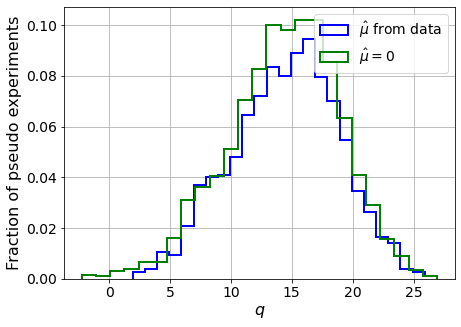

muhat mean:  -0.3098051241474503
Z_bins:  3.838718919802654
std Z_bins:  0.5688951060999421
Z_bins mu=0:  3.838718919802654
std Z_bins mu=0:  0.5943675753409889

--------

B_expected:  643
S_expected:  33



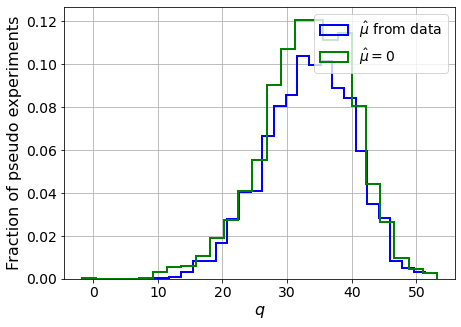

muhat mean:  -0.1657892751769682
Z_bins:  5.801037711465735
std Z_bins:  0.5884966929538049
Z_bins mu=0:  5.801037711465735
std Z_bins mu=0:  0.6116726216141228

--------

B_expected:  643
S_expected:  64



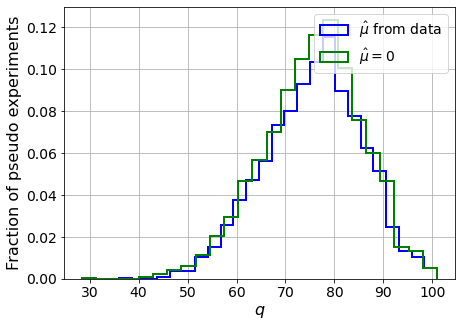

muhat mean:  -0.08434459960768724
Z_bins:  8.743340666548175
std Z_bins:  0.5669113922918969
Z_bins mu=0:  8.743340666548175
std Z_bins mu=0:  0.5792748857008232

--------

B_expected:  643
S_expected:  124



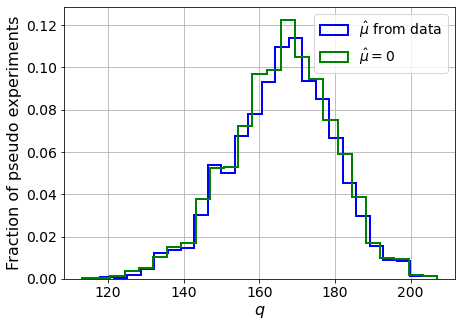

muhat mean:  -0.04406146818167056
Z_bins:  12.916248053060393
std Z_bins:  0.5267046267518284
Z_bins mu=0:  12.916248053060393
std Z_bins mu=0:  0.533794114017925

--------

B_expected:  643
S_expected:  239



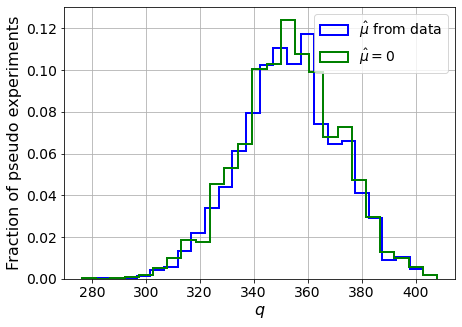

muhat mean:  -0.023773189354439738
Z_bins:  18.797362274891714
std Z_bins:  0.4905376928479422
Z_bins mu=0:  18.79676887958953
std Z_bins mu=0:  0.49503999853373876

--------

B_expected:  643
S_expected:  462



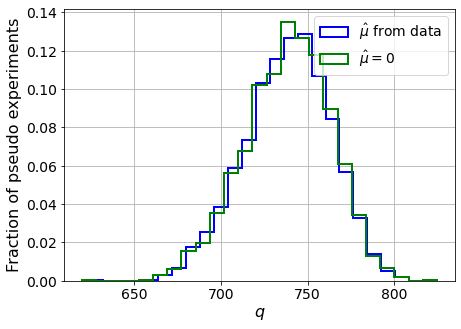

muhat mean:  -0.011013776015411647
Z_bins:  27.204890129911487
std Z_bins:  0.45576855754905377
Z_bins mu=0:  27.204297155170273
std Z_bins mu=0:  0.45897625777647805

--------

B_expected:  643
S_expected:  892



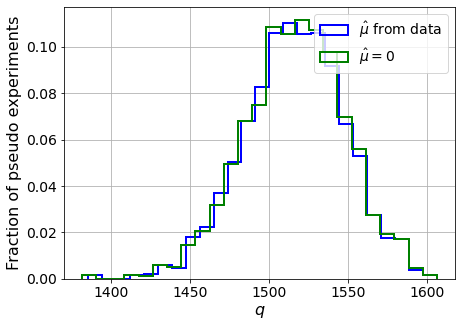

muhat mean:  -0.006077287930723184
Z_bins:  38.95120543849086
std Z_bins:  0.4073898653554365
Z_bins mu=0:  38.95120543849086
std Z_bins mu=0:  0.409652372579668

--------

B_expected:  643
S_expected:  1723



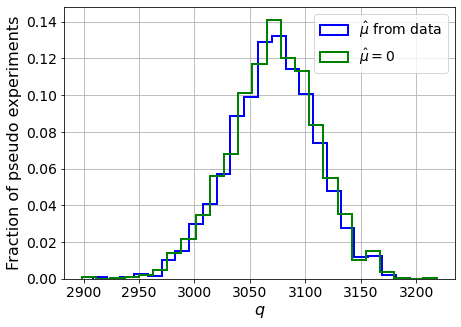

muhat mean:  -0.002915793142411948
Z_bins:  55.426682700782415
std Z_bins:  0.3568228452377028
Z_bins mu=0:  55.426682700782415
std Z_bins mu=0:  0.3581969604163964

--------

B_expected:  643
S_expected:  3326



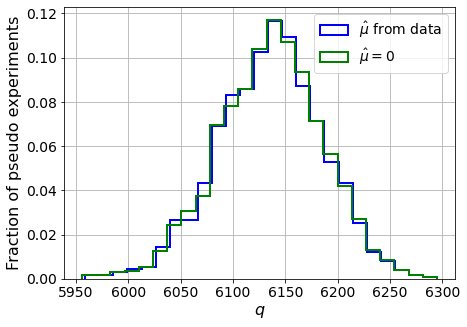

muhat mean:  -0.0016209848943306046
Z_bins:  78.33870328740241
std Z_bins:  0.3179035865940735
Z_bins mu=0:  78.33870328740241
std Z_bins mu=0:  0.31910164716422795

--------


 FINAL RESULT:

[[0.6962288456398769, 0.2740595837405, -6.076986382415699, 0.6962288456398769, 0.33977382450396176], [0.6917497119445167, 0.26846580758396504, -5.316784700905383, 0.6917497119445167, 0.33243988533909563], [0.710004685090972, 0.2579783568996484, -5.858820835191139, 0.710004685090972, 0.3125492219545076], [1.0073606384125473, 0.3608452813808747, -2.446809966992144, 1.0073606384125473, 0.4232411714247504], [1.805119833513765, 0.47161021426029237, -1.2219957717454824, 1.805119833513765, 0.5265513428952162], [2.5937001137608537, 0.5316226941525398, -0.5727234763406165, 2.5937001137608537, 0.5748810513799955], [3.838718919802654, 0.5688951060999421, -0.3098051241474503, 3.838718919802654, 0.5943675753409889], [5.801037711465735, 0.5884966929538049, -0.1657892751769682, 5.801037711465735, 0.611672621614

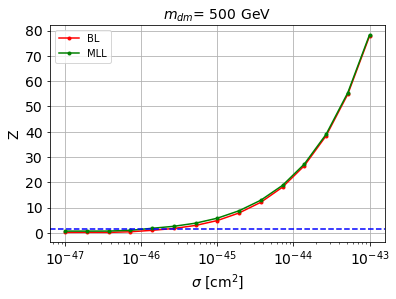


cross_BL_164:  2.5441430189217183e-46
cross_BL_164_up:  1.413471508212685e-46
cross_BL_164_down:  3.6539532307969875e-46

cross_MLL_164:  1.2106867453349016e-46
cross_MLL_164_up:  8.762280332907555e-47
cross_MLL_164_down:  1.832525588280597e-46

#########################



In [20]:
store_cross_BL_164 = []
store_cross_BL_164_up = []
store_cross_BL_164_down = []

store_cross_MLL_164 = []
store_cross_MLL_164_up = []
store_cross_MLL_164_down = []


for m_it2 in range(len(mDM_mDM)):

    # set the parameters
    mDM = mDM_mDM[m_it2]
    S_cross1045 = S_cross1045_mDM[m_it2]
    S_expected = S_expected_mDM[m_it2]

    print('\n#########################\n')
    print('mDM = ', mDM, 'GeV\n')


    ##########
    # SIGNAL #
    ##########

    S_cs1 = np.loadtxt(filefolder + 'WIMP_' + str(mDM) + 'GeV_cs1.txt')
    S_cs2 = np.loadtxt(filefolder + 'WIMP_' + str(mDM) + 'GeV_cs2.txt')

    print('\nS_cs1.shape: ', S_cs1.shape)
    print('S_cs2.shape: ', S_cs2.shape)

    S_cs1_aux = [S_cs1[x] for x in range(len(S_cs1)) if (3 < S_cs1[x] < 70 and 50 < S_cs2[x] < 8000)]
    S_cs2 = [S_cs2[x] for x in range(len(S_cs1)) if (3 < S_cs1[x] < 70 and 50 < S_cs2[x] < 8000)]
    S_cs1 = S_cs1_aux


    # set events per classs
    NUM_DAT = min(len(B_cs1_ER), len(S_cs1))
    print(' NUM_DAT: ', NUM_DAT, '\n')

    NUM_DAT_AC = int(NUM_DAT*f_AC)
    NUM_DAT_CNNS = max(1, int(NUM_DAT*f_CNNS))
    NUM_DAT_RN = int(NUM_DAT*f_RN)
    NUM_DAT_WALL = int(NUM_DAT*f_WALL)

    NUM_DAT_ER = NUM_DAT - ( NUM_DAT_AC + NUM_DAT_CNNS + NUM_DAT_RN + NUM_DAT_WALL )

    print('NUM_DAT_ER: ', NUM_DAT_ER)
    print('NUM_DAT_AC: ', NUM_DAT_AC)
    print('NUM_DAT_CNNS: ', NUM_DAT_CNNS)
    print('NUM_DAT_RN: ', NUM_DAT_RN)
    print('NUM_DAT_WALL: ', NUM_DAT_WALL)



    # CONCATENATE THE BACKGROUNDS
    B_cs1cs2 = np.concatenate([np.stack([B_cs1_ER,B_cs2_ER],axis=1)[:NUM_DAT_ER], np.stack([B_cs1_AC,B_cs2_AC],axis=1)[:NUM_DAT_AC], np.stack([B_cs1_CNNS,B_cs2_CNNS],axis=1)[:NUM_DAT_CNNS], np.stack([B_cs1_RN,B_cs2_RN],axis=1)[:NUM_DAT_RN], np.stack([B_cs1_WALL,B_cs2_WALL],axis=1)[:NUM_DAT_WALL]])

    print('\nB_cs1cs2.shape: ', B_cs1cs2.shape)


    S_cs1cs2 = np.stack([S_cs1,S_cs2],axis=1)[:NUM_DAT]


    print('\nS_cs1cs2.shape: ', S_cs1cs2.shape)


    rnd = 100

    B_cs1cs2_plot = shuffle(B_cs1cs2, random_state=rnd)
    S_cs1cs2_plot = shuffle(S_cs1cs2, random_state=rnd)

    plt.plot(B_cs1cs2_plot[:,0][:1000], B_cs1cs2_plot[:,1][:1000], '.', color='black', alpha=0.5, label='B')
    plt.plot(S_cs1cs2_plot[:,0][:1000], S_cs1cs2_plot[:,1][:1000], '.', color='red', alpha=0.5, label='S')
    plt.yscale('log')
    # plt.xlim([0,100])
    plt.ylim([100,10000])
    plt.xlabel('s1',fontsize=14)
    plt.ylabel('s2',fontsize=14)
    plt.legend(fontsize=14)
    plt.show()



    plt.plot(B_cs1cs2_plot[:,0][:1000], (B_cs1cs2_plot[:,1] / B_cs1cs2_plot[:,0])[:1000], '.', color='black', alpha=0.5, label='B')
    plt.plot(S_cs1cs2_plot[:,0][:1000], (S_cs1cs2_plot[:,1] / S_cs1cs2_plot[:,0])[:1000], '.', color='red', alpha=0.5, label='S')
    plt.yscale('log')
    # plt.xlim([0,100])
    # plt.ylim([100,10000])
    plt.xlabel('s1',fontsize=14)
    plt.ylabel('s2/s1',fontsize=14)
    plt.legend(fontsize=14)
    plt.show()


    ############
    # DATASETS #
    ############

    # concatenate the data
    X_mon_B = B_cs1cs2
    X_mon_S = S_cs1cs2

    # X_mon_B = np.reshape(B_pdiffT,(len(B_pdiffT),1))
    # X_mon_S = np.reshape(S_pdiffT,(len(S_pdiffT),1))
    print('X_mon_B.shape: ', X_mon_B.shape)
    print('X_mon_S.shape: ', X_mon_S.shape)

    # del B_ppeakS1
    # del B_ppeakS2
    # del B_pbot
    # del B_ptop

    # del S_ppeakS1
    # del S_ppeakS2
    # del S_pbot
    # del S_ptop

    X_mon = np.concatenate([X_mon_B, X_mon_S])

    # X_mon = np.concatenate([np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(S_pbot,(len(S_pbot),1))])

    print('X_mon.shape: ', X_mon.shape)
    # del X_mon_B
    # del X_mon_S


    # labels
    y_mon = np.concatenate([np.zeros(NUM_DAT),np.ones(NUM_DAT)])


    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                    y_mon,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon,
                                                                    shuffle=True)

    del X_mon
    del y_mon

    X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                      y_mon_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon_aux,
                                                                      shuffle=True)

    del X_mon_aux
    del y_mon_aux

    print('')
    print('X_mon_train : ', X_mon_train.shape)
    print('y_mon_train : ', y_mon_train.shape)
    print('X_mon_val : ', X_mon_val.shape)
    print('y_mon_val : ', y_mon_val.shape)
    print('X_mon_test : ', X_mon_test.shape)
    print('y_mon_test : ', y_mon_test.shape)
    print('')



    # PREDICTIONS
    y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


    # ROC
    fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
    roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)



    # XGBoost with the kinematic variables of the leptons

    ########################
    # CLASSIFICATION SCORE #
    ########################

    # Outputs for validation data set

    pred_XG_SM = []
    pred_XG_NP = []

    for i in range(len(y_mon_test)):
        if y_mon_test[i] == 0:
            pred_XG_SM.append(y_pred_xg[i])
        else:
            pred_XG_NP.append(y_pred_xg[i])


    print('Classification score:')

    weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
    nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

    weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
    nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.xlabel("Classication score (XGBoost)",fontsize=15)
    plt.ylabel("Fraction of events",fontsize=14)
    plt.grid()
    plt.legend(fontsize=12)

    plt.show()




    print('\n ROC-AUC = ', roc_auc_xg)



    #######################
    # BIN LIKELIHOOD TEST #
    #######################

    MIN_EVS = 5 # min number of background events that we allow per bin
    range_dat = [[0,1]] # range of our data (between 0 and 1 if its the ML output)

    bins_to_test=range(1,500) # number of bins we are testing to see if condition holds

    # FIND THE NUMBER OF BINS:
    num_binsX = max_num_bins(pred_XG_SM, B_expected, range_dat, MIN_EVS, bins_to_test)

    print('\n FOR BIN LIKELIHOOD WE ARE SETTING:')
    print('min number of Background events allowed per bin: ', MIN_EVS)
    print('max number of bins allowed: ', num_binsX)
    print('range of our data: ', range_dat)




    num_bins = min(10, num_binsX)
    print('number of bins we are going to use: ', num_bins)


    # OPTION 2 (mu_hat with more precision) (slower, not so bad for bin likelihood)
    store_Z_BL = []


    for s_it in range(len(S_expected)):

        print('B_expected: ', B_expected)
        print('S_expected: ', S_expected[s_it])
        print('')

        Z_BL = BL_test_fsolve(D_or_E, pred_XG_SM, pred_XG_NP, B_expected, S_expected[s_it], num_pseudo, num_bins, range_dat, MIN_EVS, linear_bins=True) 

        store_Z_BL.append( list(Z_BL) )

        print('muhat mean: ', Z_BL[2])
        print('Z_bins: ', Z_BL[0])
        print('std Z_bins: ', Z_BL[1])
        print('Z_bins mu=0: ', Z_BL[3])
        print('std Z_bins mu=0: ', Z_BL[4])
        print('')
        print('--------\n')



    print('\n FINAL RESULT:\n')
    print(store_Z_BL)




    #######
    # MLL #
    #######

    # USE KDE TO ESTIMATE THE CLASSIFIER OUTPUT PDFs

    # outputs:
    # 1st -> background PDF
    # 2nd -> signal PDF
    # 3rd -> (normalization factor of the background PDF)**-1
    # 4th -> (normalization factor of the signal PDF)**-1
    # 5th -> background bandwidth
    # 6th -> signal bandwidth
    kde_bkg, kde_sig, norm_factor_SM, norm_factor_NP, B_bandwidth, S_bandwidth = KDE_fitter(pred_XG_SM, pred_XG_NP, 
                                                                                            1000, 
                                                                                            np.logspace(-4.0, 0.05, 20), 
                                                                                            set_kernel='epanechnikov')




    # FOR EXCLUSION:
    # we need to evaluate the KDE densities with the classifier output of BACKGROUND EVENTS

    print('This may take a while...')

    pB_B_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_SM, np.zeros(len(pred_XG_SM)) ]) )
    print('1 done')
    pS_B_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_SM, np.ones(len(pred_XG_SM)) ]) )
    print('2 done')

    # Normalize
    pB_B_data = pB_B_data / norm_factor_SM
    pS_B_data = pS_B_data / norm_factor_NP


    if D_or_E == "discovery":

        # FOR DISCOVERY:
        # we need to evaluate the KDE densities with the classifier output of BACKGROUND and SIGNAL EVENTS

        pB_S_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_NP, np.zeros(len(pred_XG_NP)) ]) )
        print('3 done')
        pS_S_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_NP, np.ones(len(pred_XG_NP)) ]) )
        print('4 done')

        # Normalize
        pB_S_data = pB_S_data / norm_factor_SM
        pS_S_data = pS_S_data / norm_factor_NP

    else:
        # dummies
        pB_S_data = 1
        pS_S_data = 1





    # OPTION 2 (mu_hat with more precision) (slower)
    store_Z_MLL = []


    for s_it in range(len(S_expected)):

        print('B_expected: ', B_expected)
        print('S_expected: ', S_expected[s_it])
        print('')

        Z_MLL = MLL_test_fsolve(D_or_E, pB_B_data, pS_B_data, pB_S_data, pS_S_data, B_expected, S_expected[s_it], num_pseudo)

        store_Z_MLL.append( list(Z_MLL) )

        print('muhat mean: ', Z_MLL[2])
        print('Z_bins: ', Z_MLL[0])
        print('std Z_bins: ', Z_MLL[1])
        print('Z_bins mu=0: ', Z_MLL[3])
        print('std Z_bins mu=0: ', Z_MLL[4])
        print('')
        print('--------\n')


    print('\n FINAL RESULT:\n')
    print(store_Z_MLL)


    store_Z_MLL = np.array(store_Z_MLL)

    for hd in range(len(store_Z_MLL[:,0])):
        if store_Z_MLL[:,0][hd] == 0:
            store_Z_MLL[:,0][hd] = store_Z_MLL[:,3][hd]
            store_Z_MLL[:,1][hd] = store_Z_MLL[:,4][hd]




    # plot
    plt.plot(cross_factor*1e-45, np.array(store_Z_BL)[:,0], '.-', c='red', label='BL')
    plt.plot(cross_factor*1e-45, np.array(store_Z_MLL)[:,0], '.-', c='green', label = "MLL")

    plt.axhline(y=1.64, c='blue', linestyle='--')
    plt.title('$m_{dm}$= %0.2d GeV' % mDM, fontsize=14)
    plt.xscale('log')
    plt.xlabel(r'$\sigma$ [cm$^2$]', fontsize=14)
    plt.ylabel(r'Z', fontsize=14)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()


    # interpolate
    f_Z = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0], kind='linear')
    f_Z_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0] + np.array(store_Z_BL)[:,1], kind='linear')
    f_Z_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0] - np.array(store_Z_BL)[:,1], kind='linear')

    # compute the cross section with Z=1.64
    cross_BL_164 = 10**solvecross(f_Z, 1.64)
    cross_BL_164_up = 10**solvecross(f_Z_up, 1.64)
    cross_BL_164_down = 10**solvecross(f_Z_down, 1.64)

    store_cross_BL_164.append(cross_BL_164)
    store_cross_BL_164_up.append(cross_BL_164_up)
    store_cross_BL_164_down.append(cross_BL_164_down)


    # interpolate
    f_Z_MLL = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0], kind='linear')
    f_Z_MLL_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] + np.array(store_Z_MLL)[:,1], kind='linear')
    f_Z_MLL_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] - np.array(store_Z_MLL)[:,1], kind='linear')

    # compute the cross section with Z=1.64
    cross_MLL_164 = 10**solvecross(f_Z_MLL, 1.64)
    cross_MLL_164_up = 10**solvecross(f_Z_MLL_up, 1.64)
    cross_MLL_164_down = 10**solvecross(f_Z_MLL_down, 1.64)

    store_cross_MLL_164.append(cross_MLL_164)
    store_cross_MLL_164_up.append(cross_MLL_164_up)
    store_cross_MLL_164_down.append(cross_MLL_164_down)


    print('\ncross_BL_164: ', cross_BL_164)
    print('cross_BL_164_up: ', cross_BL_164_up)
    print('cross_BL_164_down: ', cross_BL_164_down)

    print('\ncross_MLL_164: ', cross_MLL_164)
    print('cross_MLL_164_up: ', cross_MLL_164_up)
    print('cross_MLL_164_down: ', cross_MLL_164_down)
    print('\n#########################\n')


In [21]:
cross_cs1cs2 = store_cross_BL_164
cross_cs1cs2_up = store_cross_BL_164_up
cross_cs1cs2_down = store_cross_BL_164_down

print(cross_cs1cs2)
print(cross_cs1cs2_up)
print(cross_cs1cs2_down)


cross_cs1cs2_MLL = store_cross_MLL_164
cross_cs1cs2_MLL_up = store_cross_MLL_164_up
cross_cs1cs2_MLL_down = store_cross_MLL_164_down

print(cross_cs1cs2_MLL)
print(cross_cs1cs2_MLL_up)
print(cross_cs1cs2_MLL_down)

[1.3019903815405825e-45, 8.294046411837459e-47, 4.126459090214003e-47, 4.3212310521393664e-47, 5.781622722394619e-47, 1.024017141888832e-46, 2.5441430189217183e-46]
[8.52821450008676e-46, 5.02729049791531e-47, 2.5493584782147247e-47, 2.357199283430055e-47, 3.69945320378003e-47, 6.299443573327745e-47, 1.413471508212685e-46]
[1.932170368411707e-45, 1.232186778738092e-46, 6.53083226994854e-47, 6.795961368533197e-47, 8.634476515828676e-47, 1.5875532146462468e-46, 3.6539532307969875e-46]
[8.303515863905588e-46, 5.022775133143472e-47, 2.605747869556403e-47, 2.1887897171651982e-47, 3.4490339025701315e-47, 5.708546788128554e-47, 1.2106867453349016e-46]
[5.93252075759493e-46, 3.5895782819063715e-47, 1.8427386775663761e-47, 1.4216485625760621e-47, 1.7400948763512366e-47, 3.443267210471209e-47, 8.762280332907555e-47]
[1.2563695883064707e-45, 7.617017764945001e-47, 3.518245986452911e-47, 3.6994561602495133e-47, 4.864976926336549e-47, 8.560685616521162e-47, 1.832525588280597e-46]


In [22]:
np.savetxt('results/general/cs1cs2_mDM' + str(m_it) + '.txt', [cross_cs1cs2, cross_cs1cs2_up, cross_cs1cs2_down])
np.savetxt('results/general/cs1cs2_mDM' + str(m_it) + '_MLL.txt', [cross_cs1cs2_MLL, cross_cs1cs2_MLL_up, cross_cs1cs2_MLL_down])

In [23]:
cross_cs1cs2_general_m3 = np.loadtxt('results/general/cs1cs2_mDM' + str(m_it) + '.txt')[0]
cross_cs1cs2_general_m3_up = np.loadtxt('results/general/cs1cs2_mDM' + str(m_it) + '.txt')[1]
cross_cs1cs2_general_m3_down =np.loadtxt('results/general/cs1cs2_mDM' + str(m_it) + '.txt')[2]

cross_cs1cs2_general_m3_MLL = np.loadtxt('results/general/cs1cs2_mDM' + str(m_it) + '_MLL.txt')[0]
cross_cs1cs2_general_m3_MLL_up = np.loadtxt('results/general/cs1cs2_mDM' + str(m_it) + '_MLL.txt')[1]
cross_cs1cs2_general_m3_MLL_down = np.loadtxt('results/general/cs1cs2_mDM' + str(m_it) + '_MLL.txt')[2]

## For m_it = 4, 5, 6 continue to part2